<a href="https://colab.research.google.com/github/david-meltzer/quadratic_model/blob/main/catapult_v6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install --upgrade torchvision>=11.7.0

In [ ]:
test1=MLP_General(bias_value=True)
test2=MLP_General(bias_value=False)

In [ ]:
test1.fc1[0].bias is not None

True

# Definitions

## Modules and Default Parameters

In [ ]:
!pip install functorch
!pip install num2words

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.2/125.2 KB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13723 sha256=ae61c91a9f2cec7b59979a0408b80de9142259b7afb54d1e87e8d0d4d60cde57
  Stored in directory: /root/.cache/pip/wheels/56/ea/58/ead137b087d9e326852a851351d1debf4ada529b6ac0ec4e8c
Successfully built docopt


In [ ]:
import pickle

import math
import sys
sys.path.append('/content/drive/My Drive/catapult')

from num2words import num2words
import matplotlib.pyplot as plt
#from google.colab import files

import os
import torch
import functorch
from torch.utils.data import Dataset, Subset, DataLoader
from torch import nn
from torchvision import datasets, transforms
from torchvision.transforms import ToTensor, Lambda
import numpy as np

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

import torch.nn.functional as F
torch.set_printoptions(precision=6)

from functorch import make_functional, vmap, vjp, jvp, jacrev

%matplotlib inline
plt.rcParams['figure.figsize'] = (15.0, 15.0) # Set default size of plots.
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'
plt.rcParams.update({'font.size': 14})

#torch.manual_seed(123) #fix seed
#np.random.seed(123)
foldername = '/content/drive/My Drive/catapult/'

default_matrix_dist={'dist':'normal','params':(0,1)}
default_eval_dist={'dist':'uniform','params':(1,1)}

Using cpu device


In [ ]:
def file_writer(folder,extension,custom=None,**kwargs):
    filename = folder
    if custom:
        filename +=custom+'_'
    for key, value in kwargs.items():
        if str(key)=='lr_ratio':
            filename += str(key)+'_'+str(num2words(value))+'_'
        elif str(key)=='stop_criterion':
            val=str(num2words.num2words(round(math.log10(value),3)))
            filename += str(key)+'_1E'+val+'_'
        else:
            filename += str(key)+'_'+str(value)+'_'  
    filename=filename[:-1]
    filename += extension
    return filename

## Architectures

In [ ]:
archs={}

def num_parameters(model,trainable=True):
    if trainable:
        return sum(p.numel() for p in model.parameters() if p.requires_grad)
    else:
        return sum(p.numel() for p in model.parameters())

In [ ]:
def act_function(x,name='identity',slope=.01):
    if name == 'identity':
        return x
    elif name == 'tanh':
        return torch.tanh(x)
    elif name == 'swish':
        return F.silu(x)
    elif name == 'gelu':
        return F.gelu(x)
    elif name == 'relu':
        return F.relu(x)
    elif name == 'leaky_relu':
        return F.leaky_relu(x,slope)
    else:
        print('Not a valid activation function')
        return

class identity(nn.Module):
    def __init__(self):
        super().__init__()
    def forward(self,x):
        return x

def act_layer(name='identity',slope=.01):
    if name == 'identity':
        return identity()
    elif name == 'tanh':
        return nn.Tanh()
    elif name == 'swish':
        return nn.SiLU()
    elif name == 'gelu':
        return nn.GELU()
    elif name == 'relu':
        return nn.ReLU()
    elif name == 'leaky_relu':
        return nn.LeakyReLU(slope)
    else:
        print('Not a valid activation function')
        return

### (Meta-)feature Functions

In [ ]:
def generate_orth_matrix(input_dim,hidden_dim,matrix_dist,eval_dist):
        
    evecs=[torch.empty((hidden_dim,hidden_dim)) for _ in range(input_dim)]
        
    if matrix_dist['dist']=='uniform':
        for ev in evecs: 
            ev.uniform_(*matrix_dist['params'])

    if matrix_dist['dist']=='normal':
        for ev in evecs:
            ev.normal_(*matrix_dist['params'])

    evecs=[(2**(-.5))*(b-torch.transpose(b,0,1)) for b in evecs]
    evecs=[torch.matrix_exp(ev).unsqueeze(0) for ev in evecs]
    evecs= torch.cat(evecs,dim=0)

    return evecs


def generate_matrix(input_dim,hidden_dim,matrix_dist,eval_dist):

    evecs=generate_orth_matrix(input_dim,hidden_dim,matrix_dist,eval_dist)

    if hidden_dim%2!=0:
        raise Exception("The hidden dimension needs to be an even number.")

    if eval_dist['dist']=='uniform':
        evals_pos=torch.empty((input_dim,hidden_dim//2)).uniform_(*eval_dist['params'])
    elif eval_dist['dist']=='normal':
        evals_pos=torch.empty((input_dim,hidden_dim//2)).normal_(*eval_dist['params'])
    else:
        raise Exception("Distribution for eigenvalues should be 'uniform' or 'normal'.")

    evals_neg=-1*evals_pos
    evals_full=torch.cat((evals_pos,evals_neg),dim=1)
    meta_matrix=torch.einsum('ia,iam,ian->imn',evals_full,evecs,evecs)

    return meta_matrix

class linear_feature(nn.Module):

    def __init__(self,
                 input_dim,
                 hidden_dim,
                 negative_slope=1,
                 pool_dict=None,
                 masked_features=0):
        super().__init__()
        self.input_dim=input_dim
        self.hidden_dim=hidden_dim
        self.negative_slope=negative_slope
        self.flatten = nn.Flatten()

        self.matrix=torch.randn((input_dim,hidden_dim)).to(device)

        self.pool_dict=pool_dict

        if pool_dict is not None:
            self.kernel_size=self.pool_dict['kernel_size']
            self.stride=self.pool_dict['stride']
            self.pool=nn.MaxPool2d(self.kernel_size,self.stride)

        self.student_hidden_dim = self.hidden_dim-masked_features

        self.proj=torch.zeros(self.hidden_dim,self.student_hidden_dim)
        
        indices = np.random.choice(np.arange(self.hidden_dim),
                                   self.student_hidden_dim,
                                   replace=False)
        indices.sort()
        self.proj[indices,np.arange(self.student_hidden_dim)]=1
        self.proj=self.proj.to(device)

    def forward(self,input,teacher=False):
        if self.pool_dict is not None:
            input=self.pool(input)

        out = self.flatten(input)
        out = torch.einsum('bi,im->bm',out,self.matrix)
        out *= (self.input_dim)**(-.5)
        out *= (self.hidden_dim)**(-.5)

        if teacher==False:
            out = torch.einsum('bM,Mn->bn',out,self.proj)
        
        return F.leaky_relu(out,self.negative_slope)

class meta_feature_rank_one(nn.Module):
    def __init__(self,
                 input_dim,
                 hidden_dim,
                 negative_slope=1,
                 pool_dict=None,
                 masked_features=0):
        super().__init__()
        self.negative_slope=negative_slope

        self.hidden_dim=hidden_dim
        
        self.lin_feature = linear_feature(input_dim,
                                    hidden_dim,
                                    negative_slope=1,
                                    pool_dict=pool_dict,
                                    masked_features=masked_features)
        
    def forward(self,input,teacher=False):

        out = self.lin_feature(input,teacher)
        out = torch.einsum('bn,bm->bnm',out,out)
        return (self.hidden_dim**(-.5))*F.leaky_relu(out,self.negative_slope)

class meta_feature_linear(nn.Module):
    def __init__(self,
                 input_dim=1,
                 hidden_dim=100,
                 matrix_dist=default_matrix_dist,
                 eval_dist=default_eval_dist,
                 pool_dict=None,
                 masks=0,
                 slope=1,
                 act='identity'):
        
        super().__init__()
        self.masked_features=masks
        self.flatten = nn.Flatten()

        self.meta_matrix=generate_matrix(input_dim,
                                         hidden_dim,
                                         matrix_dist,
                                         eval_dist)
                
        self.meta_matrix=self.meta_matrix.to(device)

        self.hidden_dim=hidden_dim
        self.input_dim=input_dim

        self.pool_dict=pool_dict

        if pool_dict is not None:
            self.kernel_size=self.pool_dict['kernel_size']
            self.stride=self.pool_dict['stride']
            self.pool=nn.MaxPool2d(self.kernel_size,self.stride)

        #self.proj=torch.eye(self.hidden_dim)

        self.student_hidden_dim = self.hidden_dim-masks

        self.proj = torch.zeros(self.hidden_dim,self.student_hidden_dim)

        indices = np.random.choice(np.arange(self.hidden_dim),self.student_hidden_dim,replace=False)
        #indices.sort()
        self.proj[indices,np.arange(self.student_hidden_dim)]=1
        self.proj=self.proj.to(device)
        self.negative_slope=slope
        self.activation_name = act

    def get_meta_params(self):
        return self.meta_matrix#, self.neg_slope
    
    def forward(self,input,teacher=False):
        if self.pool_dict is not None:
            input=self.pool(input)
        #print(input.shape)
        out = self.flatten(input)
        out = torch.einsum('bi,imn->bmn',out,self.meta_matrix)
        out *= (self.input_dim)**(-.5)
        out = act_function(out,self.activation_name,self.negative_slope)

        #out = F.gelu(out)
        #out = F.leaky_relu(out,self.negative_slope)
        #out = out
        #out=torch.tanh(out)
        #out=F.silu(out)


        if teacher==False:
            out = torch.einsum('Nr,bNP,Pq->brq',self.proj,out,self.proj)

        return out

class meta_feature_exp(nn.Module):
    
    def __init__(self,input_dim=1,
                 hidden_dim=100,
                 matrix_dist=default_matrix_dist,
                 eval_dist=default_eval_dist,
                 pool_dict=None,
                 masks=0,
                 slope=1):
        super().__init__()

        self.hidden_dim=hidden_dim
        self.negative_slope=slope
        
        self.flatten = nn.Flatten()
        self.matrix_dist=matrix_dist
        self.masked_features=masks
        
        self.B=torch.empty((input_dim,hidden_dim,hidden_dim))
        
        if matrix_dist['dist']=='uniform':
            self.B.uniform_(*matrix_dist['params'])
        if matrix_dist['dist']=='normal':
            self.B.normal_(*matrix_dist['params'])

        self.eval_dist=eval_dist
        
        if eval_dist['dist']=='uniform':
            evals_pos=torch.empty(hidden_dim//2).uniform_(*eval_dist['params'])
        elif eval_dist['dist']=='normal':
            evals_pos=torch.empty(hidden_dim//2).normal_(*eval_dist['params'])
    
        evals_neg=-1*evals_pos
        self.evals=torch.cat((evals_pos,evals_neg),dim=0)

        self.B=2**(-.5)*(self.B-torch.transpose(self.B,1,2))
        self.B=self.B.to(device)
        self.evals=self.evals.to(device)

        self.pool_dict=pool_dict

        if pool_dict is not None:
            self.kernel_size=self.pool_dict['kernel_size']
            self.stride=self.pool_dict['stride']
            self.pool=nn.MaxPool2d(self.kernel_size,self.stride)

        self.student_hidden_dim = self.hidden_dim-masks

        self.proj = torch.zeros(self.hidden_dim,self.student_hidden_dim)
        
        indices = np.random.choice(np.arange(self.hidden_dim),self.student_hidden_dim,replace=False)
        indices.sort()
        
        self.proj[indices,np.arange(self.student_hidden_dim)]=1
        self.proj=self.proj.to(device)

    def get_B(self):
        return self.B

    def forward(self,input,teacher=False):
        if self.pool_dict is not None:
            input=self.pool(input)
        input = self.flatten(input)
        orth = torch.einsum('bi,imn->bmn',input,self.B)
        orth = torch.matrix_exp(orth)
        
        out = torch.einsum('a,bam,ban->bmn',self.evals,orth,orth)
        out = F.leaky_relu(out,self.negative_slope)

        if teacher == False:
            out=torch.einsum('Nr,bNP,Pq->brq',self.proj,out,self.proj)
        return out

### Quadratic Model

In [ ]:
def Omega_Matrix(meta_feature_func,X):

    meta_feature_matrix=meta_feature_func(X)
    num_samples=meta_feature_matrix.shape[0]
    hidden_dim=meta_feature_matrix.shape[1]

    zeta=(hidden_dim/2)**(-.5)

    result = torch.einsum('bmn,cnp->bmcp',meta_feature_matrix,meta_feature_matrix)
    result *= zeta**2*1/num_samples

    return result

class quadratic(nn.Module):
    def __init__(self,**meta_dict):
        super().__init__()

        self.meta_dict={}
        for key in meta_dict:
            self.meta_dict[key]=meta_dict[key]

        self.meta_args={k:meta_dict[k] for k in meta_dict if k !='meta_type'}
        
        if meta_dict['meta_type']=='exp':
            self.meta_feature=meta_feature_exp(**self.meta_args)  
        elif meta_dict['meta_type'] == 'linear':
            self.meta_feature=meta_feature_linear(**self.meta_args)
        elif meta_dict['meta_type'] == 'rank_one':
            self.meta_feature=meta_feature_rank_one(**self.meta_args)

        self.hidden_dim=meta_dict['hidden_dim']
                          
        self.zeta_teacher = (.5*self.hidden_dim)**(-.5)

        if 'masks' in self.meta_dict:
            self.masks=self.meta_dict['masks']
            self.zeta_student = (.5*(self.hidden_dim-self.masks))**(-.5)
            self.theta_student=torch.nn.Parameter(torch.randn(self.hidden_dim-self.masks))
        else:
            self.zeta_student = self.zeta_teacher      
            self.theta_student=torch.nn.Parameter(torch.randn(self.hidden_dim))
        
        self.theta_teacher=torch.randn(self.hidden_dim)
        self.theta_teacher=self.theta_teacher.to(device)
        

    def get_parameters(self):
#        if 'masked_features' in self.meta_dict:
#            return (self.meta_args,self.zeta_student,self.theta_student,self.zeta_teacher,self.theta_teacher)
#
#        else:
        return (self.meta_args,self.zeta_student,self.theta_student)

    def get_metafeature(self):
        return self.meta_feature

    def forward(self,input,teacher=False):

        out = self.meta_feature(input,teacher)

        if teacher==True:
            out = torch.einsum('bmn,m,n->b',out,self.theta_teacher,self.theta_teacher)
            out *= .5*self.zeta_teacher
        else:
            out = torch.einsum('bmn,m,n->b',out,self.theta_student,self.theta_student)
            out *= .5*self.zeta_student
        return out


class quadratic_with_bias(nn.Module):
    def __init__(self,
                 input_dim=2,
                 fdim=10,
                 slp=1,
                 mfeats=0,
                 meta_type='linear',
                 mdim=10,
                 pool_dict=None,
                 masks_mf=0,
                 matrix_dist=default_matrix_dist,
                 eval_dist=default_eval_dist,
                 act='identity'):
        super().__init__()

        self.input_dim=input_dim
        self.feat_hidden_dim=fdim
        self.negative_slope=slp
        self.masks_feats=mfeats
        self.meta_type=meta_type
        self.meta_hidden_dim=mdim
        self.pool_dict=pool_dict
        self.masks_meta_feats=masks_mf
        self.matrix_dist=matrix_dist
        self.eval_dist=eval_dist
        self.act_name=act
    

        #self.meta_args={k:meta_dict[k] for k in meta_dict if k !='meta_type'}

        self.feature=linear_feature(self.input_dim,
                                    self.feat_hidden_dim,
                                    self.negative_slope,
                                    self.pool_dict,
                                    self.masks_feats)
        
        if meta_type=='exp':
            self.meta_feature=meta_feature_exp(self.input_dim,
                                               self.meta_hidden_dim,
                                               self.matrix_dist,
                                               self.eval_dist,
                                               self.pool_dict,
                                               self.masks_meta_feats)  
        elif meta_type== 'linear':
            self.meta_feature=meta_feature_linear(self.input_dim,
                                               self.meta_hidden_dim,
                                               self.matrix_dist,
                                               self.eval_dist,
                                               self.pool_dict,
                                               self.masks_meta_feats,
                                               self.negative_slope,
                                               self.act_name)
        elif meta_type== 'rank_one':
            self.meta_feature=meta_feature_rank_one(self.input_dim,
                                                    self.meta_hidden_dim,
                                                    self.negative_slope,
                                                    self.pool_dict,
                                                    self.masks_meta_feats) 
                          
        self.tot_hidden_dim = self.feat_hidden_dim + self.meta_hidden_dim
        self.total_masked = self.masks_feats + self.masks_meta_feats

        self.student_hidden_dim = self.tot_hidden_dim - (self.total_masked)

        self.zeta_teacher = (.5*self.meta_hidden_dim)**(-.5)
        self.zeta_student = (.5*(self.meta_hidden_dim-self.masks_meta_feats))**(-.5)

        self.theta_teacher_feat=torch.randn(self.feat_hidden_dim)
        self.theta_teacher_meta=torch.randn(self.meta_hidden_dim)

        self.theta_teacher_feat=self.theta_teacher_feat.to(device)
        self.theta_teacher_meta=self.theta_teacher_meta.to(device)

        #self.theta_student_feat=torch.nn.Parameter(torch.randn(self.feat_hidden_dim - masks_feats))
        #self.theta_student_feat=torch.nn.Parameter(torch.zeros(self.feat_hidden_dim - masks_feats))
        self.theta_student_feat=torch.nn.Parameter(torch.randn(self.feat_hidden_dim - self.masks_feats))
        
        self.theta_student_meta=torch.nn.Parameter(torch.randn(self.meta_hidden_dim - self.masks_meta_feats))


        #self.theta_student=torch.nn.Parameter(torch.randn(self.student_hidden_dim))

    def get_parameters(self):
        #if 'masked_features' in self.meta_dict:
        #    return (self.meta_args,self.zeta_student,self.theta_student,self.zeta_teacher,self.theta_teacher)
#
        #else:
        return (self.student_hidden_dim,self.zeta_student,self.theta_student_meta,self.theta_student_feat)

    def get_feature(self):
        return self.feature

    def get_metafeature(self):
        return self.meta_feature

    def forward(self,input,teacher=False):

        feat_X = self.feature(input,teacher)
        meta_X = self.meta_feature(input,teacher)

        split_teacher = self.feat_hidden_dim
        split_student = split_teacher-self.masks_feats

        if teacher==True:
            #feat_X=feat_X.to(device)
            #theta_teacher_feat=self.theta_teacher_feat.to(device)
            #print(feat_X.device)
            #print(self.theta_teacher_feat.device)
            feat_out = torch.einsum('bm,m->b',feat_X,self.theta_teacher_feat)
            meta_out = torch.einsum('bmn,m,n->b',meta_X,self.theta_teacher_meta
                                    ,self.theta_teacher_meta)
            meta_out *= .5*self.zeta_teacher

            out = feat_out + meta_out

            #out = torch.einsum('bmn,m,n->b',out,self.theta_teacher,self.theta_teacher)
            
        else:
            feat_out = torch.einsum('bm,m->b',feat_X,self.theta_student_feat)
            meta_out = torch.einsum('bmn,m,n->b',meta_X,self.theta_student_meta
                                    ,self.theta_student_meta)
            meta_out *= .5*self.zeta_student

            out = feat_out + meta_out
        return out


archs['quadratic']=quadratic
archs['qbias']=quadratic_with_bias

### MLP

In [ ]:
class MLP_Leaky(nn.Module):
    def __init__(self,neg_slope=0.01,input_size=28*28, output_size=1, 
                 num_hidden_layers=3, 
                 width=512,bias_value=True):
        
        super(MLP_Leaky, self).__init__()
        self.flatten = nn.Flatten()
        self.input_size = input_size
        self.num_hidden_layers = num_hidden_layers
        self.width = width
        self.neg_slope=neg_slope
      
        self.fc1 = nn.Sequential(
            nn.Linear(input_size,width,bias=bias_value),
            nn.LeakyReLU(self.neg_slope))
    
        layers = []
        for _ in range(num_hidden_layers-1):
            layers.append(nn.Linear(width, width,bias=bias_value))
            layers.append(nn.LeakyReLU(self.neg_slope))
    
        self.fc_int = nn.Sequential(*layers)

        self.fc_final = nn.Linear(width, output_size,bias=bias_value)
          
        self.apply(self.init_weights)

    def init_weights(self,m):
        if isinstance(m, nn.Linear):
            m.weight.data.normal_(mean=0.0,std=2.0**(.5))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
      
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.fc_int(x)
        logits = self.fc_final(x)
    
        logits = ((self.input_size*(self.width**self.num_hidden_layers))**(-1/2))*logits
        return logits

class MLP_General(nn.Module):
    def __init__(self,activation='relu',
                 input_size=28*28,
                 output_size=1,
                 num_layers=3, 
                 width=512,
                 bias_value=True,
                 pool_dict=None,
                 slope=.01):
        super(MLP_General, self).__init__()
        
        self.flatten = nn.Flatten()
        self.input_size = input_size
        self.num_layers = num_layers
        self.width = width

        self.activation=act_layer(activation,slope)

        #if activation=='ReLU':
        #    self.act=nn.ReLU()
        #elif activation=='GeLU':
        #    self.act=nn.GELU()
        #elif activation=='linear':
        #    self.act=nn.LeakyReLU(1)
        #elif activation == 'tanh':
        #    self.act=nn.Tanh()
        #else:
        #    raise Exception('Not a valid activation function. Choose ReLU, GeLU, linear or tanh.')
      
        self.fc1 = nn.Sequential(
            nn.Linear(input_size,width,bias=bias_value),
            self.activation)
    
        layers = []
        for _ in range(num_layers-1):
            layers.append(nn.Linear(width, width,bias=bias_value))
            layers.append(self.activation)
    
        self.fc_int = nn.Sequential(*layers)

        self.fc_final = nn.Linear(width, output_size,bias=bias_value)
          
        self.apply(self.init_weights)

        if pool_dict is not None:
            self.kernel_size=pool_dict['kernel_size']
            self.stride=pool_dict['stride']
            self.pool=nn.MaxPool2d(self.kernel_size,self.stride)
        self.pool_dict=pool_dict
    
    def init_weights(self,m):
        if isinstance(m, nn.Linear):
            #m.weight.data.zero_()
            m.weight.data.normal_(mean=0.0,std=1.0**(.5))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
        if self.pool_dict is not None:
            input=self.pool(x)
      
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.fc_int(x)
        logits = self.fc_final(x)

        logits *= (self.input_size)**(-.5)
        logits *= ((self.width)**self.num_layers)**(-.5)

        return logits


archs['MLP_Leaky']=MLP_Leaky
archs['MLP_General']=MLP_General

In [ ]:
def check_sparsity(out):
    indicator = torch.where(out<0,1,0)
    result=torch.sum(indicator)/torch.flatten(out).shape[0]
    return result        

## NTK and Eigenvalues

In [ ]:
#First method of computing NTK by directly computing jacobians

def empirical_ntk(fnet, params, x1, x2):
    
    def fnet_single(params,x):
        return fnet(params, x.unsqueeze(0)).squeeze(0)
    
    # Compute J(x1)
    jac1 = vmap(jacrev(fnet_single), (None, 0))(params, x1)
    jac1 = [j.flatten(2) for j in jac1]
    
    
    
    # Compute J(x2)
    jac2 = vmap(jacrev(fnet_single), (None, 0))(params, x2)
    jac2 = [j.flatten(2) for j in jac2]
    
    # Compute J(x1) @ J(x2).T
    result = torch.stack([torch.einsum('Naf,Mbf->NMab', j1, j2) for j1, j2 in zip(jac1, jac2)])
    result = result.sum(0)
    return result


#Second method to compute NTK. Uses vector-jacobian products.

def empirical_ntk_implicit(fnet, params, x1, x2, compute='full'):

    def fnet_single(params,x):
        return fnet(params, x.unsqueeze(0)).squeeze(0)
    
    def get_ntk(x1, x2):
        def func_x1(params):
            return fnet_single(params, x1)

        def func_x2(params):
            return fnet_single(params, x2)

        output, vjp_fn = vjp(func_x1, params)

        def get_ntk_slice(vec):
            # This computes vec @ J(x2).T
            # `vec` is some unit vector (a single slice of the Identity matrix)
            vjps = vjp_fn(vec)
            # This computes J(X1) @ vjps
            _, jvps = jvp(func_x2, (params,), vjps)
            return jvps

        # Here's our identity matrix
        basis = torch.eye(output.numel(), dtype=output.dtype, device=output.device).view(output.numel(), -1)
        return vmap(get_ntk_slice)(basis)
        
    # get_ntk(x1, x2) computes the NTK for a single data point x1, x2
    # Since the x1, x2 inputs to empirical_ntk_implicit are batched,
    # we actually wish to compute the NTK between every pair of data points
    # between {x1} and {x2}. That's what the vmaps here do.

    result = vmap(vmap(get_ntk, (None, 0)), (0, None))(x1, x2)
    
    if compute == 'full':
        return result
    if compute == 'trace':
        return torch.einsum('NMKK->NM')
    if compute == 'diagonal':
        return torch.einsum('NMKK->NMK')

In [ ]:
def quadratic_ntk(model,data,device=device,bias=False):

    with torch.no_grad():
        
        #print(data.shape)

        model.to(device)
        data = data.to(device)

        #_,zeta,theta = model.get_parameters()
        
        param_tup = model.get_parameters()
        zeta=param_tup[1] 
        theta=param_tup[2]
        meta_feature_func = model.get_metafeature()

        meta_feature_func.to(device)
        meta_feature_matrix=meta_feature_func(data)

        #print(theta.shape)
        #print(meta_feature_matrix.shape)

        meta_feature_squared=torch.einsum('amn,bnk->abmk',meta_feature_matrix,meta_feature_matrix)
        ntk = torch.einsum('m,abmk,k->ab',theta,meta_feature_squared,theta)

        ntk *= zeta**2

        if bias:
            #theta_feat=param_tup[3]
            feature_func=model.get_feature()
            feature_func.to(device)
            feature_matrix=feature_func(data)

            feature_squared=torch.einsum('am,bm->ab',feature_matrix,feature_matrix)
            ntk+=feature_squared


        return ntk


#def quadratic_ntk(model,data,device=device):
#
#    with torch.no_grad():
#        model.to(device)
#        data = data.to(device)
#
#        zeta,meta_matrix,neg_slope,theta = model.get_all_parameters()
#
#        meta_matrix=meta_matrix.to(device)
#
#        meta_feature_function=meta_feature_linear(meta_matrix,neg_slope)
#        meta_feature_matrix=meta_feature_function(data)
#
#        meta_feature_squared=torch.einsum('amn,bnk->abmk',meta_feature_matrix,meta_feature_matrix)
#
#        ntk = torch.einsum('m,abmk,k->ab',theta,meta_feature_squared,theta)
#
#        ntk *= zeta**2
#        return ntk


In [ ]:
type(make_functional(MLP_General())[0])

functorch._src.make_functional.FunctionalModule

In [ ]:
def compute_NTK(model,data,
                reading_path=None,
                method='explicit',
                device=device):
  # we don't need any backprop here so throughout we use torch.no_grad
    with torch.no_grad():
    
        if reading_path:
            model.load_state_dict(torch.load(reading_path))
    
        model.to(device)
        data = data.to(device)
        model.eval()
    
        #size of batch
        batch_s = data.shape[0]

        #set of all parameters in the model.
        param_tup=tuple(e.detach() for e in model.parameters() if e.requires_grad)

        # functional version of the model.
        fmodel, _ = make_functional(model)
      
        if method == 'explicit':
            NTK = 1/((batch_s))*empirical_ntk(fmodel, param_tup, data, data)
    
        elif method == 'implicit':
            NTK = 1/((batch_s))*empirical_ntk_implicit(fmodel, param_tup, data, data)
    
        elif method == 'quadratic_model':
            NTK = 1/(batch_s)*quadratic_ntk(model,data)

        elif method == 'quadratic_model_with_bias':
            NTK = 1/(batch_s)*quadratic_ntk(model,data,bias=True)
      
        NTK = NTK.squeeze()
        return NTK

In [ ]:
def eigen_NTK(model,data,
              reading_path=None,
              #return_eigens='max',
              method='explicit',
              device=device):
    
    with torch.no_grad():
    
        NTK = compute_NTK(model,
                          data,
                          reading_path=reading_path,
                          method=method,
                          device=device)
        #print(NTK)
        if NTK.ndim>=2:
            evals, evecs = torch.linalg.eigh(NTK)  
        else:
            evals, evecs = torch.tensor([NTK]), torch.tensor([[1]])

        return (evals.cpu().numpy(),evecs)

In [ ]:
def eff_meta_feature_eigen(top_evec,model,X):
    with torch.no_grad():
        X=X.to(device)

        top_evec=top_evec/torch.sqrt(torch.sum(top_evec**2))

        top_evec=top_evec.to(device)

        meta_feature_function = model.get_metafeature()
        meta_feature_matrix=meta_feature_function(X)

        num_samps=top_evec.shape[0]

        eff_meta = (num_samps**(-.5))*torch.einsum('a,amn->mn',top_evec,meta_feature_matrix)
        eff_metasq = eff_meta @ eff_meta.T
        eff_metasq_evals, _ = torch.linalg.eigh(eff_metasq)

        return eff_metasq_evals

In [ ]:
def eff_feature_overlaps(top_evec,model,X):
    with torch.no_grad():
        X=X.to(device)

        top_evec=top_evec/torch.sqrt(torch.sum(top_evec**2))

        top_evec=top_evec.to(device)
        num_samps=top_evec.shape[0]

        feature_function = model.get_feature()
        feature_matrix=feature_function(X)

        eff_feat = (num_samps**(-.5))*torch.einsum('a,am->m',top_evec,feature_matrix)

        theta_feat=model.get_parameters()[3]

        feat_norm = (eff_feat@eff_feat)
        overlap = 1/feat_norm*(eff_feat@theta_feat)**2
        

        return overlap, feat_norm

In [ ]:
#def norm_overlap(top_evec,model,X):
#    with torch.no_grad():
#
#        model.to(device)
#        num_batches=len(dataloader)
#
#        _,_,_,theta_feat= model.get_parameters()
#
#        eff_feat=eff_feature_func(top_evec,model,X)
#            
#        overlap = (eff_feat@theta_feat)**2
#        norm = (eff_feat@eff_feat)
#    
#        return overlap_result,norm_result           

In [ ]:
def Omega_evals(model,X):
    
    with torch.no_grad():

        meta_feature_function = model.get_metafeature()
        Omega=Omega_Matrix(meta_feature_function,X)
        Omega=Omega.view(Omega.shape[0]*Omega.shape[1],Omega.shape[0]*Omega.shape[1])

        #Omega=Omega.cpu()
        
        evals,_=torch.linalg.eigh(Omega,UPLO='L')
        #except:
            #return torch.tensor(float('inf')),torch.tensor(float('inf'))
        return evals[-1],evals[0]

In [ ]:
def avg_eigen_system(model,
                     dataloader,
                     return_eigens='full',
                     reading_path=None,
                     method='explicit',
                     device=device,
                     printevery=20,
                     verbose=False):
  
  with torch.no_grad():
    size = len(dataloader.dataset)
    
    avg_evals = 0
    avg_vectors = 0
    avg_top_eval_metasq = 0
    avg_min_eval_metasq = 0
    avg_omega_top_eval=0
    avg_omega_min_eval=0
    avg_overlap=0
    avg_feat_norm=0

    avg_data_matrix=0
    avg_top_eigen_data=0

    model.to(device)
    num_batches = len(dataloader)

    for batch, data_batch in enumerate(dataloader):
        if type(data_batch) in (tuple,list):
            X=data_batch[0].to(device)
        else:
            X=data_batch
            X=X.to(device)

        evals,evecs=eigen_NTK(model,X,method=method,device=device)

        avg_evals += evals/num_batches
        avg_vectors += evecs/num_batches

        if method in ('quadratic_model','quadratic_model_with_bias'):

            evals_metasq = eff_meta_feature_eigen(evecs[:,-1],model,X)

            top_eval_metasq=evals_metasq[-1]
            min_eval_metasq=evals_metasq[0]

            avg_top_eval_metasq += top_eval_metasq/num_batches
            avg_min_eval_metasq += min_eval_metasq/num_batches
            
            if method == 'quadratic_model':

                omega_top_eval, omega_min_eval=Omega_evals(model,X)
                avg_omega_top_eval += omega_top_eval/num_batches
                avg_omega_min_eval += omega_min_eval/num_batches
            
            elif method == 'quadratic_model_with_bias':

                overlap, feat_norm = eff_feature_overlaps(evecs[:,-1],model,X)
                avg_overlap += overlap/num_batches
                avg_feat_norm += feat_norm/num_batches


#        if method == 'scale_invariant':
#            data_matrix = X@torch.transpose(X,0,1)
#            top_eigen_data,_ = torch.linalg.eigh(data_matrix)[-1]
#            avg_top_eigen_data += top_eigen_data

        

        if batch % printevery == 0 and verbose:
            current = batch*len(X)
            print(f"[{current:>5d}/{size:>5d}]")

    if return_eigens =='full':
        return avg_evals, avg_vectors

    elif return_eigens == 'quadratic_full':

        metasq_top_eval = avg_top_eval_metasq.cpu().numpy()
        metasq_min_eval = avg_min_eval_metasq.cpu().numpy()

        avg_omega_top_eval = avg_omega_top_eval.cpu().numpy()
        avg_omega_min_eval = avg_omega_min_eval.cpu().numpy()

        return avg_evals, avg_vectors, metasq_top_eval, metasq_min_eval, avg_omega_top_eval, avg_omega_min_eval

    elif return_eigens == 'quad_bias_full':

        return avg_evals, avg_vectors, avg_top_eval_metasq, avg_overlap,avg_feat_norm

    


## Datasets

In [ ]:
def svd_whiten(X):
    U,s,Vt=torch.linalg.svd(X,full_matrices=False)
    X_white = U@Vt
    return X_white

In [ ]:
class toyDataset(Dataset):   
    def __len__(self):
        return 1
    def __getitem__(self,idx):
        x=torch.tensor([1]).float()
        y=0
        return x,y

class CustomDataset(Dataset):
    def __init__(self,data):
        self.data=data
    def __len__(self):
        return len(self.data)
    def __getitem__(self,idx):
        x,y=self.data[idx]
        return x,y

x_toy=torch.tensor([[1.]])
y_toy=torch.tensor([[0.]])

data={}
targets={}

#X=torch.randn((num_samps,model_dict['input_dim']))
#y=torch.randn((num_samps,1))
data['toy_example','train']=CustomDataset(list(zip(x_toy,y_toy)))
data['toy_example','test']=CustomDataset(list(zip(x_toy,y_toy)))



#data['toy_example','train']=toyDataset()

In [ ]:
# Load training and test data for MNIST.
# We can also consider further preprocessing of the data.
data['MNIST','train'] = datasets.MNIST(
    root="data",
    train=True,
    download=True,
    transform=ToTensor()
)

data['MNIST','test'] = datasets.MNIST(
    root="data",
    train=False,
    download=True,
    transform=ToTensor()
)

# Same as above but for Fashion MNIST.
data['FMNIST','train'] = datasets.FashionMNIST(
    root="data",
    train=True,
    download=True,
    transform=ToTensor()
)

data['FMNIST','test'] = datasets.FashionMNIST(
    root="data",
    train=False,
    download=True,
    transform=ToTensor()
)

data['CIFAR10','train']  = datasets.CIFAR10(
    root="data",
    train=True,
    download=True,
    transform=ToTensor()
)

data['CIFAR10','test'] = datasets.CIFAR10(
    root="data",
    train=False,
    download=True,
    transform=ToTensor()
)

  0%|          | 0/9912422 [00:00<?, ?it/s]

Extracting data/MNIST/raw/train-images-idx3-ubyte.gz to data/MNIST/raw



  0%|          | 0/28881 [00:00<?, ?it/s]

Extracting data/MNIST/raw/train-labels-idx1-ubyte.gz to data/MNIST/raw



  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting data/MNIST/raw/t10k-images-idx3-ubyte.gz to data/MNIST/raw



  0%|          | 0/4542 [00:00<?, ?it/s]

Extracting data/MNIST/raw/t10k-labels-idx1-ubyte.gz to data/MNIST/raw



  0%|          | 0/26421880 [00:00<?, ?it/s]

Extracting data/FashionMNIST/raw/train-images-idx3-ubyte.gz to data/FashionMNIST/raw



  0%|          | 0/29515 [00:00<?, ?it/s]

Extracting data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to data/FashionMNIST/raw



  0%|          | 0/4422102 [00:00<?, ?it/s]

Extracting data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to data/FashionMNIST/raw



  0%|          | 0/5148 [00:00<?, ?it/s]

Extracting data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to data/FashionMNIST/raw



  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting data/cifar-10-python.tar.gz to data
Files already downloaded and verified


In [ ]:
#len(data['MNIST01_small','test'])

In [ ]:
#torch.tensor(data['CIFAR10','train'].targets)[torch.tensor(data['CIFAR10','train'].targets)==0]=-1
#torch.tensor(data['CIFAR10','test'].targets)[torch.tensor(data['CIFAR10','test'].targets)==0]=-1

In [ ]:
data['MNIST','train'].targets[data['MNIST','train'].targets==0]=-1
data['MNIST','test'].targets[data['MNIST','test'].targets==0]=-1

idx_MNIST_0 = (data['MNIST','train'].targets==-1)
idx_MNIST_1 = (data['MNIST','train'].targets==1)

idx_MNIST_01 = idx_MNIST_0+idx_MNIST_1
idx_MNIST_01 = idx_MNIST_01.nonzero(as_tuple=True)[0]

data['MNIST01','train'] = Subset(data['MNIST','train'],idx_MNIST_01)

idx_MNIST_test_01 = (data['MNIST','test'].targets==-1)+(data['MNIST','test'].targets==1)
idx_MNIST_test_01 = idx_MNIST_test_01.nonzero(as_tuple=True)[0]

data['MNIST01','test'] = Subset(data['MNIST','test'],idx_MNIST_test_01)

data['MNIST01_small','train'] = Subset(data['MNIST','train'],idx_MNIST_01[:128])
data['MNIST01_small','test'] = data['MNIST01','test']

########################################################################################

data['FMNIST','train'].targets[data['FMNIST','train'].targets==0]=-1
data['FMNIST','test'].targets[data['FMNIST','test'].targets==0]=-1

idx_FMNIST_0 = (data['FMNIST','train'].targets==-1)
idx_FMNIST_1 = (data['FMNIST','train'].targets==1)

idx_FMNIST_01 = idx_FMNIST_0+idx_FMNIST_1
idx_FMNIST_01 = idx_FMNIST_01.nonzero(as_tuple=True)[0]

data['FMNIST01','train']  = Subset(data['FMNIST','train'],idx_FMNIST_01)

idx_FMNIST_test_01 = (data['FMNIST','test'].targets==-1)+(data['FMNIST','test'].targets==1)
idx_FMNIST_test_01 = idx_FMNIST_test_01.nonzero(as_tuple=True)[0]

data['FMNIST01','test']  = Subset(data['FMNIST','test'],idx_FMNIST_test_01)

data['FMNIST01_small','train']  = Subset(data['FMNIST','train'],idx_FMNIST_01[:128])
data['FMNIST01_small','test']  = data['FMNIST','test']

########################################################################################

for i,x in enumerate(data['CIFAR10','train'].targets):
    if x==0:
        data['CIFAR10','train'].targets[i]=-1

for i,x in enumerate(data['CIFAR10','test'].targets):
    if x==0:
        data['CIFAR10','test'].targets[i]=-1
#torch.tensor(data['CIFAR10','train'].targets)[torch.tensor(data['CIFAR10','train'].targets)==0]=-1
#torch.tensor(data['CIFAR10','test'].targets)[torch.tensor(data['CIFAR10','test'].targets)==0]=-1

idx_CIFAR10_0 = (torch.tensor(data['CIFAR10','train'].targets)==-1)
idx_CIFAR10_1 = (torch.tensor(data['CIFAR10','train'].targets)==1)

idx_CIFAR10_01 = idx_CIFAR10_0+idx_CIFAR10_1
idx_CIFAR10_01 = idx_CIFAR10_01.nonzero(as_tuple=True)[0]

data['CIFAR10_01','train'] = Subset(data['CIFAR10','train'],idx_CIFAR10_01)

idx_CIFAR10_test_0 = (torch.tensor(data['CIFAR10','test'].targets)==-1)
idx_CIFAR10_test_1 = (torch.tensor(data['CIFAR10','test'].targets)==1)

idx_CIFAR10_test_01 = idx_CIFAR10_test_0+idx_CIFAR10_test_1
idx_CIFAR10_test_01 = idx_CIFAR10_test_01.nonzero(as_tuple=True)[0]

data['CIFAR10_01','test'] = Subset(data['CIFAR10','test'],idx_CIFAR10_test_01)
#testloader_CIFAR10_01 = DataLoader(test_CIFAR10_01,200,shuffle=False)

data['CIFAR10_01_small','train']  = Subset(data['CIFAR10_01','train'],idx_CIFAR10_01[:128])
data['CIFAR10_01_small','test']  = data['CIFAR10_01','test']

##Training Loops

In [ ]:
def num_parameters(model,trainable=True):
    if trainable:
        result= sum(p.numel() for p in model.parameters() if p.requires_grad)
    else:
        result=sum(p.numel() for p in model.parameters())
    
    return result
    #if next(iter(model.named_parameters()))[0] in ('theta_teacher','theta_student'):
    #    return int(1/2*result)
    #else:
    #    return int(result) 

def weight_norm(model):
    result=0
    with torch.no_grad():
        for e in model.parameters():
            if e.requires_grad:
                result+=np.sum(e.detach().cpu().numpy()**2)
    #result=np.sum(p.detach().numpy()**2 for p in model.parameters() if p.requires_grad)
        return result
    #if next(iter(model.named_parameters()))[0] in ('theta_teacher','theta_student'):
    #    return 1/2*result
    #else:
    #    return result


def log_loss(model,
             X,
             num_params,
             lr,
             loss,
             loss_list,
             weight_norm_list,
             lrNTK_list,
             method,verbose,
             print_every,
             ep_count,
             batch,
             total_batches):

    with torch.no_grad():
        
        loss_list.append(loss)
        weight_norm_list.append(weight_norm(model)/num_params)

        try:
            NTK_evals,_ = eigen_NTK(model,X,reading_path=None,
            method=method,device=device)
            #print(NTK_evals[-1])
            lrNTK_list.append(lr*NTK_evals[-1])

        except:
            #NTK=float('inf')
            lrNTK_list.append(float('inf'))
                
        
        if verbose and batch%print_every == 0:
            print(f'epoch: {ep_count}, batch/total: {batch}/{total_batches}, loss: {loss}, NTK: {lrNTK_list[-1]}')

In [ ]:
def file_path(folder,extension,
              custom,
              arch,
              model_dict,
              lr_ratio,
              train_batch_size,
              max_epochs,
              stop_criterion,
              seed):
    
    remove_keys = ['meta_matrix','eval_dist','matrix_dist']
    writ_dict = {k:model_dict[k] for k in model_dict if k not in remove_keys}

    if 'eval_dist' in model_dict:
        writ_dict['eval_dist']=model_dict['eval_dist']['dist']
    
        for param in model_dict['eval_dist']['params']:
            writ_dict['eval_dist']+='_'+str(param)

    if 'matrix_dist' in model_dict:
        writ_dict['matrix_dist']=model_dict['matrix_dist']['dist']
        for param in model_dict['matrix_dist']['params']:
            writ_dict['matrix_dist']+='_'+str(param)

    if 'pool_dict' in model_dict:
        writ_dict['pool_dict']='_pooling'
        writ_dict['pool_dict']+='_kernel_'+str(model_dict['pool_dict']['kernel_size'])
        writ_dict['pool_dict']+='_stride_'+str(model_dict['pool_dict']['stride'])

    if lr_ratio==-1:

        path = file_writer(folder=foldername+folder,
                               extension=extension,
                               custom=custom,
                               arch=arch,
                               train_batch=train_batch_size,
                               max_epochs=max_epochs,
                               stop_criterion=stop_criterion,
                               seed=seed,
                               **writ_dict)
    else:

        path = file_writer(folder=foldername+folder,
                               extension=extension,
                               custom=custom,
                               arch=arch,
                               lr_ratio=lr_ratio,
                               train_batch=train_batch_size,
                               max_epochs=max_epochs,
                               stop_criterion=stop_criterion,
                               seed=seed,
                               **writ_dict)
    
    return path

In [ ]:
def train_loop(arch,model_dict,lr_ratio,
               dataset_name,
               train_batch_size,
               top_eigens=None,
               max_epochs=2,
               log_type='epoch',
               stop_criterion=.01,
               reading_path=None,
               method='explicit',
               device=device,
               seed=123,
               printevery=50,
               verbose=True,
               write_file=True,
               overwrite=False,
               single_batch=False,
               teacher_mode=False,
               data_eigen=False):
    #print(f'data_eigen is {data_eigen}')
    result={}
    #if 'teacher' in dataset_name:
    #    mode='teacher_student'
    #else:
    #    mode='regular'
    #model,dataset = train_set_up(model_dict,dataset_name,reading_path)

  
    model_writing_path = file_path('data/','.pt',
                                   arch=arch,
                                   custom='model_'+dataset_name,
                                   model_dict=model_dict,
                                   lr_ratio=lr_ratio,
                                   #dataset_name=dataset_name,
                                   train_batch_size=train_batch_size,
                                   max_epochs=max_epochs,
                                   stop_criterion=stop_criterion,
                                   seed=seed)
    
    result_file = file_path('results/','.pkl',
                            custom='result_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=lr_ratio,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)

    if overwrite==False and os.path.exists(model_writing_path) and write_file:
        with open(result_file,'rb') as f:
            result=pickle.load(f)
        print('training already done')
        return result

    if seed is not None:
        torch.manual_seed(seed)
        np.random.seed(seed)
    
    print(f'seed is {seed}')

    model = archs[arch] 
    model = model(**model_dict)

    model.to(device)
    model.train()
    
    if reading_path:
        model.load_state_dict(torch.load(reading_path))
    
    loss_list = []
    weight_norm_list = []
    lrNTK_list=[]

    if single_batch==True:
        shuffle=False
    else:
        shuffle=True
    dataloader = DataLoader(data[dataset_name,'train'],
                        train_batch_size,shuffle=shuffle,
                        drop_last=True) 
    
    total_batches=len(dataloader)
    
    #X, _ = next(iter(dataloader))
    
    if top_eigens==None:
        with torch.no_grad():

            X=next(iter(dataloader))
            if type(X)==tuple:
                X=X[0]
            X=X.to(device)
            NTK_eval,NTK_evec  = eigen_NTK(model,X,reading_path,
                                       #return_eigens='max',
                                       method=method, 
                                       device=device)
            
            top_eval=NTK_eval[-1]
            top_evec=NTK_evec[:,-1]
    else:
        top_eval,top_evec=top_eigens

    num_params=num_parameters(model)
    weight_norm_list.append(weight_norm(model)/num_params)
    lrNTK_list.append(lr_ratio)
    lr = lr_ratio/top_eval

    if verbose:
        print(f"initial max eigen {top_eval:5f}") 
    optimizer = torch.optim.SGD(model.parameters(), lr=lr)

    #if lr_ratio==0 and write_file:
    #    torch.save(model.state_dict(),model_writing_path)
    #    return

    train=True
    ep_count=1

    old_loss=float('inf')

    data_top_eval=0

    while train and ep_count<=max_epochs:
        loss_tot=0
        
        for batch, data_tup in enumerate(dataloader):
            
            if teacher_mode==True:
                X=data_tup.to(device)
                with torch.no_grad():
                    y=model(X,teacher=True)
                pred=model(X,teacher=False)
                #print(f'Label is {y.detach().cpu()}. Prediction is {pred.detach().cpu()}.')
            else:
                X=data_tup[0].to(device)
                y = data_tup[1].to(device)
                pred = model(X)

            loss_fn = nn.MSELoss()
            loss = 1/2.*loss_fn(pred.squeeze(),y.float().squeeze())      

            # Backpropagation   
     
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            if data_eigen and ep_count==1:
                #print('computing_data_eigen')
                cov = X@X.T
                cov /= cov.shape[0]
                data_top_eval+= torch.linalg.eigh(cov)[0][-1]

            if torch.isnan(loss):
                if write_file:
                    torch.save(model.state_dict(),model_writing_path)
                loss_list.append(float('inf'))
                weight_norm_list.append(float('inf'))
                lrNTK_list.append(float('inf'))
                
                if verbose:
                    print('model diverges')

                result['loss']=loss_list
                result['weight_norm']=weight_norm_list
                result['lrNTK']=lrNTK_list

                with open(result_file,'wb') as f:
                    pickle.dump(result,f)

                return result
      
            loss, current = loss.item(), batch*len(X)
            loss_tot+=loss

            if log_type=='batch':
     
                with torch.no_grad():
        
                    loss_list.append(loss)
                    weight_norm_list.append(weight_norm(model)/num_params)

                try:
                    #print(X)
                    NTK_evals,_ = eigen_NTK(model,X,reading_path=None,
                                            method=method,device=device)
                    #print(model.get_parameters()[2][0])
                    lrNTK_list.append(lr*NTK_evals[-1])

                except:
                    #NTK=float('inf')
                    lrNTK_list.append(float('inf'))
                
        
                if verbose and batch%printevery == 0:
                    print(f'epoch: {ep_count}, batch/total: {batch}/{total_batches}, loss: {loss}, NTK: {lrNTK_list[-1]}')            
                
                #log_loss(model,X,num_params,lr,loss,loss_list,
                #         weight_norm_list,lrNTK_list,method,verbose,
                #         printevery,ep_count,batch,total_batches)
                #
                #print(lrNTK_list)

            if single_batch==True:
                break
        
        if log_type=='epoch':

            with torch.no_grad():
        
                loss_list.append(loss)
                weight_norm_list.append(weight_norm(model)/num_params)

            try:
                NTK_evals,_ = eigen_NTK(model,X,reading_path=None,
                                        method=method,device=device)
                #print(NTK_evals[-1])
                lrNTK_list.append(lr*NTK_evals[-1])

            except:
                #NTK=float('inf')
                lrNTK_list.append(float('inf'))
                
        
            if verbose and ep_count%printevery == 0:
                print(f'epoch: {ep_count}, batch/total: {batch}/{total_batches}, loss: {loss}, NTK: {lrNTK_list[-1]}') 
       
        #    log_loss(model,X,num_params,lr,loss,loss_list,
        #             weight_norm_list,lrNTK_list,method,verbose,
        #             printevery,ep_count,batch,total_batches)

        
        if verbose and ep_count%printevery==0:
            print(f'old_loss is {old_loss}.')
            print(f'loss_tot is {loss_tot}.')
            print(f'difference is {abs(old_loss-loss_tot)}')
        if abs(old_loss-loss_tot)<stop_criterion:
            train=False
        
        old_loss=loss_tot
        
        ep_count+=1

        #if lr_ratio==0:
        #    break

    if write_file:
        print(f'saving_model')
        torch.save(model.state_dict(),model_writing_path)

    #result={}

    result['loss']=loss_list
    result['weight_norm']=weight_norm_list
    result['lrNTK']=lrNTK_list
    if data_eigen:
        print('storing data_eigen')
        result['data_top_eval']=data_top_eval

    with open(result_file,'wb') as f:
        pickle.dump(result,f)

    return result

In [ ]:
def full_training_loop(arch,
                       model_dict,
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       top_eigens=None,
                       max_epochs=2,
                       log_type='epoch',
                       stop_criterion=.01,
                       reading_path=None,
                       method='explicit',
                       device=device,
                       seed=123,
                       printevery=50,
                       verbose=True,
                       write_file=True,
                       overwrite=False,
                       single_batch=False,
                       data_eigen=False):
    
    models={}
    result={}

    if seed is not None:
        torch.manual_seed(seed)
        np.random.seed(seed)
        result['seed']=seed
    model = archs[arch]

    #if arch=="quadratic":
    #    model = model(model_dict)
    #else:    
    model = model(**model_dict)

    model.to(device)
    dataloader=DataLoader(data[dataset_name,'train'],
                          train_batch_size,
                        shuffle=True,drop_last=True)
    
    
    result['arch']=arch
    result['lr_ratios']=lr_ratios

    return_eigens='full'

    if arch == 'quadratic':
        return_eigens='quadratic_full'

    elif arch == 'qbias':
        return_eigens='quad_bias_full'
        

    if type(next(iter(dataloader))) in (tuple,list):
        teacher_mode=False
    else:
        teacher_mode=True

    if verbose:
        print('computing averaged top eigenvalues and eigenvectors')
        
    eigen_file=file_path('results/','.pkl',
                         custom='eigen_system_'+dataset_name,
                         arch=arch,
                         model_dict=model_dict,
                         lr_ratio=-1,
                         train_batch_size=train_batch_size,
                         max_epochs=max_epochs,
                         stop_criterion=stop_criterion,
                         seed=seed)
    
    if overwrite==False and os.path.exists(eigen_file) and write_file:
        with open(eigen_file,'rb') as f:
            eigen_tupl=pickle.load(f)
        print('eigenvalues already computed')

    else:

        eigen_tupl = avg_eigen_system(model,dataloader,
                                     reading_path=reading_path,
                                     device=device,
                                     printevery=printevery,
                                     verbose=verbose,
                                     method=method,
                                     return_eigens=return_eigens)
        with open(eigen_file,'wb') as f:
            pickle.dump(eigen_tupl,f)

    top_avg_eval = eigen_tupl[0][-1]
    top_avg_evec = eigen_tupl[1][-1]

    top_avg_evec=top_avg_evec/torch.sqrt(top_avg_evec@top_avg_evec)
    

    if arch in ('quadratic','qbias'):

        param_tup = model.get_parameters()
        result['zeta']=param_tup[1] 
        result['init_weight_norm']=(result['zeta']**2)*weight_norm(model)

        #print(weight_norm(model))
        #theta=param_tup[2].detach()
       # result['theta']=theta.cpu()
        if arch=='quadratic':

            result['meta_eigens']=(eigen_tupl[2],eigen_tupl[3])
            result['omega_eigens']=(eigen_tupl[4],eigen_tupl[5])
        
        if arch=='qbias':

            result['meta_eigens']=eigen_tupl[2]
            result['overlap']=eigen_tupl[3]
            result['feat_norm']=eigen_tupl[4]

    else:
        num_params=num_parameters(model)
        result['init_weight_norm']=weight_norm(model)/num_params
    
    result['NTK_top_eigens']=(top_avg_eval,top_avg_evec)
    
    
    for lr_ratio in lr_ratios:
        if verbose:
            print(f'lr_ratio is {lr_ratio}')

        result['lr_ratio',lr_ratio] = train_loop(arch,
                    model_dict,lr_ratio,dataset_name,
                    train_batch_size,
                    top_eigens=(top_avg_eval,top_avg_evec),
                    max_epochs=max_epochs,log_type=log_type,
                    stop_criterion=stop_criterion,
                    reading_path=reading_path,
                    method=method,device=device,
                    seed=seed,printevery=printevery,
                    verbose=verbose,write_file=write_file,
                    overwrite=overwrite,
                    single_batch=single_batch,
                    teacher_mode=teacher_mode,
                    data_eigen=data_eigen)

    if 'slope' in model_dict:
        result['slope']=model_dict['slope']
    
    if 'data_top_eval' in result['lr_ratio',lr_ratios[0]]:
        result['data_top_eval']=result['lr_ratio',lr_ratios[0]]['data_top_eval']   
    pred=prediction(result)
    result['pred']=pred
    
    
    prediction_file = file_path('results/','.pkl',
                            custom='prediction_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    
    with open(prediction_file,'wb') as f:
        pickle.dump(pred,f)

#    print(f"result['data_top_eval'] is {result['data_top_eval']}")

    return result

In [ ]:
def prediction(result):
#    print(f"result['data_top_eval'] is part 2 {result['data_top_eval']}")

    pred={}

    init_weight_norm = result['init_weight_norm']
    top_eval, top_evec=result['NTK_top_eigens']


    num_samps=top_evec.shape[0]

    pred['catapult_start']=2

    if result['arch']=='quadratic':
        
        zeta=result['zeta']
        top_eval_eff_meta_sq, min_eval_eff_meta_sq = result['meta_eigens']
        
        #bound_upper = 4*num_samps/(init_weight_norm*top_eval_eff_meta_sq)
        #bound_lower = 4*num_samps/(init_weight_norm*min_eval_eff_meta_sq)

        bound_upper = 4/(init_weight_norm*top_eval_eff_meta_sq)
        bound_lower = 4/(init_weight_norm*min_eval_eff_meta_sq)

        top_eval_omega, min_eval_omega = result['omega_eigens']
 
        bound_upper_omega= 4*zeta**2/(top_eval_omega*init_weight_norm)
        bound_lower_omega= 4*zeta**2/(min_eval_omega*init_weight_norm)
        
        pred['upper_omega']=bound_upper_omega*top_eval
        pred['lower_omega']=bound_lower_omega*top_eval
        
        pred['upper'] = (bound_upper*top_eval)
        pred['lower'] = (bound_lower*top_eval)


    elif result['arch']=='qbias':

        zeta = result['zeta']
        top_eval_eff_meta_sq = result['meta_eigens']
        overlap = result['overlap']
        feat_norm = result['feat_norm']

        print(f'overlap is {overlap}')
        print(f'feat_norm is {feat_norm}')
        print(f'init_weight_norm is {init_weight_norm}')
        print(f'top_eval is {top_eval}')

        
        #feat_norm=1
        denominator = 2*feat_norm
        denominator += init_weight_norm*top_eval_eff_meta_sq
        denominator += (zeta**2)*(top_eval_eff_meta_sq)*overlap

        #bound_upper= (4*num_samps/denominator).cpu().item()
        bound_upper= (4/denominator).cpu().item()
        pred['upper'] = bound_upper*top_eval
        

    else:
        data_top_eval=1 
        if 'data_top_eval' in result:
            data_top_eval=result['data_top_eval']
    
        if 'slope' in result and result['slope']==0:
            pred['upper']=4

        else:    
            pred['upper'] = (4/(2*init_weight_norm*data_top_eval))*top_eval
        
        if 'slope' in result and result['slope']!=0:
            neg_slope=result['slope']
            
            pred['lower'] = (4/neg_slope*top_eval)
            
        else:
            pred['lower'] = float('inf')
        
    return pred



## Losses

In [ ]:
def total_loss(model,dataloader,
               reading_path=None,
               device=device,
               reduction='sum',
               verbose=True,
               printevery=20):
  
    with torch.no_grad():

        if reading_path:
            #print('reading in from model')
            model.load_state_dict(torch.load(reading_path))
        #else:
        #    model.apply(model.init_weights)

        model.eval()
        size = len(dataloader.dataset)
        num_batches = float(len(dataloader))
        tot_loss = 0.
        model.to(device)

        for batch, data_tup in enumerate(dataloader):
            if (batch % printevery == 0) and verbose:
                print(f"Working on batch # {batch}")
      
            if type(data_tup) in (tuple,list):
                X=data_tup[0].to(device)
                y=data_tup[1].to(device)  
                y.unsqueeze(1)   
                pred=model(X)
            else:
                X=data_tup.to(device)
                #print(X.shape)
                pred=model(X,teacher=False)
                y=model(X,teacher=True)
                            
            #X=X.to(device)
            #y=y.to(device)
            #pred = model(X)

            loss_fn = nn.MSELoss(reduction=reduction)
            
            loss = 1/2.*loss_fn(pred.squeeze(),y.squeeze().float())
            tot_loss += loss
                
    return 1/size*(tot_loss.item())

In [ ]:
def train_test_loss(arch,
                    model_dict,
                    lr_ratios,
                    dataset_name,
                    batch_size,
                    max_epochs=2,
                    stop_criterion=.001,
                    print_every=10,
                    overwrite=False,
                    seed=123,
                    write_file=True):

    loss_dict={}

    train_set = data[dataset_name,'train']
    test_set = data[dataset_name,'test']

    train_dataloader = DataLoader(train_set, 
                              batch_size = batch_size,
                              shuffle=True)
  
    test_dataloader = DataLoader(test_set,
                             batch_size = batch_size,
                             shuffle=False)

    for lr_ratio in lr_ratios:
        print(f'lr ratio is {lr_ratio}')

        loss_file = file_path('results/','.pkl',
                            custom='losses_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=lr_ratio,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
        
        if overwrite==False and os.path.exists(loss_file) and write_file:
            with open(loss_file,'rb') as f:
                result=pickle.load(f)
            print('loss already computed')
            loss_dict['train',lr_ratio]=result['train',lr_ratio]
            loss_dict['test',lr_ratio]=result['test',lr_ratio]
            continue

        if seed is not None:
            torch.manual_seed(seed)
            np.random.seed(seed)

        model=archs[arch]
        model=model(**model_dict)

        

        reading_path = file_path('data/','.pt',
                                 arch=arch,
                                 custom='model_'+dataset_name,
                                 model_dict=model_dict,
                                 lr_ratio=lr_ratio,
                                 #dataset_name=dataset_name,
                                 train_batch_size=train_batch_size,
                                 max_epochs=max_epochs,
                                 stop_criterion=stop_criterion,
                                 seed=seed)

        loss_dict['train',lr_ratio] = total_loss(
            model,
            train_dataloader,
            reading_path=reading_path,
            device=device,
            printevery=10,
            verbose=False,
            reduction='sum')

        loss_dict['test',lr_ratio] = total_loss(
            model,
            test_dataloader,
            reading_path=reading_path,
            device=device,printevery=10,
            verbose=False,
            reduction='sum')  
  
        print(f"loss: {loss_dict['train',lr_ratio],loss_dict['test',lr_ratio]}")  



        with open(loss_file,'wb') as f:
            pickle.dump(loss_dict,f)

    return loss_dict

## Sparsity

In [ ]:
def check_sparsity(arch,model_dict,X,
                   reading_path=None):
    
    model=archs[arch]
    model=model(**model_dict)

    X=nn.Flatten()(X)
    X=X.to(device)
    model.to(device)

    if reading_path:
        model.load_state_dict(torch.load(reading_path))
    
    weights=[]
    biases=[]

    per_zeros=[]

    X=torch.transpose(X,1,0)
    with torch.no_grad():
        weights.append(model.fc1[0].weight.detach())
        if model_dict['bias_value']:
            biases.append(model.fc1[0].bias.detach())

        for i in range(len(model.fc_int)):
            if i%2==0:
                weights.append(model.fc_int[i].weight.detach())
                if model_dict['bias_value']:
                    biases.append(model.fc_int[i].bias.detach())
        
        weights.append(model.fc_final.weight.detach())
        if model_dict['bias_value']:
            biases.append(model.fc_final.bias.detach()) 

        out=X
        for i in range(len(weights)):
            out=torch.matmul(weights[i],out)
            
            if model_dict['bias_value']: 
                out+=torch.unsqueeze(biases[i],1)
        
            per_zeros.append(torch.sum(torch.where(out<0,1,0))/(torch.flatten(out).shape[0]))

            out=F.relu(out)
    
    per_zeros =list(map(lambda x: x.cpu().numpy(),per_zeros))
    per_zeros = np.array(per_zeros[:-1])

    return per_zeros
        

def check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       batch_size,
                       max_epochs=2,
                       stop_criterion=.01,
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True,
                       seed=123):
    
    model=archs[arch]
    model=model(**model_dict)
    model.to(device)
    
    #remove_keys = ['input_size','output_size','meta_matrix']
    writ_dict = {k:model_dict[k] for k in model_dict# if k not in remove_keys
                 }

    result={}

    for lr_ratio in lr_ratios:
        print(f'lr_ratio: {lr_ratio}')

        spars_file = file_path('results/','.pkl',
                            custom='spars_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=lr_ratio,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
        
        
        if overwrite==False and os.path.exists(spars_file) and write_file:
            with open(spars_file,'rb') as f:
                existing_result=pickle.load(f)
            print('sparsity already computed')
            result['train',lr_ratio]=existing_result['train',lr_ratio]
            result['test',lr_ratio]=existing_result['test',lr_ratio]
            continue

        model_path = file_path('data/','.pt',
                                       arch=arch,
                                       custom='model_'+dataset_name,
                                       model_dict=model_dict,
                                       lr_ratio=lr_ratio,
                                       #dataset_name=dataset_name,
                                       train_batch_size=train_batch_size,
                                       max_epochs=max_epochs,
                                       stop_criterion=stop_criterion,
                                       seed=seed)
        
        
        dataloader_dict={}
        dataloader_dict['train']=DataLoader(data[dataset_name,'train'],
                                            batch_size,
                                            shuffle=False,drop_last=True)
        
        dataloader_dict['test']=DataLoader(data[dataset_name,'test'],
                                            batch_size,
                                            shuffle=False,drop_last=True)

        #dataloader=DataLoader(data[dataset_name,partition],batch_size,
        #                  shuffle=False,drop_last=True)
        
        
        
        for partition in ['train','test']:
            avg_spars=np.array([0])
        
            num_batches=len(dataloader_dict[partition])
        
            for batch, (X,y) in enumerate(dataloader_dict[partition]):
                if batch%printevery==0 and verbose:
                    print(f'batch/total {batch}/{num_batches}')
                    
                X=X.to(device)

                spars = check_sparsity(arch,
                                   model_dict,
                                   X,
                                   reading_path=model_path)
                
                avg_spars = avg_spars+spars/num_batches

            result[partition,lr_ratio]=avg_spars
    
        with open(spars_file,'wb') as f:
            pickle.dump(result,f)
    
    
    return result




## Plots

In [ ]:
def plot_results_vs_step(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=2,
            stop_criterion=.01,
            xmin=0,
            x_range=10**5,
            title=None,
            xlabel=None,
            ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=123):
    
    losses=[]
    weight_norms=[]
    lrNTKs=[]
    conv_lr=[]
    
    for lr_ratio in lr_ratios:

        result_file=file_path('results/','.pkl',
                            custom='result_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=lr_ratio,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)


        try:
            with open(result_file,'rb') as f:
                result=pickle.load(f)
        except FileNotFoundError:
            msg='result file not found'
            print(msg)
            continue

        

        if (result['loss'][-1] not in (float('inf'),float('nan'))):
            if(result['lrNTK'][-1] not in (float('inf'),float('nan'))):
                if(result['weight_norm'][-1] not in (float('inf'),float('nan'))):
                    
                    conv_lr.append(lr_ratio)
                    losses.append(result['loss'])
                    weight_norms.append(result['weight_norm'])
                    lrNTKs.append(result['lrNTK'])

####################################################################

    fig,ax = plt.subplots()
    plt.rcParams['figure.figsize']=size   
    ax.set_xlabel('Steps',fontsize=25)
    ax.set_ylabel('Training Loss',fontsize=25)
    #ax.set_title('Training Loss')

    for loss in losses:
        ax.plot(loss[xmin:x_range])
        ax.scatter(np.arange(len(loss[xmin:x_range])),loss[xmin:x_range],s=s)

    ax.legend(np.round(conv_lr,2),fontsize=11)

    
    #ax.plot(losses)

    loss_figure_path = file_path('figures/','.pdf',
                            custom='train_losses_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    #ax.yaxis.set_label_coords(-.18,.45)
    plt.tight_layout()
    if write_file:
        plt.savefig(loss_figure_path)
    
    plt.show()
    plt.close()

#######################################################################

    fig,ax = plt.subplots()
    plt.rcParams['figure.figsize']=size   
    ax.set_xlabel('Steps',fontsize=25)
    ax.set_ylabel(r'$\theta^2_t/\theta^2_0$',fontsize=25)

    for wn in weight_norms:
        ax.plot(wn[xmin:x_range])
        ax.scatter(np.arange(len(wn[xmin:x_range])),wn[xmin:x_range],s=s)

    ax.legend(np.round(conv_lr,2),fontsize=11)
    weight_figure_path = file_path('figures/','.pdf',
                            custom='weight_norm_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    
    #plt.legend(bbox_to_anchor=(1.02, 1))
    
    #ax.yaxis.set_label_coords(-.19,.4)
    plt.tight_layout()
    if write_file:
        plt.savefig(weight_figure_path)

    

    
    plt.show()

    plt.close()


#######################################################################

    fig,ax = plt.subplots()
    plt.rcParams['figure.figsize']=size   
    ax.set_xlabel('Steps',fontsize=25)
    ax.set_ylabel(r'$\eta \hspace{.1} |\!|H_t|\!|$',fontsize=25)

    for lrntk in lrNTKs:
        ax.plot(lrntk[xmin:x_range])
        ax.scatter(np.arange(len(lrntk[xmin:x_range])),lrntk[xmin:x_range],s=s)
    
    ax.legend(np.round(conv_lr,2),fontsize=11)
    

    
    lrNTK_figure_path = file_path('figures/','.pdf',
                            custom='lrNTK_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    
    #ax.legend(np.round(lr_ratios,2))
    #ax.yaxis.set_label_coords(-.15,.425)
    plt.tight_layout()
    if write_file:
        plt.savefig(lrNTK_figure_path)
    plt.show()
    plt.close()

###
    


In [ ]:
def plot_final_results(arch,model_dict,lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=2,
            stop_criterion=.01,
            title=None,
            xlabel=None,
            ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=123,
            include_predictions=True,
            mult_data=True):
    
    prediction_file=file_path('results/','.pkl',
                            custom='prediction_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    #print(prediction_file)
    try:
        with open(prediction_file,'rb') as f:
            pred=pickle.load(f)
    except FileNotFoundError:
            msg='prediction file not found'
            print(msg)

    upper_bound = pred['upper']
    if 'upper_omega' in pred:
        upper_omega_bound = pred['upper_omega']
    #    
    #else:
    #upper_omega_bound = float('inf')
    #lower_bound = pred['lower']

    losses=[]
    weight_norms=[]
    lrNTKs=[]
    for lr_ratio in lr_ratios:

        result_file=file_path('results/','.pkl',
                            custom='result_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=lr_ratio,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)

        try:
            with open(result_file,'rb') as f:
                result=pickle.load(f)
        except FileNotFoundError:
            msg='result file not found'
            print(msg)
            continue
    
        losses.append(result['loss'][-1])
        weight_norms.append(result['weight_norm'][-1])
        lrNTKs.append(result['lrNTK'][-1])
    
####################################################################
#
#    fig,ax = plt.subplots()
#    plt.rcParams['figure.figsize']=size   
#    ax.set_xlabel('steps')
#    ax.set_ylabel('Loss')
#    ax.set_title(r'Training Loss vs $\eta$')
#
#    
#    ax.plot(lr_ratios,losses)
#    
#    plt.axvline(x=upper_omega_bound,'b')
#    plt.axvline(x=lower_omega_bound,'b--')
#
#    plt.axvline(x=upper_bound,'r')
#    plt.axvline(x=lower_bound,'r--')
#
#    plt.show()
#
#    final_loss_figure_path = file_path('figures/','.pdf',
#                            custom='final_train_losses_'+dataset_name
#                            arch=arch,
#                            model_dict=model_dict,
#                            lr_ratio=lr_ratio,
#                            #dataset_name=dataset_name,
#                            train_batch_size=train_batch_size,
#                            max_epochs=max_epochs,
#                            stop_criterion=stop_criterion)
#    if write_file:
#        plt.savefig(final_loss_figure_path)
#    
#    plt.close()
#
#
#######################################################################


    plt.rcParams['figure.figsize']=size
    fig,ax = plt.subplots()
       
    ax.set_xlabel(r'$\eta \hspace{.1} |\!|H_0|\!|$',fontsize=25)
    ax.set_ylabel(r'$\theta^2_\infty/\theta^2_0$',fontsize=25)
    #ax.set_title(r'Weight Norm vs $\eta \hspace{.1} |\!|H_0|\!|$')

    ax.plot(lr_ratios,weight_norms)
    ax.scatter(lr_ratios,weight_norms,s=s)

    #print(upper_bound)
    if include_predictions:
        if 'upper_omega' in pred and mult_data:
            #upper_omega_bound = pred['upper_omega']
            ax.axvline(upper_omega_bound,color='r',
               ls=(7,(3,10)))
    #ax.axvline(lower_omega_bound,color='r',
    #           ls=':')
#
        ax.axvline(upper_bound,color='b',
               ls=(0,(3,10)))
    #ax.axvline(lower_bound,color='b',
    #           ls=':')
    final_weight_figure_path = file_path('figures/','.pdf',
                            custom='final_weight_norm_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)

    #ax.yaxis.set_label_coords(-.2,.45)

    plt.tight_layout()
    if write_file:
        plt.savefig(final_weight_figure_path)
    
    plt.show()
    


    
    plt.close()

#######################################################################

    
    plt.rcParams['figure.figsize']=size 
    fig,ax = plt.subplots()
      
    ax.set_xlabel(r'$\eta \hspace{.1} |\!|H_0|\!|$',fontsize=25)
    ax.set_ylabel(r'$\eta\hspace{.1} |\!|H_\infty|\!|$',fontsize=25)
    #ax.set_title(r'Final $\eta H$ vs $\eta$')

    ax.plot(lr_ratios,lrNTKs)
    ax.scatter(lr_ratios,lrNTKs,s=s)

    if include_predictions:
        if 'upper_omega' in pred and mult_data:
            ax.axvline(upper_omega_bound,color='r',
               ls=(7,(3,10)))
    #ax.axvline(lower_omega_bound,color='r',
    #           ls=':')
#
        ax.axvline(upper_bound,color='b',
               ls=(0,(3,10)))
    #ax.axvline(lower_bound,color='b',
    #           ls=':')


#    plt.axvline(upper_omega_bound,'b')
#    plt.axvline(lower_omega_bound,'b--')
#
#    plt.axvline(upper_bound,'r')
#    plt.axvline(lower_bound,'r--')



    final_lrNTK_figure_path = file_path('figures/','.pdf',
                            custom='final_lrNTK_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    
    #ax.yaxis.set_label_coords(-.2,.45)
    plt.tight_layout()
    if write_file:
        plt.savefig(final_lrNTK_figure_path)
    plt.show()
    
    plt.close()

In [ ]:
def plot_generalization_loss(arch,model_dict,lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=2,
            stop_criterion=.01,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=123,
            include_predictions=True,
            include_gen_gap=True,
            mult_data=True):
    
    prediction_file = file_path('results/','.pkl',
                            custom='prediction_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)

    try:
        with open(prediction_file,'rb') as f:
            pred=pickle.load(f)
    except FileNotFoundError:
            msg='prediction file not found'
            print(msg)

    if 'upper_omega' in pred:
        upper_omega_bound = pred['upper_omega']
        lower_omega_bound = pred['lower_omega']
    else:
        upper_omega_bound =float('inf')
        lower_omega_bound =float('inf')
    
    upper_bound = pred['upper']
    if 'lower' in pred:
        lower_bound = pred['lower']
    else:
        lower_bound = float('inf')

    train_losses=[]
    test_losses=[]


    for lr_ratio in lr_ratios[:]:

        loss_file = file_path('results/','.pkl',
                            custom='losses_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=lr_ratio,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)

        try:
            with open(loss_file,'rb') as f:
                loss_result=pickle.load(f)
        except FileNotFoundError:
            msg='loss file not found'
            print(msg)
            continue 
        

        train_losses.append(loss_result['train',lr_ratio])
        test_losses.append(loss_result['test',lr_ratio])

    train_losses=np.array(train_losses)
    test_losses=np.array(test_losses)


    gen_loss=np.abs(test_losses-train_losses)

    plt.rcParams['figure.figsize'] = size
    fig, ax = plt.subplots()
  
    ax.scatter(lr_ratios[:],train_losses,s=s)

    if dataset_name!='toy_example':
        ax.scatter(lr_ratios[:],test_losses,s=s)
        if include_gen_gap:
            ax.scatter(lr_ratios[:],gen_loss,s=s)
            ax.legend(['Train','Test','Generalization Gap'])
        ax.legend(['Train','Test'])

    ax.plot(lr_ratios[:],train_losses)
    if dataset_name!='toy_example':
        ax.plot(lr_ratios[:],test_losses)
        if include_gen_gap:
            ax.plot(lr_ratios[:],gen_loss)
    
    ax.set_ylabel('loss',fontsize=25)
    ax.set_xlabel(r'$\eta \hspace{.1} |\!|H_0|\!|$',fontsize=25)

    if include_predictions:
        ax.axvline(upper_bound,color='b',
               ls=(0,(3,10)))

        if 'upper_omega' in pred and mult_data:
            upper_omega_bound = pred['upper_omega']
            ax.axvline(upper_omega_bound,color='r',
               ls=(7,(3,10)))

    generalization_path = file_path('figures/','.pdf',
                            custom='gen_loss_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    plt.tight_layout()
    if write_file:
        plt.savefig(generalization_path)

    plt.show()


In [ ]:
def plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=2,
            stop_criterion=.01,
            size=(5,5),
            s=10,
            write_file=True,
            seed=123,
            include_predictions=True):
    
    #spars_file = file_path('results/','.pkl',
    #                        custom='spars_'+dataset_name,
    #                        arch=arch,
    #                        model_dict=model_dict,
    #                        lr_ratio=lr_ratio,
    #                        #dataset_name=dataset_name,
    #                        train_batch_size=train_batch_size,
     #                       max_epochs=max_epochs,
     #                       stop_criterion=stop_criterion)

    train_sparsity=[]
    #test_sparsity=[]

    for lr_ratio in lr_ratios:

        spars_file = file_path('results/','.pkl',
                            custom='spars_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=lr_ratio,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)

        try:
            with open(spars_file,'rb') as f:
                spars_result=pickle.load(f)
        except FileNotFoundError:
            msg='sparsity file not found'
            print(msg)
            continue 
        

        train_sparsity.append(spars_result['train',lr_ratio])
        #test_sparsity.append(spars_result['test',lr_ratio])

    train_sparsity=np.array(train_sparsity)
    #test_sparsity=np.array(test_sparsity)

    plt.rcParams['figure.figsize'] = size
    fig, ax = plt.subplots()
  
    
    #print(len(train_sparsity[0]))

    for i in range(len(train_sparsity[0])):
    #for i in range(1):
        #print(i)

        ax.scatter(lr_ratios,train_sparsity[:,i],s=s)
        #ax.scatter(lr_ratios,test_sparsity[:,i],s=s)

        ax.plot(lr_ratios[:],train_sparsity[:,i])
        #ax.plot(lr_ratios[:],test_sparsity[:,i])


    legends=[]
    if len(train_sparsity[0])>1:
        for i in range(len(train_sparsity[0])):
            legends.append(f'Layer {i+1}')
            ax.legend(legends)
            #legends.append(f'Test: Layer {i}')
    #else:
    #    legends.append('Train')

    
    
    #ax.legend(['Train: Layer 1','Test: Layer 1','Train: Layer 2','Test: Layer 1'])    
    ax.set_ylabel(f'Sparsity',fontsize=25)
    ax.set_xlabel(r'$\eta |\!|H_0|\!|$',fontsize=25)

    spars_plot_path = file_path('figures/','.pdf',
                            custom='spars_'+dataset_name,
                            arch=arch,
                            model_dict=model_dict,
                            lr_ratio=-1,
                            #dataset_name=dataset_name,
                            train_batch_size=train_batch_size,
                            max_epochs=max_epochs,
                            stop_criterion=stop_criterion,
                            seed=seed)
    plt.tight_layout()
    if write_file:
        plt.savefig(spars_plot_path)

    plt.show()


In [ ]:
def collective_plots(arch,
                 model_dict,
                 lr_ratios,
                 dataset_name,
                 train_batch_size,
                 max_epochs,
                 stop_criterion,
                 size,
                 s,
                 write_file,
                 seed):
    


    plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

    plot_results_vs_step(
        arch=arch,
        model_dict=model_dict,
        lr_ratios=lr_ratios[::],
        dataset_name=dataset_name,
        train_batch_size=train_batch_size,
        max_epochs=max_epochs,
        stop_criterion=stop_criterion,
        x_range=15,
        write_file=True,
        size=(7,7),
        seed=seed)

    plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

# Quadratic Experiments

## Toy Dataset

### Linear

In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['hidden_dim']=1000
train_batch_size=1

model_dict['act']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.75,1.25)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='toy_example'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))

lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))

max_epochs=1000
log_type='batch'
stop_criterion=0
seed=13

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10**10,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])




computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.1


KeyboardInterrupt: ignored

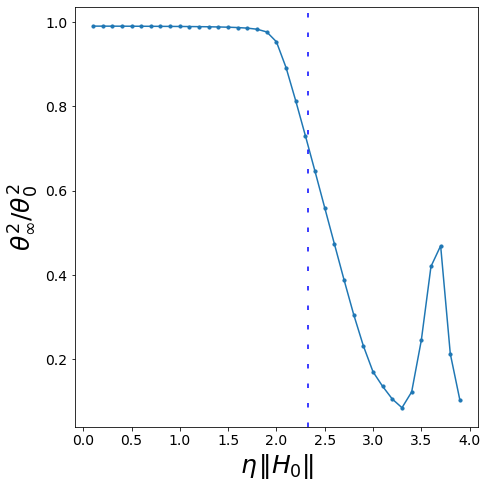

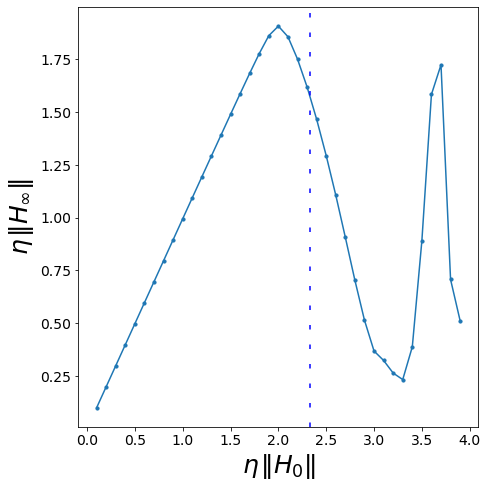

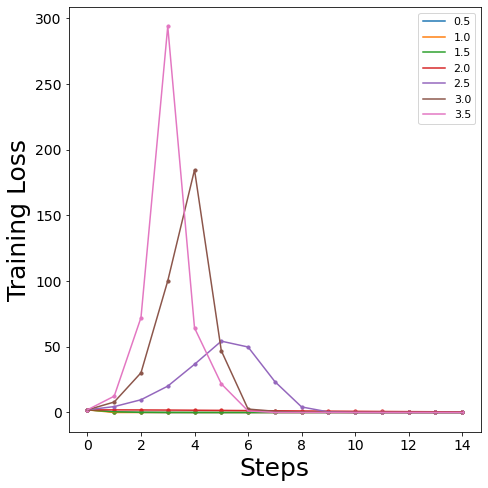

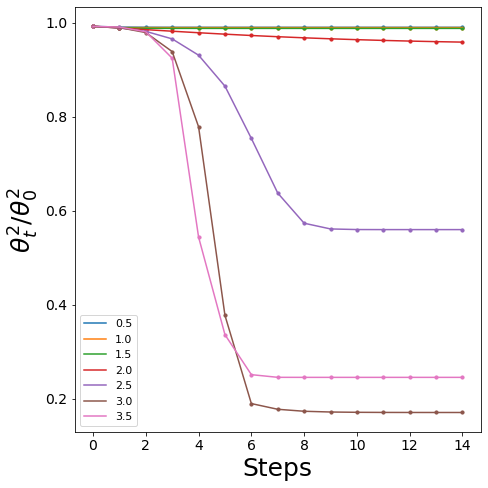

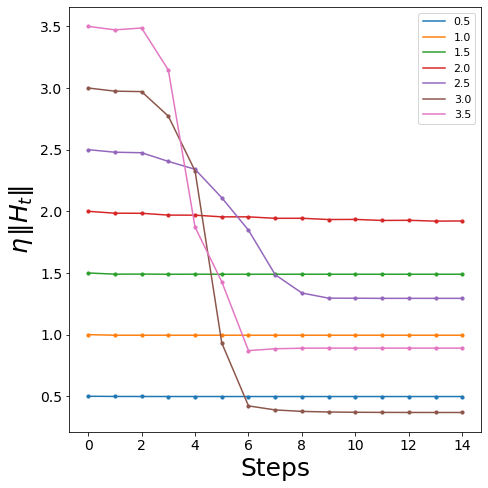

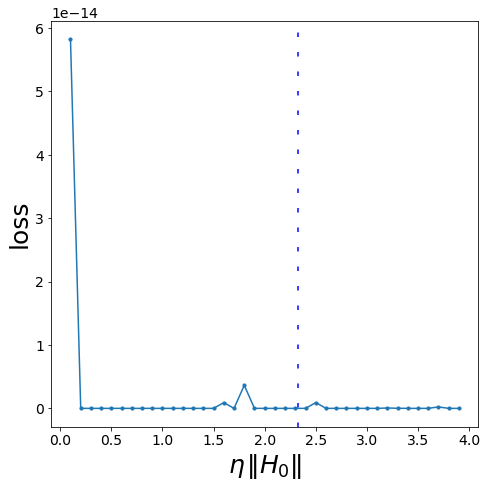

In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['hidden_dim']=1000
train_batch_size=1

model_dict['act']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,2)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='toy_example'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))
max_epochs=1000
log_type='batch'
stop_criterion=0
seed=13

#result_dict = full_training_loop(arch,
#    model_dict,
#    lr_ratios,
#    dataset_name,
#    train_batch_size,
#    max_epochs=max_epochs,
#    log_type=log_type,
#    stop_criterion=stop_criterion,
#    printevery=10**10,
#    verbose=True,
#    write_file=True,
#    overwrite=False,
#    seed=seed,
#    method='quadratic_model')
#
#train_test_loss(arch,
#                model_dict,
#                lr_ratios,
#                dataset_name,
#                train_batch_size,
#                max_epochs=max_epochs,
#                stop_criterion=stop_criterion,
#                print_every=1,
#                overwrite=False,
#                seed=seed,
#                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed,
                   mult_data=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=15,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            mult_data=False)

#print(result_dict['pred'])




### Exponential

Streaming output truncated to the last 5000 lines.
epoch: 35, batch/total: 0/1, loss: 6.722623099067156e-15, NTK: 0.4456742952285642
epoch: 36, batch/total: 0/1, loss: 4.228618018622173e-15, NTK: 0.4456742952285642
epoch: 37, batch/total: 0/1, loss: 2.046363202655899e-15, NTK: 0.4456742952285642
epoch: 38, batch/total: 0/1, loss: 2.1325164060287914e-15, NTK: 0.4456742952285642
epoch: 39, batch/total: 0/1, loss: 1.9619862273733985e-15, NTK: 0.4456742952285642
epoch: 40, batch/total: 0/1, loss: 1.3509195068069644e-15, NTK: 0.4456742952285642
epoch: 41, batch/total: 0/1, loss: 1.5667468898991491e-15, NTK: 0.4456742952285642
epoch: 42, batch/total: 0/1, loss: 1.2159163251791402e-15, NTK: 0.4456742952285642
epoch: 43, batch/total: 0/1, loss: 1.0880186911875955e-15, NTK: 0.4456742952285642
epoch: 44, batch/total: 0/1, loss: 1.1510793411986125e-15, NTK: 0.4456742952285642
epoch: 45, batch/total: 0/1, loss: 1.1510793411986125e-15, NTK: 0.4456742952285642
epoch: 46, batch/total: 0/1, loss: 1.08

<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


loss: (0.0, 0.0)
lr ratio is 0.3
loss: (0.0, 0.0)
lr ratio is 0.4
loss: (0.0, 0.0)
lr ratio is 0.5
loss: (0.0, 0.0)
lr ratio is 0.6
loss: (0.0, 0.0)
lr ratio is 0.7
loss: (0.0, 0.0)
lr ratio is 0.8
loss: (0.0, 0.0)
lr ratio is 0.9
loss: (0.0, 0.0)
lr ratio is 1.0
loss: (0.0, 0.0)
lr ratio is 1.1
loss: (0.0, 0.0)
lr ratio is 1.2
loss: (0.0, 0.0)
lr ratio is 1.3
loss: (0.0, 0.0)
lr ratio is 1.4
loss: (0.0, 0.0)
lr ratio is 1.5
loss: (0.0, 0.0)
lr ratio is 1.6
loss: (0.0, 0.0)
lr ratio is 1.7
loss: (0.0, 0.0)
lr ratio is 1.8
loss: (0.0, 0.0)
lr ratio is 1.9
loss: (0.0, 0.0)
lr ratio is 2.0
loss: (0.0, 0.0)
lr ratio is 2.1
loss: (5.684342156072553e-17, 5.684342156072553e-17)
lr ratio is 2.2
loss: (0.0, 0.0)
lr ratio is 2.3
loss: (5.115908006639747e-16, 5.115908006639747e-16)
lr ratio is 2.4
loss: (0.0, 0.0)
lr ratio is 2.5
loss: (0.0, 0.0)
lr ratio is 2.6
loss: (0.0, 0.0)
lr ratio is 2.7
loss: (1.4210855390181384e-17, 1.4210855390181384e-17)
lr ratio is 2.8
loss: (1.4210855390181384e-17, 1

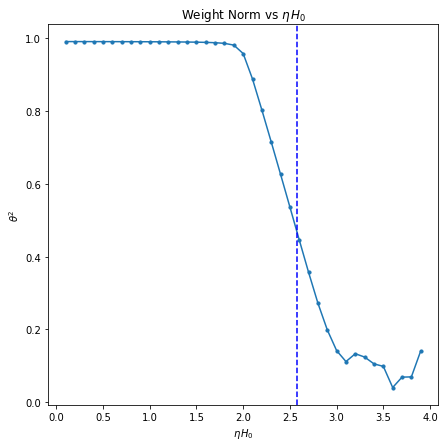

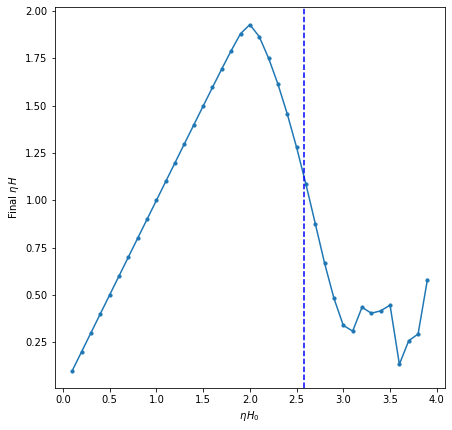

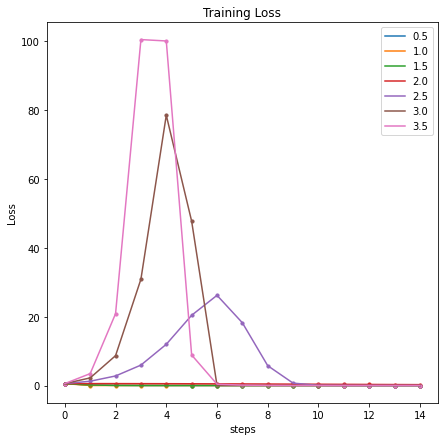

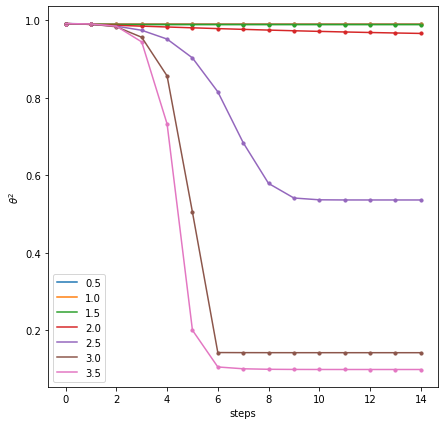

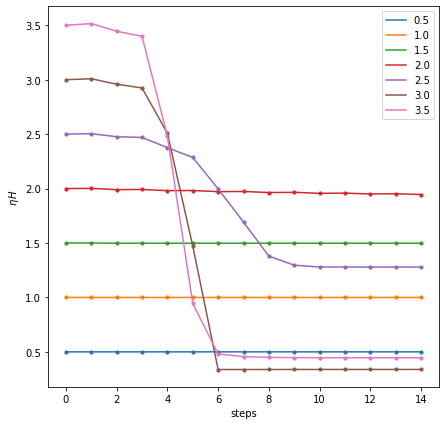

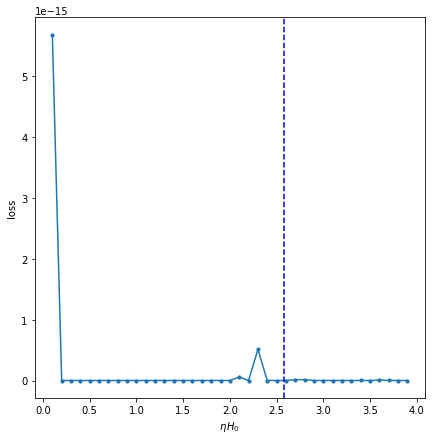

{'catapult_start': 2, 'upper_omega': 2.5783385189748267, 'lower_omega': 7.1513548603437025, 'upper': 2.578338586656658, 'lower': 7.151354333749378}


In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['hidden_dim']=1000
train_batch_size=1

#model_dict['activation_name']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.75,1.25)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='exp'
dataset_name='toy_example'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))

max_epochs=1000
log_type='batch'
stop_criterion=0
seed=13

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10**10,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=15,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])




Streaming output truncated to the last 5000 lines.
epoch: 49, batch/total: 0/1, loss: 5.115908006639747e-16, NTK: 0.6174753001015885
epoch: 50, batch/total: 0/1, loss: 2.2737368624290214e-16, NTK: 0.6174753001015885
epoch: 51, batch/total: 0/1, loss: 1.2789770016599368e-16, NTK: 0.6174753001015885
epoch: 52, batch/total: 0/1, loss: 1.2789770016599368e-16, NTK: 0.6174753001015885
epoch: 53, batch/total: 0/1, loss: 1.2789770016599368e-16, NTK: 0.6174753001015885
epoch: 54, batch/total: 0/1, loss: 1.4210855390181384e-17, NTK: 0.6174753001015885
epoch: 55, batch/total: 0/1, loss: 1.4210855390181384e-17, NTK: 0.6174753001015885
epoch: 56, batch/total: 0/1, loss: 1.4210855390181384e-17, NTK: 0.6174753001015885
epoch: 57, batch/total: 0/1, loss: 1.4210855390181384e-17, NTK: 0.6174753001015885
epoch: 58, batch/total: 0/1, loss: 1.4210855390181384e-17, NTK: 0.6174753001015885
epoch: 59, batch/total: 0/1, loss: 1.4210855390181384e-17, NTK: 0.6174753001015885
epoch: 60, batch/total: 0/1, loss: 1.

<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


model diverges
lr ratio is 0.1
loss: (6.571100000934971e-14, 6.571100000934971e-14)
lr ratio is 0.2
loss: (2.2737368624290214e-16, 2.2737368624290214e-16)
lr ratio is 0.3
loss: (0.0, 0.0)
lr ratio is 0.4
loss: (0.0, 0.0)
lr ratio is 0.5
loss: (0.0, 0.0)
lr ratio is 0.6
loss: (0.0, 0.0)
lr ratio is 0.7
loss: (0.0, 0.0)
lr ratio is 0.8
loss: (0.0, 0.0)
lr ratio is 0.9
loss: (0.0, 0.0)
lr ratio is 1.0
loss: (0.0, 0.0)
lr ratio is 1.1
loss: (2.2737368624290214e-16, 2.2737368624290214e-16)
lr ratio is 1.2
loss: (0.0, 0.0)
lr ratio is 1.3
loss: (0.0, 0.0)
lr ratio is 1.4
loss: (2.2737368624290214e-16, 2.2737368624290214e-16)
lr ratio is 1.5
loss: (0.0, 0.0)
lr ratio is 1.6
loss: (2.2737368624290214e-16, 2.2737368624290214e-16)
lr ratio is 1.7
loss: (0.0, 0.0)
lr ratio is 1.8
loss: (0.0, 0.0)
lr ratio is 1.9
loss: (0.0, 0.0)
lr ratio is 2.0
loss: (1.5488924379192248e-11, 1.5488924379192248e-11)
lr ratio is 2.1
loss: (0.0, 0.0)
lr ratio is 2.2
loss: (0.0, 0.0)
lr ratio is 2.3
loss: (0.0, 0.0)


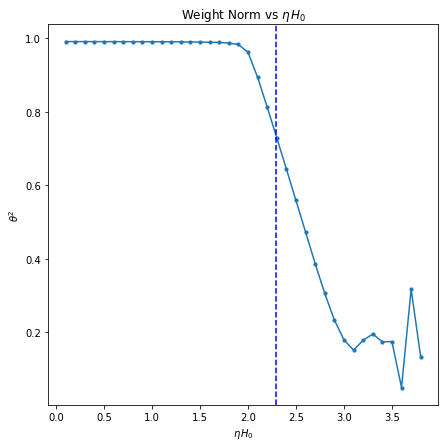

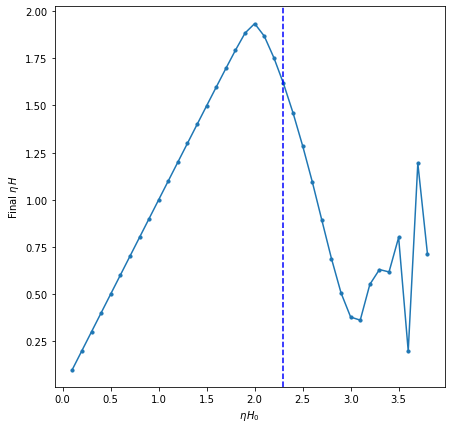

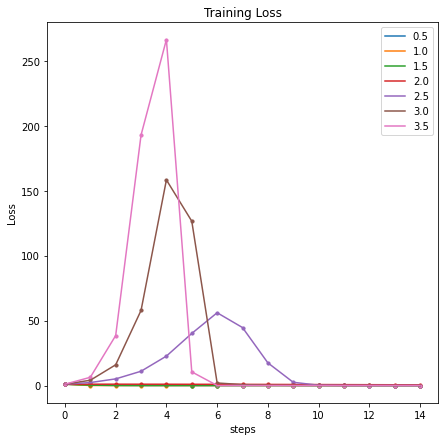

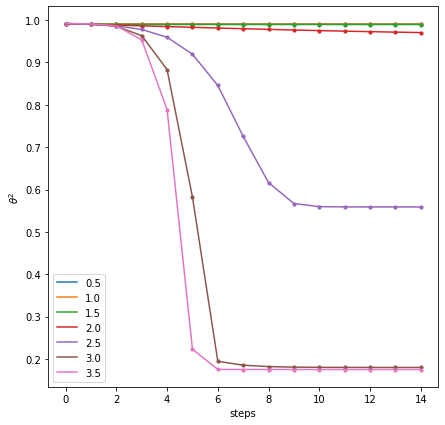

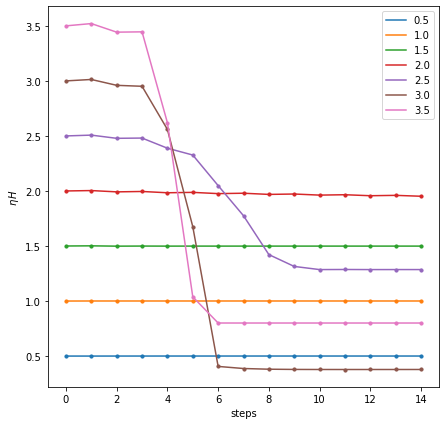

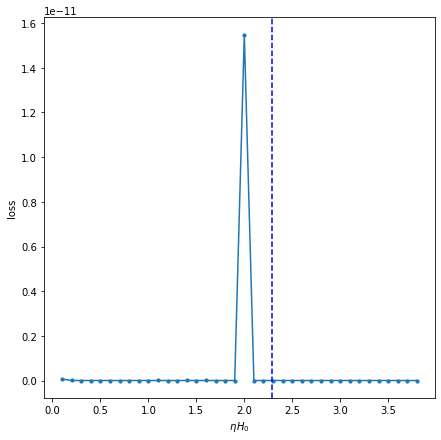

{'catapult_start': 2, 'upper_omega': 2.2931119876761974, 'lower_omega': 9.152694694571025, 'upper': 2.2931120218807552, 'lower': 9.15269312793118}


In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['hidden_dim']=1000
train_batch_size=1

#model_dict['activation_name']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,2)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='exp'
dataset_name='toy_example'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))

max_epochs=1000
log_type='batch'
stop_criterion=0
seed=13

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10**10,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=15,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])




## Random Datasets

### Linear: Identity

Streaming output truncated to the last 5000 lines.
old_loss is 0.442804217338562.
loss_tot is 0.4428041875362396.
difference is 2.9802322387695312e-08
epoch: 84, batch/total: 0/1, loss: 0.4428041875362396, NTK: 0.6418768787519289
old_loss is 0.4428041875362396.
loss_tot is 0.4428041875362396.
difference is 0.0
epoch: 85, batch/total: 0/1, loss: 0.442804217338562, NTK: 0.6418766733597143
old_loss is 0.4428041875362396.
loss_tot is 0.442804217338562.
difference is 2.9802322387695312e-08
epoch: 86, batch/total: 0/1, loss: 0.4428041875362396, NTK: 0.6418766733597143
old_loss is 0.442804217338562.
loss_tot is 0.4428041875362396.
difference is 2.9802322387695312e-08
epoch: 87, batch/total: 0/1, loss: 0.4428041875362396, NTK: 0.6418766733597143
old_loss is 0.4428041875362396.
loss_tot is 0.4428041875362396.
difference is 0.0
epoch: 88, batch/total: 0/1, loss: 0.44280415773391724, NTK: 0.6418767144381572
old_loss is 0.4428041875362396.
loss_tot is 0.44280415773391724.
difference is 2.980232238

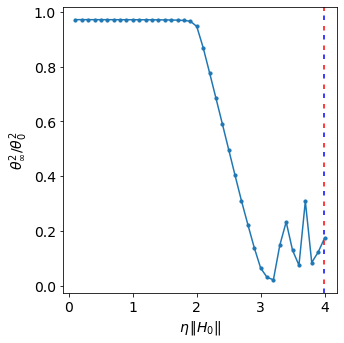

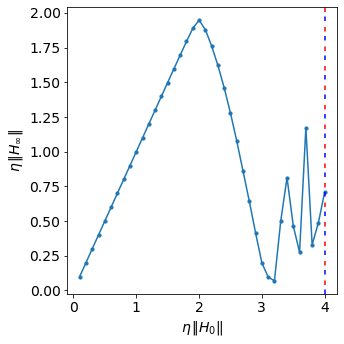

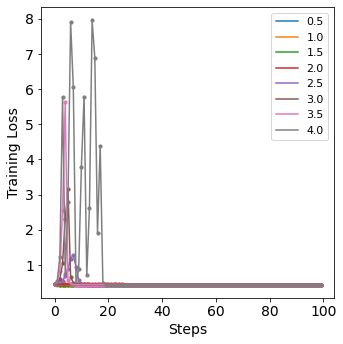

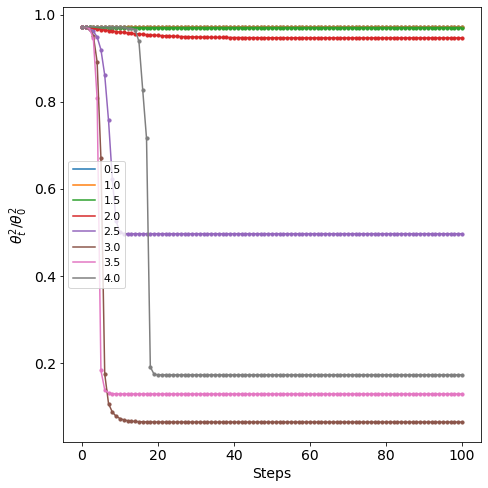

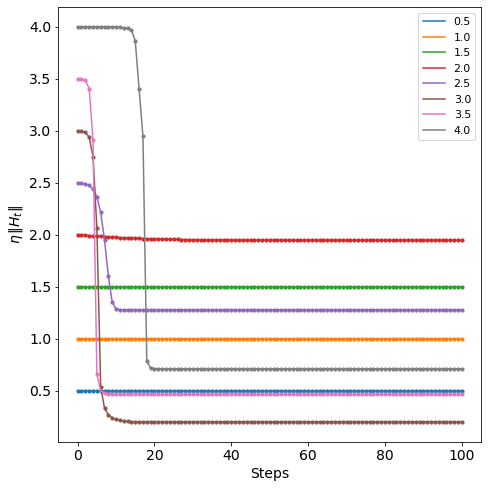

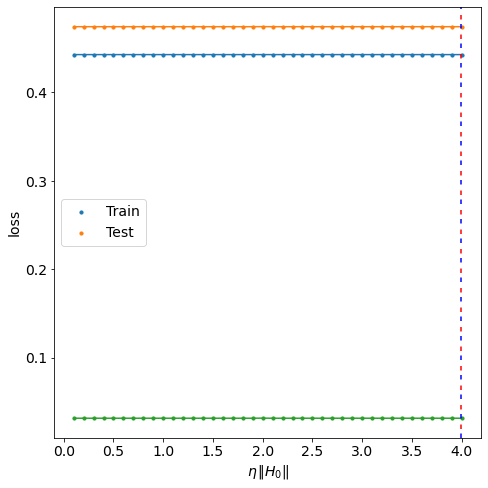

{'catapult_start': 2, 'upper_omega': 3.9994319471205033, 'lower_omega': -7432244.628049041, 'upper': 3.998758625771355, 'lower': 3.99987941877706}


In [ ]:
model_dict={}

num_train_samps=32
num_test_samps=512

model_dict['input_dim']=1
model_dict['hidden_dim']=500
train_batch_size=32

model_dict['act']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='random'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))
max_epochs=100
log_type='batch'
stop_criterion=0
seed=123

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])

computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.1
training already done
lr_ratio is 0.2
training already done
lr_ratio is 0.3
training already done
lr_ratio is 0.4
training already done
lr_ratio is 0.5
training already done
lr_ratio is 0.6
training already done
lr_ratio is 0.7
training already done
lr_ratio is 0.8
training already done
lr_ratio is 0.9
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.1
training already done
lr_ratio is 1.2
training already done
lr_ratio is 1.3
training already done
lr_ratio is 1.4
training already done
lr_ratio is 1.5
training already done
lr_ratio is 1.6
training already done
lr_ratio is 1.7
training already done
lr_ratio is 1.8
training already done
lr_ratio is 1.9
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.1
training already done
lr_ratio is 2.2
training already done
lr_ratio is 2.3
training already done
lr_ratio is 2.4
training already done
lr_rati

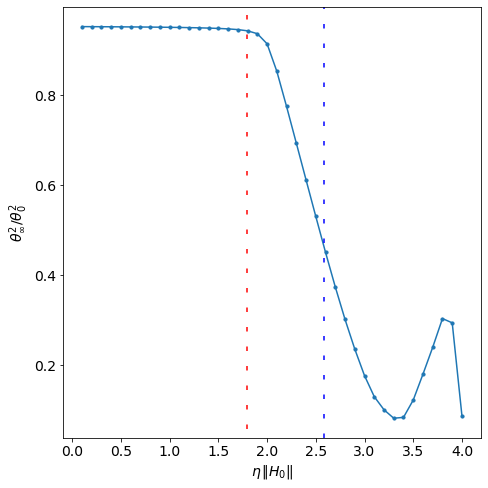

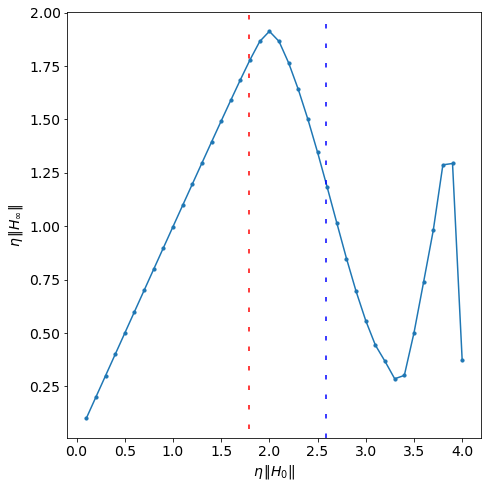

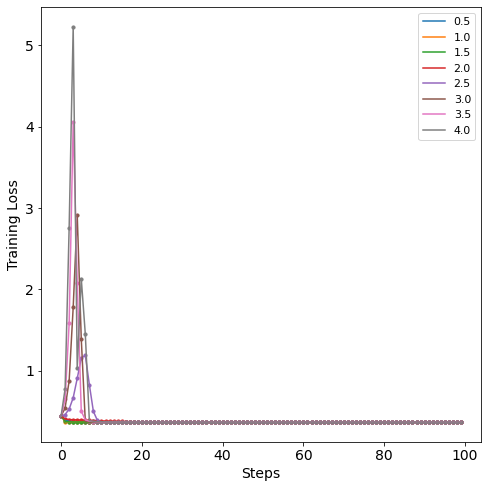

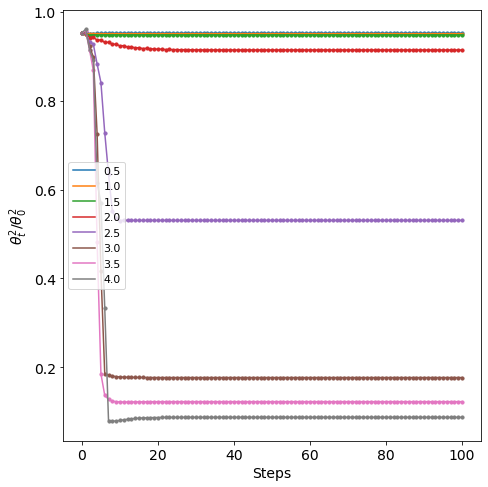

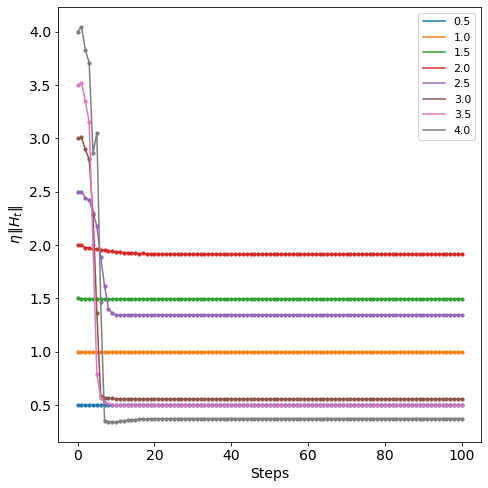

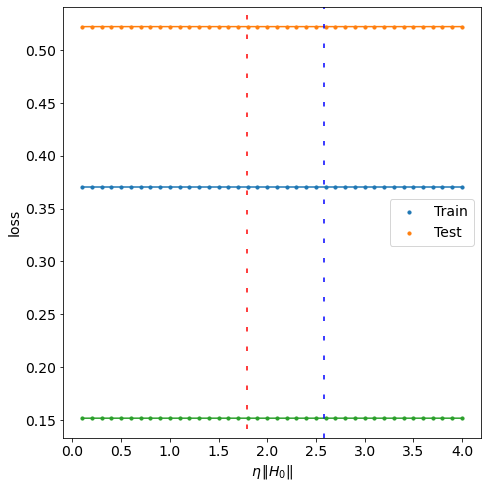

{'catapult_start': 2, 'upper_omega': 1.7932647975822609, 'lower_omega': -2002306.6623421996, 'upper': 2.585938844180211, 'lower': 7.794166761645771}


In [ ]:
model_dict={}

num_train_samps=32
num_test_samps=512

model_dict['input_dim']=2
model_dict['hidden_dim']=500
train_batch_size=32

model_dict['act']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1.5)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='random'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))
max_epochs=100
log_type='batch'
stop_criterion=0
seed=123

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])

computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.1
training already done
lr_ratio is 0.2
training already done
lr_ratio is 0.3
training already done
lr_ratio is 0.4
training already done
lr_ratio is 0.5
training already done
lr_ratio is 0.6
training already done
lr_ratio is 0.7
training already done
lr_ratio is 0.8
training already done
lr_ratio is 0.9
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.1
training already done
lr_ratio is 1.2
training already done
lr_ratio is 1.3
training already done
lr_ratio is 1.4
training already done
lr_ratio is 1.5
training already done
lr_ratio is 1.6
training already done
lr_ratio is 1.7
training already done
lr_ratio is 1.8
training already done
lr_ratio is 1.9
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.1
training already done
lr_ratio is 2.2
training already done
lr_ratio is 2.3
training already done
lr_ratio is 2.4
training already done
lr_rati

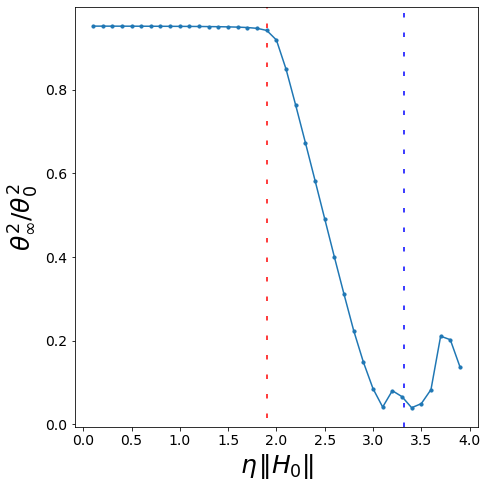

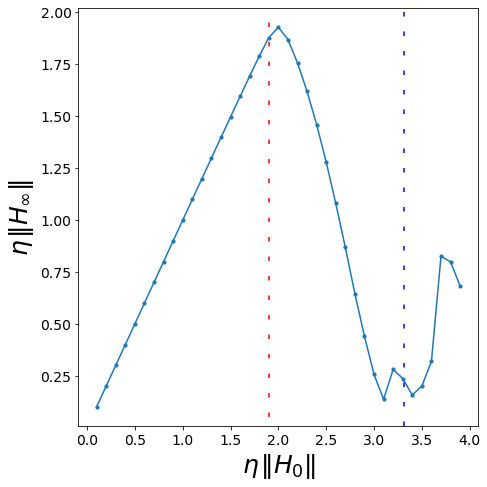

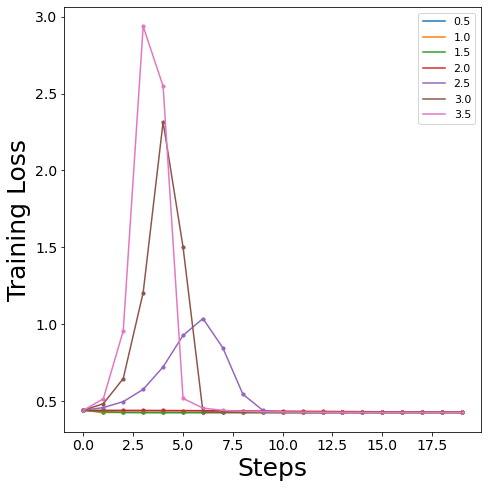

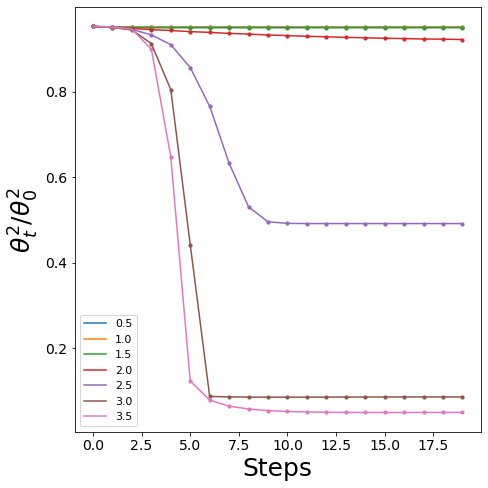

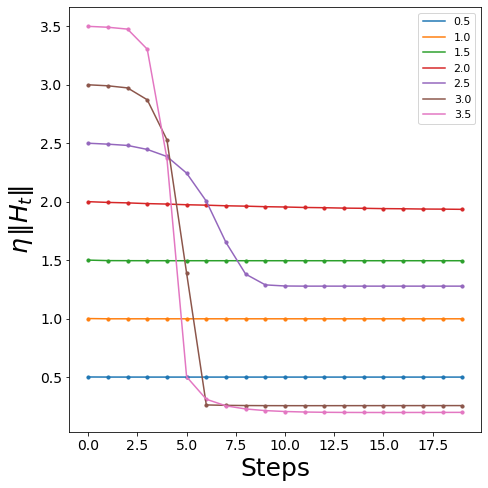

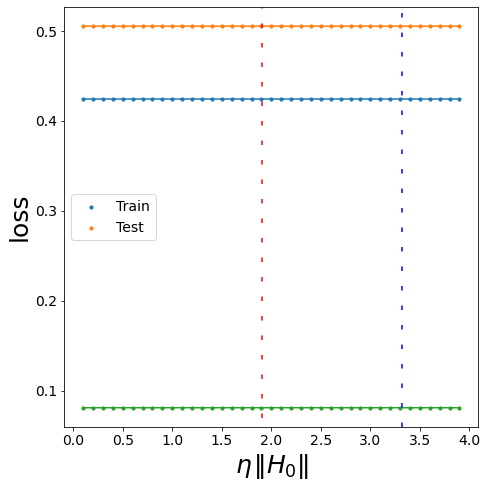

{'catapult_start': 2, 'upper_omega': 1.9044384778400956, 'lower_omega': -6339571.43992245, 'upper': 3.3168159018275474, 'lower': 4.932287746592416}


In [ ]:
model_dict={}

num_train_samps=32
num_test_samps=512

model_dict['input_dim']=2
model_dict['hidden_dim']=500
train_batch_size=32

model_dict['act']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.9,1.1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='random'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))
max_epochs=100
log_type='batch'
stop_criterion=0
seed=123

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])

### Linear: Tanh

Streaming output truncated to the last 5000 lines.
loss_tot is 0.3669619858264923.
difference is 0.0
epoch: 78, batch/total: 0/1, loss: 0.3669619858264923, NTK: 0.9079652864937499
old_loss is 0.3669619858264923.
loss_tot is 0.3669619858264923.
difference is 0.0
epoch: 79, batch/total: 0/1, loss: 0.3669619858264923, NTK: 0.9079650336382148
old_loss is 0.3669619858264923.
loss_tot is 0.3669619858264923.
difference is 0.0
epoch: 80, batch/total: 0/1, loss: 0.3669619858264923, NTK: 0.9079652232798661
old_loss is 0.3669619858264923.
loss_tot is 0.3669619858264923.
difference is 0.0
epoch: 81, batch/total: 0/1, loss: 0.3669620156288147, NTK: 0.9079650336382148
old_loss is 0.3669619858264923.
loss_tot is 0.3669620156288147.
difference is 2.9802322387695312e-08
epoch: 82, batch/total: 0/1, loss: 0.3669619858264923, NTK: 0.9079648439965635
old_loss is 0.3669620156288147.
loss_tot is 0.3669619858264923.
difference is 2.9802322387695312e-08
epoch: 83, batch/total: 0/1, loss: 0.3669620156288147, N

<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


loss: (0.3669619560241699, 0.5076001286506653)
lr ratio is 0.2
loss: (0.3669619560241699, 0.5076004266738892)
lr ratio is 0.3
loss: (0.3669619560241699, 0.5076004266738892)
lr ratio is 0.4
loss: (0.3669619560241699, 0.5076004266738892)
lr ratio is 0.5
loss: (0.3669619858264923, 0.5076004266738892)
lr ratio is 0.6
loss: (0.3669619560241699, 0.5076004266738892)
lr ratio is 0.7
loss: (0.3669619858264923, 0.5076004266738892)
lr ratio is 0.8
loss: (0.3669619858264923, 0.5076004862785339)
lr ratio is 0.9
loss: (0.3669619560241699, 0.5076004266738892)
lr ratio is 1.0
loss: (0.3669619560241699, 0.5076004266738892)
lr ratio is 1.1
loss: (0.3669619560241699, 0.5076003670692444)
lr ratio is 1.2
loss: (0.3669619560241699, 0.5076004266738892)
lr ratio is 1.3
loss: (0.3669619858264923, 0.5076004862785339)
lr ratio is 1.4
loss: (0.3669619560241699, 0.5076003670692444)
lr ratio is 1.5
loss: (0.3669619858264923, 0.5076004266738892)
lr ratio is 1.6
loss: (0.3669619560241699, 0.5076003670692444)
lr ratio

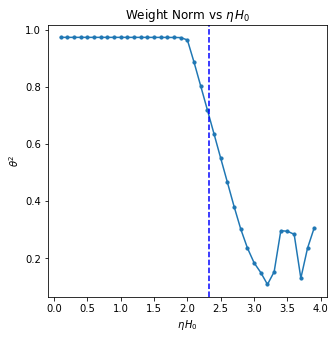

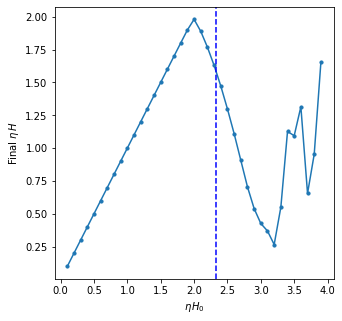

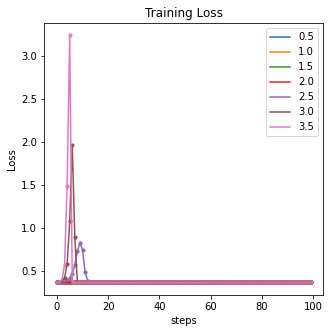

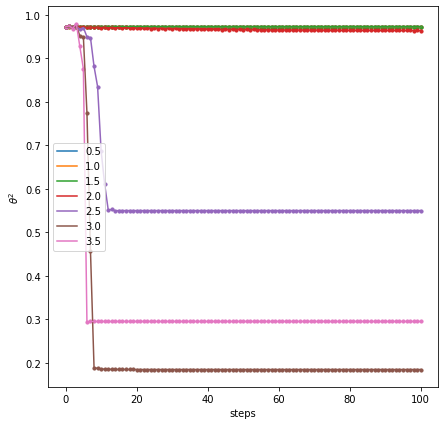

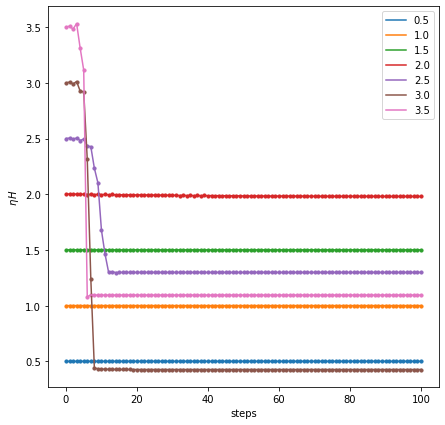

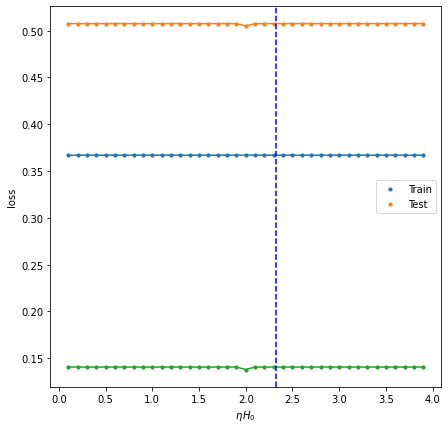

{'catapult_start': 2, 'upper_omega': 2.3241732660662637, 'lower_omega': -16571689.98976267, 'upper': 2.3236720963004673, 'lower': 9.24261087559538}


In [ ]:
model_dict={}

num_train_samps=32
num_test_samps=512

model_dict['input_dim']=1
model_dict['hidden_dim']=500
train_batch_size=32

model_dict['act']='tanh'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.5,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='random'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))
max_epochs=100
log_type='batch'
stop_criterion=0
seed=123

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])

Streaming output truncated to the last 5000 lines.
loss_tot is 0.41438814997673035.
difference is 0.0
epoch: 76, batch/total: 0/1, loss: 0.41438812017440796, NTK: 1.1531819341100729
old_loss is 0.41438814997673035.
loss_tot is 0.41438812017440796.
difference is 2.9802322387695312e-08
epoch: 77, batch/total: 0/1, loss: 0.41438812017440796, NTK: 1.1531822504717109
old_loss is 0.41438812017440796.
loss_tot is 0.41438812017440796.
difference is 0.0
epoch: 78, batch/total: 0/1, loss: 0.41438812017440796, NTK: 1.1531822504717109
old_loss is 0.41438812017440796.
loss_tot is 0.41438812017440796.
difference is 0.0
epoch: 79, batch/total: 0/1, loss: 0.41438812017440796, NTK: 1.1531826722872283
old_loss is 0.41438812017440796.
loss_tot is 0.41438812017440796.
difference is 0.0
epoch: 80, batch/total: 0/1, loss: 0.41438812017440796, NTK: 1.1531821450178315
old_loss is 0.41438812017440796.
loss_tot is 0.41438812017440796.
difference is 0.0
epoch: 81, batch/total: 0/1, loss: 0.41438814997673035, NTK

<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


loss: (0.41438746452331543, 0.5303183197975159)
lr ratio is 0.2
loss: (0.4143873453140259, 0.530358076095581)
lr ratio is 0.3
loss: (0.4143873453140259, 0.5303581357002258)
lr ratio is 0.4
loss: (0.4143873453140259, 0.530358076095581)
lr ratio is 0.5
loss: (0.4143873453140259, 0.5303581357002258)
lr ratio is 0.6
loss: (0.4143873453140259, 0.530358076095581)
lr ratio is 0.7
loss: (0.4143873155117035, 0.530358076095581)
lr ratio is 0.8
loss: (0.4143873155117035, 0.530358076095581)
lr ratio is 0.9
loss: (0.4143873453140259, 0.530358076095581)
lr ratio is 1.0
loss: (0.4143873453140259, 0.530358076095581)
lr ratio is 1.1
loss: (0.4143873155117035, 0.5303581357002258)
lr ratio is 1.2
loss: (0.4143872857093811, 0.530358076095581)
lr ratio is 1.3
loss: (0.4143872857093811, 0.530358076095581)
lr ratio is 1.4
loss: (0.4143872857093811, 0.530358076095581)
lr ratio is 1.5
loss: (0.4143872559070587, 0.530358076095581)
lr ratio is 1.6
loss: (0.4143872857093811, 0.530358076095581)
lr ratio is 1.7
los

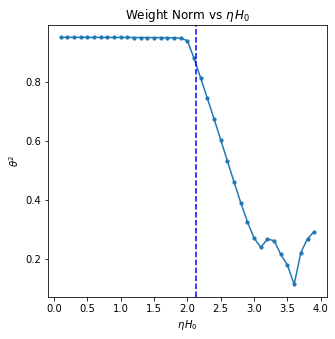

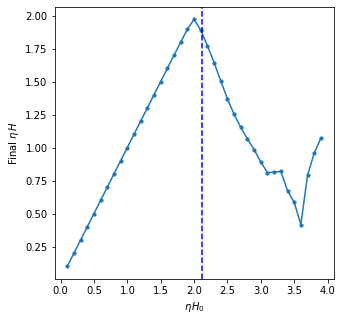

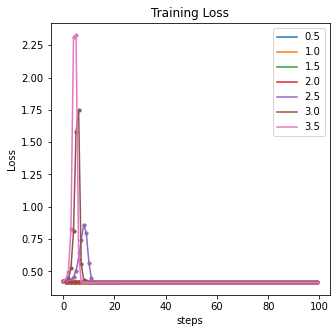

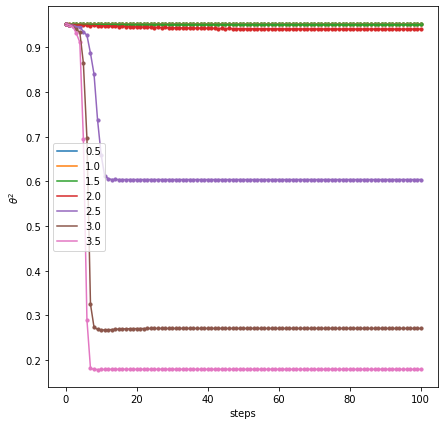

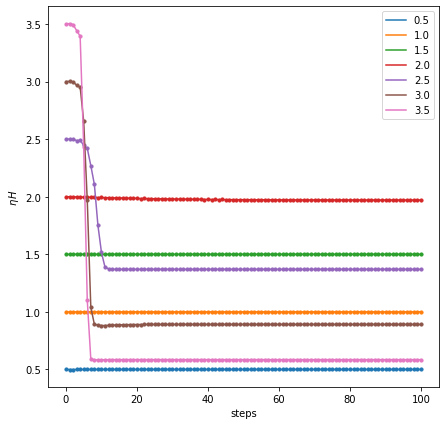

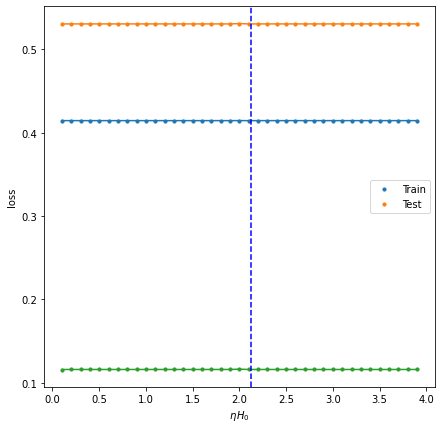

{'catapult_start': 2, 'upper_omega': 2.0289959183155353, 'lower_omega': -7549801.098413469, 'upper': 2.1226639591272156, 'lower': 28.395983817359117}


In [ ]:
model_dict={}

num_train_samps=32
num_test_samps=512

model_dict['input_dim']=2
model_dict['hidden_dim']=500
train_batch_size=32

model_dict['act']='tanh'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='random'
arch='quadratic'

lr_ratios=list(map(lambda x:round(x,2),np.arange(.1,4+.1,.1)))
lr_ratios_plot=list(map(lambda x:round(x,2),np.arange(.5,4+.5,.5)))
max_epochs=100
log_type='batch'
stop_criterion=0
seed=123

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])

In [ ]:
model_dict={}

num_train_samps=10
num_test_samps=20

model_dict['input_dim']=2
model_dict['hidden_dim']=500
train_batch_size=10

model_dict['activation_name']='tanh'
 
eval_dist={
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='linear'
dataset_name='random'
arch='quadratic'

lr_ratios=np.arange(.5,4+.1,.1)
max_epochs=20
log_type='batch'
stop_criterion=0
seed=13

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10**10,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[::],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])




### Exponential: Identity

computing averaged top eigenvalues and eigenvectors
[    0/    4]
lr_ratio is 0.5
seed is 13
initial max eigen 0.603456
epoch: 1, batch/total: 0/1, loss: 0.778476893901825, NTK: 0.4967902507143449
old_loss is inf.
loss_tot is 0.778476893901825.
difference is inf
epoch: 2, batch/total: 0/1, loss: 0.22593790292739868, NTK: 0.49647897027264376
old_loss is 0.778476893901825.
loss_tot is 0.22593790292739868.
difference is 0.5525389909744263
epoch: 3, batch/total: 0/1, loss: 0.06824715435504913, NTK: 0.49671592466884906
old_loss is 0.22593790292739868.
loss_tot is 0.06824715435504913.
difference is 0.15769074857234955
epoch: 4, batch/total: 0/1, loss: 0.02097932994365692, NTK: 0.496970904983065
old_loss is 0.06824715435504913.
loss_tot is 0.02097932994365692.
difference is 0.04726782441139221
epoch: 5, batch/total: 0/1, loss: 0.006511319428682327, NTK: 0.497152151884706
old_loss is 0.02097932994365692.
loss_tot is 0.006511319428682327.
difference is 0.014468010514974594
epoch: 6, batch/total

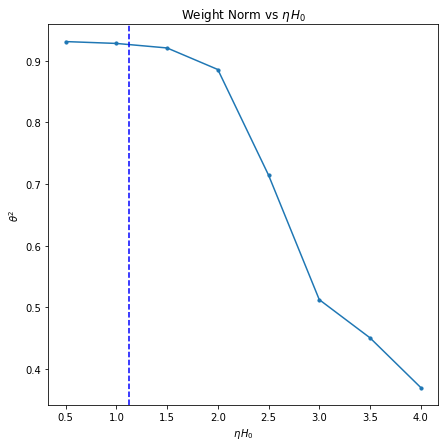

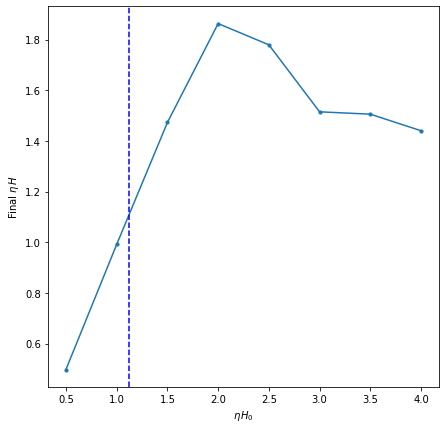

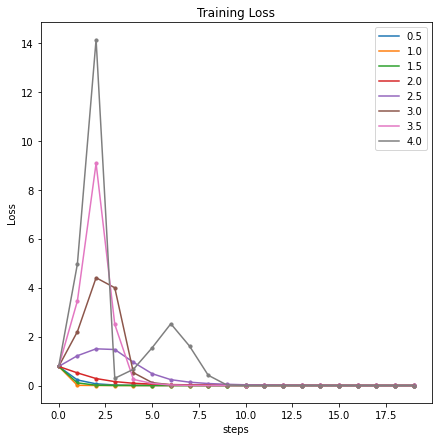

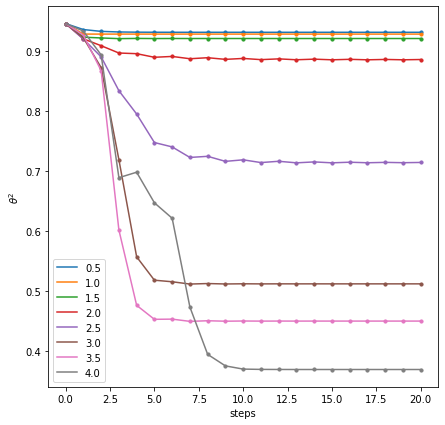

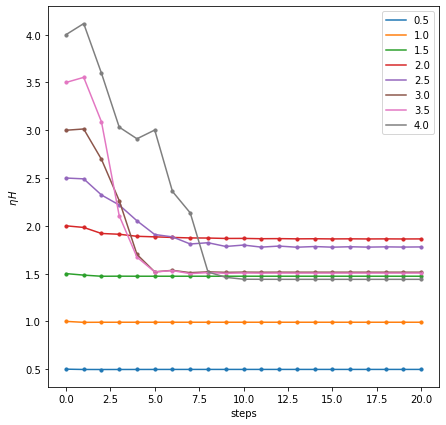

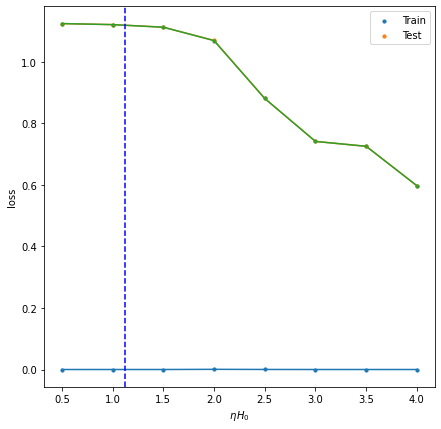

{'catapult_start': 2, 'upper_omega': 0.5047069329177536, 'lower_omega': -2384263.692617062, 'upper': 1.1261723641192989, 'lower': 1547541.8140853674}


In [ ]:
model_dict={}

num_train_samps=4
num_test_samps=16

model_dict['input_dim']=500
model_dict['hidden_dim']=500
train_batch_size=num_train_samps

#model_dict['activation_name']='identity'
 
eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(0,2)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist


model_dict['meta_type']='exp'
dataset_name='random'
arch='quadratic'

lr_ratios=np.arange(.5,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0
seed=13

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[::],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

print(result_dict['pred'])

## Teacher Student: Linear

### Identity

Streaming output truncated to the last 5000 lines.
epoch: 762, batch/total: 0/1, loss: 1.936818760928105e-15, NTK: 0.41839403352713966
old_loss is 2.1033522146218786e-15.
loss_tot is 1.936818760928105e-15.
difference is 1.6653345369377348e-16
epoch: 763, batch/total: 0/1, loss: 2.1033522146218786e-15, NTK: 0.4183939104007943
old_loss is 1.936818760928105e-15.
loss_tot is 2.1033522146218786e-15.
difference is 1.6653345369377348e-16
epoch: 764, batch/total: 0/1, loss: 1.936818760928105e-15, NTK: 0.4183939104007943
old_loss is 2.1033522146218786e-15.
loss_tot is 1.936818760928105e-15.
difference is 1.6653345369377348e-16
epoch: 765, batch/total: 0/1, loss: 2.1033522146218786e-15, NTK: 0.4183939514429094
old_loss is 1.936818760928105e-15.
loss_tot is 2.1033522146218786e-15.
difference is 1.6653345369377348e-16
epoch: 766, batch/total: 0/1, loss: 1.936818760928105e-15, NTK: 0.4183939104007943
old_loss is 2.1033522146218786e-15.
loss_tot is 1.936818760928105e-15.
difference is 1.665334536937

<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)
/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


epoch: 10, batch/total: 0/1, loss: 1.492251575452023e+27, NTK: inf
old_loss is 1373654400.0.
loss_tot is 1.492251575452023e+27.
difference is 1.492251575452023e+27
epoch: 11, batch/total: 0/1, loss: inf, NTK: inf
old_loss is 1.492251575452023e+27.
loss_tot is inf.
difference is inf
model diverges
lr ratio is 0.5
loss: (1.8405416080113923e-15, 2.0156441619956222e-15)
lr ratio is 1.0
loss: (1.6731407925796304e-15, 2.0299304771820292e-15)
lr ratio is 1.5
loss: (1.3955850364233413e-15, 2.0087243500499507e-15)
lr ratio is 2.0
loss: (3.599551212651875e-15, 2.0343592262161982e-15)
lr ratio is 2.5
loss: (9.853229343548264e-16, 1.914167175459669e-15)
lr ratio is 3.0
loss: (2.1033522146218786e-15, 1.8044130642783097e-15)
lr ratio is 3.5
loss: (1.4961989980299961e-15, 2.007222079519755e-15)
lr ratio is 4.0
loss: (nan, nan)


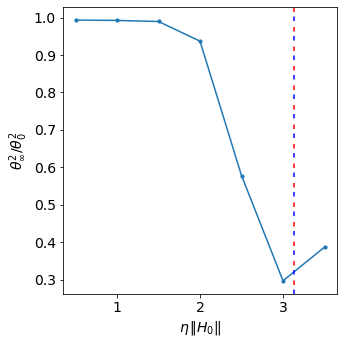

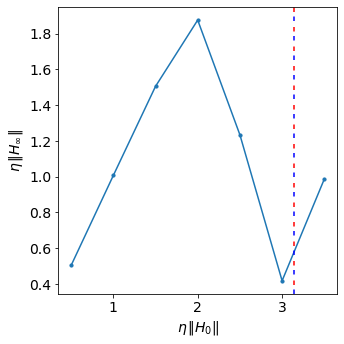

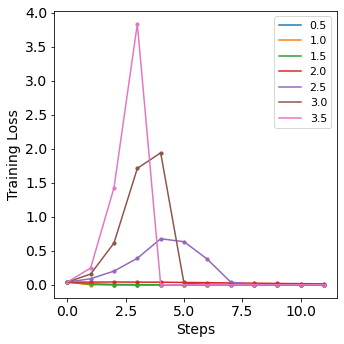

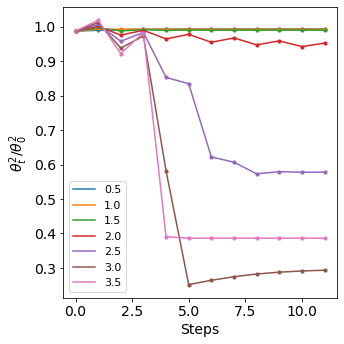

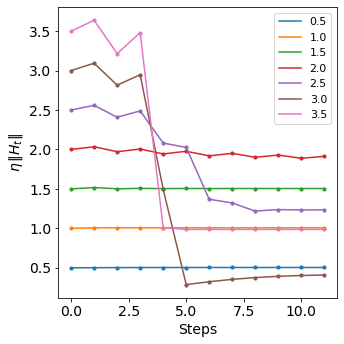

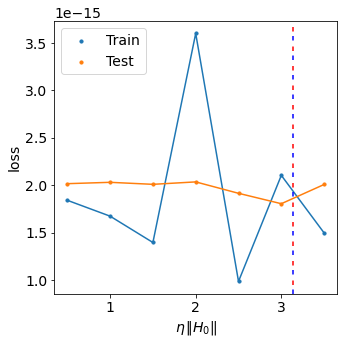

In [ ]:
model_dict={}
num_samps_train=32
num_samps_test=1000
model_dict['input_dim']=1
model_dict['hidden_dim']=500
model_dict['masks']=100

train_batch_size=32

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist
model_dict['act']='identity'

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(.5,4+.5,.5)
max_epochs=1000
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed,
            include_gen_gap=False)

#print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/  512]
[   32/  512]
[   64/  512]
[   96/  512]
[  128/  512]
[  160/  512]
[  192/  512]
[  224/  512]
[  256/  512]
[  288/  512]
[  320/  512]
[  352/  512]
[  384/  512]
[  416/  512]
[  448/  512]
[  480/  512]
lr_ratio is 0.0
seed is 120
initial max eigen 0.074571
epoch: 1, batch/total: 0/16, loss: 0.015006275847554207, NTK: 0.0
epoch: 1, batch/total: 1/16, loss: 0.009865228086709976, NTK: 0.0
epoch: 1, batch/total: 2/16, loss: 0.010107925161719322, NTK: 0.0
epoch: 1, batch/total: 3/16, loss: 0.014947186224162579, NTK: 0.0
epoch: 1, batch/total: 4/16, loss: 0.013713053427636623, NTK: 0.0
epoch: 1, batch/total: 5/16, loss: 0.014472187496721745, NTK: 0.0
epoch: 1, batch/total: 6/16, loss: 0.01295216754078865, NTK: 0.0
epoch: 1, batch/total: 7/16, loss: 0.016264982521533966, NTK: 0.0
epoch: 1, batch/total: 8/16, loss: 0.014614902436733246, NTK: 0.0
epoch: 1, batch/total: 9/16, loss: 0.014240968972444534, NTK: 0.0
epoch: 1, 

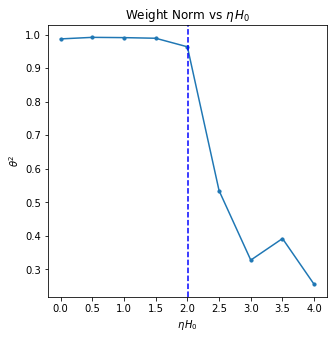

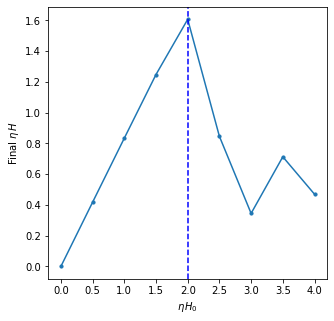

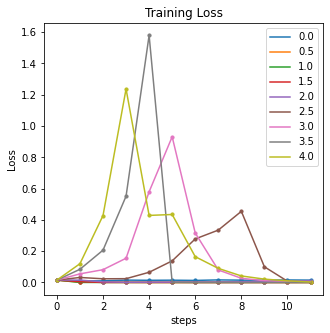

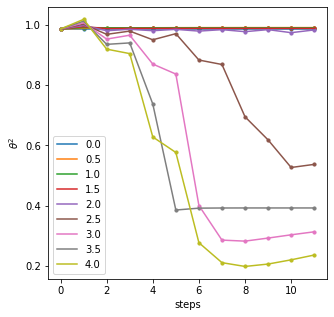

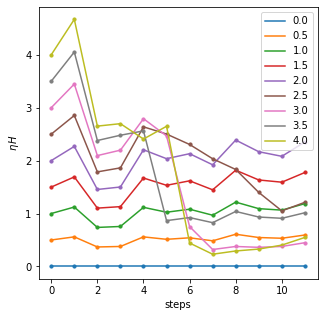

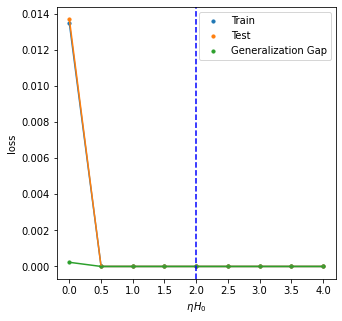

{'catapult_start': 2, 'upper_omega': 2.004129280472944, 'lower_omega': -14550804.81227175, 'upper': 2.003825874208077, 'lower': 61373.44043588408}


In [ ]:
model_dict={}
num_samps_train=512
num_samps_test=1000
model_dict['input_dim']=1
model_dict['hidden_dim']=500
model_dict['masks']=100
model_dict['act']='identity'

train_batch_size=32

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.5,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/  128]
[   16/  128]
[   32/  128]
[   48/  128]
[   64/  128]
[   80/  128]
[   96/  128]
[  112/  128]
lr_ratio is 0.0
seed is 120
initial max eigen 0.102113
epoch: 1, batch/total: 0/8, loss: 0.05446239933371544, NTK: 0.0
epoch: 1, batch/total: 1/8, loss: 0.04628158360719681, NTK: 0.0
epoch: 1, batch/total: 2/8, loss: 0.01968330144882202, NTK: 0.0
epoch: 1, batch/total: 3/8, loss: 0.035661328583955765, NTK: 0.0
epoch: 1, batch/total: 4/8, loss: 0.04846448078751564, NTK: 0.0
epoch: 1, batch/total: 5/8, loss: 0.04854222387075424, NTK: 0.0
epoch: 1, batch/total: 6/8, loss: 0.04715629667043686, NTK: 0.0
epoch: 1, batch/total: 7/8, loss: 0.04369897022843361, NTK: 0.0
old_loss is inf.
loss_tot is 0.3439505845308304.
difference is inf
epoch: 2, batch/total: 0/8, loss: 0.05348055064678192, NTK: 0.0
epoch: 2, batch/total: 1/8, loss: 0.04917796701192856, NTK: 0.0
epoch: 2, batch/total: 2/8, loss: 0.043175503611564636, NTK: 0.0
epoch: 2

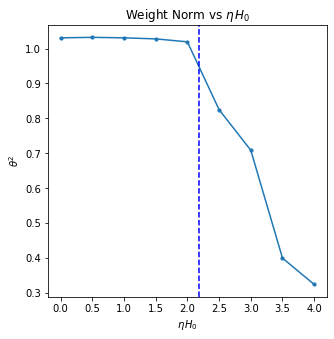

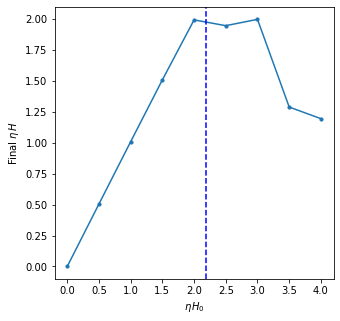

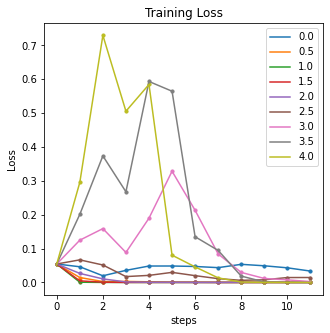

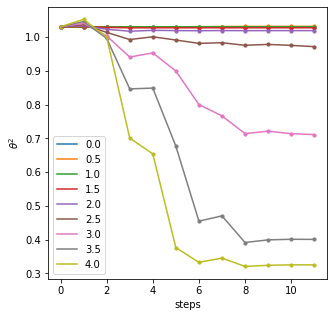

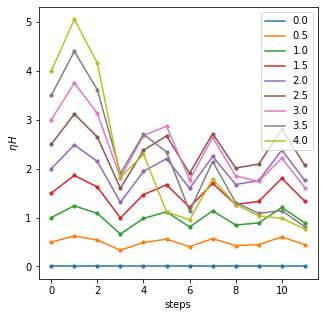

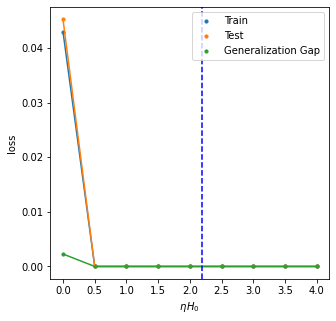

{'catapult_start': 2, 'upper_omega': 1.960843172887378, 'lower_omega': -4183775.343466568, 'upper': 2.190061387026863, 'lower': 125717.01822759677}


In [ ]:
model_dict={}
num_samps_train=8*16
num_samps_test=1000
model_dict['input_dim']=2
model_dict['hidden_dim']=500
model_dict['masks']=50
model_dict['act']='identity'

train_batch_size=16

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/  128]
[   16/  128]
[   32/  128]
[   48/  128]
[   64/  128]
[   80/  128]
[   96/  128]
[  112/  128]
lr_ratio is 0.0
seed is 120
initial max eigen 0.086001
epoch: 1, batch/total: 0/8, loss: 0.07923130691051483, NTK: 0.0
epoch: 1, batch/total: 1/8, loss: 0.11932388693094254, NTK: 0.0
epoch: 1, batch/total: 2/8, loss: 0.07343533635139465, NTK: 0.0
epoch: 1, batch/total: 3/8, loss: 0.051522478461265564, NTK: 0.0
epoch: 1, batch/total: 4/8, loss: 0.14830292761325836, NTK: 0.0
epoch: 1, batch/total: 5/8, loss: 0.12529230117797852, NTK: 0.0
epoch: 1, batch/total: 6/8, loss: 0.13820940256118774, NTK: 0.0
epoch: 1, batch/total: 7/8, loss: 0.12297853082418442, NTK: 0.0
old_loss is inf.
loss_tot is 0.8582961708307266.
difference is inf
epoch: 2, batch/total: 0/8, loss: 0.14480283856391907, NTK: 0.0
epoch: 2, batch/total: 1/8, loss: 0.06690041720867157, NTK: 0.0
epoch: 2, batch/total: 2/8, loss: 0.12048391252756119, NTK: 0.0
epoch: 2,

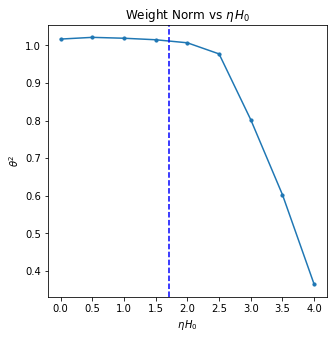

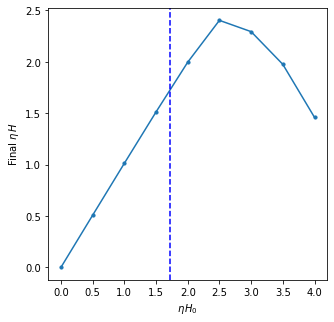

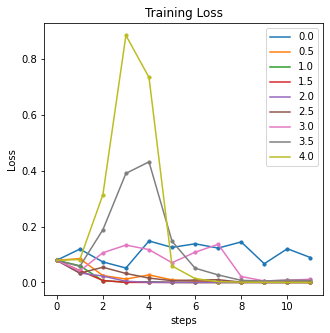

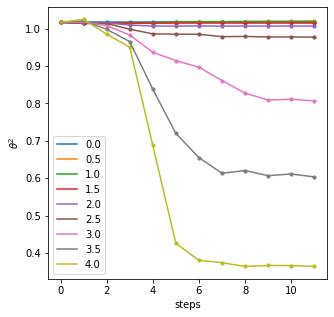

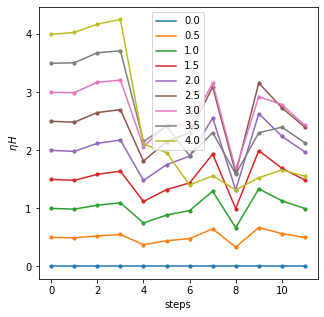

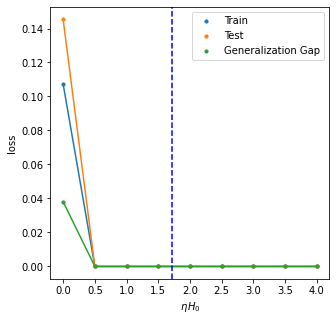

{'catapult_start': 2, 'upper_omega': 1.482435108242978, 'lower_omega': -6970176.20517088, 'upper': 1.717798876473591, 'lower': 76.90062876422112}


In [ ]:
model_dict={}
num_samps_train=32
num_samps_test=1000
model_dict['input_dim']=1
model_dict['hidden_dim']=500
model_dict['masks']=0
model_dict['act']='identity'

train_batch_size=16

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

### Tanh

computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.1
training already done
lr_ratio is 0.2
training already done
lr_ratio is 0.3
training already done
lr_ratio is 0.4
training already done
lr_ratio is 0.5
training already done
lr_ratio is 0.6
training already done
lr_ratio is 0.7
training already done
lr_ratio is 0.8
training already done
lr_ratio is 0.9
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.1
training already done
lr_ratio is 1.2
training already done
lr_ratio is 1.3
training already done
lr_ratio is 1.4
training already done
lr_ratio is 1.5
training already done
lr_ratio is 1.6
training already done
lr_ratio is 1.7
training already done
lr_ratio is 1.8
training already done
lr_ratio is 1.9
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.1
training already done
lr_ratio is 2.2
training already done
lr_ratio is 2.3
training already done
lr_ratio is 2.4
training already done
lr_rati

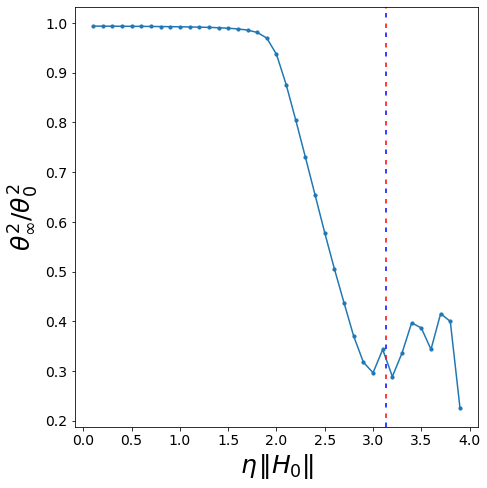

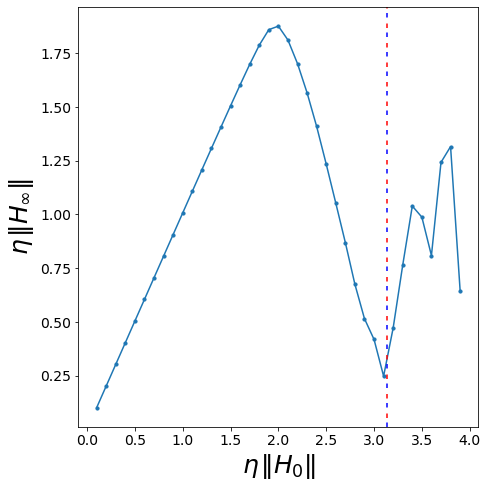

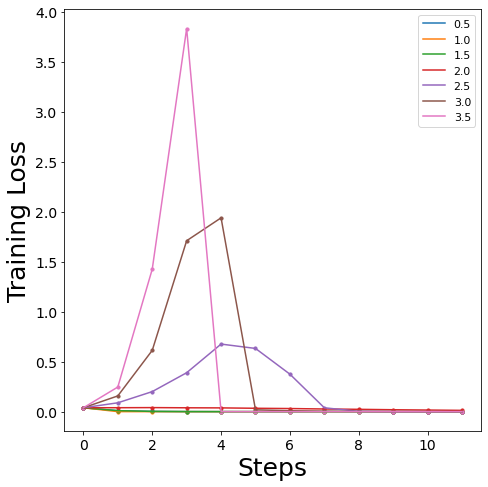

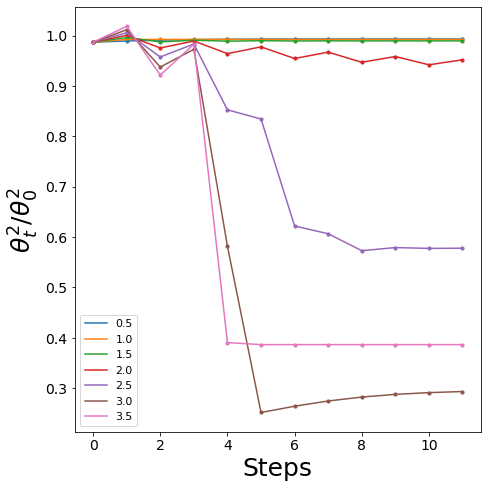

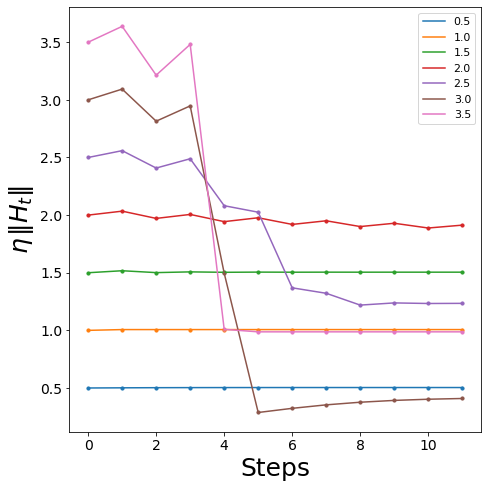

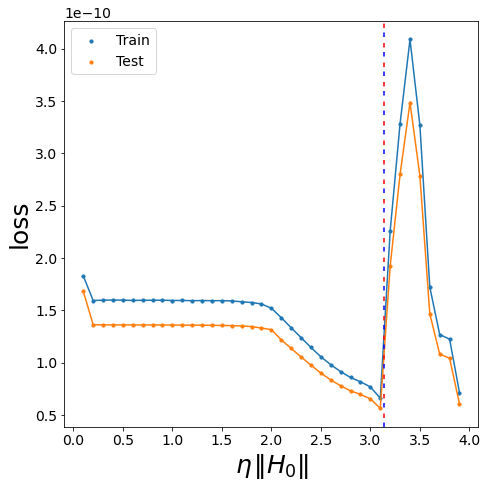

{'catapult_start': 2, 'upper_omega': 3.1362284763224704, 'lower_omega': -6230746.033843024, 'upper': 3.1355010982449705, 'lower': 79682.91111516458}


In [ ]:
model_dict={}
num_samps_train=32
num_samps_test=1000
model_dict['input_dim']=1
model_dict['hidden_dim']=500
model_dict['masks']=100

train_batch_size=32

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist
model_dict['act']='tanh'

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=list(map(lambda x: np.round(x,3),np.arange(.1,4+.1,.1)))
lr_ratios_plot=lr_ratios[4::5]
max_epochs=100
log_type='epoch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            include_gen_gap=False)

print(result['pred'])

In [ ]:
quadratic(**model_dict)(data['random_teacher','train'])

In [ ]:
model_dict={}
num_samps_train=32
num_samps_test=5000
model_dict['input_dim']=1
model_dict['hidden_dim']=200
model_dict['masks']=100

train_batch_size=num_samps_train

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist
model_dict['act']='tanh'

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=4*(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=list(map(lambda x: np.round(x,3),np.arange(.1,4+.1,.1)))
max_epochs=100
log_type='epoch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=10**10,
                overwrite=False,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed,
            include_gen_gap=False)

print(result['pred'])

Streaming output truncated to the last 5000 lines.
old_loss is 1.0793387295038315e-09.
loss_tot is 1.0793514970686147e-09.
difference is 1.27675647831893e-14
epoch: 266, batch/total: 0/1, loss: 1.079360933964324e-09, NTK: 1.1723021457732608
old_loss is 1.0793514970686147e-09.
loss_tot is 1.079360933964324e-09.
difference is 9.43689570931383e-15
epoch: 267, batch/total: 0/1, loss: 1.0795723204282126e-09, NTK: 1.172301646486841
old_loss is 1.079360933964324e-09.
loss_tot is 1.0795723204282126e-09.
difference is 2.113864638886298e-13
epoch: 268, batch/total: 0/1, loss: 1.0792866600439766e-09, NTK: 1.172301746344125
old_loss is 1.0795723204282126e-09.
loss_tot is 1.0792866600439766e-09.
difference is 2.856603842360528e-13
epoch: 269, batch/total: 0/1, loss: 1.079396683145717e-09, NTK: 1.1723030444888165
old_loss is 1.0792866600439766e-09.
loss_tot is 1.079396683145717e-09.
difference is 1.1002310174035301e-13
epoch: 270, batch/total: 0/1, loss: 1.079534239778468e-09, NTK: 1.172301646486841

<ipython-input-26-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


lr ratio is 0.5
loss: (2.4189401592877857e-09, 1.7659140212344937e-09)
lr ratio is 1.0
loss: (2.4081869831604763e-09, 1.7577101516508264e-09)
lr ratio is 1.5
loss: (2.3758641720661444e-09, 1.7334983795080917e-09)
lr ratio is 2.0
loss: (2.091502970813508e-09, 1.519842044217512e-09)
lr ratio is 2.5
loss: (1.0796875615781687e-09, 7.64639878525486e-10)
lr ratio is 3.0
loss: (6.091386284268197e-10, 4.2044305814670223e-10)
lr ratio is 3.5
loss: (7.135757540410737e-10, 5.241752774054476e-10)
lr ratio is 4.0
loss: (nan, nan)


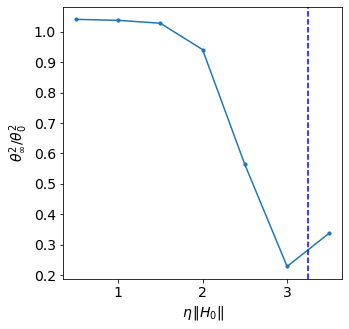

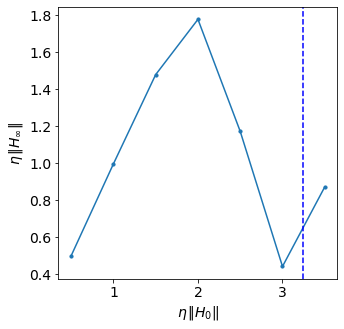

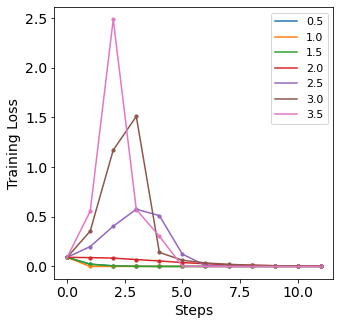

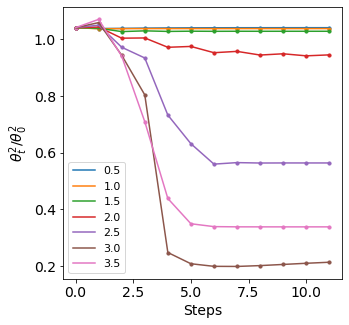

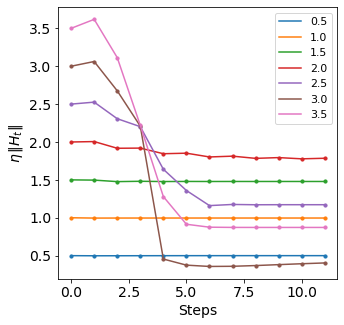

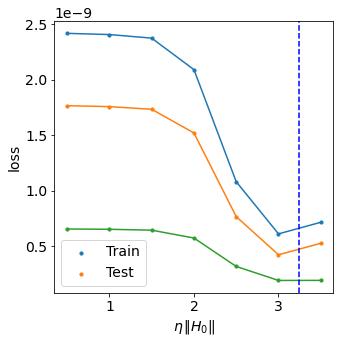

{'catapult_start': 2, 'upper_omega': 1.980216951933776, 'lower_omega': -7560975.775899863, 'upper': 3.246163985029705, 'lower': 64112.94542625943}


In [ ]:
model_dict={}
num_samps_train=32
num_samps_test=1000
model_dict['input_dim']=2
model_dict['hidden_dim']=500
model_dict['masks']=100

train_batch_size=32

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist
model_dict['act']='tanh'

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(.5,4+.5,.5)
max_epochs=500
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/    1]
lr_ratio is 0.5
seed is 123
initial max eigen 0.574928
epoch: 1, batch/total: 0/1, loss: 0.31495243310928345, NTK: 0.49676010769990453
old_loss is inf.
loss_tot is 0.31495243310928345.
difference is inf
saving_model
lr_ratio is 1.0
seed is 123
initial max eigen 0.574928
epoch: 1, batch/total: 0/1, loss: 0.31495243310928345, NTK: 0.988568263279427
old_loss is inf.
loss_tot is 0.31495243310928345.
difference is inf
saving_model
lr_ratio is 1.5
seed is 123
initial max eigen 0.574928
epoch: 1, batch/total: 0/1, loss: 0.31495243310928345, NTK: 1.4777159044385728
old_loss is inf.
loss_tot is 0.31495243310928345.
difference is inf
saving_model
lr_ratio is 2.0
seed is 123
initial max eigen 0.574928
epoch: 1, batch/total: 0/1, loss: 0.31495243310928345, NTK: 1.9664944688773465
old_loss is inf.
loss_tot is 0.31495243310928345.
difference is inf
saving_model
lr_ratio is 2.5
seed is 123
initial max eigen 0.574928
epoch: 1, batch/tot

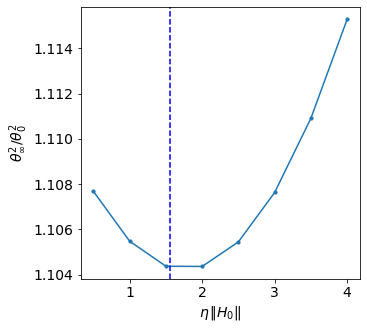

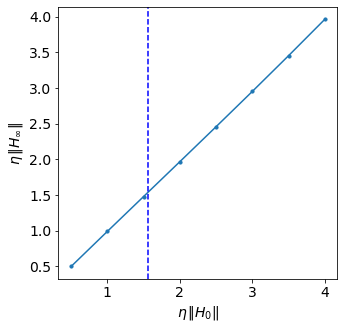

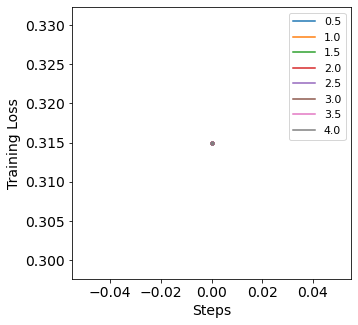

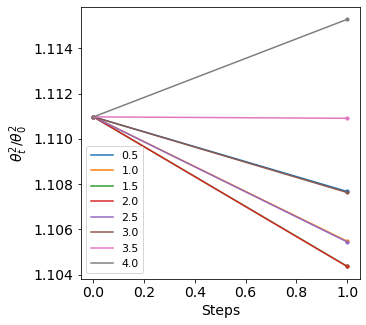

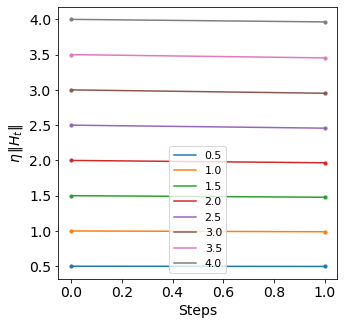

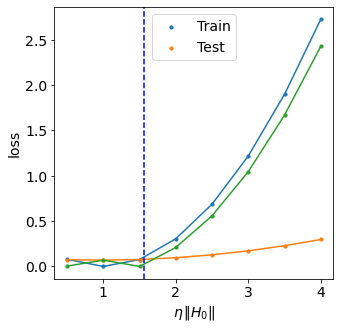

{'catapult_start': 2, 'upper_omega': 1.5618963312467908, 'lower_omega': 407276.6846900268, 'upper': 1.561913508408022, 'lower': 410616.9291551485}


In [ ]:
model_dict={}
num_samps_train=1
num_samps_test=1000
model_dict['input_dim']=4
model_dict['hidden_dim']=500
model_dict['masks']=0

train_batch_size=1

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist
model_dict['act']='tanh'

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=123

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','train']/=torch.sqrt(torch.sum(data['random_teacher','train']**2,dim=1,keepdim=True))

data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='linear'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(.5,4+.5,.5)
max_epochs=1
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=12,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

## Teacher Student: Exponential

computing averaged top eigenvalues and eigenvectors
[    0/    2]
lr_ratio is 0.0
seed is 120
initial max eigen 1.312727
epoch: 1, batch/total: 0/1, loss: 0.18275701999664307, NTK: 0.0
old_loss is inf.
loss_tot is 0.18275701999664307.
difference is inf
epoch: 2, batch/total: 0/1, loss: 0.18275701999664307, NTK: 0.0
old_loss is 0.18275701999664307.
loss_tot is 0.18275701999664307.
difference is 0.0
epoch: 3, batch/total: 0/1, loss: 0.18275701999664307, NTK: 0.0
old_loss is 0.18275701999664307.
loss_tot is 0.18275701999664307.
difference is 0.0
epoch: 4, batch/total: 0/1, loss: 0.18275701999664307, NTK: 0.0
old_loss is 0.18275701999664307.
loss_tot is 0.18275701999664307.
difference is 0.0
epoch: 5, batch/total: 0/1, loss: 0.18275701999664307, NTK: 0.0
old_loss is 0.18275701999664307.
loss_tot is 0.18275701999664307.
difference is 0.0
epoch: 6, batch/total: 0/1, loss: 0.18275701999664307, NTK: 0.0
old_loss is 0.18275701999664307.
loss_tot is 0.18275701999664307.
difference is 0.0
epoch: 

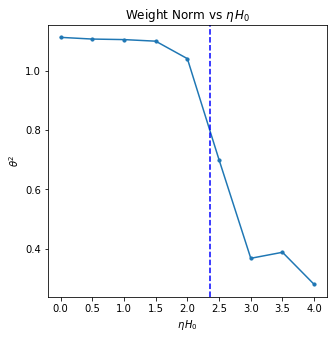

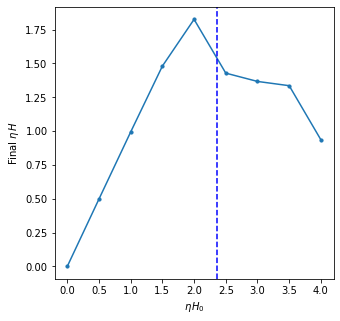

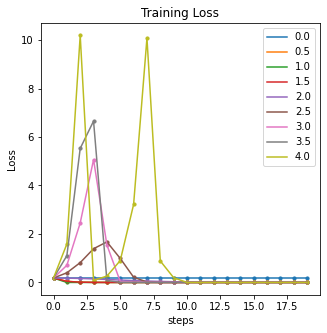

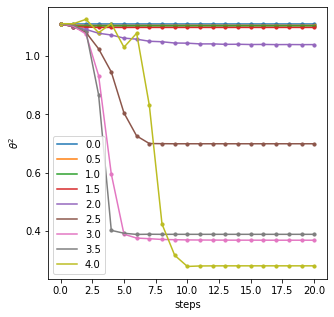

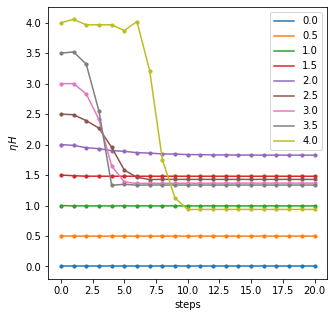

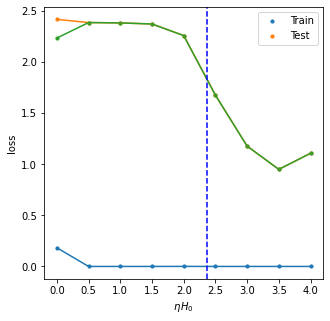

{'catapult_start': 2, 'upper_omega': 2.3613873659049323, 'lower_omega': -5527355.487272492, 'upper': 2.3631241090833193, 'lower': 14630.733244847823}


In [ ]:
model_dict={}
num_samps_train=2
num_samps_test=10
model_dict['input_dim']=100
model_dict['hidden_dim']=100
model_dict['masks']=0

train_batch_size=2

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='exp'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/    2]
lr_ratio is 0.0
seed is 120
initial max eigen 0.890279
epoch: 1, batch/total: 0/1, loss: 3.4078824520111084, NTK: 0.0
old_loss is inf.
loss_tot is 3.4078824520111084.
difference is inf
epoch: 2, batch/total: 0/1, loss: 3.4078824520111084, NTK: 0.0
old_loss is 3.4078824520111084.
loss_tot is 3.4078824520111084.
difference is 0.0
epoch: 3, batch/total: 0/1, loss: 3.4078824520111084, NTK: 0.0
old_loss is 3.4078824520111084.
loss_tot is 3.4078824520111084.
difference is 0.0
epoch: 4, batch/total: 0/1, loss: 3.4078824520111084, NTK: 0.0
old_loss is 3.4078824520111084.
loss_tot is 3.4078824520111084.
difference is 0.0
epoch: 5, batch/total: 0/1, loss: 3.4078824520111084, NTK: 0.0
old_loss is 3.4078824520111084.
loss_tot is 3.4078824520111084.
difference is 0.0
epoch: 6, batch/total: 0/1, loss: 3.4078824520111084, NTK: 0.0
old_loss is 3.4078824520111084.
loss_tot is 3.4078824520111084.
difference is 0.0
epoch: 7, batch/total: 0

<ipython-input-32-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


loss: (3.4078824520111084, 1.0693767547607422)
lr ratio is 0.5
loss: (8.848033417052648e-11, 1.0062419891357421)
lr ratio is 1.0
loss: (2.220446049250313e-16, 0.9850811958312988)
lr ratio is 1.5
loss: (2.220446049250313e-16, 0.9360051155090332)
lr ratio is 2.0
loss: (2.220446049250313e-16, 0.8194316864013672)
lr ratio is 2.5
loss: (2.220446049250313e-16, 0.7307577133178711)
lr ratio is 3.0
loss: (2.220446049250313e-16, 0.6924330234527588)
lr ratio is 3.5
loss: (2.220446049250313e-16, 0.6495119094848634)
lr ratio is 4.0
loss: (nan, nan)


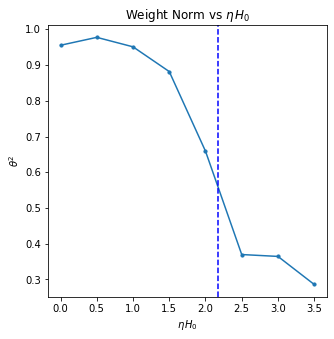

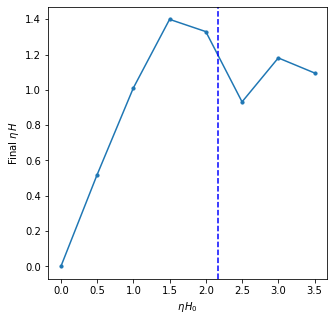

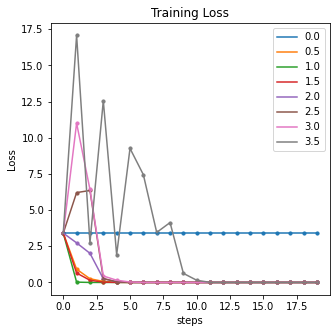

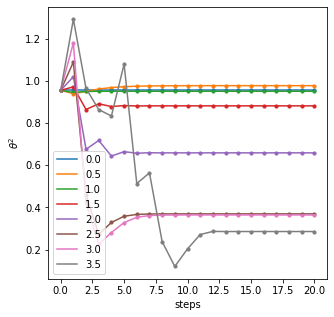

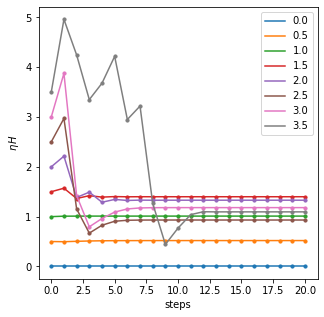

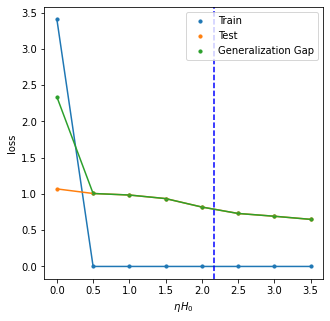

{'catapult_start': 2, 'upper_omega': 1.8634149197784833, 'lower_omega': -3360694.705048214, 'upper': 2.1729474784924534, 'lower': 4622.064435858395}


In [ ]:
model_dict={}
num_samps_train=2
num_samps_test=10
model_dict['input_dim']=200
model_dict['hidden_dim']=200
model_dict['masks']=25

train_batch_size=2

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='exp'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/    1]
lr_ratio is 0.0
seed is 120
initial max eigen 1.379921
epoch: 1, batch/total: 0/1, loss: 0.0994926318526268, NTK: 0.0
old_loss is inf.
loss_tot is 0.0994926318526268.
difference is inf
epoch: 2, batch/total: 0/1, loss: 0.0994926318526268, NTK: 0.0
old_loss is 0.0994926318526268.
loss_tot is 0.0994926318526268.
difference is 0.0
epoch: 3, batch/total: 0/1, loss: 0.0994926318526268, NTK: 0.0
old_loss is 0.0994926318526268.
loss_tot is 0.0994926318526268.
difference is 0.0
epoch: 4, batch/total: 0/1, loss: 0.0994926318526268, NTK: 0.0
old_loss is 0.0994926318526268.
loss_tot is 0.0994926318526268.
difference is 0.0
epoch: 5, batch/total: 0/1, loss: 0.0994926318526268, NTK: 0.0
old_loss is 0.0994926318526268.
loss_tot is 0.0994926318526268.
difference is 0.0
epoch: 6, batch/total: 0/1, loss: 0.0994926318526268, NTK: 0.0
old_loss is 0.0994926318526268.
loss_tot is 0.0994926318526268.
difference is 0.0
epoch: 7, batch/total: 0

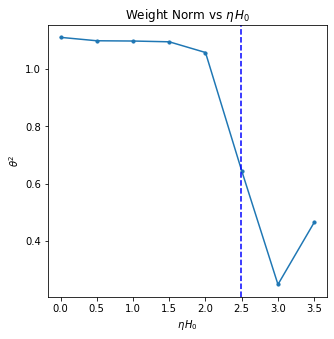

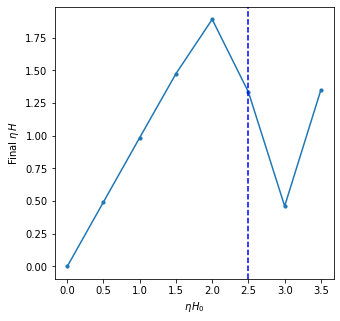

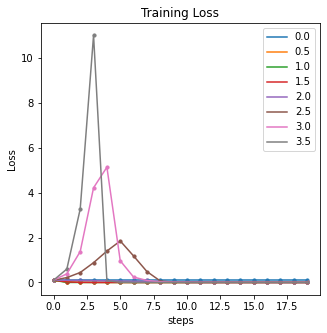

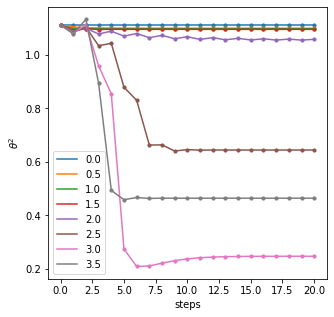

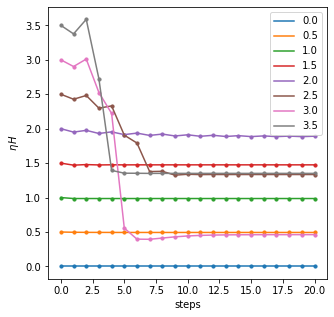

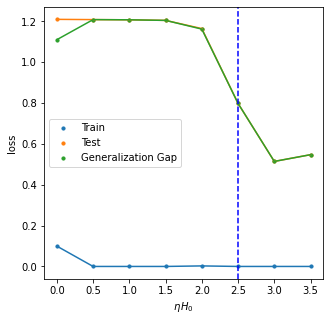

{'catapult_start': 2, 'upper_omega': 2.4932315614929808, 'lower_omega': 9.847485006506407, 'upper': 2.4932266175825615, 'lower': 9.847489190192027}


In [ ]:
model_dict={}
num_samps_train=1
num_samps_test=10
model_dict['input_dim']=100
model_dict['hidden_dim']=100
model_dict['masks']=0

train_batch_size=1

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.5,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='exp'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/   64]
lr_ratio is 0.0
seed is 120
initial max eigen 0.102360
epoch: 1, batch/total: 0/1, loss: 0.7059705853462219, NTK: 0.0
old_loss is inf.
loss_tot is 0.7059705853462219.
difference is inf
epoch: 2, batch/total: 0/1, loss: 0.7059705257415771, NTK: 0.0
old_loss is 0.7059705853462219.
loss_tot is 0.7059705257415771.
difference is 5.960464477539063e-08
epoch: 3, batch/total: 0/1, loss: 0.7059705257415771, NTK: 0.0
old_loss is 0.7059705257415771.
loss_tot is 0.7059705257415771.
difference is 0.0
epoch: 4, batch/total: 0/1, loss: 0.7059705257415771, NTK: 0.0
old_loss is 0.7059705257415771.
loss_tot is 0.7059705257415771.
difference is 0.0
epoch: 5, batch/total: 0/1, loss: 0.7059705853462219, NTK: 0.0
old_loss is 0.7059705257415771.
loss_tot is 0.7059705853462219.
difference is 5.960464477539063e-08
epoch: 6, batch/total: 0/1, loss: 0.7059705257415771, NTK: 0.0
old_loss is 0.7059705853462219.
loss_tot is 0.7059705257415771.
differ

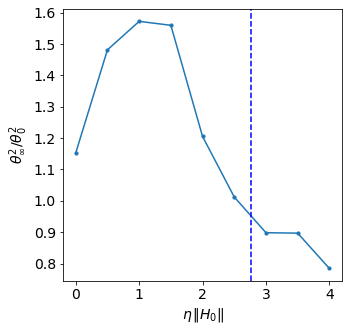

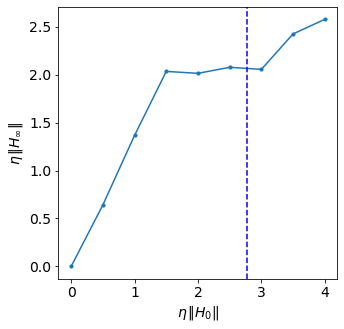

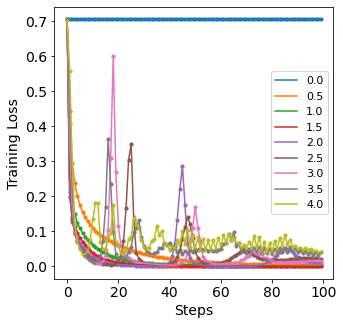

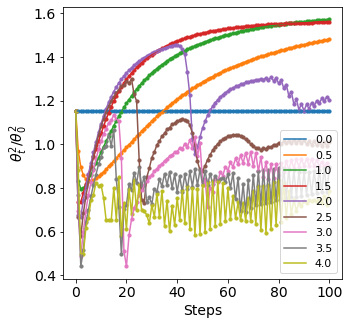

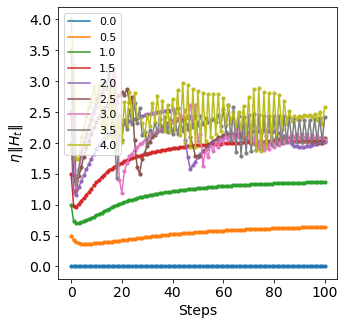

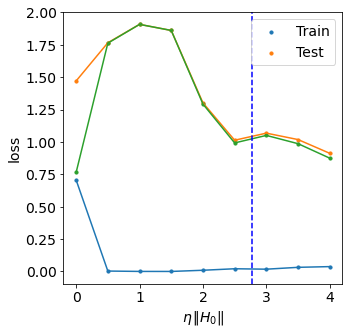

{'catapult_start': 2, 'upper_omega': 0.18493131458319914, 'lower_omega': -495454.0995437572, 'upper': 2.77019734801353, 'lower': 45305.86233808131}


In [ ]:
model_dict={}
num_samps_train=64
num_samps_test=32
model_dict['input_dim']=100
model_dict['hidden_dim']=100
model_dict['masks']=10

train_batch_size=64

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','train']/=torch.sqrt(torch.sum(data['random_teacher','train']**2,dim=1,keepdim=True))

data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='exp'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=100
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/    2]
lr_ratio is 0.0
seed is 120
initial max eigen 0.860261
epoch: 1, batch/total: 0/1, loss: 0.08332756906747818, NTK: 0.0
old_loss is inf.
loss_tot is 0.08332756906747818.
difference is inf
epoch: 2, batch/total: 0/1, loss: 0.08332756906747818, NTK: 0.0
old_loss is 0.08332756906747818.
loss_tot is 0.08332756906747818.
difference is 0.0
epoch: 3, batch/total: 0/1, loss: 0.08332756906747818, NTK: 0.0
old_loss is 0.08332756906747818.
loss_tot is 0.08332756906747818.
difference is 0.0
epoch: 4, batch/total: 0/1, loss: 0.08332756906747818, NTK: 0.0
old_loss is 0.08332756906747818.
loss_tot is 0.08332756906747818.
difference is 0.0
epoch: 5, batch/total: 0/1, loss: 0.08332756906747818, NTK: 0.0
old_loss is 0.08332756906747818.
loss_tot is 0.08332756906747818.
difference is 0.0
epoch: 6, batch/total: 0/1, loss: 0.08332756906747818, NTK: 0.0
old_loss is 0.08332756906747818.
loss_tot is 0.08332756906747818.
difference is 0.0
epoch: 

<ipython-input-32-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


loss: (0.08332756906747818, 1.3824104309082033)
lr ratio is 0.5
loss: (3.0302360620737545e-10, 1.3584102630615236)
lr ratio is 1.0
loss: (1.1102230246251565e-15, 1.3569198608398438)
lr ratio is 1.5
loss: (2.5757174171303632e-14, 1.3526126861572267)
lr ratio is 2.0
loss: (0.0007772146491333842, 1.301963233947754)
lr ratio is 2.5
loss: (7.194245199571014e-13, 0.9535311698913574)
lr ratio is 3.0
loss: (6.024557741568515e-09, 0.6686248779296875)
lr ratio is 3.5
loss: (0.0, 0.4790947437286377)
lr ratio is 4.0
loss: (nan, nan)


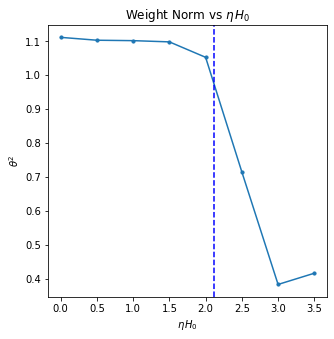

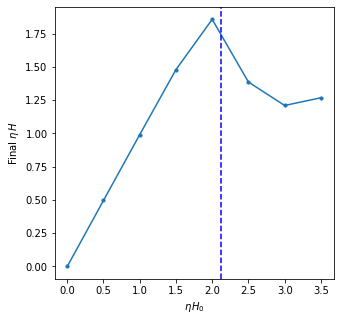

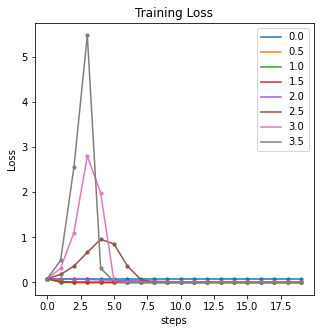

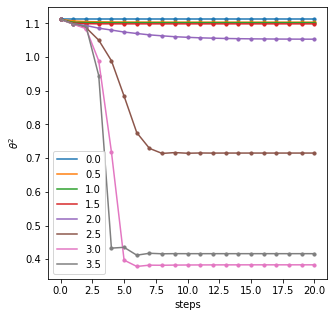

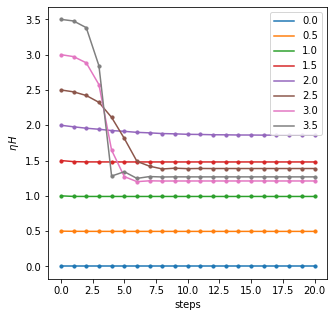

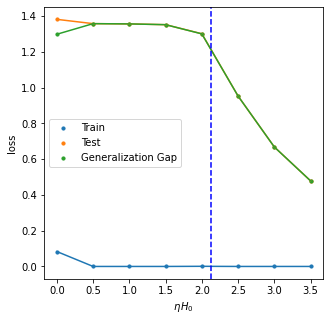

{'catapult_start': 2, 'upper_omega': 1.7237550845203178, 'lower_omega': -6691861.459268238, 'upper': 2.119852359496977, 'lower': 887.4646262811912}


In [ ]:
model_dict={}
num_samps_train=2
num_samps_test=10
model_dict['input_dim']=100
model_dict['hidden_dim']=100
model_dict['masks']=0

train_batch_size=2

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.5,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='exp'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

computing averaged top eigenvalues and eigenvectors
[    0/    1]
lr_ratio is 0.0
seed is 120
initial max eigen 1.095832
epoch: 1, batch/total: 0/1, loss: 4.086554527282715, NTK: 0.0
old_loss is inf.
loss_tot is 4.086554527282715.
difference is inf
epoch: 2, batch/total: 0/1, loss: 4.086554527282715, NTK: 0.0
old_loss is 4.086554527282715.
loss_tot is 4.086554527282715.
difference is 0.0
epoch: 3, batch/total: 0/1, loss: 4.086554527282715, NTK: 0.0
old_loss is 4.086554527282715.
loss_tot is 4.086554527282715.
difference is 0.0
epoch: 4, batch/total: 0/1, loss: 4.086554527282715, NTK: 0.0
old_loss is 4.086554527282715.
loss_tot is 4.086554527282715.
difference is 0.0
epoch: 5, batch/total: 0/1, loss: 4.086554527282715, NTK: 0.0
old_loss is 4.086554527282715.
loss_tot is 4.086554527282715.
difference is 0.0
epoch: 6, batch/total: 0/1, loss: 4.086554527282715, NTK: 0.0
old_loss is 4.086554527282715.
loss_tot is 4.086554527282715.
difference is 0.0
epoch: 7, batch/total: 0/1, loss: 4.08655

<ipython-input-32-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


loss: (4.086554527282715, 0.6630216121673584)
lr ratio is 0.5
loss: (3.75877107217093e-12, 0.6427209854125977)
lr ratio is 1.0
loss: (7.105427357601002e-15, 0.6293622016906739)
lr ratio is 1.5
loss: (7.105427357601002e-15, 0.5968093872070312)
lr ratio is 2.0
loss: (7.105427357601002e-15, 0.515906047821045)
lr ratio is 2.5
loss: (7.105427357601002e-15, 0.43668384552001954)
lr ratio is 3.0
loss: (7.105427357601002e-15, 0.3990739583969116)
lr ratio is 3.5
loss: (2.842170943040401e-14, 0.36380815505981445)
lr ratio is 4.0
loss: (nan, nan)


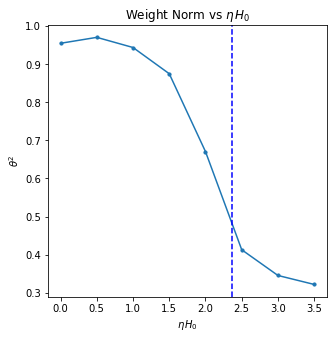

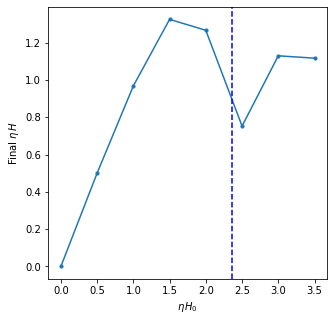

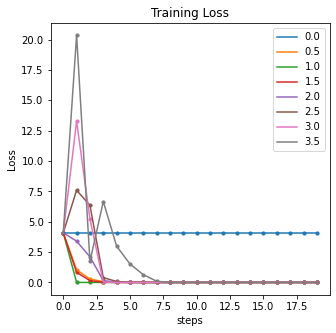

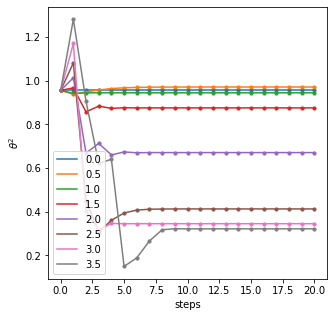

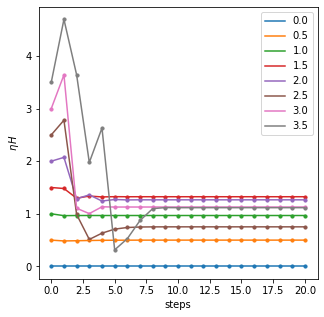

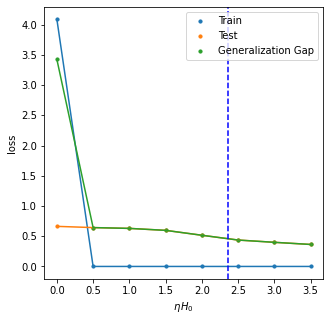

{'catapult_start': 2, 'upper_omega': 2.364559056280237, 'lower_omega': 6349809.3621466, 'upper': 2.3645469790864615, 'lower': 5361010.133210645}


In [ ]:
model_dict={}
num_samps_train=1
num_samps_test=10
model_dict['input_dim']=200
model_dict['hidden_dim']=200
model_dict['masks']=25

train_batch_size=1

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.5,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

seed=120

torch.manual_seed(seed)

#data['random_teacher','train']=torch.randn((num_samps_train,model_dict['input_dim']))
#data['random_teacher','test']=torch.randn((num_samps_test,model_dict['input_dim']))

data['random_teacher','train']=(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

model_dict['meta_type']='exp'
model_dict['slope']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(0,4+.5,.5)
max_epochs=20
log_type='batch'
stop_criterion=0



result = full_training_loop(
    arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=1,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios[:],
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True,
            seed=seed)

print(result['pred'])

## MNIST 01

In [ ]:
arch='quadratic'
model_dict={}

model_dict['pool_dict']={}
model_dict['pool_dict']['kernel_size']=7
model_dict['pool_dict']['stride']=7

model_dict['meta_type']='linear'

model_dict['input_dim']=int((28/7)**2)
model_dict['hidden_dim']=100
#model_dict['neg_slope']=1

model_dict['eval_dist']={}
model_dict['eval_dist']['dist']='uniform'
model_dict['eval_dist']['params']=(1,1)

model_dict['matrix_dist']={}
model_dict['matrix_dist']['dist']='normal'
model_dict['matrix_dist']['params']=(0,1)

dataset_name='MNIST01'
train_batch_size=1

#lr_ratios=np.arange(.5,4.5,.5)
lr_ratios=[.5]
max_epochs=1
log_type='batch'
stop_criterion=.001

result_dict = full_training_loop(arch,model_dict,
           lr_ratios,dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=1,
           verbose=True,
           write_file=False,
           overwrite=False,
           method='quadratic_model',
           single_batch=True,
           seed=123)

result_dict['pred']


Streaming output truncated to the last 5000 lines.
[ 7672/12665]
[ 7673/12665]
[ 7674/12665]
[ 7675/12665]
[ 7676/12665]
[ 7677/12665]
[ 7678/12665]
[ 7679/12665]
[ 7680/12665]
[ 7681/12665]
[ 7682/12665]
[ 7683/12665]
[ 7684/12665]
[ 7685/12665]
[ 7686/12665]
[ 7687/12665]
[ 7688/12665]
[ 7689/12665]
[ 7690/12665]
[ 7691/12665]
[ 7692/12665]
[ 7693/12665]
[ 7694/12665]
[ 7695/12665]
[ 7696/12665]
[ 7697/12665]
[ 7698/12665]
[ 7699/12665]
[ 7700/12665]
[ 7701/12665]
[ 7702/12665]
[ 7703/12665]
[ 7704/12665]
[ 7705/12665]
[ 7706/12665]
[ 7707/12665]
[ 7708/12665]
[ 7709/12665]
[ 7710/12665]
[ 7711/12665]
[ 7712/12665]
[ 7713/12665]
[ 7714/12665]
[ 7715/12665]
[ 7716/12665]
[ 7717/12665]
[ 7718/12665]
[ 7719/12665]
[ 7720/12665]
[ 7721/12665]
[ 7722/12665]
[ 7723/12665]
[ 7724/12665]
[ 7725/12665]
[ 7726/12665]
[ 7727/12665]
[ 7728/12665]
[ 7729/12665]
[ 7730/12665]
[ 7731/12665]
[ 7732/12665]
[ 7733/12665]
[ 7734/12665]
[ 7735/12665]
[ 7736/12665]
[ 7737/12665]
[ 7738/12665]
[ 7739/1266

{'catapult_start': 2,
 'upper_omega': 1.2622827376517927,
 'lower_omega': 33115.24853568973,
 'upper': 1.2622772645612048,
 'lower': 33115.111685231706}

In [ ]:
result_dict['pred']

{'catapult_start': 2,
 'upper_omega': 0.8841123662537859,
 'lower_omega': -9431544.052304681,
 'upper': 0.9571368959695629,
 'lower': 25563.581941277494}

In [ ]:
result_dict[1]['lower']

1645808.602904138

# Quadratic with Bias

## Toy Dataset

computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.1
training already done
lr_ratio is 0.2
training already done
lr_ratio is 0.3
training already done
lr_ratio is 0.4
training already done
lr_ratio is 0.5
training already done
lr_ratio is 0.6
training already done
lr_ratio is 0.7
training already done
lr_ratio is 0.8
training already done
lr_ratio is 0.9
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.1
training already done
lr_ratio is 1.2
training already done
lr_ratio is 1.3
training already done
lr_ratio is 1.4
training already done
lr_ratio is 1.5
training already done
lr_ratio is 1.6
training already done
lr_ratio is 1.7
training already done
lr_ratio is 1.8
training already done
lr_ratio is 1.9
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.1
training already done
lr_ratio is 2.2
training already done
lr_ratio is 2.3
training already done
lr_ratio is 2.4
training already done
lr_rati

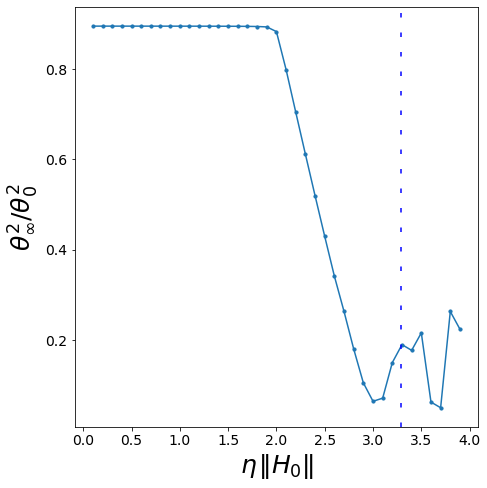

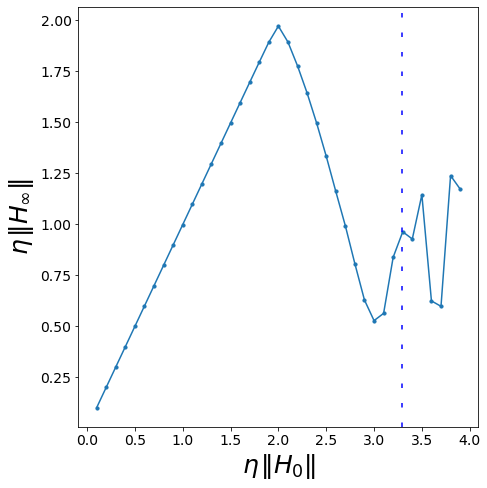

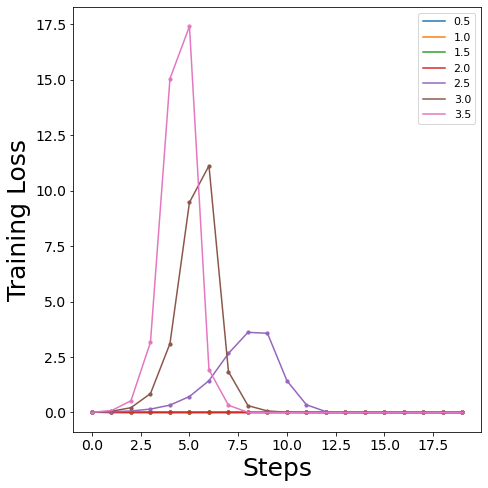

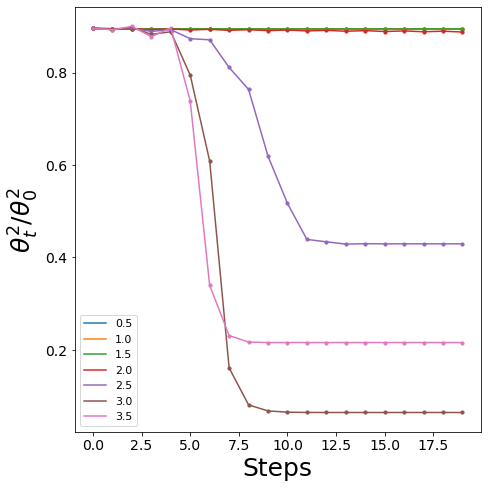

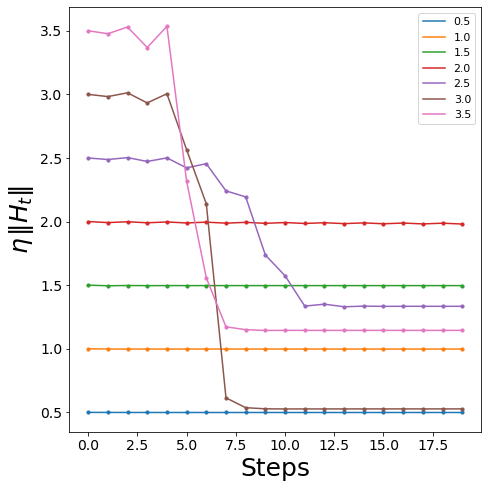

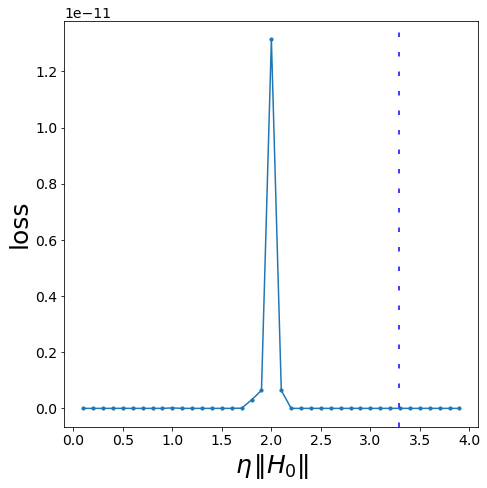

In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['fdim']=10
model_dict['slp']=1
model_dict['mdim']=100
train_batch_size=1
seed=123

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
dataset_name='toy_example'

arch='qbias'

lr_ratios=list(map(lambda x: np.round(x,2),list(np.arange(0.1,4+.1,.1))))
lr_ratios_plot=lr_ratios[4::5]

max_epochs=1000
log_type='epoch'
stop_criterion=0

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=100,
    verbose=True,
    write_file=True,
    overwrite=False,
    seed=seed,
    method='quadratic_model_with_bias')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    size=(7,7),
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True)

In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['feat_hidden_dim']=100
model_dict['negative_slope']=1
model_dict['meta_hidden_dim']=1000
train_batch_size=1
seed=123

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
dataset_name='toy_example'

arch='qbias'

lr_ratios=list(map(lambda x: np.round(x,2),list(np.arange(0.1,4+.1,.1))))
lr_ratios_plot=lr_ratios[4::5]

max_epochs=100
log_type='epoch'
stop_criterion=0

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=100,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model_with_bias')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed)



plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

TypeError: ignored

In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['feat_hidden_dim']=100
model_dict['negative_slope']=1
model_dict['meta_hidden_dim']=100
train_batch_size=1
seed=123

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,2)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
dataset_name='toy_example'

arch='qbias'

lr_ratios=list(map(lambda x: np.round(x,2),list(np.arange(0.1,4+.1,.1))))
lr_ratios_plot=lr_ratios[4::5]

max_epochs=100
log_type='epoch'
stop_criterion=0

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=100,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model_with_bias')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed)



plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

TypeError: ignored

## Random

computing averaged top eigenvalues and eigenvectors
[    0/  128]
lr_ratio is 0.5
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 1.0
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 1.5
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 2.0
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 2.5
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 3.0
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 3.5
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 4.0
seed is 123
initial max eigen 0.187615
saving_model
lr_ratio is 4.5
seed is 123
initial max eigen 0.187615


<ipython-input-65-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


saving_model
lr_ratio is 5.0
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 5.5
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 6.0
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 6.5
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 7.0
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 7.5
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 8.0
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 8.5
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 9.0
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 9.5
seed is 123
initial max eigen 0.187615
model diverges
lr_ratio is 10.0
seed is 123
initial max eigen 0.187615
model diverges
overlap is 1.2326641082763672
feat_norm is 0.028540030121803284
init_weight_norm is 1.9710782909393312
top_eval is 0.1876147985458374
lr ratio is 0.5
loss: (0.5353543758392334, 0.41617321968078613)
lr ratio is 1.0
lo

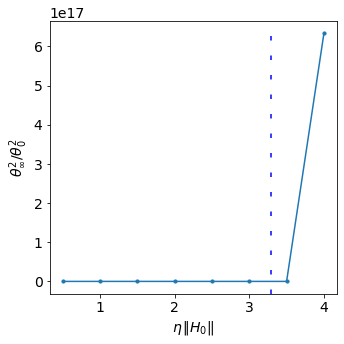

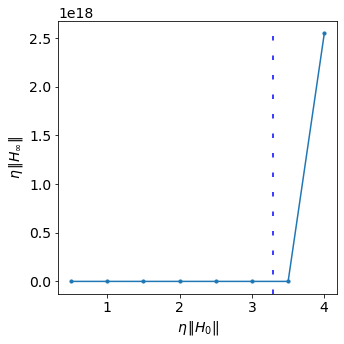

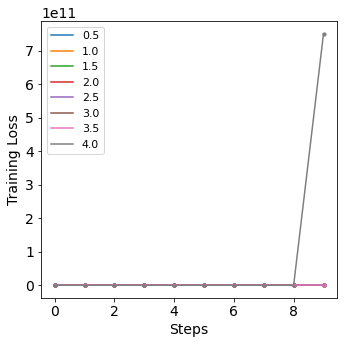

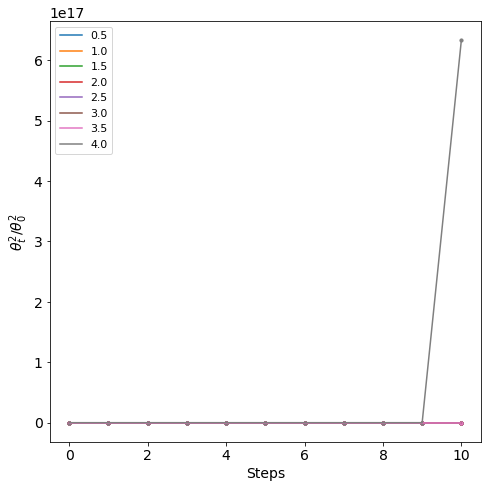

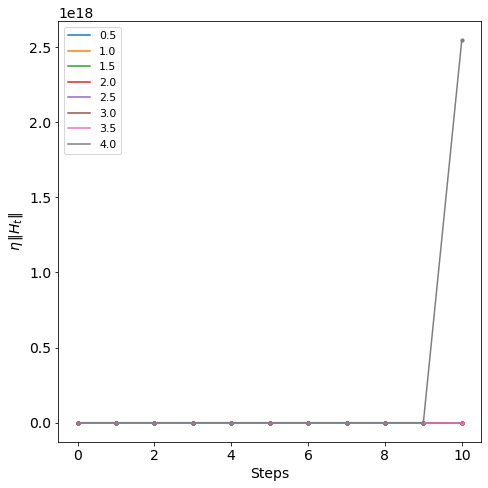

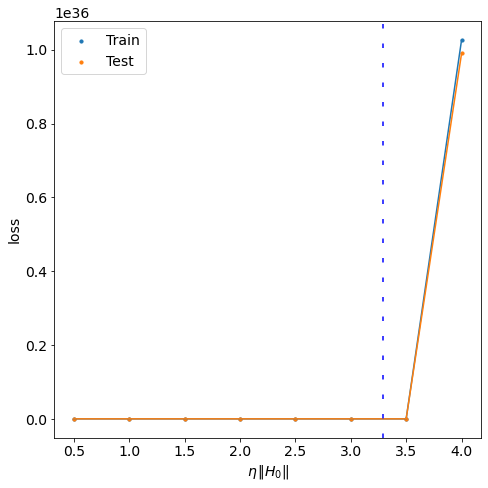

In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['feat_hidden_dim']=10
model_dict['negative_slope']=1
model_dict['meta_hidden_dim']=100

num_train_samps=128
num_test_samps=128
train_batch_size=num_train_samps

seed=123

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
dataset_name='random'

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)

#X_train=torch.tensor([[20]])
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

arch='qbias'

lr_ratios=np.arange(.5,10+.5,.5)
max_epochs=10
log_type='epoch'
stop_criterion=0

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10**10,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model_with_bias')


train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            include_gen_gap=False)

In [ ]:
model_dict={}
model_dict['input_dim']=1
model_dict['feat_hidden_dim']=100
model_dict['negative_slope']=1
model_dict['meta_hidden_dim']=100

num_train_samps=32
num_test_samps=32
train_batch_size=num_train_samps

seed=123

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,2)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
dataset_name='random'

X_train=(torch.rand((num_train_samps,model_dict['input_dim']))-1/2)

#X_train=torch.tensor([[20]])
y_train=torch.randn((num_train_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=(torch.rand((num_test_samps,model_dict['input_dim']))-1/2)
y_test=torch.randn((num_test_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

arch='qbias'

lr_ratios=np.arange(.5,10+.5,.5)
max_epochs=10
log_type='epoch'
stop_criterion=0

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=10**10,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model_with_bias')


train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            include_gen_gap=False)

## Teacher-Student

computing averaged top eigenvalues and eigenvectors
[    0/   32]
lr_ratio is 0.1
seed is 123
initial max eigen 0.444074
epoch: 250, batch/total: 0/1, loss: 0.00010989118891302496, NTK: 0.10023266765557187
old_loss is 0.00011322958016535267.
loss_tot is 0.00010989118891302496.
difference is 3.3383912523277104e-06
epoch: 500, batch/total: 0/1, loss: 6.181481637668185e-08, NTK: 0.10024429130723332
old_loss is 6.368792071498319e-08.
loss_tot is 6.181481637668185e-08.
difference is 1.8731043383013457e-09
epoch: 750, batch/total: 0/1, loss: 7.435456417237418e-11, NTK: 0.10024470739638056
old_loss is 7.54764306609701e-11.
loss_tot is 7.435456417237418e-11.
difference is 1.1218664885959129e-12
epoch: 1000, batch/total: 0/1, loss: 3.9105697846597565e-11, NTK: 0.10024464699634306
old_loss is 3.9105697846597565e-11.
loss_tot is 3.9105697846597565e-11.
difference is 0.0
saving_model
lr_ratio is 0.2
seed is 123
initial max eigen 0.444074
epoch: 250, batch/total: 0/1, loss: 5.6901054534819195e-08, 

<ipython-input-26-e40fbbbf3b4a>:18: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


model diverges
lr_ratio is 3.9
seed is 123
initial max eigen 0.444074
epoch: 250, batch/total: 0/1, loss: 1.540904150942879e-07, NTK: 1.3158027269006265
old_loss is 1.5409176512548584e-07.
loss_tot is 1.540904150942879e-07.
difference is 1.3500311979441904e-12
epoch: 500, batch/total: 0/1, loss: 1.539655443139054e-07, NTK: 1.315803512101114
old_loss is 1.5396669539313734e-07.
loss_tot is 1.539655443139054e-07.
difference is 1.1510792319313623e-12
epoch: 750, batch/total: 0/1, loss: 1.5384259199890948e-07, NTK: 1.315803642967862
old_loss is 1.5384182461275486e-07.
loss_tot is 1.5384259199890948e-07.
difference is 7.673861546209082e-13
epoch: 1000, batch/total: 0/1, loss: 1.53722112372634e-07, NTK: 1.3158044281683494
old_loss is 1.5371975337075128e-07.
loss_tot is 1.53722112372634e-07.
difference is 2.3590018827235326e-12
saving_model
lr_ratio is 4.0
seed is 123
initial max eigen 0.444074
model diverges
overlap is 0.3840760588645935
feat_norm is 0.06464237719774246
init_weight_norm is 2.

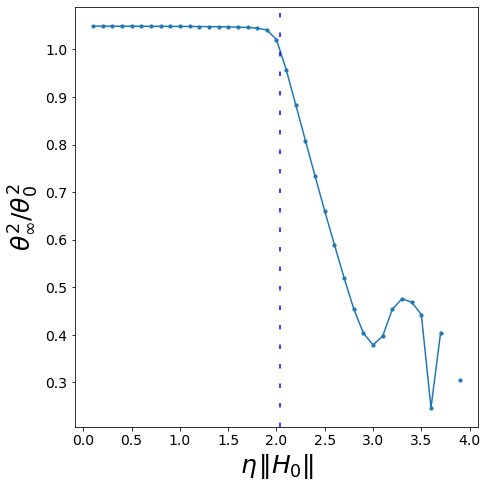

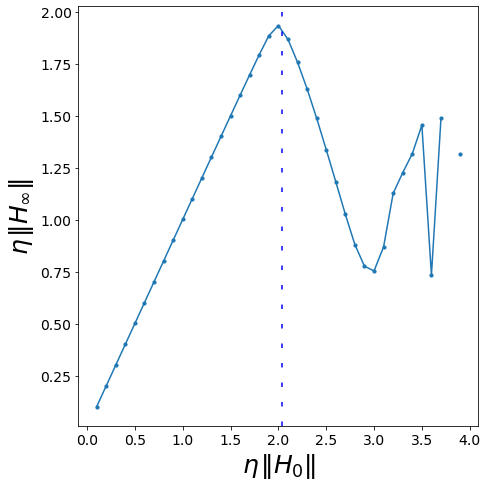

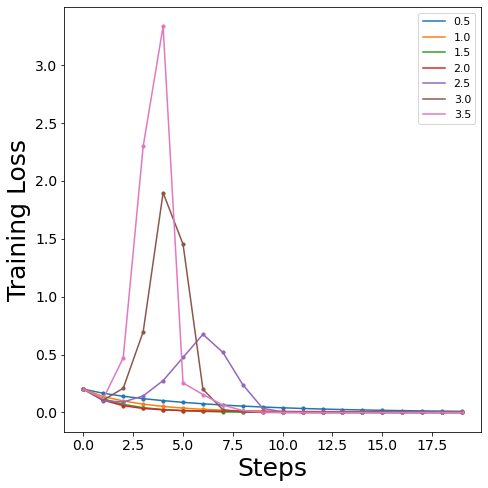

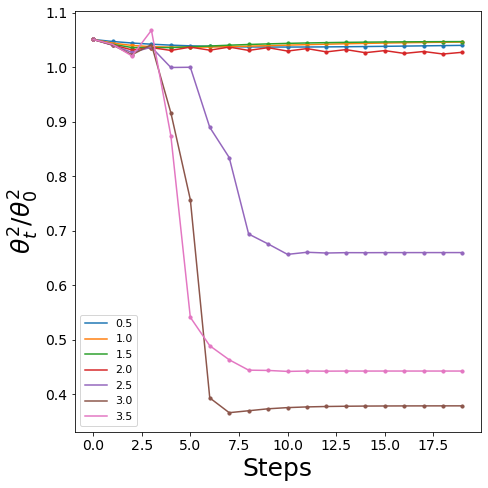

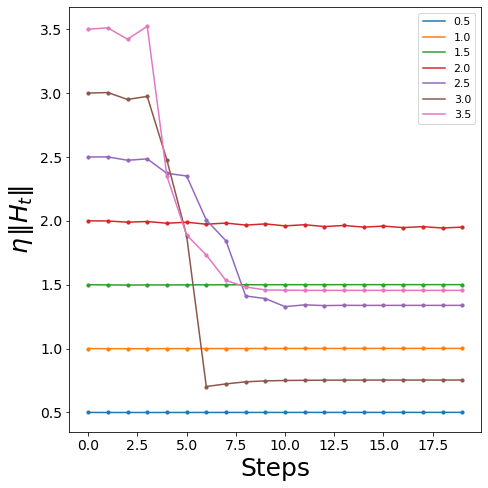

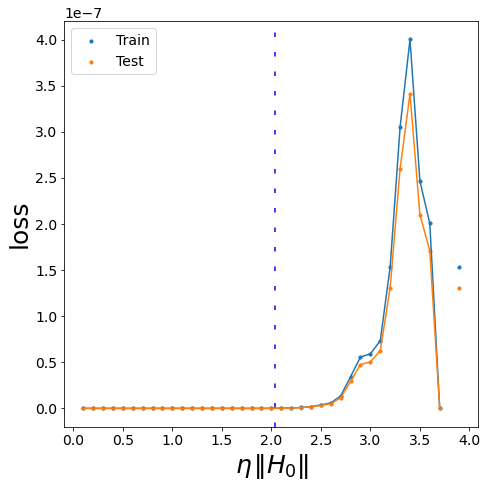

In [ ]:
model_dict={}
model_dict['input_dim']=1

model_dict['fdim']=20
model_dict['slp']=0
model_dict['mfeats']=10

model_dict['mdim']=200
model_dict['masks_mf']=100
model_dict['act']='tanh'

seed=123

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
dataset_name='random_teacher'

num_samps_train=32
num_samps_test=2000

train_batch_size=num_samps_train

data['random_teacher','train']=2*(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=2*(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

arch='qbias'

lr_ratios=list(map(lambda x: np.round(x,3),np.arange(.1,4+.1,.1)))
lr_ratios_plot=lr_ratios[4::5]
max_epochs=1000
log_type='epoch'
stop_criterion=0

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=250,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model_with_bias')


train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            include_gen_gap=False)

computing averaged top eigenvalues and eigenvectors
[    0/   32]
lr_ratio is 0.1
seed is 123
initial max eigen 0.600420
epoch: 250, batch/total: 0/1, loss: 0.0007022214122116566, NTK: 0.10020210707972395
old_loss is 0.0007180962711572647.
loss_tot is 0.0007022214122116566.
difference is 1.587485894560814e-05
epoch: 500, batch/total: 0/1, loss: 2.8433594252419425e-06, NTK: 0.10022874165386311
old_loss is 2.902645974245388e-06.
loss_tot is 2.8433594252419425e-06.
difference is 5.9286549003445543e-08
epoch: 750, batch/total: 0/1, loss: 2.3277375760244468e-07, NTK: 0.10023031014537037
old_loss is 2.3300412976823281e-07.
loss_tot is 2.3277375760244468e-07.
difference is 2.3037216578813968e-10
epoch: 1000, batch/total: 0/1, loss: 2.2301654212242283e-07, NTK: 0.10023037963550045
old_loss is 2.230296871630344e-07.
loss_tot is 2.2301654212242283e-07.
difference is 1.3145040611561853e-11
saving_model
lr_ratio is 0.2
seed is 123
initial max eigen 0.600420
epoch: 250, batch/total: 0/1, loss: 2.73

<ipython-input-26-e40fbbbf3b4a>:18: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


loss: (2.2302943136764952e-07, 2.478985115885735e-07)
lr ratio is 0.2
loss: (2.229567712674907e-07, 2.4913236848078667e-07)
lr ratio is 0.3
loss: (2.228951672123003e-07, 2.491201739758253e-07)
lr ratio is 0.4
loss: (2.228340321153155e-07, 2.4907139595597983e-07)
lr ratio is 0.5
loss: (2.2276478262028832e-07, 2.4900774587877096e-07)
lr ratio is 0.6
loss: (2.227142061883569e-07, 2.4895305978134273e-07)
lr ratio is 0.7
loss: (2.226642692448877e-07, 2.4890468921512363e-07)
lr ratio is 0.8
loss: (2.226177286956954e-07, 2.488379832357168e-07)
lr ratio is 0.9
loss: (2.225599615712781e-07, 2.4879319244064393e-07)
lr ratio is 1.0
loss: (2.225085324880638e-07, 2.4872121866792443e-07)
lr ratio is 1.1
loss: (2.2244242359192867e-07, 2.486501762177795e-07)
lr ratio is 1.2
loss: (2.2238548069708486e-07, 2.485769509803504e-07)
lr ratio is 1.3
loss: (2.2228711316074623e-07, 2.484913566149771e-07)
lr ratio is 1.4
loss: (2.2221375672870636e-07, 2.483975258655846e-07)
lr ratio is 1.5
loss: (2.221522237277

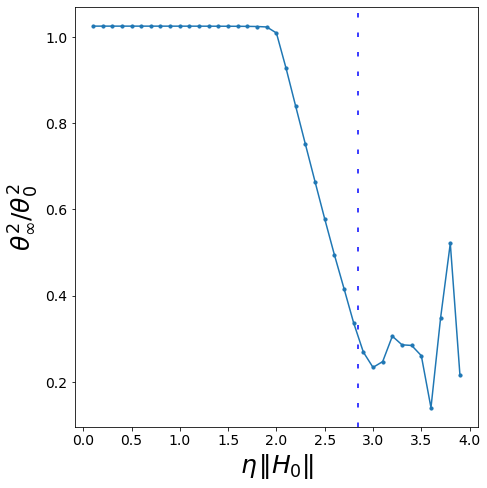

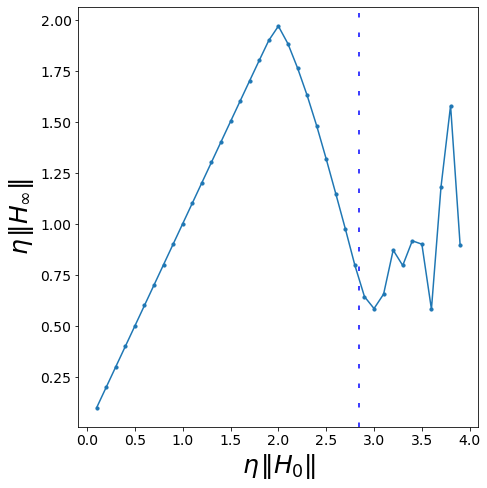

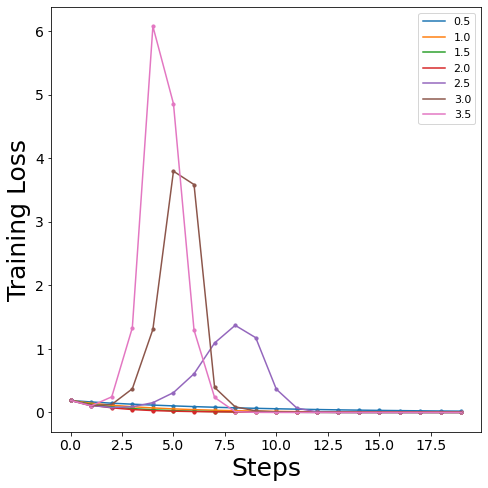

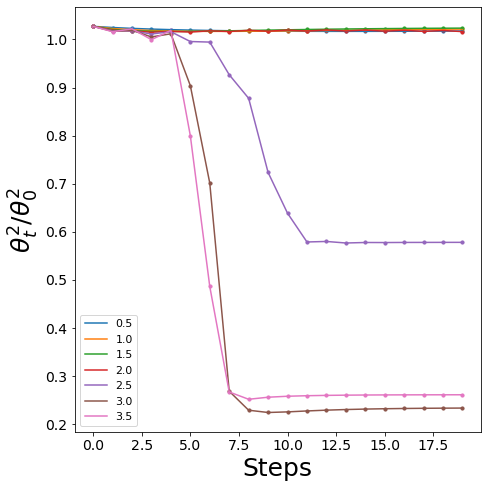

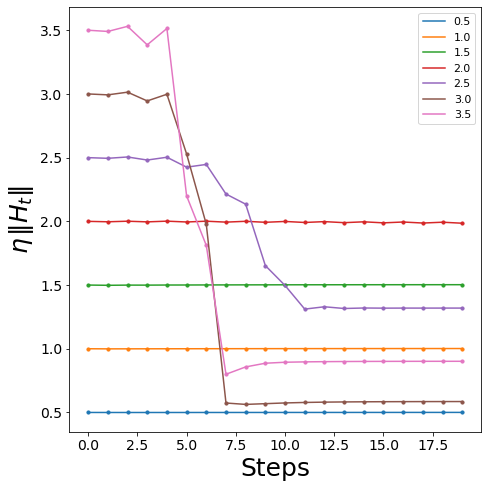

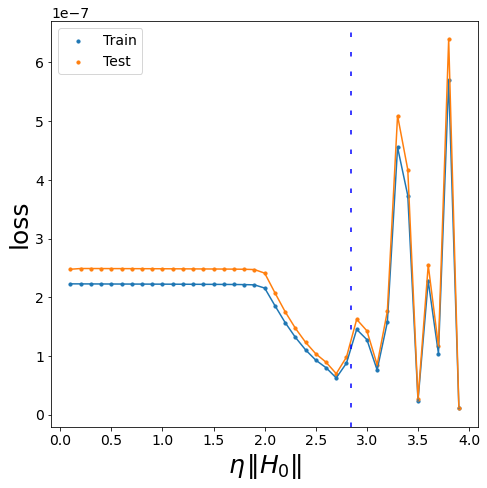

In [ ]:
model_dict={}
model_dict['input_dim']=1

model_dict['fdim']=20
model_dict['slp']=0
model_dict['mfeats']=10

model_dict['mdim']=200
model_dict['masks_mf']=50
model_dict['act']='tanh'

seed=123

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
dataset_name='random_teacher'

num_samps_train=32
num_samps_test=2000

train_batch_size=num_samps_train

data['random_teacher','train']=2*(torch.rand((num_samps_train,model_dict['input_dim']))-1/2)
data['random_teacher','test']=2*(torch.rand((num_samps_test,model_dict['input_dim']))-1/2)

arch='qbias'

lr_ratios=list(map(lambda x: np.round(x,3),np.arange(.1,4+.1,.1)))
lr_ratios_plot=lr_ratios[4::5]
max_epochs=1000
log_type='epoch'
stop_criterion=0

result_dict = full_training_loop(arch,
    model_dict,
    lr_ratios,
    dataset_name,
    train_batch_size,
    max_epochs=max_epochs,
    log_type=log_type,
    stop_criterion=stop_criterion,
    printevery=250,
    verbose=True,
    write_file=True,
    overwrite=True,
    seed=seed,
    method='quadratic_model_with_bias')


train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            include_gen_gap=False)

# Linear Net Near Divergent Phase

computing averaged top eigenvalues and eigenvectors
[    0/    1]
lr_ratio is 4.0
seed is 120
initial max eigen 2.019628
saving_model
lr_ratio is 4.01
seed is 120
initial max eigen 2.019628
model diverges
lr_ratio is 4.02
seed is 120
initial max eigen 2.019628


<ipython-input-24-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


model diverges
lr_ratio is 4.03
seed is 120
initial max eigen 2.019628
model diverges
lr_ratio is 4.04
seed is 120
initial max eigen 2.019628
model diverges
lr_ratio is 4.05
seed is 120
initial max eigen 2.019628
model diverges
lr_ratio is 4.06
seed is 120
initial max eigen 2.019628
model diverges
lr_ratio is 4.07
seed is 120
initial max eigen 2.019628
model diverges
lr_ratio is 4.08
seed is 120
initial max eigen 2.019628
model diverges
lr_ratio is 4.09
seed is 120
initial max eigen 2.019628
model diverges


/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


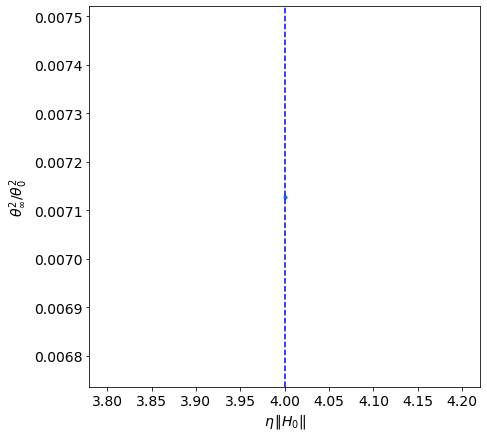

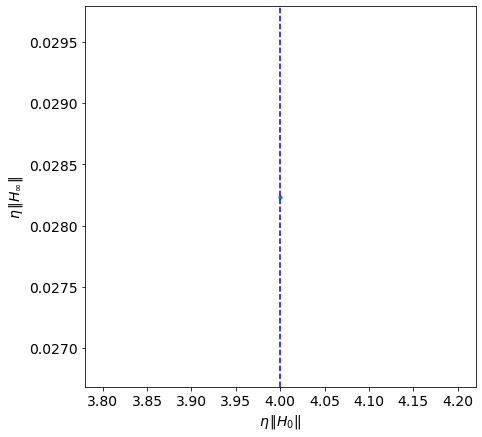

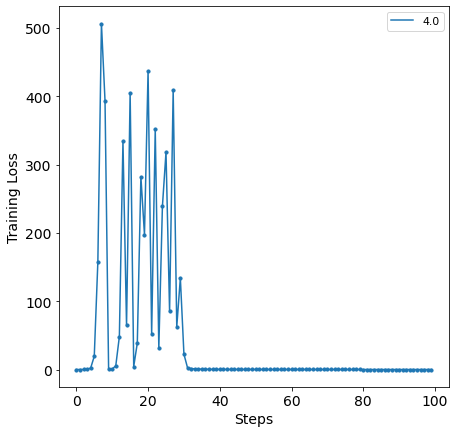

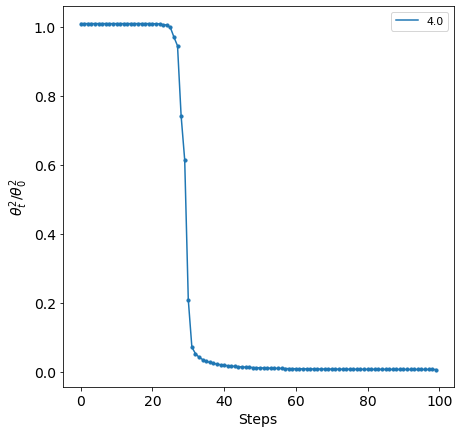

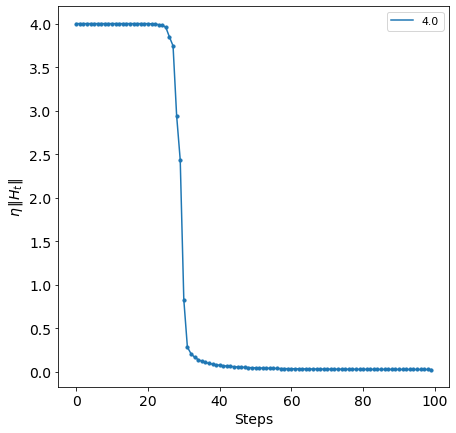

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=1
model_dict['width']=1024
model_dict['activation']='identity'
model_dict['num_layers']=1
model_dict['bias_value']=False
seed=120

dataset_name='toy_example'
train_batch_size=1

lr_ratios=list(map(lambda x: np.round(x,2),list(np.arange(4.0,4+.1,.01))))
max_epochs=100
log_type='epoch'
stop_criterion=0

result_dict={}

result_dict = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=500,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=seed,
           method='explicit')
    
#    train_test_loss(arch,
#                model_dict,
#                lr_ratios,
#                dataset_name,
#                train_batch_size,
#                max_epochs=max_epochs,
#                stop_criterion=stop_criterion,
#                print_every=1,
#                overwrite=False,
#                seed=120,
#                write_file=True)
plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=100,
    write_file=True,
    size=(7,7),
    seed=seed)

# Scale-Invariant MLP

## Toy Example, generic scale-invariant net

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=1
model_dict['width']=1024
model_dict['activation']='leaky_relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

#num_samps=1
#
#X_train=(torch.rand((num_samps,model_dict['input_size']))-1/2)
#y_train=0*torch.randn((num_samps,1))
#data['random','train']=CustomDataset(list(zip(X_train,y_train)))

dataset_name='toy_example'
train_batch_size=1

lr_ratios=list(map(lambda x: np.round(x,2),list(np.arange(0.1,12+.1,.1))))
lr_ratios_plot=list(map(lambda x: np.round(x,2),list(np.arange(0.5,12+.5,.5))))
#lr_ratios=[.5]
max_epochs=1000
log_type='epoch'
stop_criterion=0

#model=MLP_General(**model_dict)
seed=123
result_dict_leaky={}
for slope in np.arange(0,1+.25,.25):
#for slope in [0.,1.]:
    print(f'slope is {slope}')
    model_dict['slope']=slope
    slope=np.round(slope,3)
    result_dict_leaky[slope] = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=seed,
           method='explicit')
    
    train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)

slope is 0.0
computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.1
training already done
lr_ratio is 0.2
training already done
lr_ratio is 0.3
training already done
lr_ratio is 0.4
training already done
lr_ratio is 0.5
training already done
lr_ratio is 0.6
training already done
lr_ratio is 0.7
training already done
lr_ratio is 0.8
training already done
lr_ratio is 0.9
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.1
training already done
lr_ratio is 1.2
training already done
lr_ratio is 1.3
training already done
lr_ratio is 1.4
training already done
lr_ratio is 1.5
training already done
lr_ratio is 1.6
training already done
lr_ratio is 1.7
training already done
lr_ratio is 1.8
training already done
lr_ratio is 1.9
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.1
training already done
lr_ratio is 2.2
training already done
lr_ratio is 2.3
training already done
lr_ratio is 2.4
training already

In [ ]:
lr_ratios[-60]

6.1

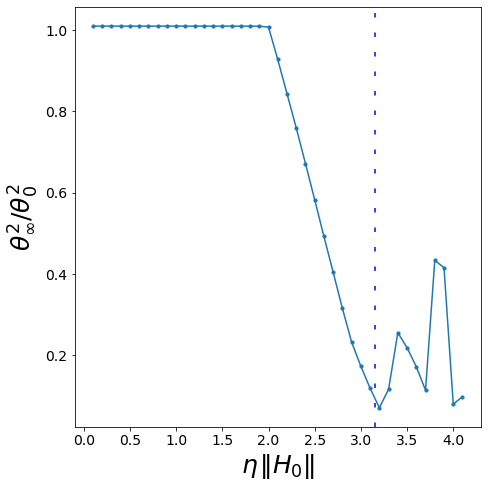

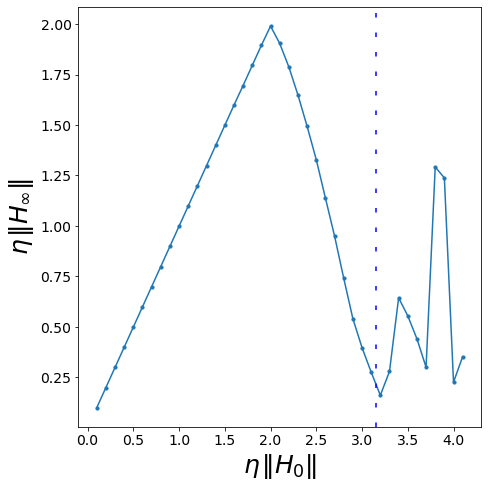

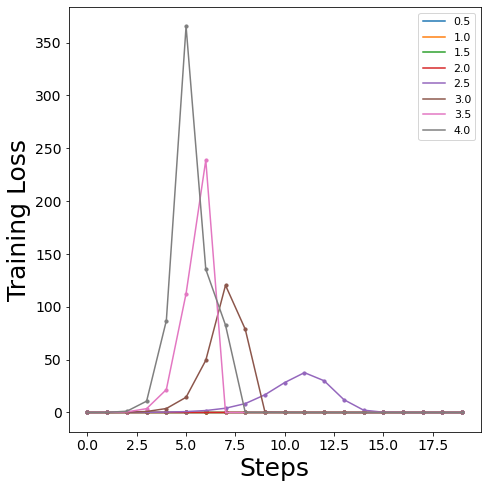

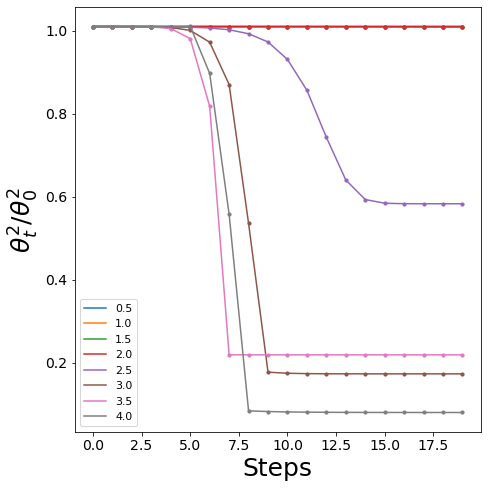

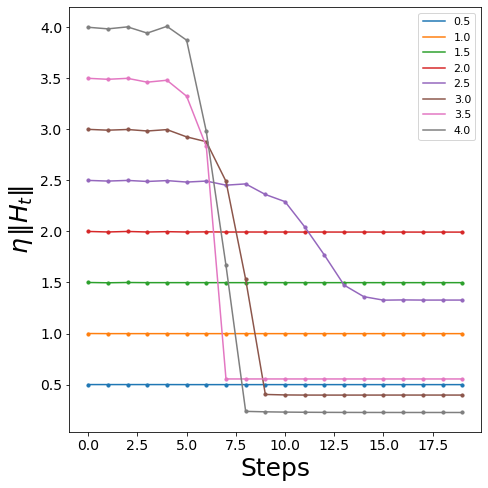

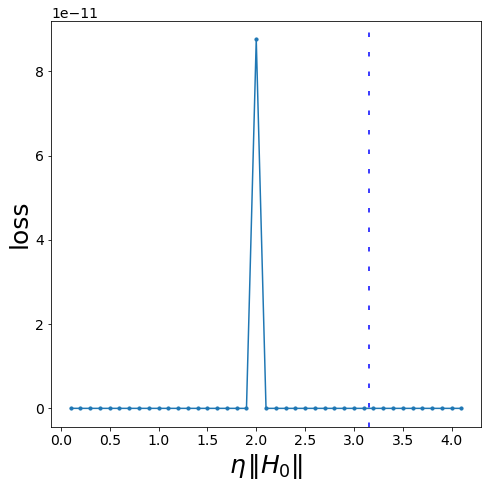

In [ ]:
model_dict['slope']=0.75
seed=120
lr_ratiosV2=lr_ratios[:-60]
lr_ratios_plot=lr_ratios[4:-60:5]
plot_final_results(arch,
                   model_dict,
                   lr_ratiosV2,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratiosV2,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

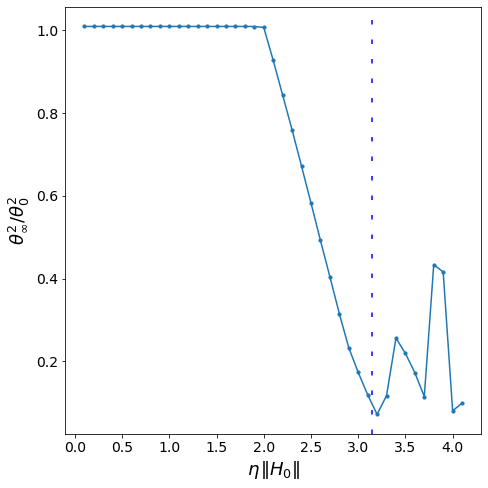

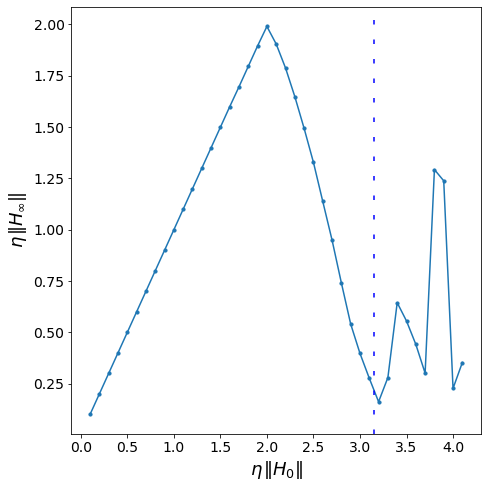

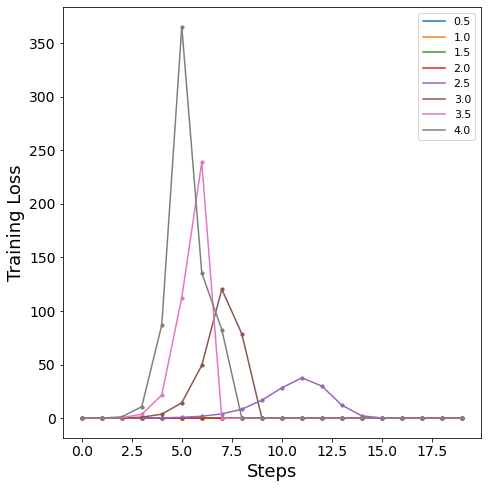

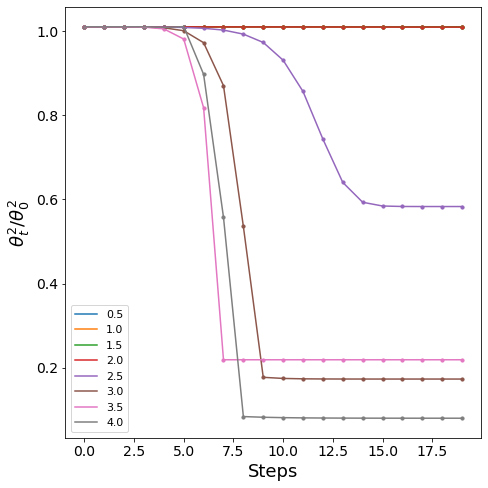

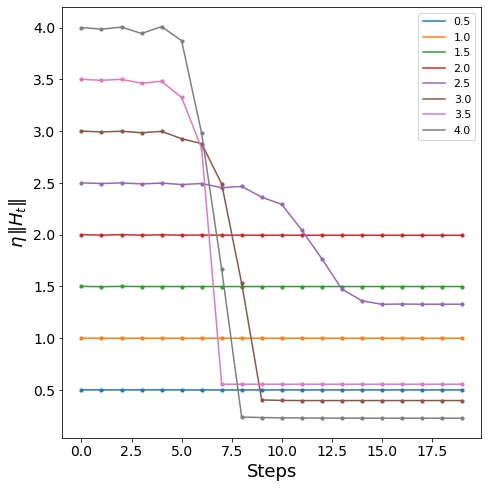

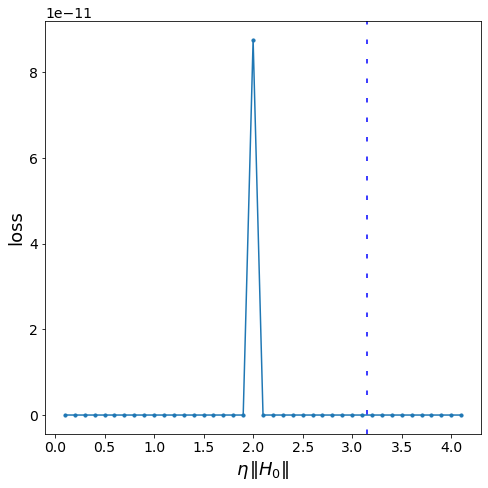

In [ ]:
model_dict['slope']=0.75
seed=120
lr_ratiosV2=lr_ratios[:-60]
lr_ratios_plot=lr_ratios[4:-60:5]
plot_final_results(arch,
                   model_dict,
                   lr_ratiosV2,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=20,
    write_file=True,
    size=(7,7),
    seed=seed)

plot_generalization_loss(arch,
            model_dict,
            lr_ratiosV2,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed)

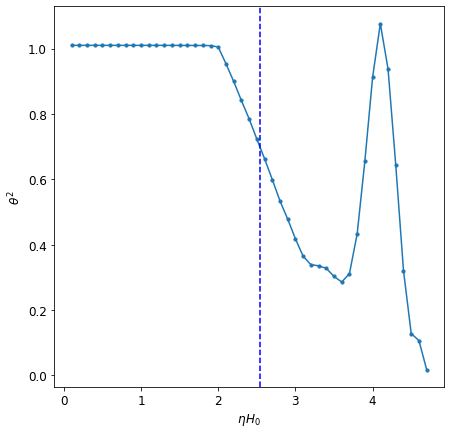

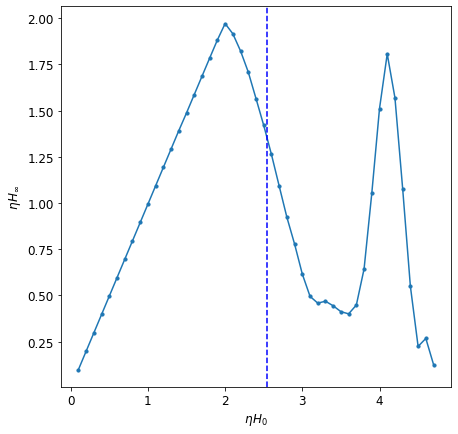

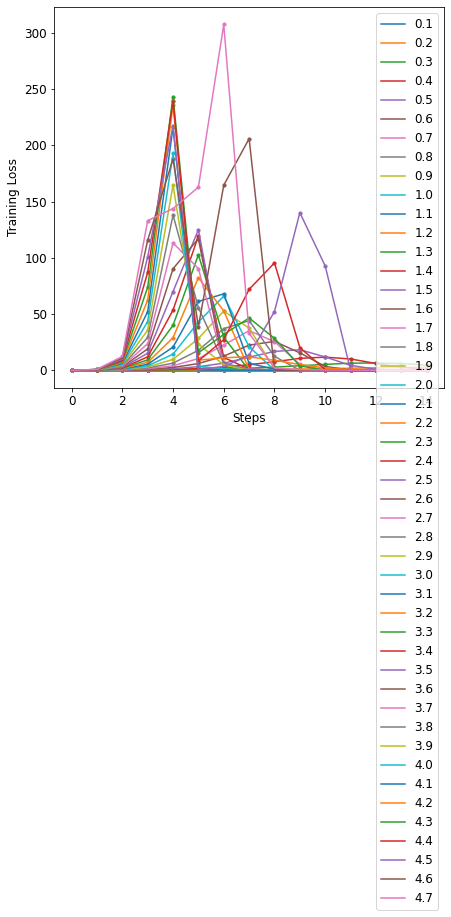

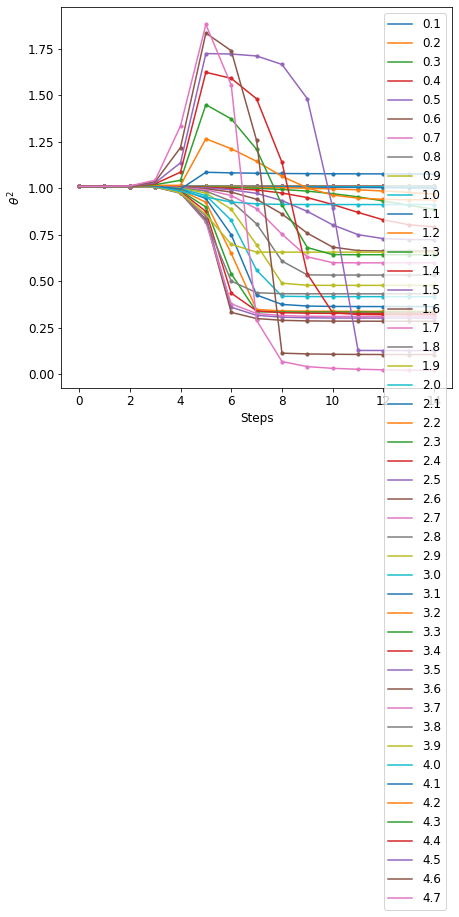

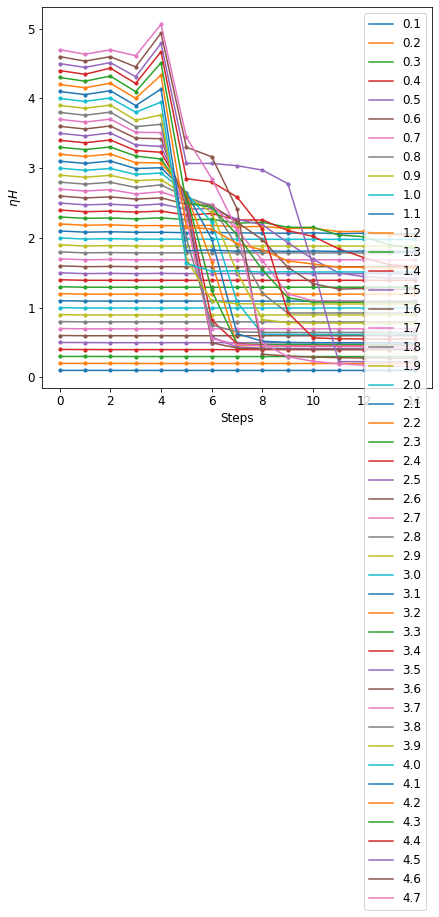

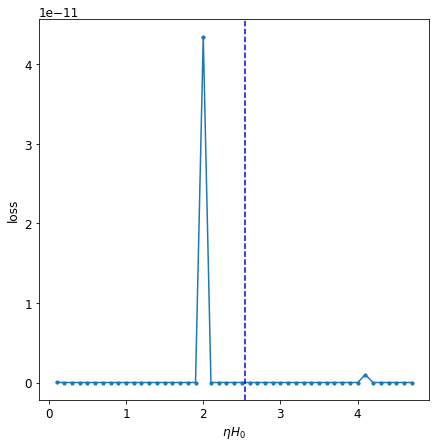

In [ ]:
#model_dict['slope']=.5

model_dict['slope']=.5

collective_plots(arch,
                 model_dict,
                 lr_ratios,
                 dataset_name,
                 train_batch_size,
                 max_epochs,
                 stop_criterion,
                 size=(7,7),
                 s=10,
                 write_file=True,
                 seed=120)

In [ ]:
model_dict['negative_slope']=.0

collective_plots(arch,
                 model_dict,
                 lr_ratios,
                 dataset_name,
                 train_batch_size,
                 max_epochs,
                 stop_criterion,
                 size=(7,7),
                 s=10,
                 write_file=True,
                 seed=120)

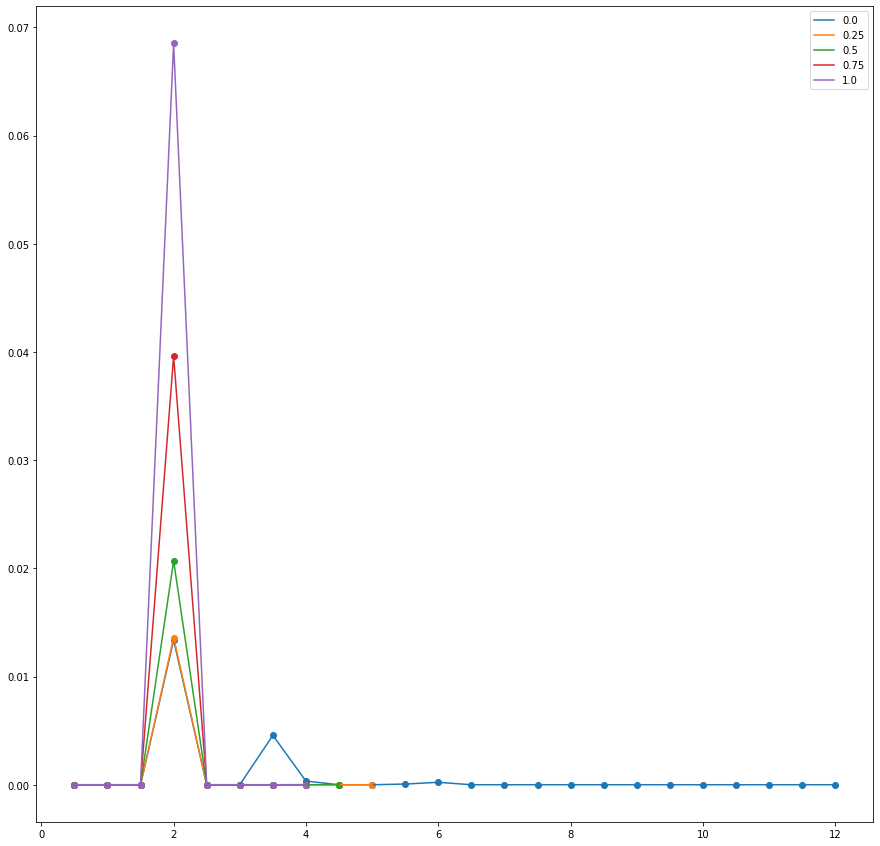

In [ ]:
fig,ax=plt.subplots()

for slope in np.arange(0,1+.25,.25):
    slope=np.round(slope,3)
    losses=[]
    for lr_ratio in lr_ratios:
        losses.append(result_dict_leaky[slope]['lr_ratio',lr_ratio]['loss'][-1])
    ax.plot(lr_ratios,losses)
    ax.scatter(lr_ratios,losses)
ax.legend(np.round(np.arange(0,1+.25,.252),2))
plt.show()

In [ ]:
len(final_lr_list)

149

## Random Data

In [ ]:
result_dict_leaky[slope]['data_top_eval']

tensor(4.)

In [ ]:
print(result_dict_leaky[1]['data_top_eval'].item())
print(result_dict_leaky[1]['NTK_top_eigens'][0])

1.020480751991272
1.0335209


slope is 0.5
computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.1
training already done
lr_ratio is 0.2
training already done
lr_ratio is 0.3
training already done
lr_ratio is 0.4
training already done
lr_ratio is 0.5
training already done
lr_ratio is 0.6
training already done
lr_ratio is 0.7
training already done
lr_ratio is 0.8
training already done
lr_ratio is 0.9
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.1
training already done
lr_ratio is 1.2
training already done
lr_ratio is 1.3
training already done
lr_ratio is 1.4
training already done
lr_ratio is 1.5
training already done
lr_ratio is 1.6
training already done
lr_ratio is 1.7
training already done
lr_ratio is 1.8
training already done
lr_ratio is 1.9
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.1
training already done
lr_ratio is 2.2
training already done
lr_ratio is 2.3
training already done
lr_ratio is 2.4
training already

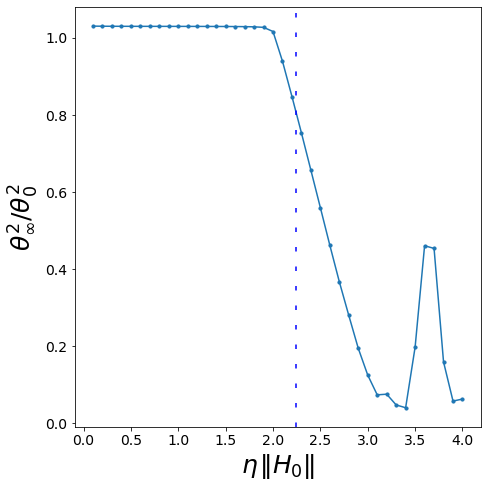

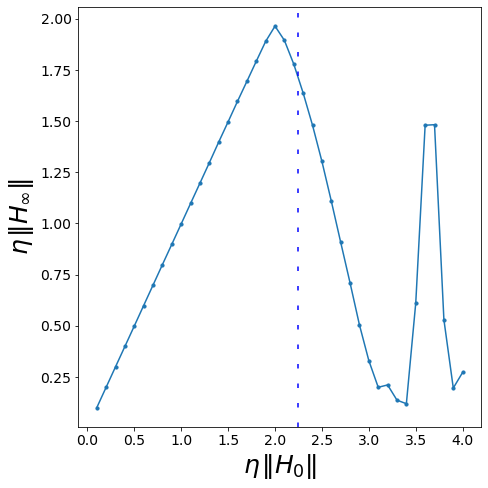

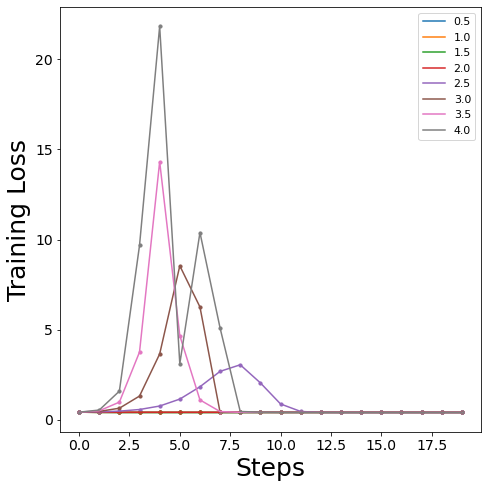

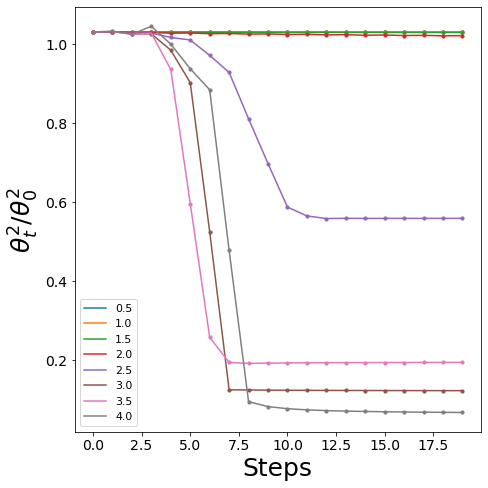

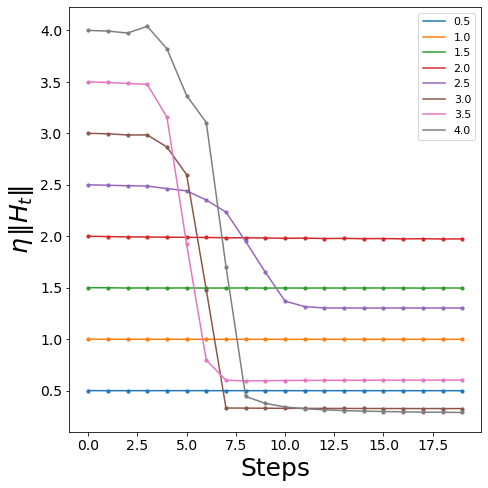

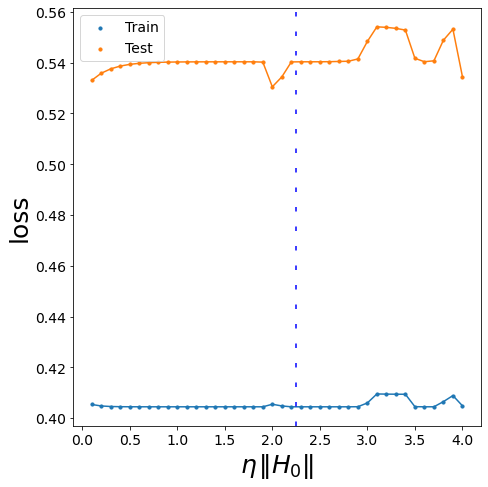

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=1
model_dict['width']=1024
model_dict['activation']='leaky_relu'
model_dict['num_layers']=1
model_dict['bias_value']=False
num_train_samps=32
num_test_samps=50

seed=123

X_train=(torch.rand((num_train_samps,model_dict['input_size']))-1/2)
y_train=torch.randn((num_train_samps,1))

X_test=(torch.rand((num_test_samps,model_dict['input_size']))-1/2)
y_test=torch.randn((num_test_samps,1))

data['random','train']=CustomDataset(list(zip(X_train,y_train)))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

dataset_name='random'
train_batch_size=num_train_samps

lr_ratios=list(map(lambda x: round(x,3),np.arange(0.1,5+.1,.1)))
#lr_ratios=[1]
max_epochs=50
log_type='epoch'
stop_criterion=0


#model=MLP_General(**model_dict)

result_dict_leaky={}
for slope in [.5]:
#for slope in [0.,1.]:
    print(f'slope is {slope}')
    model_dict['slope']=slope
    slope=np.round(slope,3)
    result_dict_leaky[slope] = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=seed,
           method='explicit',
           data_eigen=True)
    
    train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed,
                write_file=True)
    
plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[4::5],
    #lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    xmin=0,
    x_range=20,
    write_file=True,
    seed=seed,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=True,
            include_gen_gap=False,
            seed=seed)


#collective_plots(arch,
#                 model_dict,
#                 lr_ratios,
#                 dataset_name,
#                 train_batch_size,
#                 max_epochs,
#                 stop_criterion,
#                 size=(7,7),
#                 s=10,
#                 write_file=True,
#                 seed=seed)

slope is 0


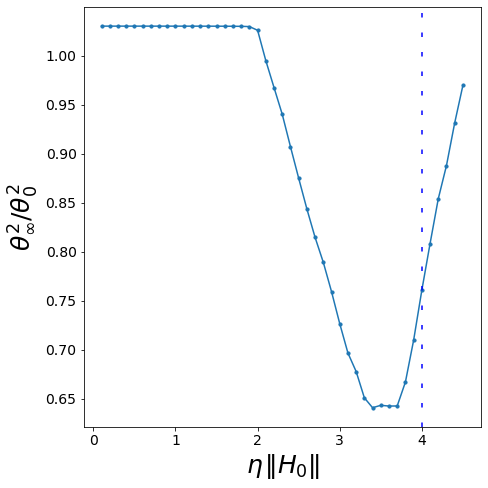

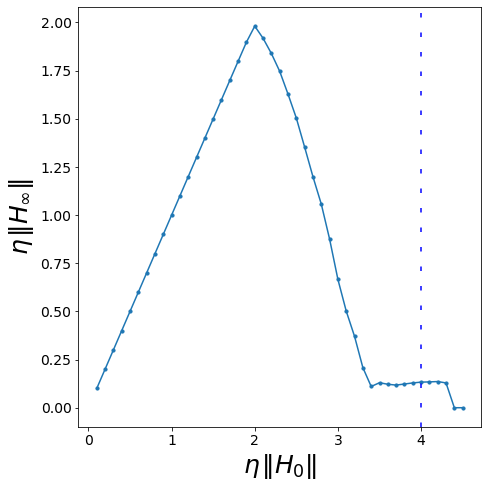

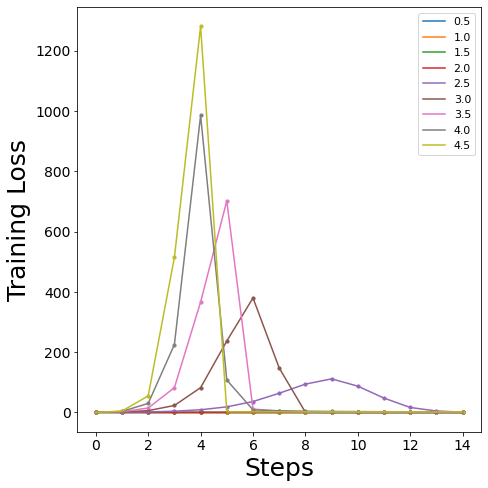

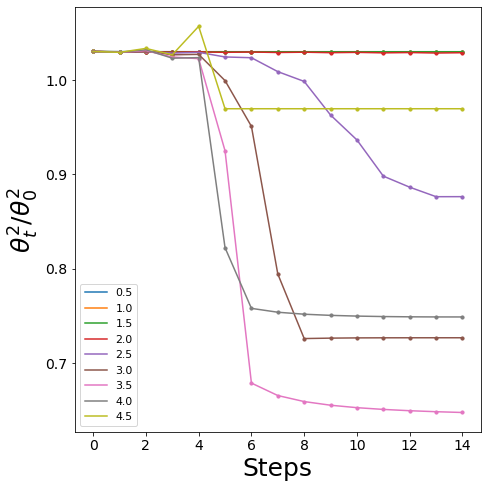

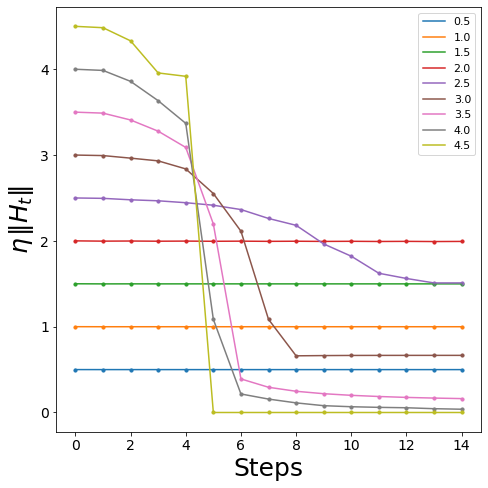

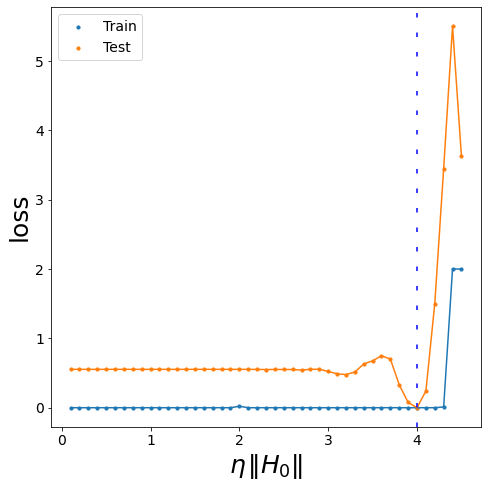

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=1
model_dict['width']=1024
model_dict['activation']='leaky_relu'
model_dict['num_layers']=1
model_dict['bias_value']=False
num_train_samps=1
num_test_samps=1

seed=123

X_train=torch.tensor([[4.]])
y_train=torch.tensor([[2.]])

X_test=(torch.rand((num_test_samps,model_dict['input_size']))-1/2)
y_test=torch.randn((num_test_samps,1))

data['random','train']=CustomDataset(list(zip(X_train,y_train)))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

dataset_name='random'
train_batch_size=num_train_samps

lr_ratios=list(map(lambda x: round(x,3),np.arange(0.1,4.5+.1,.1)))
#lr_ratios=[1]
max_epochs=100
log_type='epoch'
stop_criterion=0


#model=MLP_General(**model_dict)

result_dict_leaky={}
for slope in [0]:
    print(f'slope is {slope}')
    model_dict['slope']=slope
    slope=np.round(slope,3)
    #result_dict_leaky[slope] = full_training_loop(arch,model_dict,
    #       lr_ratios,
    #       dataset_name,
    #       train_batch_size,
    #       max_epochs=max_epochs,
    #       log_type=log_type,
    #       stop_criterion=stop_criterion
    #       ,printevery=50,
    #       verbose=True,
    #       write_file=True,
    #       overwrite=True,
    #       seed=seed,
    #       method='explicit',
    #       data_eigen=True)
    #
    #train_test_loss(arch,
    #            model_dict,
    #            lr_ratios,
    #            dataset_name,
    #            train_batch_size,
    #            max_epochs=max_epochs,
    #            stop_criterion=stop_criterion,
     #           print_every=1,
      #          overwrite=True,
      #          seed=seed,
      #          write_file=True)
    
plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[4::5],
    #lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    xmin=0,
    x_range=15,
    write_file=True,
    seed=seed,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=True,
            include_gen_gap=False,
            seed=seed)


#collective_plots(arch,
#                 model_dict,
#                 lr_ratios,
#                 dataset_name,
#                 train_batch_size,
#                 max_epochs,
#                 stop_criterion,
#                 size=(7,7),
#                 s=10,
#                 write_file=True,
#                 seed=seed)

## Teacher Student

In [ ]:
MLP_General()

In [ ]:
seed=123

num_train_samps=32
num_test_samps=512

model_teacher_dict={}
model_teacher_dict['input_size']=1
model_teacher_dict['width']=512
model_teacher_dict['activation']='leaky_relu'
model_teacher_dict['num_layers']=3
model_teacher_dict['bias_value']=False
model_teacher_dict['slope']=0

teacher_model=MLP_General(**model_teacher_dict)
X_train=100*(torch.rand((num_train_samps,model_teacher_dict['input_size']))-1/2)
with torch.no_grad():
    y_train=teacher_model(X_train)


X_test=100*(torch.rand((num_test_samps,model_teacher_dict['input_size']))-1/2)
with torch.no_grad():
    y_test=teacher_model(X_test)

arch='MLP_General'

model_dict={}
model_dict['input_size']=1
model_dict['width']=64
model_dict['activation']='leaky_relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

data['random','train']=CustomDataset(list(zip(X_train,y_train)))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

dataset_name='random'
train_batch_size=num_train_samps

lr_ratios=list(map(lambda x: round(x,3),np.arange(0.5,5+.5,.5)))
max_epochs=1000
log_type='epoch'
stop_criterion=0

result_dict_leaky={}
for slope in [.75]:
#for slope in [0.,1.]:
    print(f'slope is {slope}')
    model_dict['slope']=slope
    slope=np.round(slope,3)
    result_dict_leaky[slope] = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           seed=seed,
           method='explicit',
           data_eigen=True)
    
    train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=seed,
                write_file=True)
    
plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=True,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    #lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    xmin=0,
    x_range=11,
    write_file=True,
    seed=seed,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=True,
            include_gen_gap=False,
            seed=seed)


## MLP One Hidden Layer: Small Datasets

### MNIST

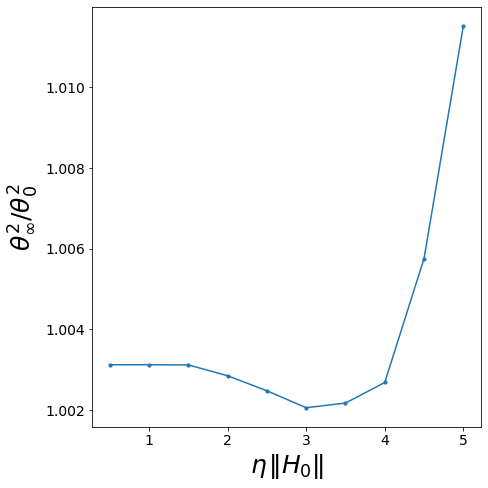

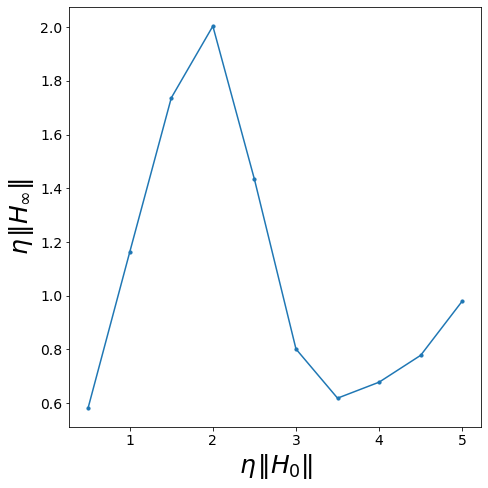

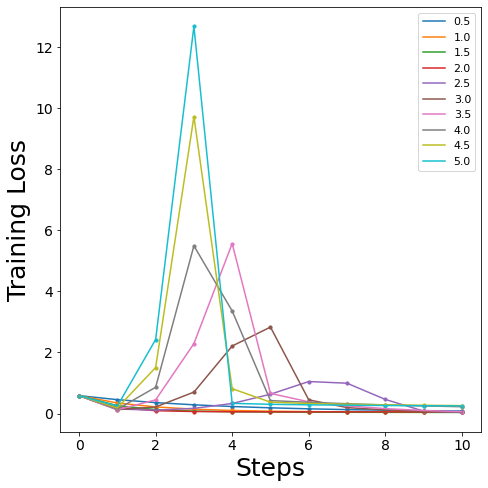

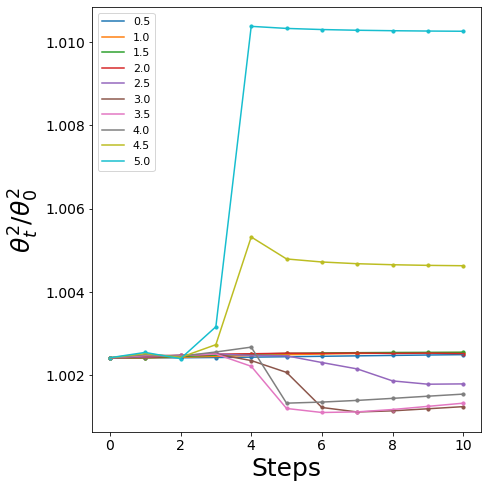

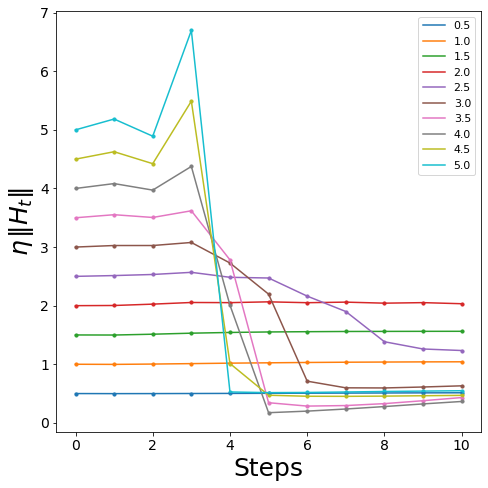

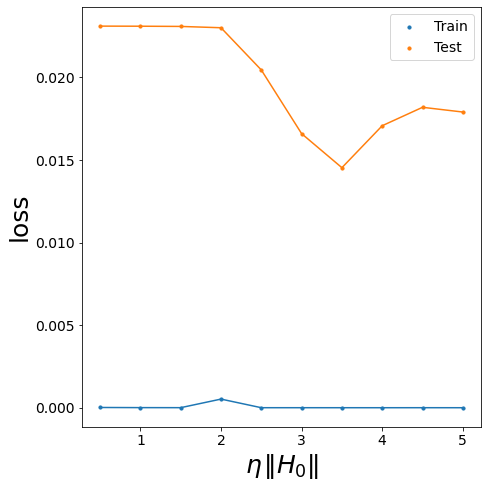

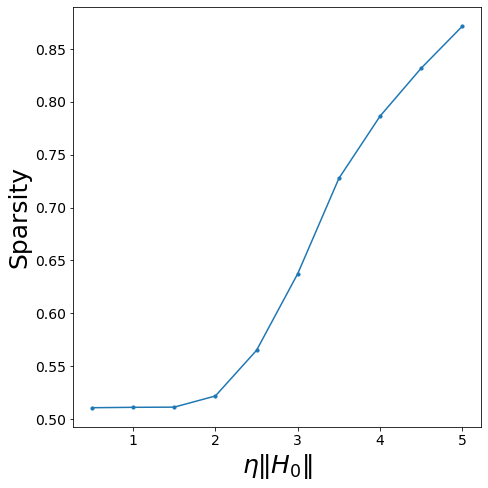

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='MNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,5+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)
seed=123


#result_dict_MLP = full_training_loop(arch,model_dict,
#           lr_ratios,
#           dataset_name,
#           train_batch_size,
#           max_epochs=max_epochs,
#           log_type=log_type,
#           stop_criterion=stop_criterion
#           ,printevery=100,
#           verbose=True,
#           write_file=True,
#           overwrite=True,
#           seed=seed,
#           method='explicit')

#train_test_loss(arch,
#                model_dict,
#                lr_ratios,
#                dataset_name,
#                train_batch_size,
#                max_epochs=max_epochs,
#                stop_criterion=stop_criterion,
#                print_every=1,
#                overwrite=False,
#                seed=seed)

#check_sparsity_avg(arch,model_dict,      
#                       lr_ratios,
#                       dataset_name,
#                       train_batch_size,
#                       max_epochs=max_epochs,
#                       stop_criterion=stop_criterion,
#                       #partition='train',
#                       device=device,
#                       write_file=True,
#                       overwrite=False,
#                       printevery=25,
#                       verbose=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    #lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    xmin=0,
    x_range=11,
    write_file=True,
    seed=seed,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False,
            seed=seed)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            include_predictions=False)

computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.5
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.5
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.5
training already done
lr_ratio is 3.0
training already done
lr_ratio is 3.5
training already done
lr_ratio is 4.0
training already done
lr_ratio is 4.5
training already done
lr_ratio is 5.0
training already done
lr_ratio is 5.5
training already done
lr_ratio is 6.0
training already done
lr_ratio is 6.5
training already done
lr_ratio is 7.0
training already done
lr_ratio is 7.5
training already done
lr_ratio is 8.0
training already done
lr_ratio is 8.5
training already done
lr_ratio is 9.0
training already done
lr_ratio is 9.5
training already done
lr_ratio is 10.0
training already done
lr_ratio is 10.5
training already done
lr_ratio is 11.0
training already done
lr_ratio is 11.5
training already done
lr_ratio is 12.0
training already done
lr

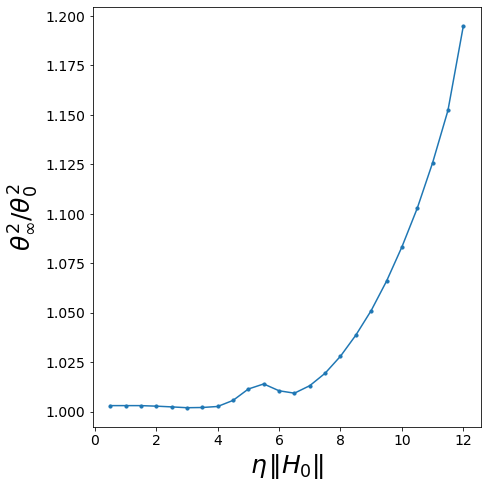

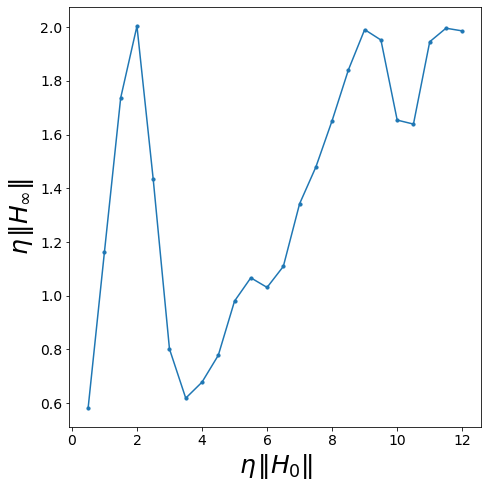

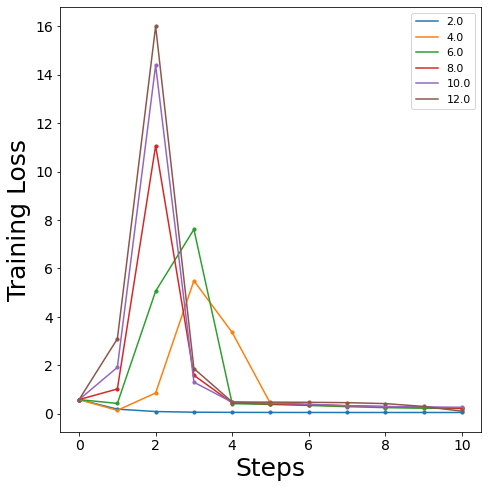

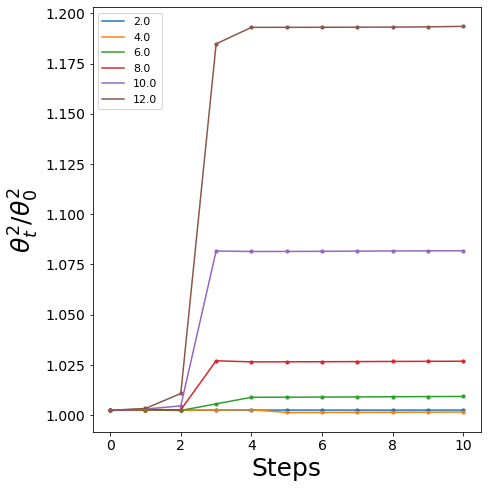

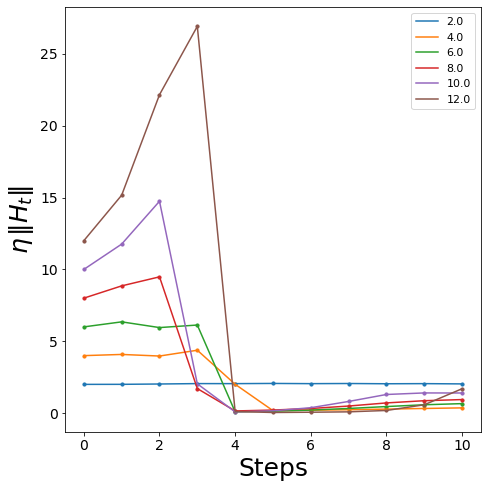

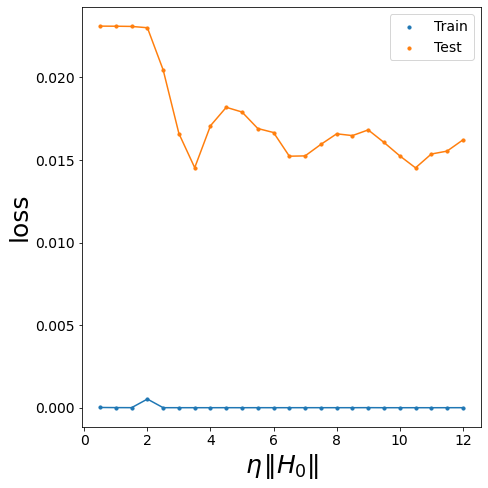

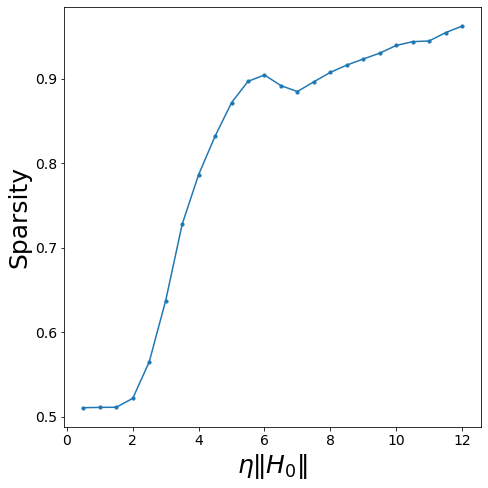

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='MNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)
seed=123


result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=100,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=seed,
           method='explicit')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed)

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    #lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    xmin=0,
    x_range=11,
    write_file=True,
    seed=seed,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False,
            seed=seed)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            seed=seed,
            include_predictions=False)

### FMNIST

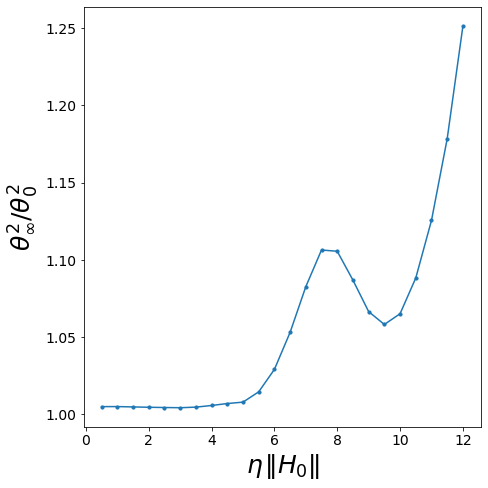

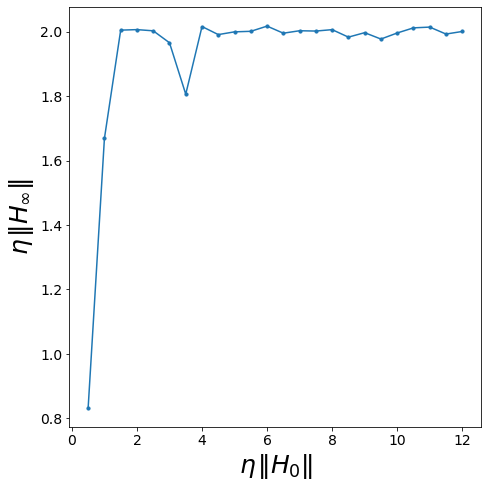

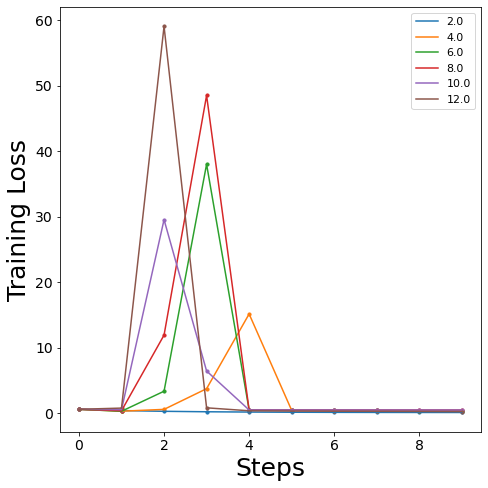

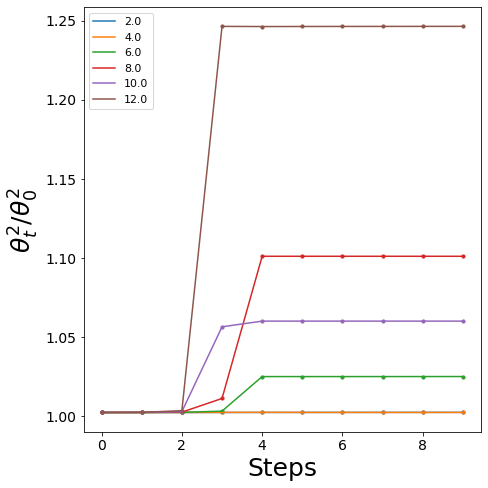

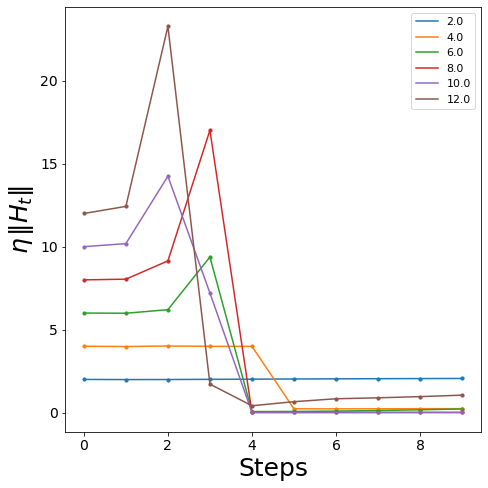

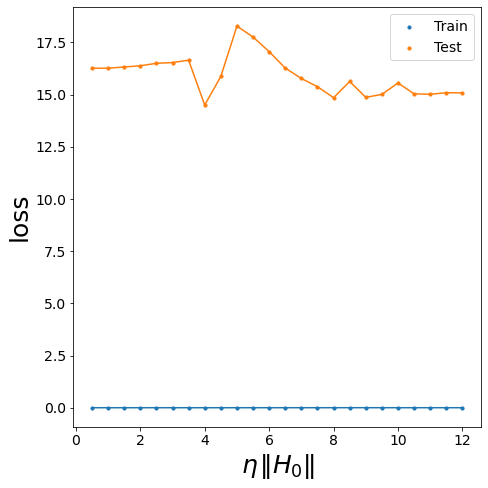

lr_ratio: 0.5
sparsity already computed
lr_ratio: 1.0
sparsity already computed
lr_ratio: 1.5
sparsity already computed
lr_ratio: 2.0
sparsity already computed
lr_ratio: 2.5
sparsity already computed
lr_ratio: 3.0
sparsity already computed
lr_ratio: 3.5
sparsity already computed
lr_ratio: 4.0
sparsity already computed
lr_ratio: 4.5
sparsity already computed
lr_ratio: 5.0
sparsity already computed
lr_ratio: 5.5
sparsity already computed
lr_ratio: 6.0
sparsity already computed
lr_ratio: 6.5
sparsity already computed
lr_ratio: 7.0
sparsity already computed
lr_ratio: 7.5
sparsity already computed
lr_ratio: 8.0
sparsity already computed
lr_ratio: 8.5
sparsity already computed
lr_ratio: 9.0
sparsity already computed
lr_ratio: 9.5
sparsity already computed
lr_ratio: 10.0
sparsity already computed
lr_ratio: 10.5
sparsity already computed
lr_ratio: 11.0
sparsity already computed
lr_ratio: 11.5
sparsity already computed
lr_ratio: 12.0
sparsity already computed


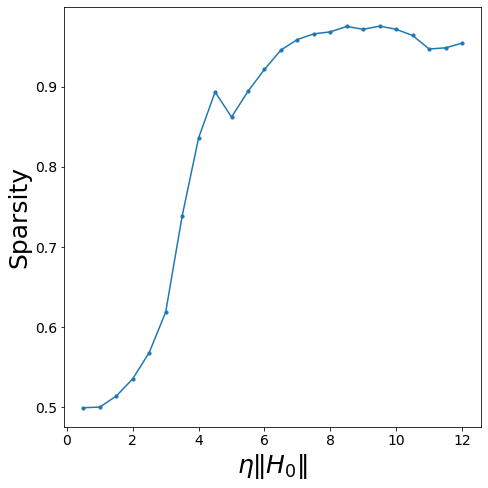

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='FMNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

#result_dict_MLP = full_training_loop(arch,model_dict,
#           lr_ratios,
#           dataset_name,
#           train_batch_size,
#           max_epochs=max_epochs,
#           log_type=log_type,
#           stop_criterion=stop_criterion
#           ,printevery=50,
#           verbose=True,
#           write_file=True,
#           overwrite=True,
#           seed=123,
#           method='explicit')
#
#train_test_loss(arch,
 #               model_dict,
 #               lr_ratios,
 #               dataset_name,
 #               train_batch_size,
 #               max_epochs=max_epochs,
 #               stop_criterion=stop_criterion,
 #               print_every=1,
 #               overwrite=True,
 #               seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                  write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False)

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False)

computing averaged top eigenvalues and eigenvectors
[    0/  128]
lr_ratio is 0.5
seed is 123
initial max eigen 0.139259
epoch: 50, batch/total: 0/1, loss: 0.09997371584177017, NTK: 0.5210678569670666
old_loss is 0.10060206055641174.
loss_tot is 0.09997371584177017.
difference is 0.000628344714641571
epoch: 100, batch/total: 0/1, loss: 0.08137639611959457, NTK: 0.5267416329072477
old_loss is 0.08164243400096893.
loss_tot is 0.08137639611959457.
difference is 0.00026603788137435913
epoch: 150, batch/total: 0/1, loss: 0.07072329521179199, NTK: 0.5320077277503493
old_loss is 0.07089709490537643.
loss_tot is 0.07072329521179199.
difference is 0.00017379969358444214
epoch: 200, batch/total: 0/1, loss: 0.06334036588668823, NTK: 0.537902250699264
old_loss is 0.06346549838781357.
loss_tot is 0.06334036588668823.
difference is 0.0001251325011253357
epoch: 250, batch/total: 0/1, loss: 0.05774834007024765, NTK: 0.5435435512554652
old_loss is 0.057848285883665085.
loss_tot is 0.05774834007024765.


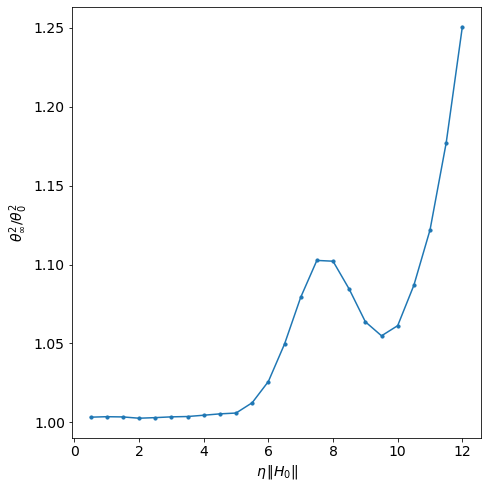

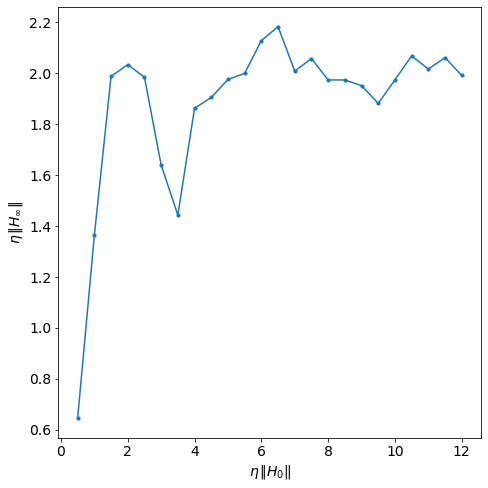

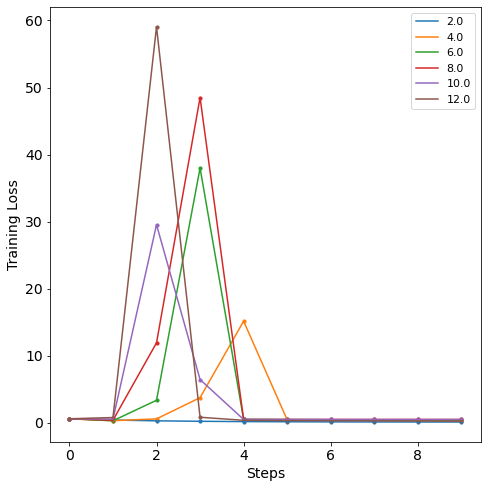

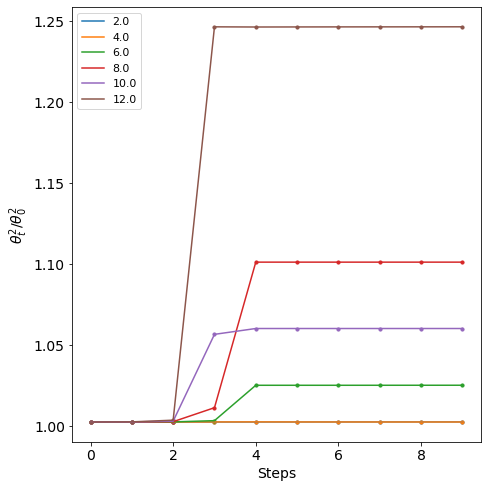

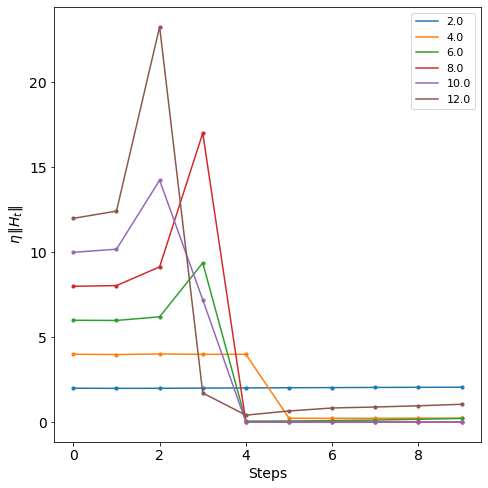

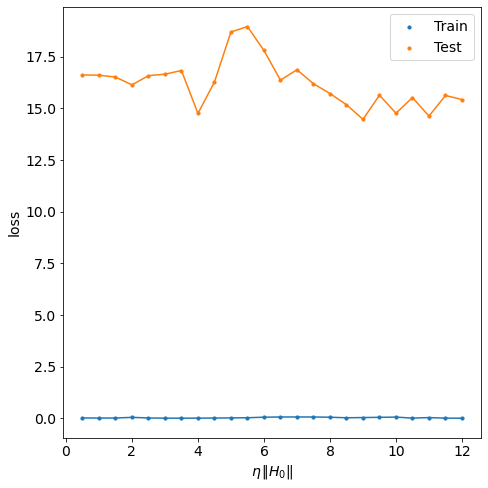

lr_ratio: 0.5
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 1.0
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 1.5
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 2.0
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 2.5
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 3.0
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 3.5
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 4.0
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 4.5
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/total 75/78
lr_ratio: 5.0
batch/total 0/1
batch/total 0/78
batch/total 25/78
batch/total 50/78
batch/to

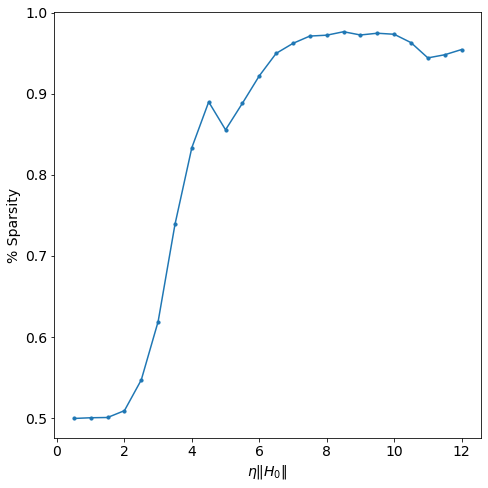

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='FMNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-5

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           seed=123,
           method='explicit')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                  write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False)

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False)

### CIFAR10

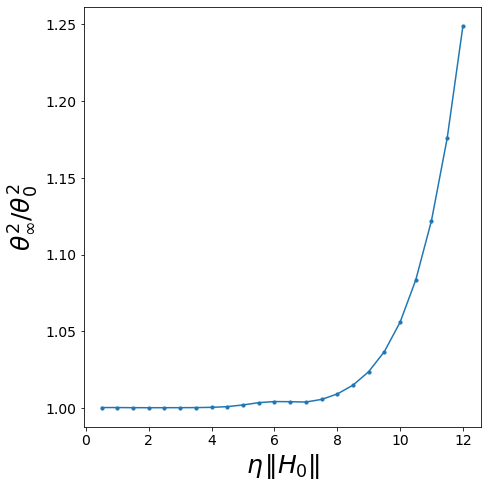

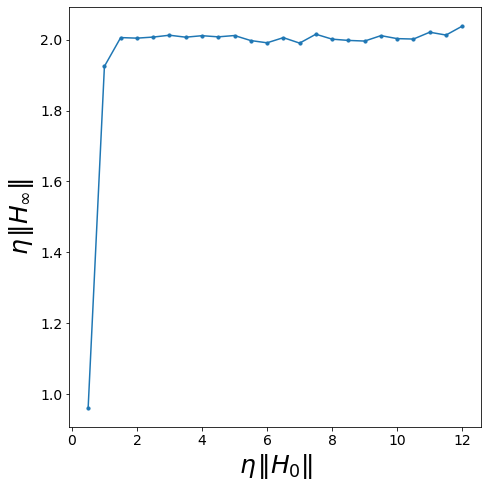

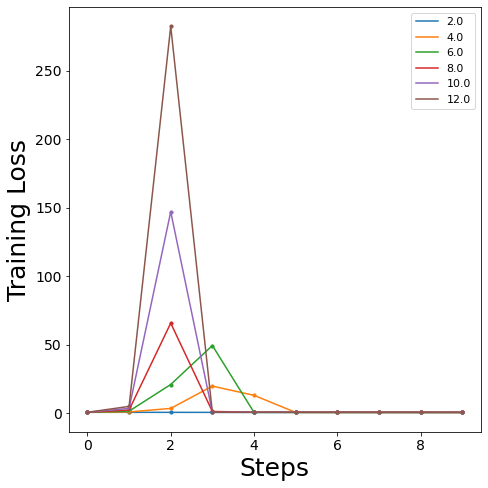

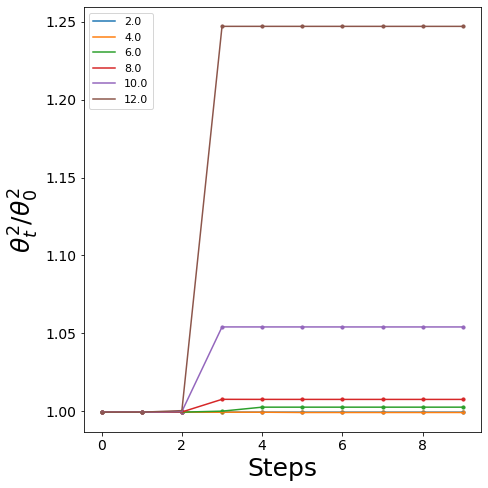

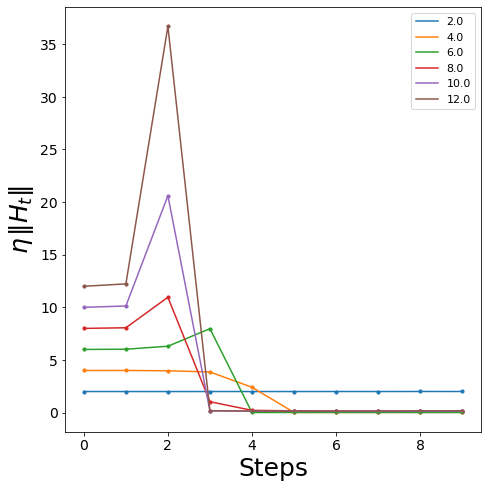

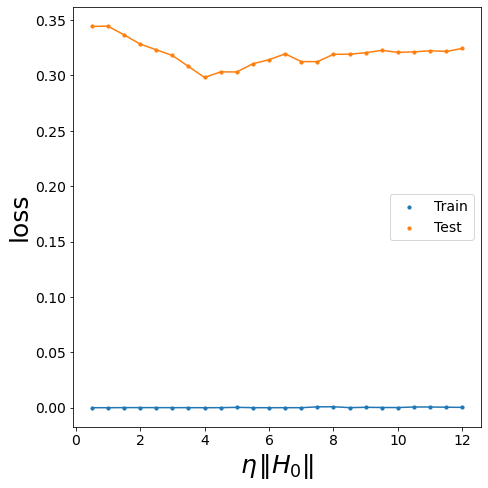

lr_ratio: 0.5
sparsity already computed
lr_ratio: 1.0
sparsity already computed
lr_ratio: 1.5
sparsity already computed
lr_ratio: 2.0
sparsity already computed
lr_ratio: 2.5
sparsity already computed
lr_ratio: 3.0
sparsity already computed
lr_ratio: 3.5
sparsity already computed
lr_ratio: 4.0
sparsity already computed
lr_ratio: 4.5
sparsity already computed
lr_ratio: 5.0
sparsity already computed
lr_ratio: 5.5
sparsity already computed
lr_ratio: 6.0
sparsity already computed
lr_ratio: 6.5
sparsity already computed
lr_ratio: 7.0
sparsity already computed
lr_ratio: 7.5
sparsity already computed
lr_ratio: 8.0
sparsity already computed
lr_ratio: 8.5
sparsity already computed
lr_ratio: 9.0
sparsity already computed
lr_ratio: 9.5
sparsity already computed
lr_ratio: 10.0
sparsity already computed
lr_ratio: 10.5
sparsity already computed
lr_ratio: 11.0
sparsity already computed
lr_ratio: 11.5
sparsity already computed
lr_ratio: 12.0
sparsity already computed


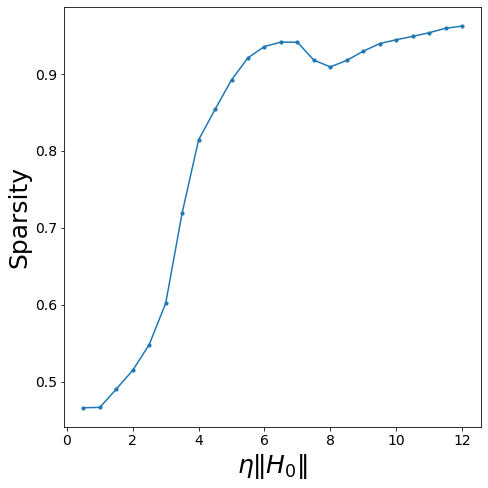

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=32**2*3
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='CIFAR10_01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

#result_dict_MLP = full_training_loop(arch,model_dict,
#           lr_ratios,
#           dataset_name,
#           train_batch_size,
#           max_epochs=max_epochs,
#           log_type=log_type,
#           stop_criterion=stop_criterion
#           ,printevery=50,
#           verbose=True,
#           write_file=True,
#           overwrite=True,
#           seed=123,
#           method='explicit')
#
#train_test_loss(arch,
#                model_dict,
#                lr_ratios,
#                dataset_name,
#                train_batch_size,
#                max_epochs=max_epochs,
#                stop_criterion=stop_criterion,
#                print_every=1,
#                overwrite=True,
#                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False)

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False)

computing averaged top eigenvalues and eigenvectors
[    0/  128]
lr_ratio is 0.5
seed is 123
initial max eigen 0.285579
epoch: 50, batch/total: 0/1, loss: 0.33879679441452026, NTK: 0.5115350723219626
old_loss is 0.34127575159072876.
loss_tot is 0.33879679441452026.
difference is 0.002478957176208496
epoch: 100, batch/total: 0/1, loss: 0.2522842288017273, NTK: 0.5280314133328212
old_loss is 0.2535199820995331.
loss_tot is 0.2522842288017273.
difference is 0.0012357532978057861
epoch: 150, batch/total: 0/1, loss: 0.2052609920501709, NTK: 0.5427984953291587
old_loss is 0.20598265528678894.
loss_tot is 0.2052609920501709.
difference is 0.000721663236618042
epoch: 200, batch/total: 0/1, loss: 0.17649312317371368, NTK: 0.5567506481655797
old_loss is 0.1769554615020752.
loss_tot is 0.17649312317371368.
difference is 0.00046233832836151123
epoch: 250, batch/total: 0/1, loss: 0.15744173526763916, NTK: 0.5683534486249205
old_loss is 0.15775808691978455.
loss_tot is 0.15744173526763916.
differen

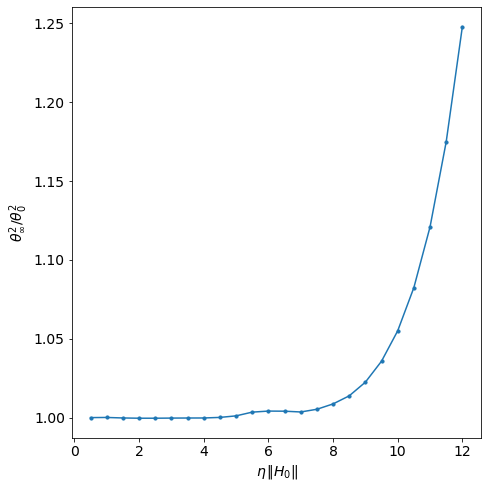

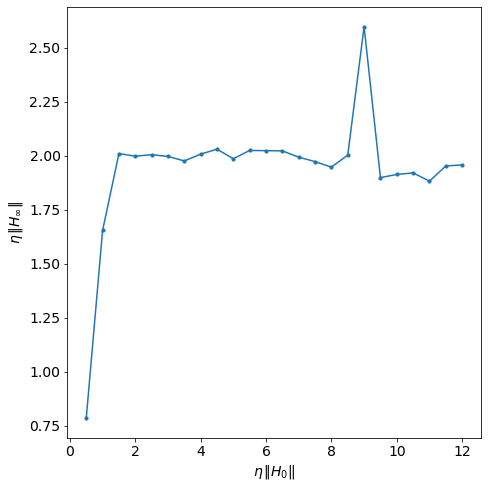

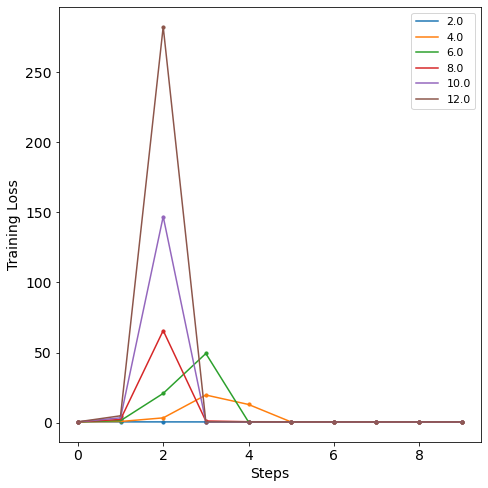

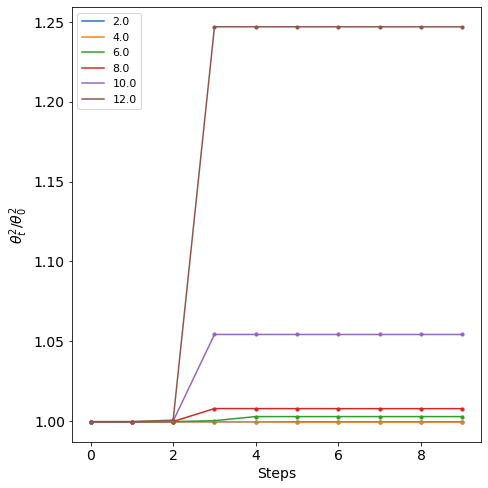

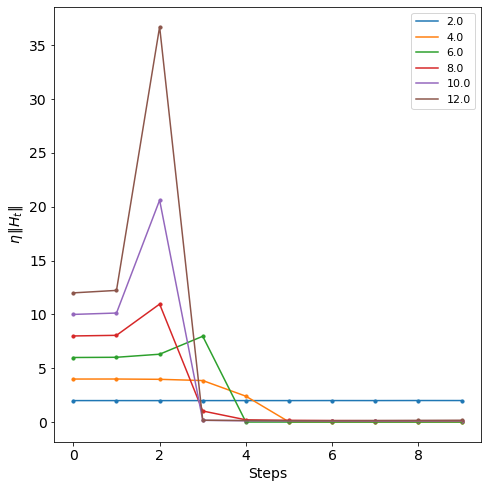

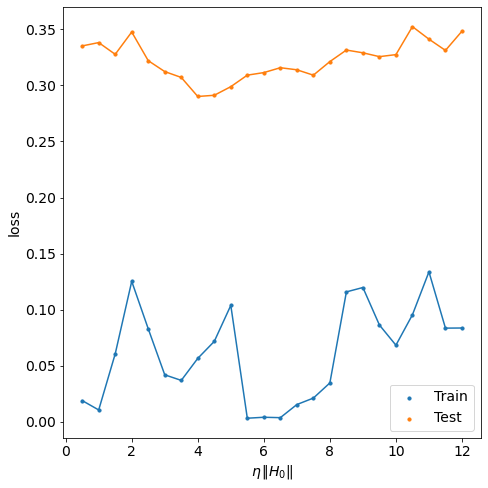

lr_ratio: 0.5
batch/total 0/1
batch/total 0/15
lr_ratio: 1.0
batch/total 0/1
batch/total 0/15
lr_ratio: 1.5
batch/total 0/1
batch/total 0/15
lr_ratio: 2.0
batch/total 0/1
batch/total 0/15
lr_ratio: 2.5
batch/total 0/1
batch/total 0/15
lr_ratio: 3.0
batch/total 0/1
batch/total 0/15
lr_ratio: 3.5
batch/total 0/1
batch/total 0/15
lr_ratio: 4.0
batch/total 0/1
batch/total 0/15
lr_ratio: 4.5
batch/total 0/1
batch/total 0/15
lr_ratio: 5.0
batch/total 0/1
batch/total 0/15
lr_ratio: 5.5
batch/total 0/1
batch/total 0/15
lr_ratio: 6.0
batch/total 0/1
batch/total 0/15
lr_ratio: 6.5
batch/total 0/1
batch/total 0/15
lr_ratio: 7.0
batch/total 0/1
batch/total 0/15
lr_ratio: 7.5
batch/total 0/1
batch/total 0/15
lr_ratio: 8.0
batch/total 0/1
batch/total 0/15
lr_ratio: 8.5
batch/total 0/1
batch/total 0/15
lr_ratio: 9.0
batch/total 0/1
batch/total 0/15
lr_ratio: 9.5
batch/total 0/1
batch/total 0/15
lr_ratio: 10.0
batch/total 0/1
batch/total 0/15
lr_ratio: 10.5
batch/total 0/1
batch/total 0/15
lr_ratio: 1

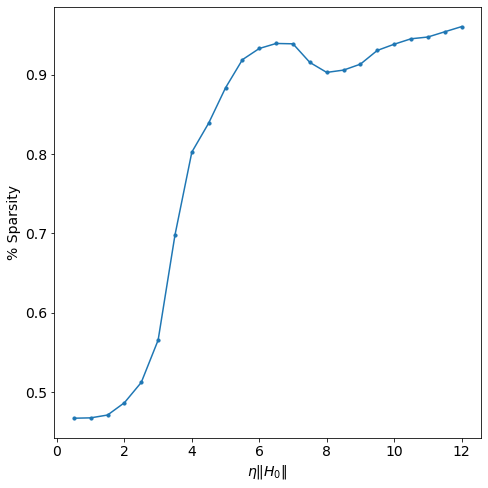

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=32**2*3
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='CIFAR10_01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-5

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           seed=123,
           method='explicit')

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False)

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False)

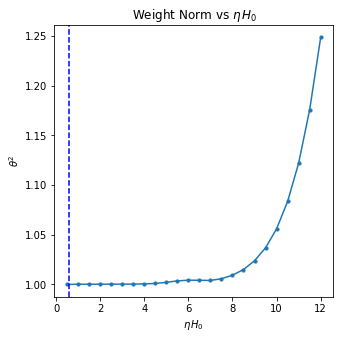

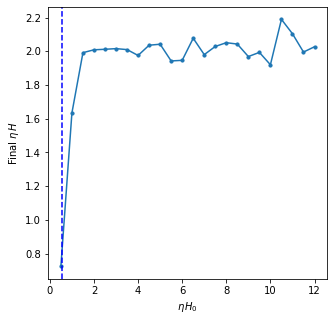

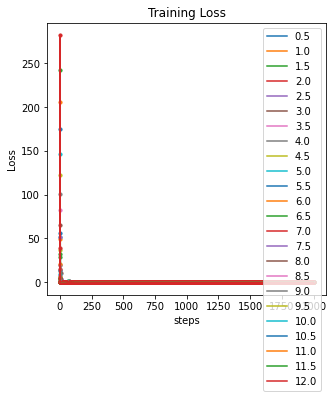

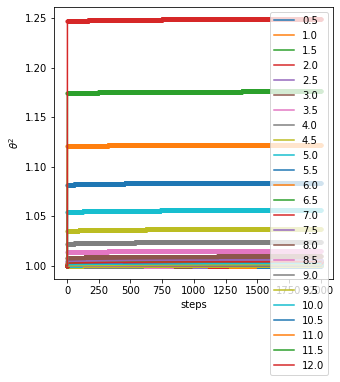

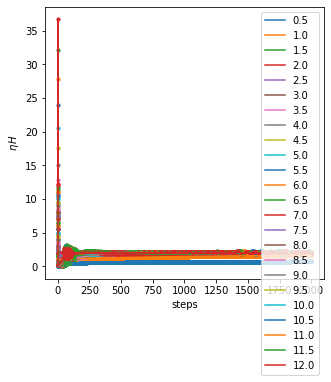

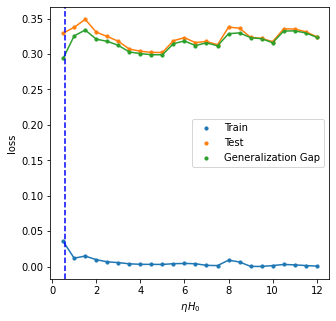

lr_ratio: 0.5
sparsity already computed
lr_ratio: 1.0
sparsity already computed
lr_ratio: 1.5
sparsity already computed
lr_ratio: 2.0
sparsity already computed
lr_ratio: 2.5
sparsity already computed
lr_ratio: 3.0
sparsity already computed
lr_ratio: 3.5
sparsity already computed
lr_ratio: 4.0
sparsity already computed
lr_ratio: 4.5
sparsity already computed
lr_ratio: 5.0
sparsity already computed
lr_ratio: 5.5
sparsity already computed
lr_ratio: 6.0
sparsity already computed
lr_ratio: 6.5
sparsity already computed
lr_ratio: 7.0
sparsity already computed
lr_ratio: 7.5
sparsity already computed
lr_ratio: 8.0
sparsity already computed
lr_ratio: 8.5
sparsity already computed
lr_ratio: 9.0
sparsity already computed
lr_ratio: 9.5
sparsity already computed
lr_ratio: 10.0
sparsity already computed
lr_ratio: 10.5
sparsity already computed
lr_ratio: 11.0
sparsity already computed
lr_ratio: 11.5
sparsity already computed
lr_ratio: 12.0
sparsity already computed


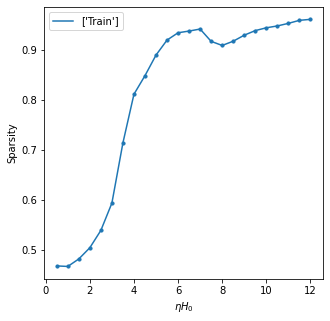

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=32**2*3
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='CIFAR10_01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=2000
log_type='batch'
stop_criterion=0

#model=MLP_General(**model_dict)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(5,5),
            s=10,
            write_file=True)

## MLP Two Hidden Layers: Small

### MNIST

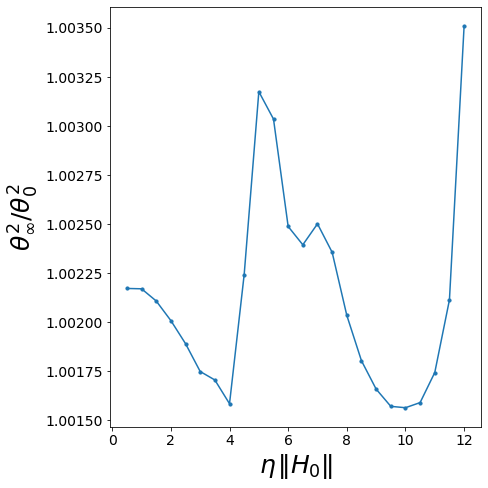

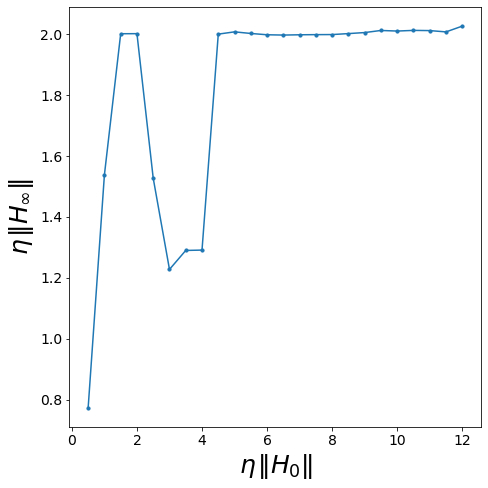

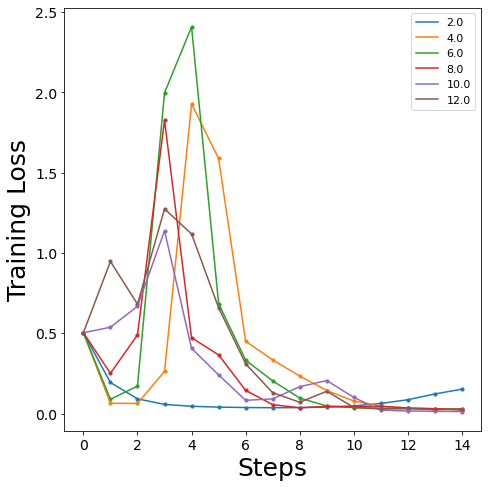

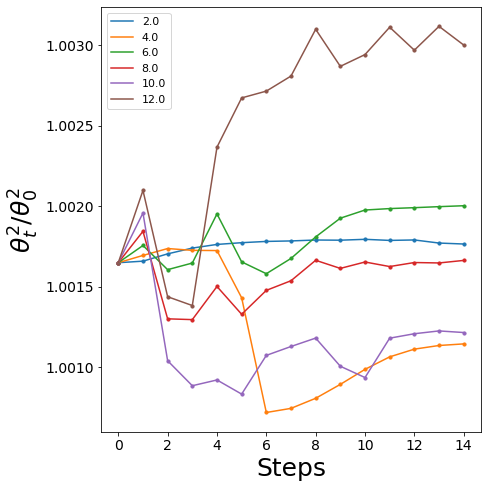

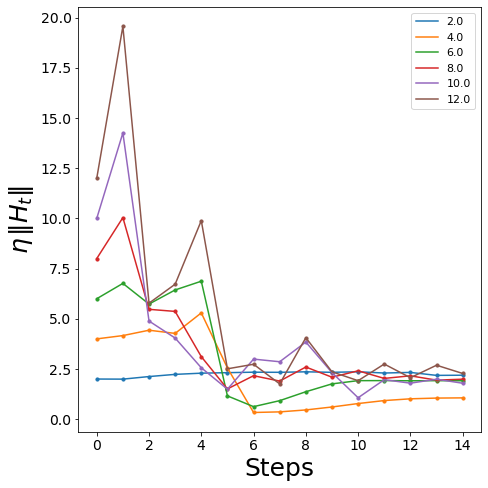

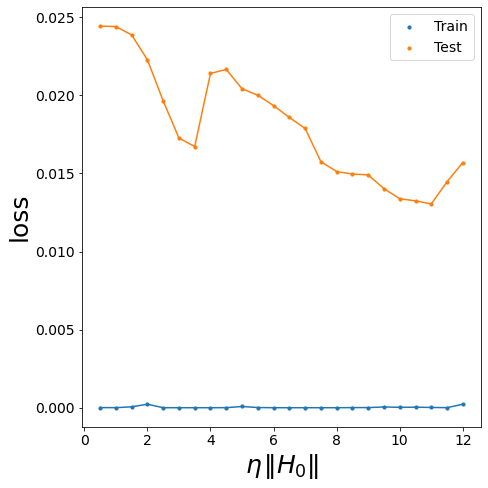

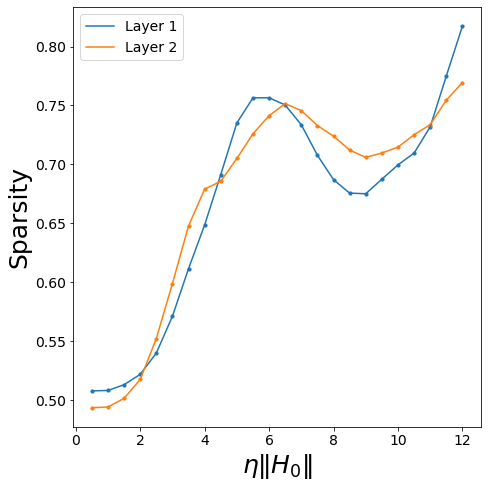

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False
seed=123

dataset_name='MNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
lr_ratios_plot=lr_ratios[1::2]
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

#result_dict_MLP = full_training_loop(arch,model_dict,
#           lr_ratios,
#           dataset_name,
#           train_batch_size,
#           max_epochs=max_epochs,
#           log_type=log_type,
#           stop_criterion=stop_criterion
#           ,printevery=100,
#           verbose=True,
#           write_file=True,
#           overwrite=False,
#           seed=seed,
#           method='explicit')
#
#check_sparsity_avg(arch,model_dict,      
#                       lr_ratios,
#                       dataset_name,
#                       train_batch_size,
#                       max_epochs=max_epochs,
#                       stop_criterion=stop_criterion,
#                       #partition='train',
#                       device=device,
#                       write_file=True,
#                       overwrite=False,
#                       printevery=25,
#                       verbose=True,
#                       seed=seed)
#
#train_test_loss(arch,
#                model_dict,
#                lr_ratios,
#                dataset_name,
#                train_batch_size,
#                max_epochs=max_epochs,
#                stop_criterion=stop_criterion,
#                print_every=1,
#                overwrite=False,
#                seed=seed)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    xmin=0,
    x_range=15,
    write_file=True,
    seed=seed,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False,
            seed=seed)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            seed=seed)


computing averaged top eigenvalues and eigenvectors
[    0/  128]
lr_ratio is 0.5
seed is 123
initial max eigen 0.036782
epoch: 100, batch/total: 0/1, loss: 0.015879055485129356, NTK: 0.5669955082012043
old_loss is 0.016008412465453148.
loss_tot is 0.015879055485129356.
difference is 0.0001293569803237915
epoch: 200, batch/total: 0/1, loss: 0.008109033107757568, NTK: 0.5819946219951284
old_loss is 0.008156982250511646.
loss_tot is 0.008109033107757568.
difference is 4.794914275407791e-05
epoch: 300, batch/total: 0/1, loss: 0.004709525499492884, NTK: 0.5937488036217976
old_loss is 0.004733413457870483.
loss_tot is 0.004709525499492884.
difference is 2.3887958377599716e-05
epoch: 400, batch/total: 0/1, loss: 0.0029275191482156515, NTK: 0.6028462407138263
old_loss is 0.002940658014267683.
loss_tot is 0.0029275191482156515.
difference is 1.3138866052031517e-05
epoch: 500, batch/total: 0/1, loss: 0.0019182713003829122, NTK: 0.6101399192792866
old_loss is 0.0019259859109297395.
loss_tot is 0

/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)


model diverges
lr_ratio: 0.5
batch/total 0/1
batch/total 0/16
lr_ratio: 1.0
batch/total 0/1
batch/total 0/16
lr_ratio: 1.5
batch/total 0/1
batch/total 0/16
lr_ratio: 2.0
batch/total 0/1
batch/total 0/16
lr_ratio: 2.5
batch/total 0/1
batch/total 0/16
lr_ratio: 3.0
batch/total 0/1
batch/total 0/16
lr_ratio: 3.5
batch/total 0/1
batch/total 0/16
lr_ratio: 4.0
batch/total 0/1
batch/total 0/16
lr_ratio: 4.5
batch/total 0/1
batch/total 0/16
lr_ratio: 5.0
batch/total 0/1
batch/total 0/16
lr_ratio: 5.5
batch/total 0/1
batch/total 0/16
lr_ratio: 6.0
batch/total 0/1
batch/total 0/16
lr_ratio: 6.5
batch/total 0/1
batch/total 0/16
lr_ratio: 7.0
batch/total 0/1
batch/total 0/16
lr_ratio: 7.5
batch/total 0/1
batch/total 0/16
lr_ratio: 8.0
batch/total 0/1
batch/total 0/16
lr_ratio: 8.5
batch/total 0/1
batch/total 0/16
lr_ratio: 9.0
batch/total 0/1
batch/total 0/16
lr_ratio: 9.5
batch/total 0/1
batch/total 0/16
lr_ratio: 10.0
batch/total 0/1
batch/total 0/16
lr_ratio: 10.5
batch/total 0/1
batch/total 0

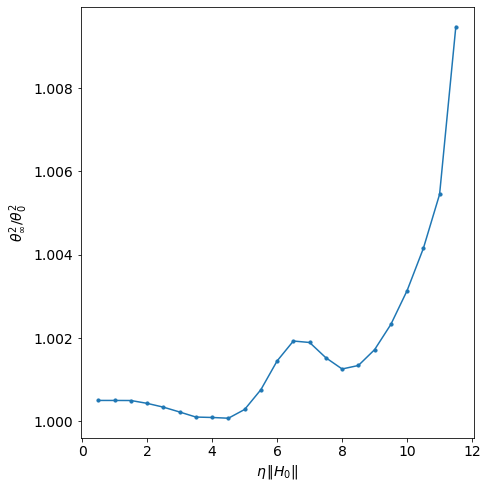

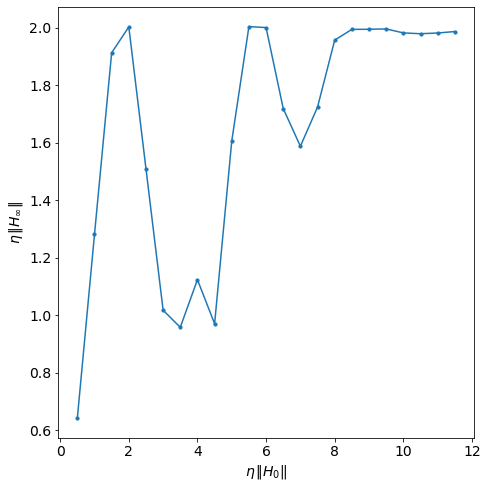

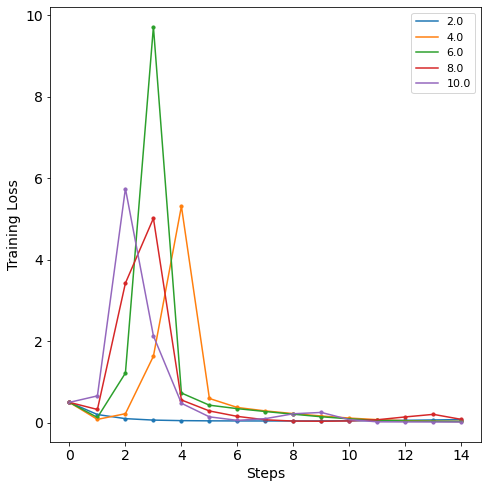

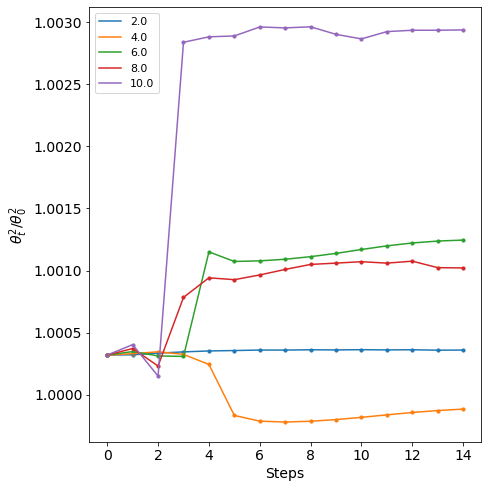

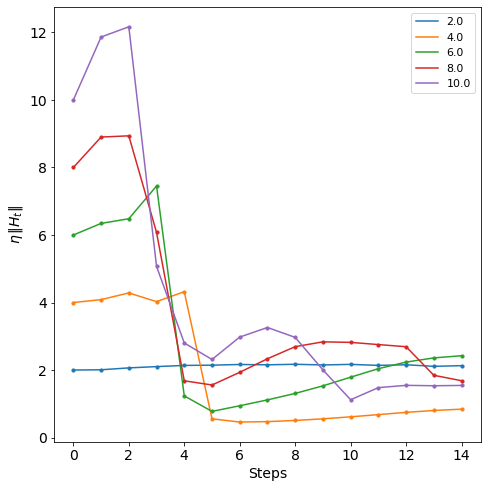

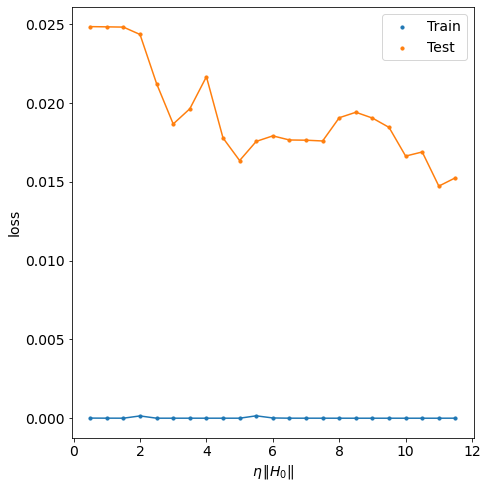

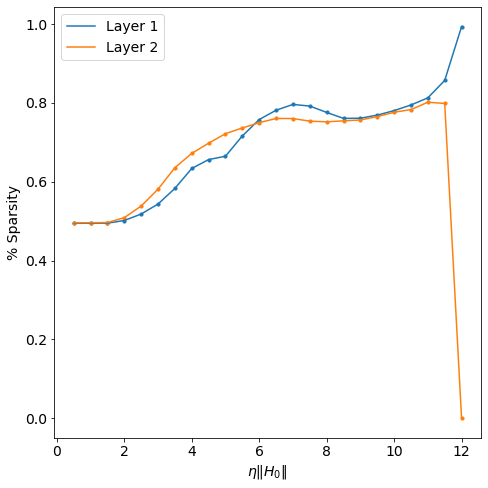

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=2048
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False
seed=123

dataset_name='MNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=100,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=seed,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                      overwrite=False,
                       printevery=25,
                       verbose=True,
                       seed=seed)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=seed)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False,
                   seed=seed)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    xmin=0,
    x_range=15,
    write_file=True,
    seed=seed,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            include_gen_gap=False,
            seed=seed)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False,
            seed=seed)


### FMNIST

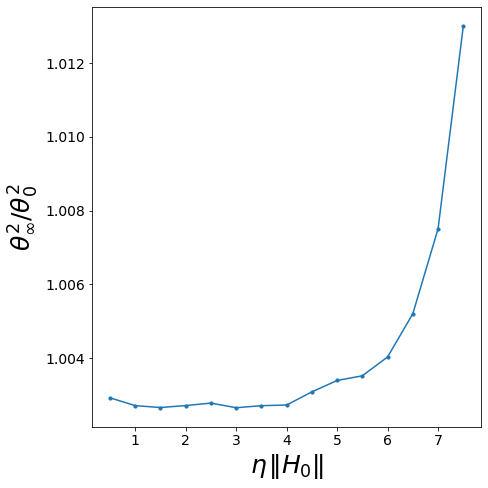

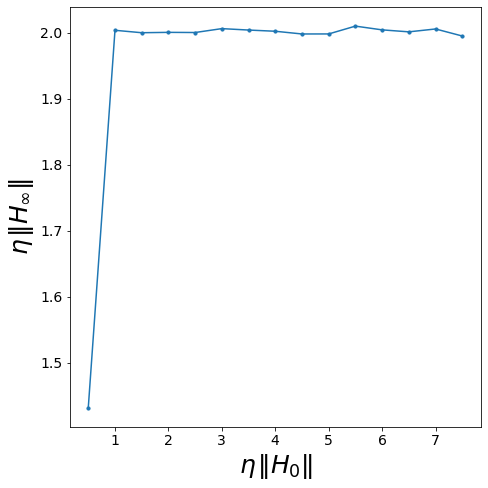

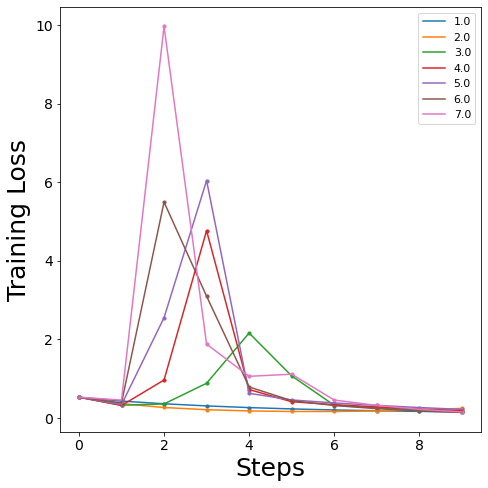

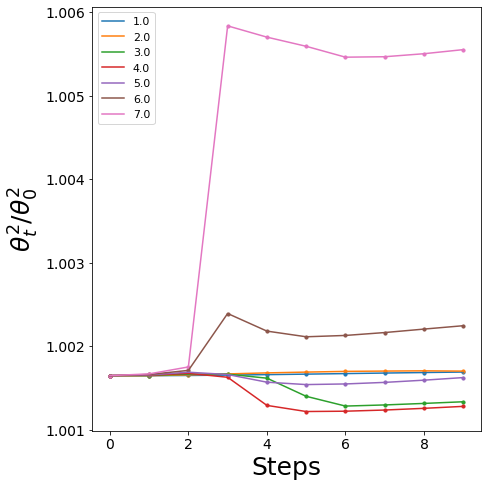

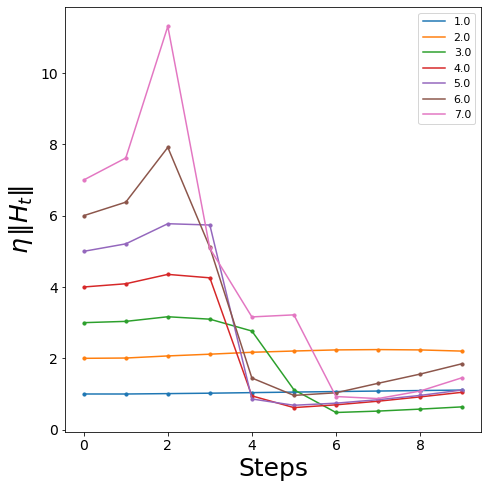

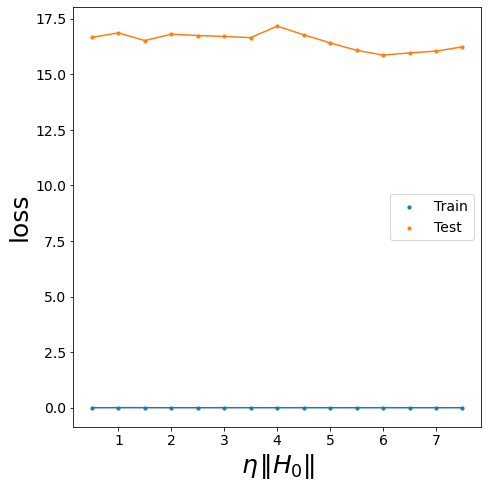

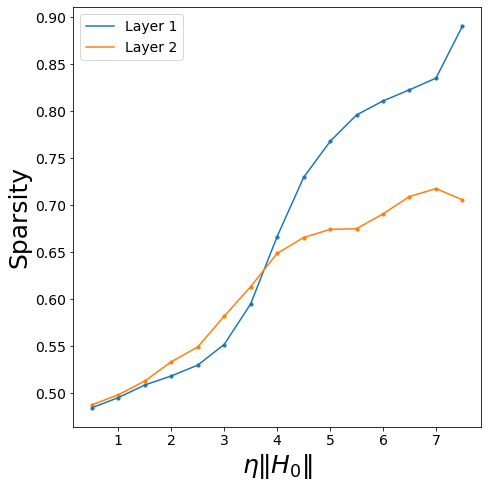

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='FMNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,7.5+.5,.5)
lr_ratios_plot=lr_ratios[1::2]
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

#result_dict_MLP = full_training_loop(arch,model_dict,
#           lr_ratios,
#           dataset_name,
#           train_batch_size,
 #          max_epochs=max_epochs,
 #          log_type=log_type,
  #         stop_criterion=stop_criterion
#           ,printevery=50,
 #          verbose=True,
  #         write_file=True,
   #        overwrite=False,
   #        seed=123,
   #        method='explicit')

#check_sparsity_avg(arch,model_dict,      
#                       lr_ratios,
#                       dataset_name,
#                       train_batch_size,
#                       max_epochs=max_epochs,
#                       stop_criterion=stop_criterion,
#                      #partition='train',
#                       device=device,
#                       write_file=True,
#                       overwrite=False,
#                       printevery=25,
#                       verbose=True)
#
#train_test_loss(arch,
#                model_dict,
#                lr_ratios,
#                dataset_name,
#                train_batch_size,
#                max_epochs=max_epochs,
#                stop_criterion=stop_criterion,
#                print_every=1,
#                overwrite=False,
#                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,include_predictions=False,
            include_gen_gap=False)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,include_predictions=False)


In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=4096
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='FMNIST01_small'
train_batch_size=128

lr_ratios=list(map(lambda x:np.round(x,2),np.arange(0.1,2+.1,.1)))
max_epochs=100000
log_type='epoch'
stop_criterion=10**-9

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')

#check_sparsity_avg(arch,model_dict,      
#                       lr_ratios,
#                       dataset_name,
#                       train_batch_size,
#                       max_epochs=max_epochs,
#                       stop_criterion=stop_criterion,
#                       #partition='train',
#                       device=device,
#                       write_file=True,
#                       overwrite=False,
#                       printevery=25,
#                       verbose=True)

#train_test_loss(arch,
#                model_dict,
#                lr_ratios,
#                dataset_name,
#                train_batch_size,
#                max_epochs=max_epochs,
#                stop_criterion=stop_criterion,
#                print_every=1,
#                overwrite=False,
#                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

#plot_results_vs_step(
#    arch=arch,
#    model_dict=model_dict,
#    lr_ratios=lr_ratios[3::4],
#    dataset_name=dataset_name,
#    train_batch_size=train_batch_size,
#    max_epochs=max_epochs,
#    stop_criterion=stop_criterion,
#    x_range=10**10,
#    write_file=True,
#    size=(7,7))
#
#plot_generalization_loss(arch,
#            model_dict,
#            lr_ratios,
#            dataset_name,
#            train_batch_size,
#            max_epochs=max_epochs,
#            stop_criterion=stop_criterion,
#            #title=None,
#            #xlabel=None,
#            #ylabel=None,
#            size=(7,7),
#            s=10,
#            write_file=True,include_predictions=False,
#            include_gen_gap=False)
#
#
#
#plot_sparsity(arch,
#            model_dict,
#            lr_ratios,
#            dataset_name,
#            train_batch_size,
#            max_epochs=max_epochs,
#            stop_criterion=stop_criterion,
#            size=(7,7),
#            s=10,
#            write_file=True,include_predictions=False)
#

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=2048*2+1
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='FMNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,2+.5,.5)
max_epochs=100
log_type='epoch'
stop_criterion=10**-9

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=10,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=2000,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,include_predictions=False,
            include_gen_gap=False)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,include_predictions=False)


computing averaged top eigenvalues and eigenvectors
[    0/  128]
lr_ratio is 0.5
seed is 123
initial max eigen 0.103196
epoch: 10, batch/total: 0/1, loss: 0.24644875526428223, NTK: 0.5068471600045023
old_loss is 0.2641230821609497.
loss_tot is 0.24644875526428223.
difference is 0.01767432689666748
epoch: 20, batch/total: 0/1, loss: 0.14804919064044952, NTK: 0.5211209059071695
old_loss is 0.1536094844341278.
loss_tot is 0.14804919064044952.
difference is 0.005560293793678284
epoch: 30, batch/total: 0/1, loss: 0.11592503637075424, NTK: 0.532477595664475
old_loss is 0.11786477267742157.
loss_tot is 0.11592503637075424.
difference is 0.0019397363066673279
epoch: 40, batch/total: 0/1, loss: 0.10342691838741302, NTK: 0.5404538618369408
old_loss is 0.1043040007352829.
loss_tot is 0.10342691838741302.
difference is 0.000877082347869873
epoch: 50, batch/total: 0/1, loss: 0.09681282192468643, NTK: 0.5460813431504467
old_loss is 0.09735187888145447.
loss_tot is 0.09681282192468643.
difference is

KeyboardInterrupt: ignored

computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.5
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.5
training already done
lr_ratio is 2.0
training already done
lr_ratio: 0.5
sparsity already computed
lr_ratio: 1.0
sparsity already computed
lr_ratio: 1.5
sparsity already computed
lr_ratio: 2.0
sparsity already computed
lr ratio is 0.5
loss already computed
lr ratio is 1.0
loss already computed
lr ratio is 1.5
loss already computed
lr ratio is 2.0
loss already computed


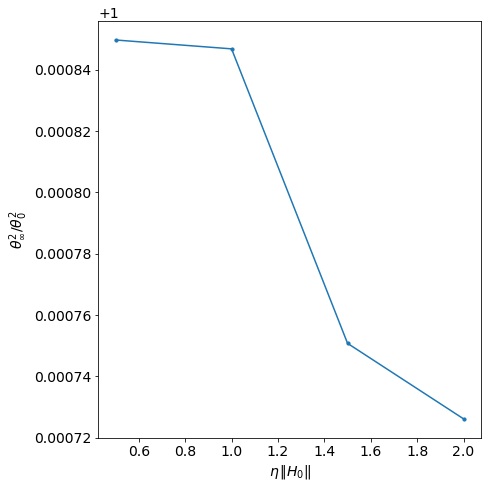

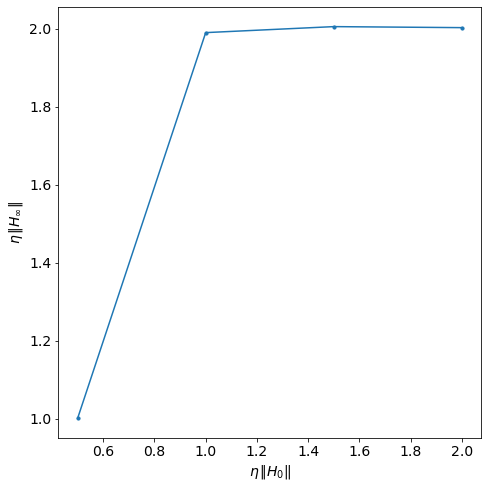

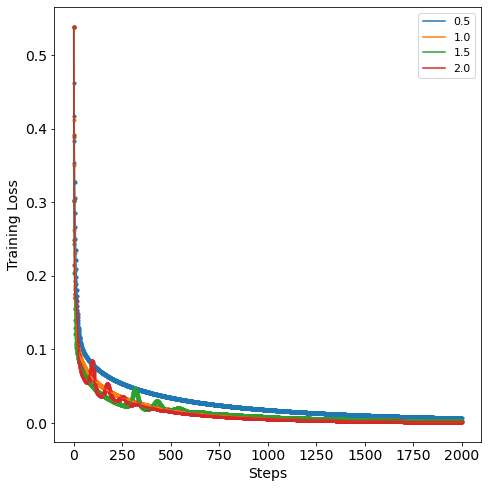

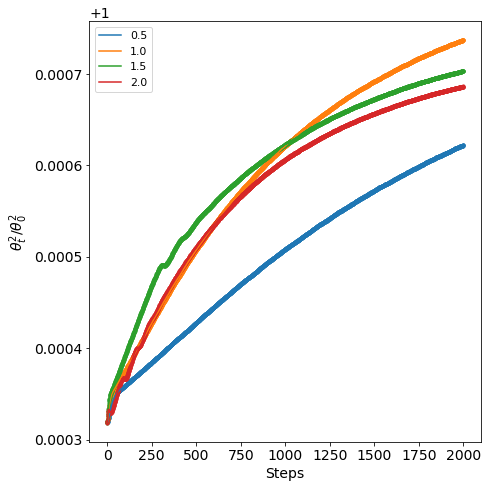

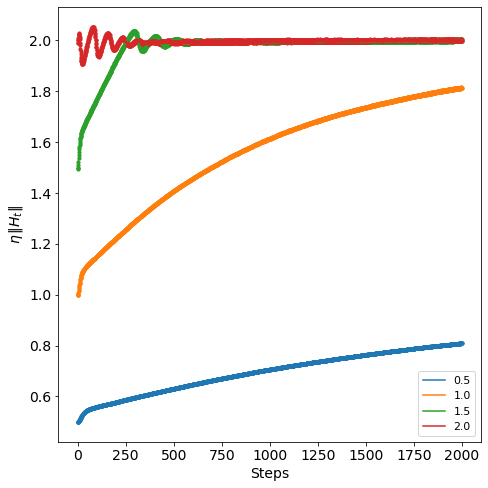

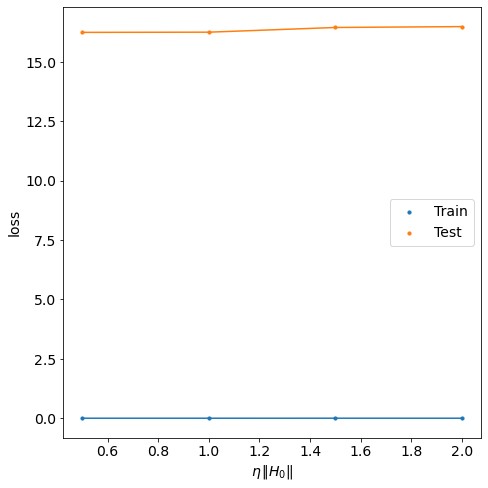

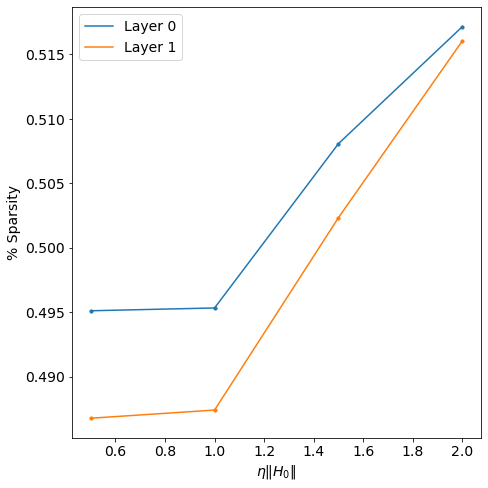

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=2048
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='FMNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,2+.5,.5)
max_epochs=100000
log_type='epoch'
stop_criterion=10**-9

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=2000,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,include_predictions=False,
            include_gen_gap=False)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,include_predictions=False)


### CIFAR10

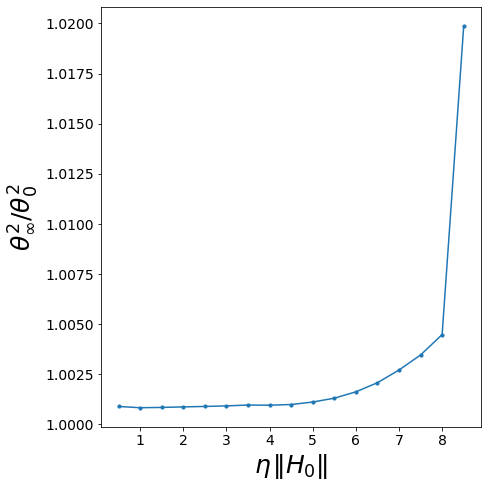

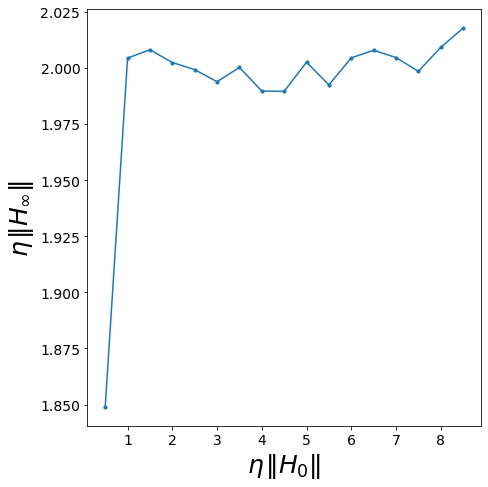

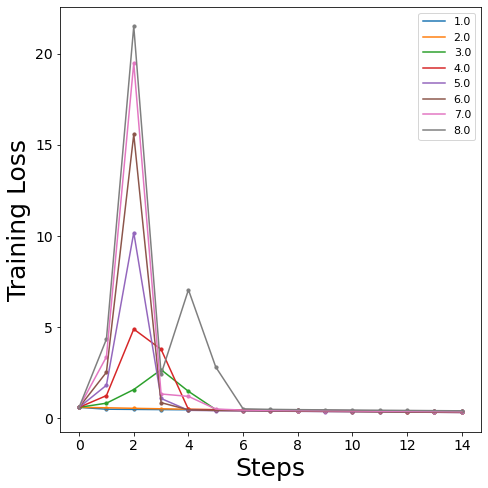

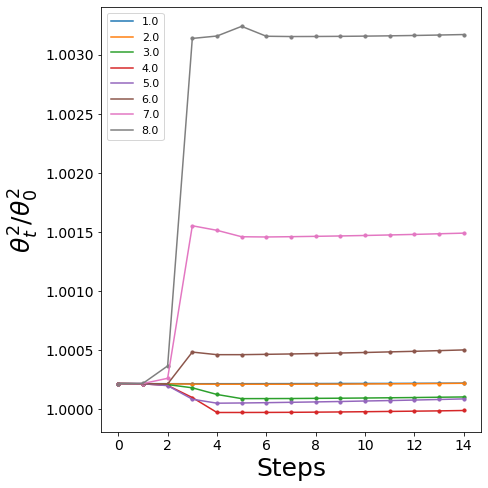

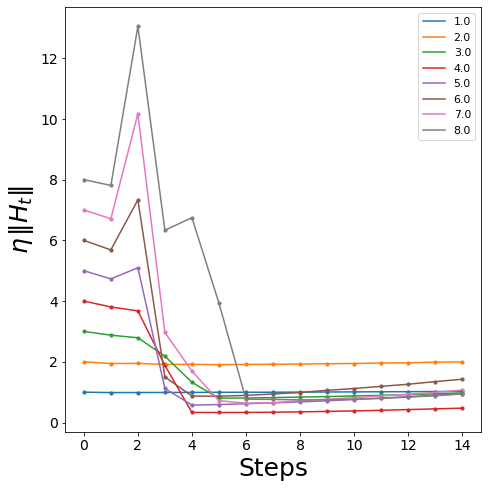

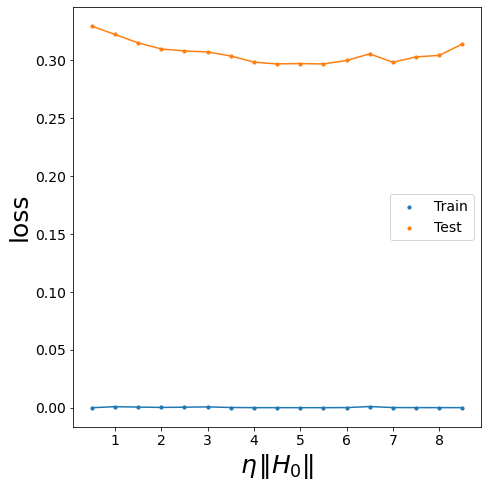

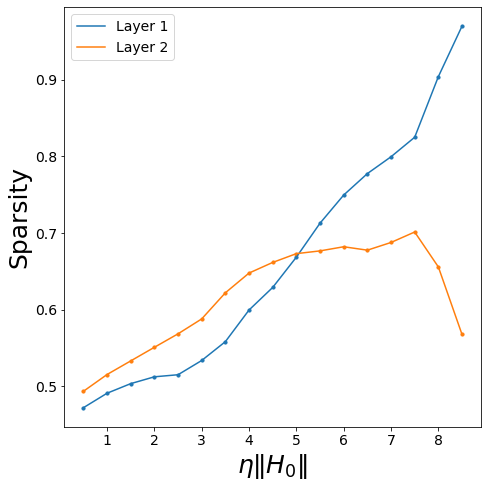

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=3*32**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='CIFAR10_01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,8.5+.5,.5)
lr_ratios_plot=lr_ratios[1::2]
max_epochs=100000
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

#result_dict_MLP = full_training_loop(arch,model_dict,
#           lr_ratios,
#           dataset_name,
#           train_batch_size,
#           max_epochs=max_epochs,
#           log_type=log_type,
#           stop_criterion=stop_criterion
#           ,printevery=50,
#           verbose=True,
 #          write_file=True,
 #          overwrite=False,
 #          seed=123,
 #          method='explicit')

#check_sparsity_avg(arch,model_dict,      
#                       lr_ratios,
#                       dataset_name,
#                       train_batch_size,
#                       max_epochs=max_epochs,
#                       stop_criterion=stop_criterion,
#                       #partition='train',
#                       device=device,
#                       write_file=True,
 #                      overwrite=False,
 #                      printevery=25,
 #                      verbose=True)

#train_test_loss(arch,
#                model_dict,
 #               lr_ratios,
 #               dataset_name,
 #               train_batch_size,
 #               max_epochs=max_epochs,
 #               stop_criterion=stop_criterion,
 #               print_every=1,
 #               overwrite=False,
 #               seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios_plot,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=15,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_gen_gap=False,
            include_predictions=False)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False)


computing averaged top eigenvalues and eigenvectors
[    0/  128]
lr_ratio is 0.5
seed is 123
initial max eigen 0.181702
epoch: 10, batch/total: 0/1, loss: 0.44297361373901367, NTK: 0.5018867359750562
old_loss is 0.44783955812454224.
loss_tot is 0.44297361373901367.
difference is 0.0048659443855285645
epoch: 20, batch/total: 0/1, loss: 0.39880818128585815, NTK: 0.5070660851694425
old_loss is 0.4028704762458801.
loss_tot is 0.39880818128585815.
difference is 0.004062294960021973
epoch: 30, batch/total: 0/1, loss: 0.3623064458370209, NTK: 0.5140633239323886
old_loss is 0.3656703233718872.
loss_tot is 0.3623064458370209.
difference is 0.003363877534866333
epoch: 40, batch/total: 0/1, loss: 0.331419438123703, NTK: 0.5226104064275234
old_loss is 0.33429664373397827.
loss_tot is 0.331419438123703.
difference is 0.0028772056102752686
epoch: 50, batch/total: 0/1, loss: 0.3051958680152893, NTK: 0.5325244119762403
old_loss is 0.30765026807785034.
loss_tot is 0.3051958680152893.
difference is 0.0

<ipython-input-24-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)
/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


epoch: 10, batch/total: 0/1, loss: 3.029362822547246e+34, NTK: 0.0
old_loss is 4994563072.0.
loss_tot is 3.029362822547246e+34.
difference is 3.029362822547246e+34
saving_model
lr_ratio is 9.0
seed is 123
initial max eigen 0.181702
epoch: 10, batch/total: 0/1, loss: 0.5, NTK: 0.0
old_loss is 0.5.
loss_tot is 0.5.
difference is 0.0
saving_model
lr_ratio is 9.5
seed is 123
initial max eigen 0.181702
model diverges
lr_ratio is 10.0
seed is 123
initial max eigen 0.181702
saving_model
lr_ratio is 10.5
seed is 123
initial max eigen 0.181702
model diverges
lr_ratio is 11.0
seed is 123
initial max eigen 0.181702
model diverges
lr_ratio is 11.5
seed is 123
initial max eigen 0.181702
model diverges
lr_ratio is 12.0
seed is 123
initial max eigen 0.181702
model diverges
lr_ratio: 0.5
batch/total 0/1
batch/total 0/15
lr_ratio: 1.0
batch/total 0/1
batch/total 0/15
lr_ratio: 1.5
batch/total 0/1
batch/total 0/15
lr_ratio: 2.0
batch/total 0/1
batch/total 0/15
lr_ratio: 2.5
batch/total 0/1
batch/total 0

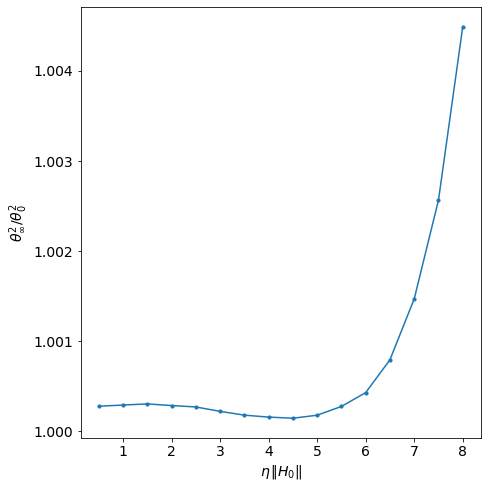

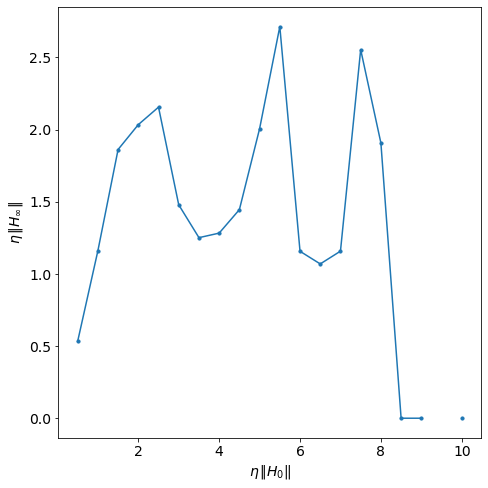

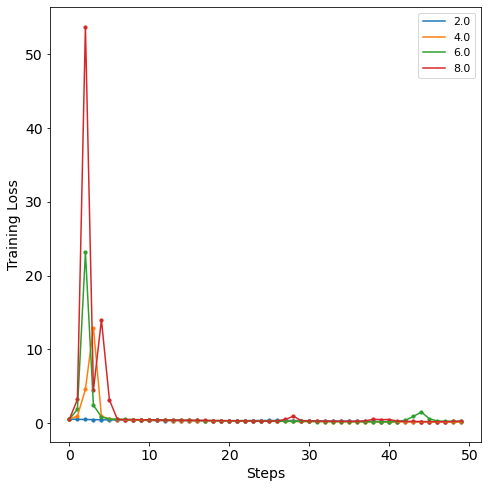

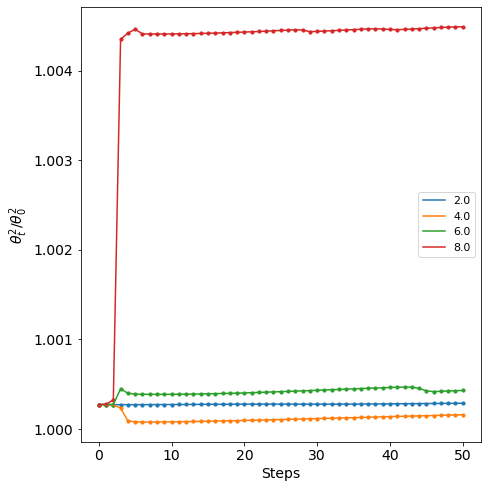

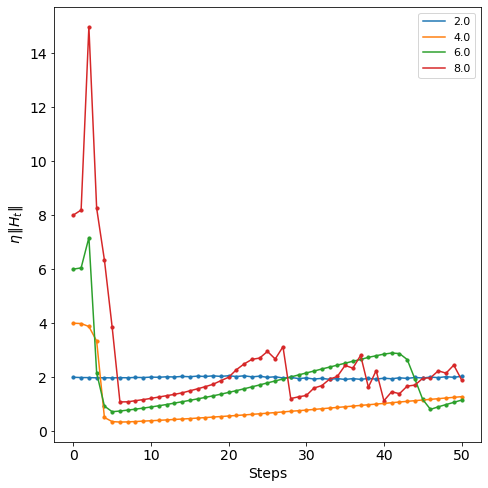

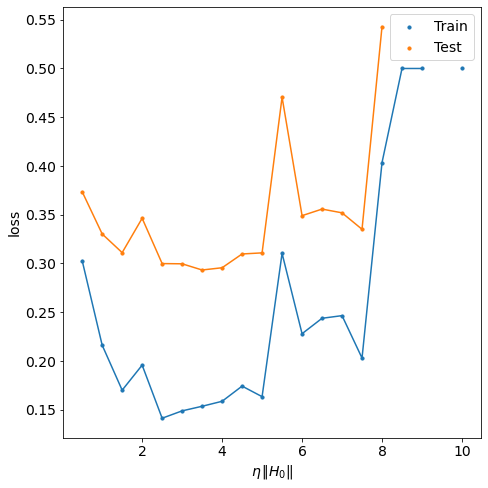

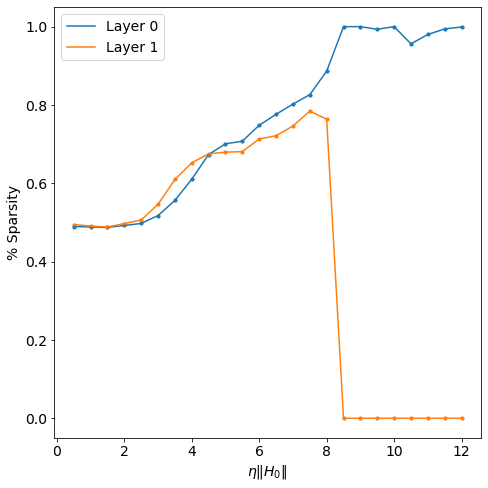

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=3*32**2
model_dict['width']=2049
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='CIFAR10_01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=50
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=10,
           verbose=True,
           write_file=True,
           overwrite=True,
           seed=123,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=True,
                       printevery=25,
                       verbose=True)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_gen_gap=False,
            include_predictions=False)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False)


In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=3*32**2
model_dict['width']=2048
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='CIFAR10_01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100
log_type='epoch'
stop_criterion=10**-8

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=10,
           verbose=True,
           write_file=True,
           overwrite=True,
           seed=123,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(7,7),
                   s=10,
                   write_file=True,
                   include_predictions=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[3::4],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True,
    size=(7,7))

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(7,7),
            s=10,
            write_file=True,
            include_gen_gap=False,
            include_predictions=False)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(7,7),
            s=10,
            write_file=True,
            include_predictions=False)


computing averaged top eigenvalues and eigenvectors
[    0/  128]
lr_ratio is 0.5
seed is 123
initial max eigen 0.207892
epoch: 10, batch/total: 0/1, loss: 0.44691139459609985, NTK: 0.5007763368569417
old_loss is 0.4512157738208771.
loss_tot is 0.44691139459609985.
difference is 0.004304379224777222
epoch: 20, batch/total: 0/1, loss: 0.407890260219574, NTK: 0.5038413299637355
old_loss is 0.41149795055389404.
loss_tot is 0.407890260219574.
difference is 0.0036076903343200684
epoch: 30, batch/total: 0/1, loss: 0.3747888505458832, NTK: 0.5070738687637343
old_loss is 0.3778819441795349.
loss_tot is 0.3747888505458832.
difference is 0.0030930936336517334
epoch: 40, batch/total: 0/1, loss: 0.3462620675563812, NTK: 0.5114886171427162
old_loss is 0.34892740845680237.
loss_tot is 0.3462620675563812.
difference is 0.0026653409004211426
epoch: 50, batch/total: 0/1, loss: 0.3214647173881531, NTK: 0.5163435358327018
old_loss is 0.3237929344177246.
loss_tot is 0.3214647173881531.
difference is 0.002

##MLP Three Hidden Layers: MNIST01_small

### MNIST

computing averaged top eigenvalues and eigenvectors
eigenvalues already computed
lr_ratio is 0.5
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.5
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.5
training already done
lr_ratio is 3.0
training already done
lr_ratio is 3.5
training already done
lr_ratio is 4.0
training already done
lr_ratio is 4.5
training already done
lr_ratio is 5.0
training already done
lr_ratio is 5.5
training already done
lr_ratio is 6.0
training already done
lr_ratio is 6.5
training already done
lr_ratio is 7.0
training already done
lr_ratio is 7.5
training already done
lr_ratio is 8.0
training already done
lr_ratio is 8.5
training already done
lr_ratio is 9.0
training already done
lr_ratio is 9.5
training already done
lr_ratio is 10.0
training already done
lr_ratio is 10.5
training already done
lr_ratio is 11.0
training already done
lr_ratio is 11.5
training already done
lr_ratio is 12.0
training already done
lr

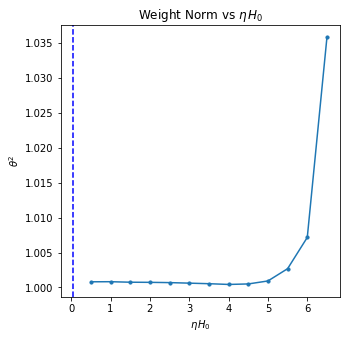

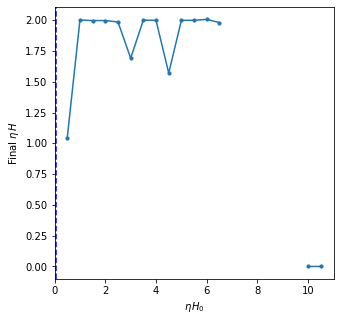

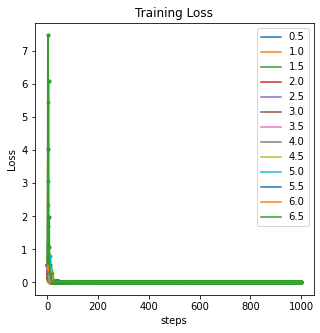

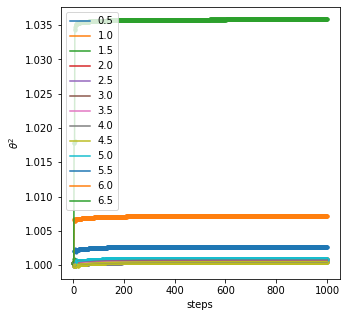

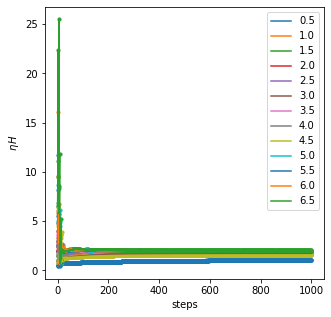

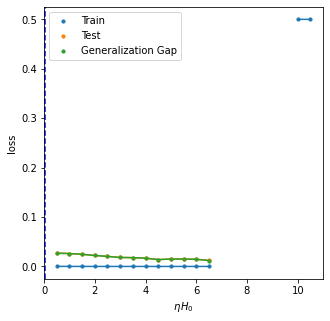

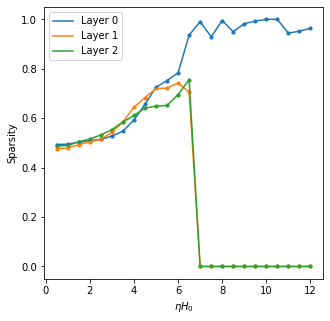

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=3
model_dict['bias_value']=False

dataset_name='MNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=1000
log_type='batch'
stop_criterion=0

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(5,5),
            s=10,
            write_file=True)


### FMNIST

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=3
model_dict['bias_value']=False

dataset_name='FMNIST01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=1000
log_type='batch'
stop_criterion=0

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(5,5),
            s=10,
            write_file=True)


Streaming output truncated to the last 5000 lines.
epoch: 327, batch/total: 0/1, loss: 0.005432983860373497, NTK: 1.8135313363508452
epoch: 328, batch/total: 0/1, loss: 0.0050813667476177216, NTK: 1.9007666683618982
epoch: 329, batch/total: 0/1, loss: 0.004716585390269756, NTK: 1.837123164205756
epoch: 330, batch/total: 0/1, loss: 0.004511420149356127, NTK: 1.9114463431035167
epoch: 331, batch/total: 0/1, loss: 0.004299415275454521, NTK: 1.8615864822255
epoch: 332, batch/total: 0/1, loss: 0.004167813807725906, NTK: 1.931863285245272
epoch: 333, batch/total: 0/1, loss: 0.004038773477077484, NTK: 1.886585917148395
epoch: 334, batch/total: 0/1, loss: 0.0039565684273839, NTK: 1.947136754310126
epoch: 335, batch/total: 0/1, loss: 0.003871924476698041, NTK: 1.909483689049371
epoch: 336, batch/total: 0/1, loss: 0.0038153869099915028, NTK: 1.9642793571682857
epoch: 337, batch/total: 0/1, loss: 0.0037563457153737545, NTK: 1.9300194386524043
epoch: 338, batch/total: 0/1, loss: 0.0037183100357651

<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)
/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


epoch: 1, batch/total: 0/1, loss: 0.5510767698287964, NTK: 12.78773423088126
epoch: 2, batch/total: 0/1, loss: 2.22930908203125, NTK: 35.078819934070914
epoch: 3, batch/total: 0/1, loss: 16.13133430480957, NTK: 101.22851502360224
epoch: 4, batch/total: 0/1, loss: 12.08432674407959, NTK: 3168.492043662994
epoch: 5, batch/total: 0/1, loss: 2277.68408203125, NTK: 1896040047522.6763
epoch: 6, batch/total: 0/1, loss: 286993942577152.0, NTK: inf
epoch: 7, batch/total: 0/1, loss: inf, NTK: inf
model diverges
lr_ratio is 9.5
seed is 123
initial max eigen 0.072518
epoch: 1, batch/total: 0/1, loss: 0.5510767698287964, NTK: 14.075708619532046
epoch: 2, batch/total: 0/1, loss: 2.4686598777770996, NTK: 44.96463161852981
epoch: 3, batch/total: 0/1, loss: 20.241960525512695, NTK: 264.19696491949964
epoch: 4, batch/total: 0/1, loss: 32.569923400878906, NTK: 169669.83839472898
epoch: 5, batch/total: 0/1, loss: 390734.125, NTK: 1.7206800362361978e+22
epoch: 6, batch/total: 0/1, loss: 5.285421322171917e+

### CIFAR10

Streaming output truncated to the last 5000 lines.
epoch: 1304, batch/total: 0/1, loss: 8.517794049112126e-05, NTK: 1.9763028193345271
epoch: 1305, batch/total: 0/1, loss: 8.269342652056366e-05, NTK: 1.9602950000265773
epoch: 1306, batch/total: 0/1, loss: 8.095291559584439e-05, NTK: 1.9798087508836901
epoch: 1307, batch/total: 0/1, loss: 7.91083148214966e-05, NTK: 1.9637433998793712
epoch: 1308, batch/total: 0/1, loss: 7.789447408868e-05, NTK: 1.9838303415287861
epoch: 1309, batch/total: 0/1, loss: 7.632248161826283e-05, NTK: 1.9672091843099808
epoch: 1310, batch/total: 0/1, loss: 7.550288864877075e-05, NTK: 1.9883412017308286
epoch: 1311, batch/total: 0/1, loss: 7.42030970286578e-05, NTK: 1.9713154466038634
epoch: 1312, batch/total: 0/1, loss: 7.357756840065122e-05, NTK: 1.9929474895075006
epoch: 1313, batch/total: 0/1, loss: 7.253612420754507e-05, NTK: 1.9760703162398534
epoch: 1314, batch/total: 0/1, loss: 7.225637091323733e-05, NTK: 1.9944031664945407
epoch: 1315, batch/total: 0/1,

<ipython-input-25-24ca23483f68>:20: RuntimeWarning: overflow encountered in square
  result+=np.sum(e.detach().cpu().numpy()**2)
/usr/local/lib/python3.8/dist-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


model diverges
lr_ratio is 10.0
seed is 123
initial max eigen 0.119144
epoch: 1, batch/total: 0/1, loss: 0.5404675006866455, NTK: 11.93990689245356
epoch: 2, batch/total: 0/1, loss: 3.405683755874634, NTK: 16.391712058862428
epoch: 3, batch/total: 0/1, loss: 5.867918014526367, NTK: 24.464025649131067
epoch: 4, batch/total: 0/1, loss: 2.0009090900421143, NTK: 127.19628720448172
epoch: 5, batch/total: 0/1, loss: 142.41246032714844, NTK: 12433.069364152812
epoch: 6, batch/total: 0/1, loss: 3897.08740234375, NTK: 35307964814521.805
epoch: 7, batch/total: 0/1, loss: 5.816707709717709e+16, NTK: inf
epoch: 8, batch/total: 0/1, loss: inf, NTK: inf
model diverges
lr_ratio is 10.5
seed is 123
initial max eigen 0.119144
epoch: 1, batch/total: 0/1, loss: 0.5404675006866455, NTK: 12.88881199235704
epoch: 2, batch/total: 0/1, loss: 3.7012617588043213, NTK: 20.11665758353743
epoch: 3, batch/total: 0/1, loss: 6.875456809997559, NTK: 48.6524094368241
epoch: 4, batch/total: 0/1, loss: 4.085862636566162,

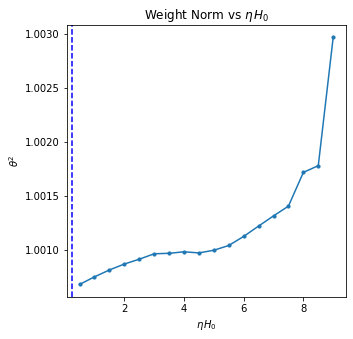

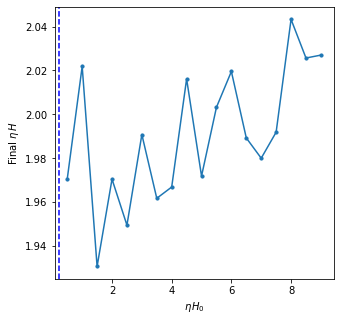

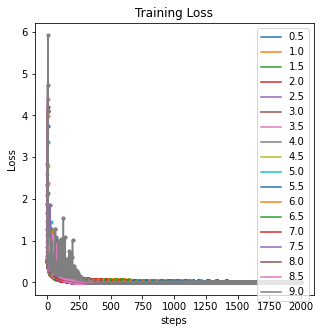

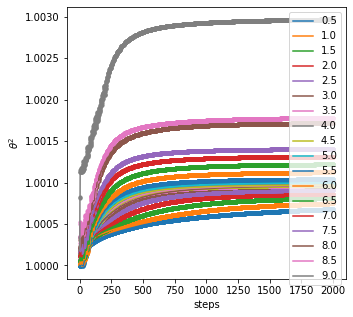

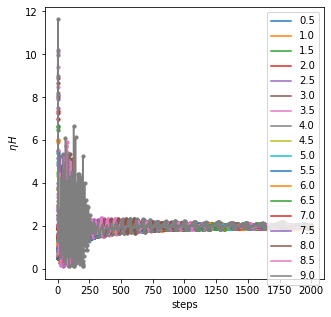

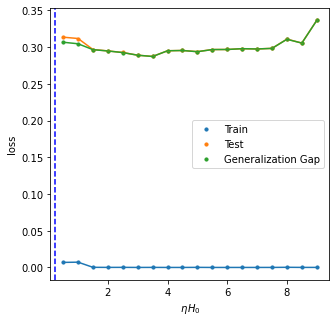

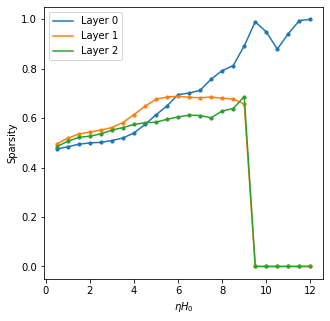

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=3*32**2
model_dict['width']=1024
model_dict['activation']='relu'
model_dict['num_layers']=3
model_dict['bias_value']=False

dataset_name='CIFAR10_01_small'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=2000
log_type='batch'
stop_criterion=0

model=MLP_General(**model_dict)

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')

check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=123)

plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=True)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios,
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)



plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            size=(5,5),
            s=10,
            write_file=True)


## MLP One Hidden Layer + Pooling, MNIST01

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=(28/4)**2
model_dict['width']=512
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

pool_dict={}
pool_dict['kernel_size']=4
pool_dict['stride']=4

model_dict['pool_dict']=pool_dict

dataset_name='MNIST01'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=100
log_type='batch'
stop_criterion=0

model=MLP_General(**model_dict)
#model(data['MNIST01','train'][0][0])

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit',
           single_batch=False)



computing averaged top eigenvalues and eigenvectors
[    0/12665]
[ 6400/12665]
lr_ratio is 0.5
initial max eigen 0.141310
epoch: 1, batch/total: 0/98, loss: 0.4151668846607208, NTK: 0.385124930719413
epoch: 1, batch/total: 50/98, loss: 0.02326224185526371, NTK: 0.32366229415124215
epoch: 2, batch/total: 0/98, loss: 0.022364534437656403, NTK: 0.28950722838002796
epoch: 2, batch/total: 50/98, loss: 0.016392607241868973, NTK: 0.25235198102407885
epoch: 3, batch/total: 0/98, loss: 0.014377498999238014, NTK: 0.245556551939983
epoch: 3, batch/total: 50/98, loss: 0.014825450256466866, NTK: 0.23924811687561215
epoch: 4, batch/total: 0/98, loss: 0.013997507281601429, NTK: 0.23902200591869222
epoch: 4, batch/total: 50/98, loss: 0.008419185876846313, NTK: 0.25693712739276375
epoch: 5, batch/total: 0/98, loss: 0.010362474247813225, NTK: 0.22103908015626833
epoch: 5, batch/total: 50/98, loss: 0.0069297365844249725, NTK: 0.23063960850246795
epoch: 6, batch/total: 0/98, loss: 0.007070963736623526, N

KeyboardInterrupt: ignored

lr ratio is 0.5


/usr/local/lib/python3.8/dist-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([128])) that is different to the input size (torch.Size([128, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.8/dist-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([121])) that is different to the input size (torch.Size([121, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)
/usr/local/lib/python3.8/dist-packages/torch/nn/modules/loss.py:536: UserWarning: Using a target size (torch.Size([67])) that is different to the input size (torch.Size([67, 1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input

loss: (31.311162652980656, 31.142350029550826)
lr ratio is 1.0
loss: (31.397956968022108, 31.164679373522457)
lr ratio is 1.5
loss: (31.43131415317805, 31.16363770685579)
lr ratio is 2.0
loss: (31.46840949467035, 31.156305407801415)
lr ratio is 2.5
loss: (31.502065238847216, 31.148899231678485)
lr ratio is 3.0
loss: (31.520501875246744, 31.15821513002364)
lr ratio is 3.5
loss: (31.55055763916305, 31.16264036643026)
lr ratio is 4.0
loss: (31.49642469403869, 31.09452201536643)
lr ratio is 4.5
loss: (31.46988748519542, 31.055625738770683)
lr ratio is 5.0
loss: (31.24112958941966, 30.837974660165482)
lr ratio is 5.5
loss: (30.9874309119621, 30.5652944001182)
lr ratio is 6.0
loss: (31.30910234899329, 30.873428265366428)
lr ratio is 6.5
loss: (30.722465949467036, 30.347205599881796)
lr ratio is 7.0
loss: (30.88262929332807, 30.47153516548463)
lr ratio is 7.5
loss: (31.080401204105804, 30.6420286643026)
lr ratio is 8.0
loss: (31.39669611133044, 30.957524379432623)
lr ratio is 8.5
loss: (31.58

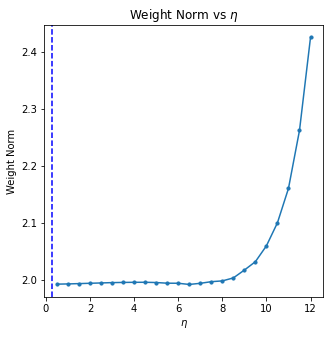

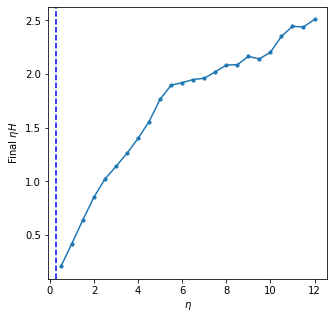

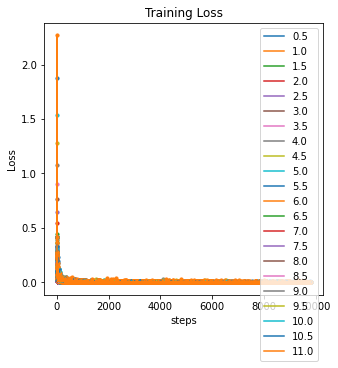

/usr/local/lib/python3.8/dist-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


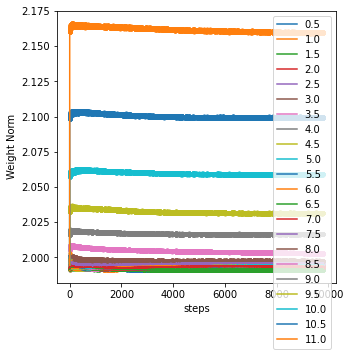

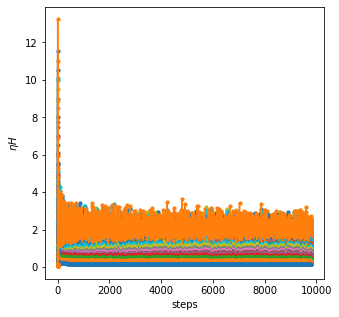

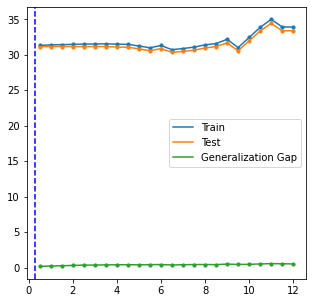

In [ ]:
train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=123)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:-2],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

In [ ]:
check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

lr_ratio: 0.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 5.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/

{('train', 0.5): array([0.61459665]),
 ('test', 0.5): array([0.61078755]),
 ('train', 1.0): array([0.63035547]),
 ('test', 1.0): array([0.62712754]),
 ('train', 1.5): array([0.64008123]),
 ('test', 1.5): array([0.63708499]),
 ('train', 2.0): array([0.64910376]),
 ('test', 2.0): array([0.6461705]),
 ('train', 2.5): array([0.66642279]),
 ('test', 2.5): array([0.66378351]),
 ('train', 3.0): array([0.68569495]),
 ('test', 3.0): array([0.68401231]),
 ('train', 3.5): array([0.70478207]),
 ('test', 3.5): array([0.70389234]),
 ('train', 4.0): array([0.72579097]),
 ('test', 4.0): array([0.72387699]),
 ('train', 4.5): array([0.75064918]),
 ('test', 4.5): array([0.74855263]),
 ('train', 5.0): array([0.77350303]),
 ('test', 5.0): array([0.77075198]),
 ('train', 5.5): array([0.78623819]),
 ('test', 5.5): array([0.78451106]),
 ('train', 6.0): array([0.79880823]),
 ('test', 6.0): array([0.79739819]),
 ('train', 6.5): array([0.82331624]),
 ('test', 6.5): array([0.82022535]),
 ('train', 7.0): array([0.

0


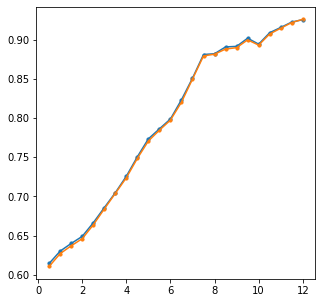

In [ ]:
plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            title=None,
            xlabel=None,
            ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

## MLP One Hidden Layer: MNIST 01

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=512
model_dict['activation']='relu'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='MNIST01'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=1000
log_type='batch'
stop_criterion=10**-8

model=MLP_General(**model_dict)
#model(data['MNIST01','train'][0][0])

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           seed=123,
           method='explicit')

computing averaged top eigenvalues and eigenvectors
[    0/12665]
[ 6400/12665]
lr_ratio is 0.5
seed is 123
initial max eigen 0.052560
epoch: 1, batch/total: 0/98, loss: 0.41361933946609497, NTK: 0.512785149735129
epoch: 1, batch/total: 50/98, loss: 0.02901359833776951, NTK: 0.5762519343222424
epoch: 2, batch/total: 0/98, loss: 0.04307930916547775, NTK: 0.48497524301423767
epoch: 2, batch/total: 50/98, loss: 0.023216426372528076, NTK: 0.5184717541287808
epoch: 3, batch/total: 0/98, loss: 0.025747811421751976, NTK: 0.6557843756872855
epoch: 3, batch/total: 50/98, loss: 0.024117644876241684, NTK: 0.5302707920016994
epoch: 4, batch/total: 0/98, loss: 0.024949397891759872, NTK: 0.5486443460309263
epoch: 4, batch/total: 50/98, loss: 0.01614285074174404, NTK: 0.4998216380003412
epoch: 5, batch/total: 0/98, loss: 0.014473783783614635, NTK: 0.5669796973509079
epoch: 5, batch/total: 50/98, loss: 0.019977957010269165, NTK: 0.6145357977459267
epoch: 6, batch/total: 0/98, loss: 0.01716305688023567

KeyboardInterrupt: ignored

In [ ]:
result_dict_MLP['lr_ratio',11.]['lrNTK'][-20:]

[1.5741791689995543,
 1.2574166107511544,
 1.3549591390768727,
 1.416254267121719,
 1.3561690977671497,
 1.6253989087116705,
 1.3805437161362306,
 1.3837364751209849,
 1.390930255679131,
 1.2541817893473803,
 1.4344879936950647,
 1.6170406632901344,
 1.4131382167063877,
 1.2803384153054074,
 1.410641258684682,
 1.2144841638011223,
 1.3739435691391453,
 1.3313773973063145,
 1.4759304347966091,
 1.4839899263525282]

lr ratio is 0.5
loss: (0.002487629597901451, 0.0025532860000646424)
lr ratio is 1.0
loss: (0.0017871933495438338, 0.0019420105232978262)
lr ratio is 1.5
loss: (0.00147650530815501, 0.0016709163115661476)
lr ratio is 2.0
loss: (0.0012721074131040577, 0.0014878823120261478)
lr ratio is 2.5
loss: (0.0010804912387924707, 0.0012841386997953373)
lr ratio is 3.0
loss: (0.0009462879902282064, 0.0011766386370286874)
lr ratio is 3.5
loss: (0.0008504387139803423, 0.0011024981243954201)
lr ratio is 4.0
loss: (0.0007086966567673893, 0.0009828922596383603)
lr ratio is 4.5
loss: (0.0006364625101733292, 0.0009600926798286167)
lr ratio is 5.0
loss: (0.000624860777856802, 0.0008913641562134942)
lr ratio is 5.5
loss: (0.0006066401391644935, 0.0008706440598688508)
lr ratio is 6.0
loss: (0.0006104523891805896, 0.0008798176515186931)
lr ratio is 6.5
loss: (0.000582425734576057, 0.0008422641889423343)
lr ratio is 7.0
loss: (0.0005398610623702671, 0.0007973703086798918)
lr ratio is 7.5
loss: (0.00054639582101

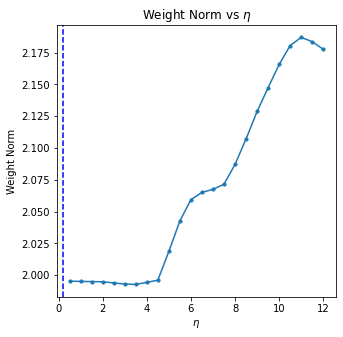

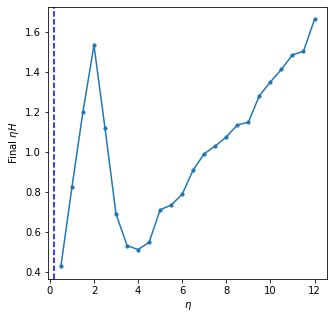

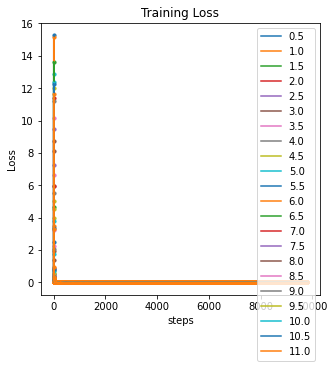

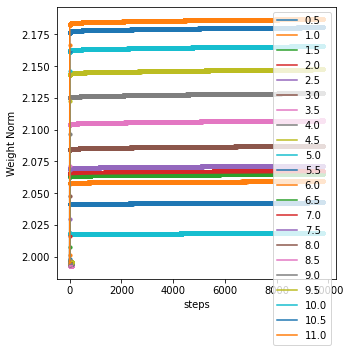

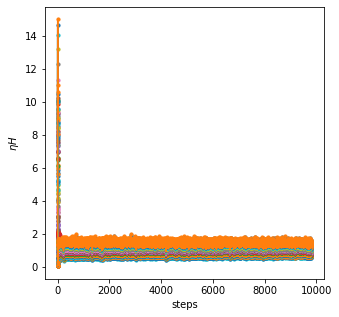

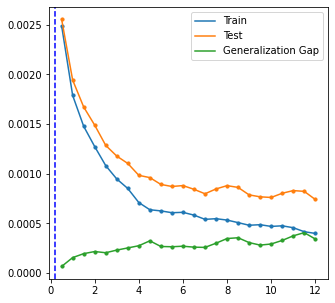

In [ ]:
train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=123)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:-2],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

In [ ]:
check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

lr_ratio: 0.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 5.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/

{('train', 0.5): array([0.53756652]),
 ('test', 0.5): array([0.53829002]),
 ('train', 1.0): array([0.54386186]),
 ('test', 1.0): array([0.54448509]),
 ('train', 1.5): array([0.54892404]),
 ('test', 1.5): array([0.54958153]),
 ('train', 2.0): array([0.56053847]),
 ('test', 2.0): array([0.56136131]),
 ('train', 2.5): array([0.61679513]),
 ('test', 2.5): array([0.61763191]),
 ('train', 3.0): array([0.70581117]),
 ('test', 3.0): array([0.70697212]),
 ('train', 3.5): array([0.80399182]),
 ('test', 3.5): array([0.80438614]),
 ('train', 4.0): array([0.82216566]),
 ('test', 4.0): array([0.82190895]),
 ('train', 4.5): array([0.85457378]),
 ('test', 4.5): array([0.85445213]),
 ('train', 5.0): array([0.88752279]),
 ('test', 5.0): array([0.88830757]),
 ('train', 5.5): array([0.91082234]),
 ('test', 5.5): array([0.91114426]),
 ('train', 6.0): array([0.9329507]),
 ('test', 6.0): array([0.93313599]),
 ('train', 6.5): array([0.9443322]),
 ('test', 6.5): array([0.94446945]),
 ('train', 7.0): array([0.9

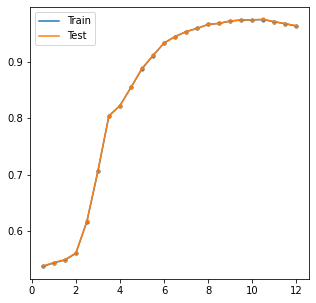

In [ ]:
plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            title=None,
            xlabel=None,
            ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

computing averaged top eigenvalues and eigenvectors
[    0/12665]
[ 6400/12665]
lr_ratio is 0.5
initial max eigen 0.092551
epoch: 1, batch/total: 0/98, loss: 0.15437912940979004, NTK: 0.4634355215317322
epoch: 1, batch/total: 50/98, loss: 0.032322388142347336, NTK: 0.43419501586497844
lr_ratio is 1.0
initial max eigen 0.092551
epoch: 1, batch/total: 0/98, loss: 0.15437912940979004, NTK: 0.927525204244239
epoch: 1, batch/total: 50/98, loss: 0.025626659393310547, NTK: 0.8404246010007234
lr_ratio is 1.5
initial max eigen 0.092551
epoch: 1, batch/total: 0/98, loss: 0.15437912940979004, NTK: 1.3939996852362517
epoch: 1, batch/total: 50/98, loss: 0.021996743977069855, NTK: 1.2286312244833064
lr_ratio is 2.0
initial max eigen 0.092551
epoch: 1, batch/total: 0/98, loss: 0.15437912940979004, NTK: 1.8553873908540603
epoch: 1, batch/total: 50/98, loss: 0.019490258768200874, NTK: 1.4653841586892304
lr_ratio is 2.5
initial max eigen 0.092551
epoch: 1, batch/total: 0/98, loss: 0.15437912940979004, N

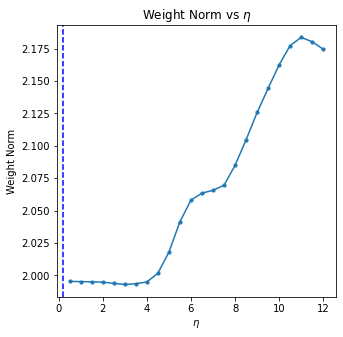

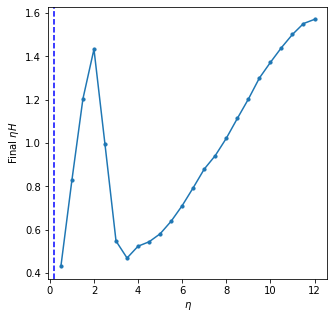

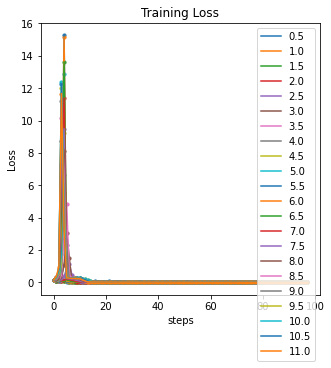

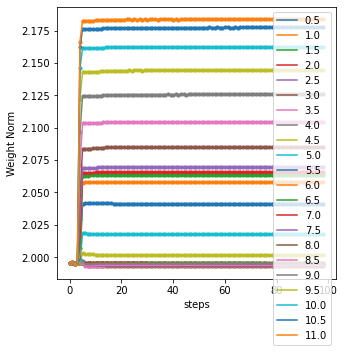

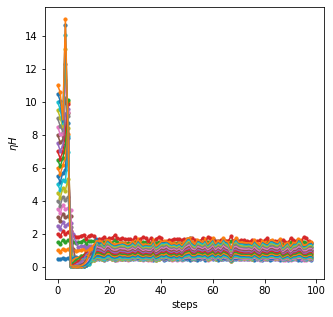

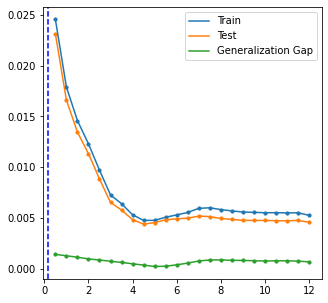

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=256
model_dict['activation']='ReLU'
model_dict['num_layers']=1
model_dict['bias_value']=False

dataset_name='MNIST01'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=1
log_type='batch'
stop_criterion=10**-8

model=MLP_General(**model_dict)
#model(data['MNIST01','train'][0][0])

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')


train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=123)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:-2],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)


lr_ratio: 0.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 5.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/

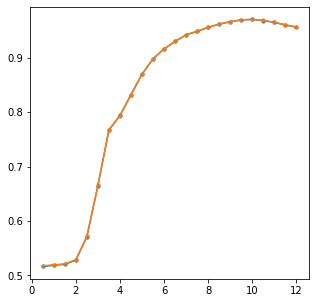

In [ ]:
check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            title=None,
            xlabel=None,
            ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

## MLP Two Hidden Layers: MNIST01

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=512
model_dict['activation']='relu'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='MNIST01'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=1000
log_type='batch'
stop_criterion=10**-8

model=MLP_General(**model_dict)
#model(data['MNIST01','train'][0][0])

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           seed=123,
           method='explicit')

lr ratio is 0.5
loss: (0.0020438051581429814, 0.0023218240580096593)
lr ratio is 1.0
loss: (0.0013772787522573129, 0.0017568340256422688)
lr ratio is 1.5
loss: (0.0010792809421254672, 0.0015012503233925389)
lr ratio is 2.0
loss: (0.0008988066054689428, 0.0013524470318011922)
lr ratio is 2.5
loss: (0.00077385674622329, 0.00121759184708832)
lr ratio is 3.0
loss: (0.0006669688686004892, 0.001095511050934487)
lr ratio is 3.5
loss: (0.0005919069063508176, 0.0010185994718655345)
lr ratio is 4.0
loss: (0.0005361068686429945, 0.00096528806303128)
lr ratio is 4.5
loss: (0.0004709006202959798, 0.0008900161612400208)
lr ratio is 5.0
loss: (0.0004485327596020614, 0.0008686014382833566)
lr ratio is 5.5
loss: (0.00043161289050933923, 0.0008904036055219933)
lr ratio is 6.0
loss: (0.00041896366009446786, 0.0008475614777693511)
lr ratio is 6.5
loss: (0.00038109495853464733, 0.0008164405822753905)
lr ratio is 7.0
loss: (0.00032929011215770195, 0.0007727032857583769)
lr ratio is 7.5
loss: (nan, nan)
lr r

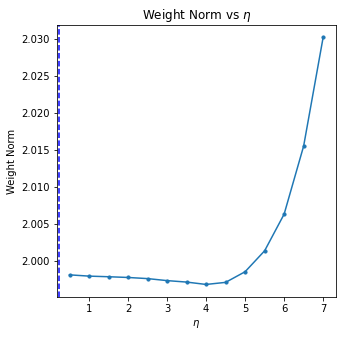

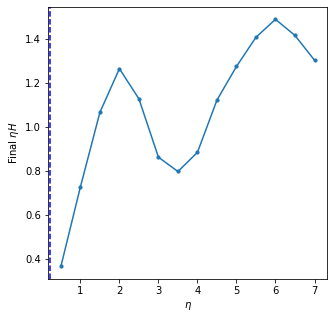

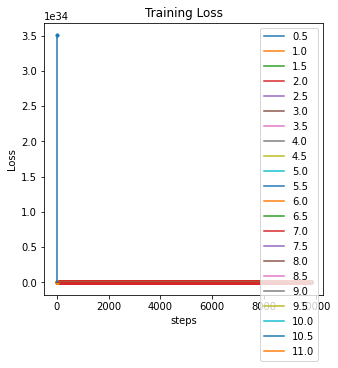

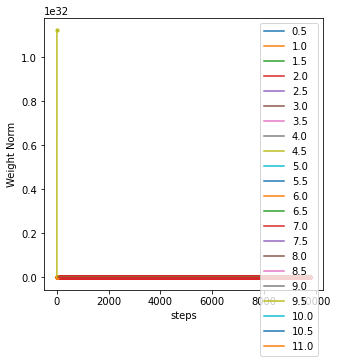

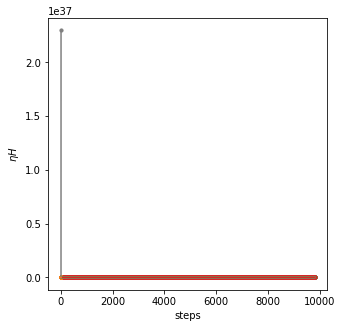

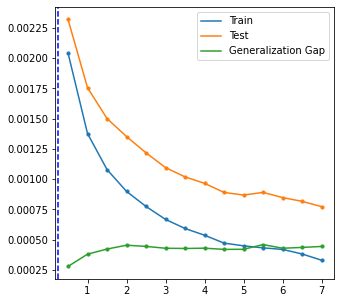

In [ ]:
train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=True,
                seed=123)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:-2],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

computing averaged top eigenvalues and eigenvectors
[    0/12665]
[ 6400/12665]
lr_ratio is 0.5
training already done
lr_ratio is 1.0
training already done
lr_ratio is 1.5
training already done
lr_ratio is 2.0
training already done
lr_ratio is 2.5
training already done
lr_ratio is 3.0
training already done
lr_ratio is 3.5
training already done
lr_ratio is 4.0
training already done
lr_ratio is 4.5
training already done
lr_ratio is 5.0
training already done
lr_ratio is 5.5
training already done
lr_ratio is 6.0
training already done
lr_ratio is 6.5
training already done
lr_ratio is 7.0
training already done
lr_ratio is 7.5
training already done
lr_ratio is 8.0
training already done
lr_ratio is 8.5
training already done
lr_ratio is 9.0
training already done
lr_ratio is 9.5
training already done
lr_ratio is 10.0
training already done
lr_ratio is 10.5
training already done
lr_ratio is 11.0
training already done
lr_ratio is 11.5
training already done
lr_ratio is 12.0
training already done
lr 

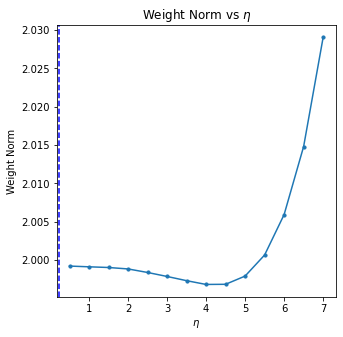

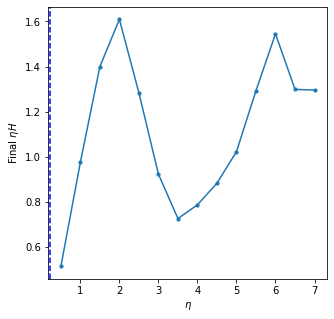

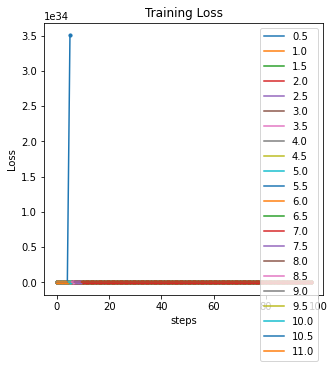

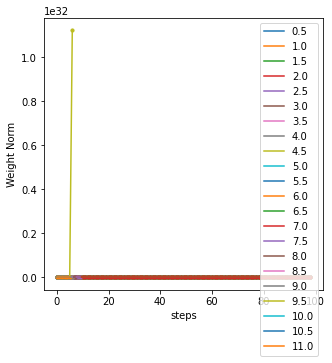

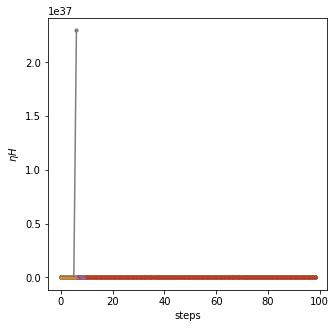

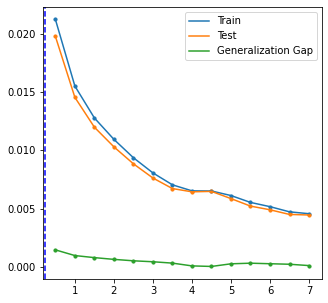

lr_ratio: 0.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 1.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 2.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 3.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 4.5
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/98
batch/total 0/16
lr_ratio: 5.0
batch/total 0/98
batch/total 25/98
batch/total 50/98
batch/total 75/

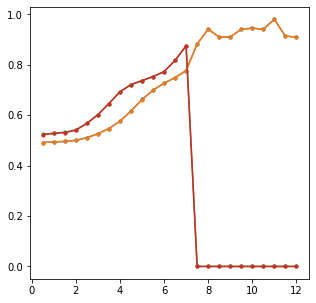

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=256
model_dict['activation']='ReLU'
model_dict['num_layers']=2
model_dict['bias_value']=False

dataset_name='MNIST01'
train_batch_size=128

lr_ratios=np.arange(0.5,12+.5,.5)
max_epochs=1
log_type='batch'
stop_criterion=10**-8

model=MLP_General(**model_dict)
#model(data['MNIST01','train'][0][0])

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=False,
           seed=123,
           method='explicit')


train_test_loss(arch,
                model_dict,
                lr_ratios,
                dataset_name,
                train_batch_size,
                max_epochs=max_epochs,
                stop_criterion=stop_criterion,
                print_every=1,
                overwrite=False,
                seed=123)


plot_final_results(arch,
                   model_dict,
                   lr_ratios,
                   dataset_name,
                   train_batch_size,
                   max_epochs=max_epochs,
                   stop_criterion=stop_criterion,
                   size=(5,5),
                   s=10,
                   write_file=False)

plot_results_vs_step(
    arch=arch,
    model_dict=model_dict,
    lr_ratios=lr_ratios[:-2],
    dataset_name=dataset_name,
    train_batch_size=train_batch_size,
    max_epochs=max_epochs,
    stop_criterion=stop_criterion,
    x_range=10**10,
    write_file=True)

plot_generalization_loss(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            #title=None,
            #xlabel=None,
            #ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)


check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            title=None,
            xlabel=None,
            ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

In [ ]:
arch='MLP_General'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=1024
model_dict['activation']='ReLU'
model_dict['num_layers']=3
model_dict['bias_value']=True

dataset_name='MNIST01'
train_batch_size=256

lr_ratios=np.arange(.5,12.+.5,.5)
max_epochs=200
log_type='batch'
stop_criterion=.2

model=MLP_General(**model_dict)
#model(data['MNIST01','train'][0][0])

result_dict_MLP = full_training_loop(arch,model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           method='explicit')

lr_ratios=np.arange(.5,12.+.5,.5)




In [ ]:
result_spars=check_sparsity_avg(arch,model_dict,lr_ratios,
                   dataset_name,batch_size=train_batch_size,
                   max_epochs=200,stop_criterion=.2,
                   partition='train',device=device)

In [ ]:
plt.plot(list(result_spars.values()))

In [ ]:
plt.plot(list(result_spars.keys()),list(result_spars.values()))

In [ ]:
plt.plot(list(result_spars.keys()),list(result_spars.values()))

In [ ]:
arch='MLP_Leaky'
model_dict={}
model_dict['input_size']=28**2
model_dict['width']=512
model_dict['neg_slope']=.01
model_dict['num_hidden_layers']=1

dataset_name='MNIST01'
train_batch_size=100

lr_ratios=np.arange(.5,13,.5)
max_epochs=1
log_type='batch'
stop_criterion=10**-8

result_dict_MLP = full_training_loop(arch,model_dict,lr_ratios,dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=False,
           overwrite=False,
           method='explicit')


In [ ]:
check_sparsity_avg(arch,model_dict,      
                       lr_ratios,
                       dataset_name,
                       train_batch_size,
                       max_epochs=max_epochs,
                       stop_criterion=stop_criterion,
                       #partition='train',
                       device=device,
                       write_file=True,
                       overwrite=False,
                       printevery=25,
                       verbose=True)

0


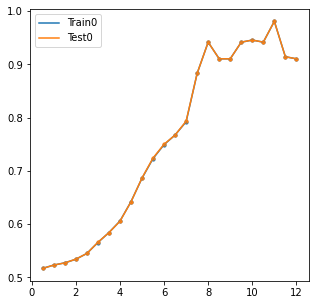

In [ ]:
plot_sparsity(arch,
            model_dict,
            lr_ratios,
            dataset_name,
            train_batch_size,
            max_epochs=max_epochs,
            stop_criterion=stop_criterion,
            title=None,
            xlabel=None,
            ylabel=None,
            size=(5,5),
            s=10,
            write_file=True)

## Toy Example

In [ ]:
X=torch.randn((12665,2))
y=torch.randn((12665,1))
data['random','train']=CustomDataset(list(zip(X,y)))

num_samps=X.shape[0]
train_batch_size=100


arch='MLP_General'
model_dict={}
model_dict['input_size']=2
model_dict['width']=1024
model_dict['activation']='ReLU'
model_dict['num_layers']=1
model_dict['bias_value']=True

dataset_name='random'

lr_ratios=np.arange(8.5,9,.5)
max_epochs=3
log_type='batch'
stop_criterion=1

result_dict_MLP_toy = full_training_loop(arch,
           model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           method='explicit')


NameError: ignored

In [ ]:
#plt.plot(result_dict_MLP_toy['lr_ratio',10.5]['weight_norm'])

lr_ratios=np.arange(0.5,12.0,.5)

result_spars_toy=check_sparsity_avg(arch,
                                    model_dict,
                                    lr_ratios,
                   dataset_name,
                   batch_size=100,
                   max_epochs=3,
                   stop_criterion=1,
                   partition='train',
                   device=device)

In [ ]:
result_spars_toy

In [ ]:
X=torch.randn((12665,2))
y=torch.randn((12665,1))
data['random','train']=CustomDataset(list(zip(X,y)))

num_samps=X.shape[0]
train_batch_size=100


arch='MLP_General'
model_dict={}
model_dict['input_size']=2
model_dict['width']=1024
model_dict['activation']='ReLU'
model_dict['num_layers']=1
model_dict['bias_value']=True

dataset_name='random'

lr_ratios=np.arange(8.5,9,.5)
max_epochs=3
log_type='batch'
stop_criterion=1

result_dict_MLP_toy = full_training_loop(arch,
           model_dict,
           lr_ratios,
           dataset_name,
           train_batch_size,
           max_epochs=max_epochs,
           log_type=log_type,
           stop_criterion=stop_criterion
           ,printevery=50,
           verbose=True,
           write_file=True,
           overwrite=True,
           method='explicit')


In [ ]:
#plt.plot(result_dict_MLP_toy['lr_ratio',10.5]['weight_norm'])

lr_ratios=np.arange(0.5,12.0,.5)

result_spars_toy=check_sparsity_avg(arch,
                                    model_dict,
                                    lr_ratios,
                   dataset_name,
                   batch_size=100,
                   max_epochs=3,
                   stop_criterion=1,
                   partition='train',
                   device=device)

# Scratch

### Quadratic Model V2

In [ ]:
num_samps=8
model_dict['input_dim']=2
model_dict['hidden_dim']=1000

In [ ]:
input_dim=2
hidden_dim=100
num_samps=3
neg_slope=1

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(1,2)

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(.9,1.1)

#orth=generate_orth_matrix(input_dim,hidden_dim,
#                     matrix_dist,
#                     eval_dist)
#
#mfeature=meta_feature_exp(input_dim,
#                   hidden_dim,
#                   matrix_dist,
#                   eval_dist)
#X=torch.randn((num_samps,input_dim))
#test=mfeature(torch.randn((num_samps,input_dim)))

model_dict={}
model_dict['meta_type']='linear'
model_dict['input_dim']=input_dim
model_dict['hidden_dim']=hidden_dim
model_dict['matrix_dist']=matrix_dist
model_dict['eval_dist']=eval_dist
#model_dict['neg_slope']=neg_slope

X=torch.randn((num_samps,input_dim ))

model=quadratic(**model_dict)

_,zeta,theta=model.get_parameters()
meta_feature_func=model.get_metafeature()
meta_feature_matrix=meta_feature_func(X)

H=compute_NTK(model,X,
            method='quadratic_model')

e_sys = torch.linalg.eigh(H)

top_evec = e_sys[1][:,-1]

psi_eff = torch.einsum('a,amn->mn',top_evec,meta_feature_matrix)


print(e_sys[0][-1])

#print(torch.linalg.eigh(psi_eff@psi_eff.T)[0][0])
print(torch.linalg.eigh(psi_eff@psi_eff.T)[0][-1])


RuntimeError: ignored

In [ ]:
#torch.manual_seed(12)

input_dim=3
hidden_dim=1000
num_samps=3
neg_slope=1

X=torch.randn(num_samps,input_dim)

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(1,2)

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)

model_dict={}
model_dict['meta_type']='linear'
model_dict['input_dim']=input_dim
model_dict['hidden_dim']=hidden_dim
model_dict['matrix_dist']=matrix_dist
model_dict['eval_dist']=eval_dist

model=quadratic(**model_dict)
meta_feature=model.get_metafeature()
meta_feature_matrix= meta_feature(X)

H=compute_NTK(model,
              X,
              method='quadratic_model')

e_sys = torch.linalg.eigh(H)

top_evec = e_sys[1][:,-1]

psi_eff = torch.einsum('a,amn->mn',top_evec,meta_feature_matrix)


print(e_sys[0][0])
print(e_sys[0][-1])

print(torch.linalg.eigh(psi_eff@psi_eff.T)[0][0])
print(torch.linalg.eigh(psi_eff@psi_eff.T)[0][-1])

tensor(0.0216322355)
tensor(0.9728552103)
tensor(0.1421402693)
tensor(0.3774281740)


In [ ]:
input_dim=20
hidden_dim=300
num_samps=20
neg_slope=1

X=torch.randn(num_samps,input_dim)

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(1,2)

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)

model_dict={}
model_dict['meta_type']='exp'
model_dict['input_dim']=input_dim
model_dict['hidden_dim']=hidden_dim
model_dict['matrix_dist']=matrix_dist
model_dict['eval_dist']=eval_dist

model=quadratic(**model_dict)
meta_feature=model.get_metafeature()
meta_feature_matrix= meta_feature(X)

H=compute_NTK(model,
              X,
              method='quadratic_model')

e_sys = torch.linalg.eigh(H)

top_evec = e_sys[1][:,-1]

psi_eff = torch.einsum('a,amn->mn',top_evec,meta_feature_matrix)


print(e_sys[0][0])
print(e_sys[0][-1])

print(torch.linalg.eigh(psi_eff@psi_eff.T)[0][0])
print(torch.linalg.eigh(psi_eff@psi_eff.T)[0][-1])

tensor(0.0572403148)
tensor(0.1502644718)
tensor(4.9128885848e-07)
tensor(3.4856696129)


In [ ]:
dtype(torch.linalg.eigh(psi_eff@psi_eff.T)[0][0])

In [ ]:
model_dict={}
num_samps=6
model_dict['input_dim']=1
model_dict['hidden_dim']=10

X=torch.randn((num_samps,model_dict['input_dim']))
y=torch.randn((num_samps,1))


eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='uniform'
matrix_dist['params']=(1,2)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'
#model_dict['neg_slope']=1

dataset_name='random'
#arch='quadratic'

quadratic(**model_dict)


quadratic(
  (meta_feature): meta_feature_leaky(
    (flatten): Flatten(start_dim=1, end_dim=-1)
  )
)

In [ ]:
model=quadratic(**model_dict)

meta_feature=model.get_metafeature()
meta_matrix=meta_feature.get_meta_params()

In [ ]:
test_data=torch.randn(1,1).to(device)
meta_matrix.shape
list((meta_feature(test_data)-test_data[0][0]*meta_matrix).cpu().numpy())

[array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], dtype=float32)]

In [ ]:
model_dict={}
model_dict['input_dim']=2
model_dict['hidden_dim']=10

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)

model_dict['matrix_dist']=matrix_dist

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,1)

model_dict['eval_dist']=eval_dist
model_dict['masked_features']=2

model_dict['meta_type']='linear'

model=quadratic(**model_dict)
_,_,og_student_weight,og_teacher_weight=model.get_parameters()

og_student_weight=og_student_weight.detach().numpy()
og_teacher_weight=og_teacher_weight.detach().numpy()

print(og_student_weight[0])
print(og_teacher_weight[0])

optimizer = torch.optim.SGD(model.parameters(), lr=1)

X=torch.randn(40,2)
y=torch.randn(40)

#for a in model.named_parameters():
#    print(a)

pred=model(X,teacher=True)
loss_fn = nn.MSELoss()
loss=1/2.*loss_fn(pred.squeeze(),y.float())

optimizer.zero_grad()
loss.backward()
optimizer.step()

#pred=model(X)
#loss_fn = nn.MSELoss()
#loss=1/2.*loss_fn(pred.squeeze(),y.float())
#
#optimizer.zero_grad()
#loss.backward()
#optimizer.step()


#for a in model.named_parameters():
#    print(a)

_,_,new_student_weight,new_teacher_weight=model.get_parameters()

new_student_weight=new_student_weight.detach()
new_teacher_weight=new_teacher_weight.detach()

print(new_student_weight[0])
print(new_teacher_weight[0])


1.0606643
-1.2499511
tensor(1.0606642962)
tensor(-1.0871663094)


In [ ]:
og_student_weight-new_student_weight

tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.])

In [ ]:
model_dict={}
num_samps=1
model_dict['input_dim']=1
model_dict['hidden_dim']=2

X=torch.randn((num_samps,model_dict['input_dim']))
train_batch_size=1

eval_dist={}
eval_dist['dist']='uniform'
eval_dist['params']=(1,3/2)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

data['random_teacher','train']=X

model_dict['meta_type']='linear'
model_dict['masked_features']=1
dataset_name='random_teacher'

arch='quadratic'

lr_ratios=np.arange(.5,4+.5,.5)
max_epochs=10
log_type='batch'
stop_criterion=.0000001

quadratic(
  (meta_feature): meta_feature_linear(
    (flatten): Flatten(start_dim=1, end_dim=-1)
  )
)

In [ ]:
torch.manual_seed(123)
model=quadratic(**model_dict)
model.to(device)
for e in model.parameters():
    print(e)
y=torch.randn((X.shape[0])).to(device)

loss_fn=nn.MSELoss()
pred=model(X.to(device),teacher=False)
fake_pred=model(X.to(device),teacher=True)

optimizer=torch.optim.SGD(model.parameters(),lr=.1)
optimizer.zero_grad()

loss=loss_fn(pred,fake_pred)
loss.backward()

optimizer.step()


for e in model.parameters():
    print(e)

Parameter containing:
tensor([ 0.4422253370, -1.0854426622], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([-0.6219102144, -0.3076108396], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.1523559242, -0.1681367904], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([-0.6219102144, -0.5018609762], device='cuda:0', requires_grad=True)


In [ ]:
torch.manual_seed(123)
model=quadratic(**model_dict)
model.to(device)
for e in model.parameters():
    print(e)
y=torch.randn((X.shape[0])).to(device)

loss_fn=nn.MSELoss()
pred=model(X.to(device),teacher=False)
with torch.no_grad():
    fake_pred=model(X.to(device),teacher=True)

optimizer=torch.optim.SGD(model.parameters(),lr=.1)
optimizer.zero_grad()

loss=loss_fn(pred,fake_pred)
loss.backward()

optimizer.step()


for e in model.parameters():
    print(e)

Parameter containing:
tensor([ 0.4422253370, -1.0854426622], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([-0.6219102144, -0.3076108396], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.4422253370, -1.0854426622], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([-0.1169944927, -0.3076108396], device='cuda:0', requires_grad=True)


In [ ]:
model_dict={}
num_samps=1
model_dict['input_dim']=1
model_dict['hidden_dim']=100


X_train=torch.randn((num_samps,model_dict['input_dim']))
y_train=torch.randn((num_samps,1))
data['random','train']=CustomDataset(list(zip(X_train,y_train)))

X_test=torch.randn((num_samps,model_dict['input_dim']))
y_test=torch.randn((num_samps,1))
data['random','test']=CustomDataset(list(zip(X_test,y_test)))

train_batch_size=1

eval_dist={}
eval_dist['dist']='normal'
eval_dist['params']=(1,.1)
model_dict['eval_dist']=eval_dist

matrix_dist={}
matrix_dist['dist']='normal'
matrix_dist['params']=(0,1)
model_dict['matrix_dist']=matrix_dist

model_dict['meta_type']='linear'

In [ ]:
model=quadratic(**model_dict)

In [ ]:
model.get_buffer('meta_feature')

AttributeError: ignored

In [ ]:
idx_MNIST_train_01 = (data['MNIST','train'].targets==0)
idx_MNIST_train_01 += (data['MNIST','train'].targets==1)

idx_MNIST_train_01 = idx_MNIST_train_01.nonzero(as_tuple=True)[0]

data['MNIST01','train'] = Subset(data['MNIST','train'],idx_MNIST_train_01)
data['MNIST01_small','train'] = Subset(data['MNIST','train'],idx_MNIST_train_01[:64])


idx_MNIST_test_01 = (data['MNIST','test'].targets==0)
idx_MNIST_test_01 += data['MNIST','test'].targets==1

idx_MNIST_test_01 = idx_MNIST_test_01.nonzero(as_tuple=True)[0]

data['MNIST01','test'] = Subset(data['MNIST','test'],idx_MNIST_test_01)
data['MNIST01_small','test'] = Subset(data['MNIST','test'],idx_MNIST_test_01)

idx_FMNIST_train_01 = (data['FMNIST','train'].targets==0)
idx_FMNIST_train_01 += (data['FMNIST','train'].targets==1)

idx_FMNIST_train_01 = idx_FMNIST_train_01.nonzero(as_tuple=True)[0]

data['FMNIST01','train']  = Subset(data['FMNIST','train'],idx_FMNIST_train_01)


idx_FMNIST_test_01 = (data['FMNIST','test'].targets==0)
idx_FMNIST_test_01 += (data['FMNIST','test'].targets==1)
idx_FMNIST_test_01 = idx_FMNIST_test_01.nonzero(as_tuple=True)[0]

data['FMNIST01','test']  = Subset(data['FMNIST','test'],idx_FMNIST_test_01)

idx_CIFAR10_train_01 = (torch.tensor(data['CIFAR10','train'].targets)==0)
idx_CIFAR10_train_01 += (torch.tensor(data['CIFAR10','train'].targets)==1)

idx_CIFAR10_train_01 = idx_CIFAR10_train_01.nonzero(as_tuple=True)[0]

data['CIFAR10_01','train'] = Subset(data['CIFAR10','train'],idx_CIFAR10_train_01)

idx_CIFAR10_test_01 = (torch.tensor(data['CIFAR10','test'].targets)==0)
idx_CIFAR10_test_01 += (torch.tensor(data['CIFAR10','test'].targets)==1)

idx_CIFAR10_test_01 = idx_CIFAR10_test_01.nonzero(as_tuple=True)[0]

data['CIFAR10_01','test'] = Subset(data['CIFAR10','test'],idx_CIFAR10_test_01)

### MLP (Old)

In [ ]:
class MLP_Leaky(nn.Module):
    def __init__(self,neg_slope=0.01,input_size=28*28, output_size=1, 
                 num_hidden_layers=3, 
                 width=512,bias_value=True):
        
        super(MLP_Leaky, self).__init__()
        self.flatten = nn.Flatten()
        self.input_size = input_size
        self.num_hidden_layers = num_hidden_layers
        self.width = width
        self.neg_slope=neg_slope
      
        self.fc1 = nn.Sequential(
            nn.Linear(input_size,width,bias=bias_value),
            nn.LeakyReLU(self.neg_slope))
    
        layers = []
        for _ in range(num_hidden_layers-1):
            layers.append(nn.Linear(width, width,bias=bias_value))
            layers.append(nn.LeakyReLU(self.neg_slope))
    
        self.fc_int = nn.Sequential(*layers)

        self.fc_final = nn.Linear(width, output_size,bias=bias_value)
          
        self.apply(self.init_weights)

    def init_weights(self,m):
        if isinstance(m, nn.Linear):
            m.weight.data.normal_(mean=0.0,std=2.0**(.5))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
      
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.fc_int(x)
        logits = self.fc_final(x)
    
        logits = ((self.input_size*(self.width**self.num_hidden_layers))**(-1/2))*logits
        return logits

class MLP_General(nn.Module):
    def __init__(self,activation='ReLU',
                 input_size=28*28,
                 output_size=1,
                 num_layers=3, 
                 width=512,
                 bias_value=True,
                 pool_dict=None,
                 activation_name='relu',
                 negative_slope=1):
        super(MLP_General, self).__init__()
        
        self.flatten = nn.Flatten()
        self.input_size = input_size
        self.num_layers = num_layers
        self.width = width

        if activation=='ReLU':
            self.act=nn.ReLU()
        elif activation=='GeLU':
            self.act=nn.GELU()
        elif activation=='linear':
            self.act=nn.LeakyReLU(1)
        elif activation=='leaky_relu':
            self.act=nn.LeakyReLU(negative_slope)
        elif activation == 'tanh':
            self.act=nn.Tanh()
        else:
            raise Exception('Not a valid activation function. Choose ReLU, GeLU, linear or tanh.')
      
        self.fc1 = nn.Sequential(
            nn.Linear(input_size,width,bias=bias_value),
            self.act)
    
        layers = []
        for _ in range(num_layers-1):
            layers.append(nn.Linear(width, width,bias=bias_value))
            layers.append(self.act)
    
        self.fc_int = nn.Sequential(*layers)

        self.fc_final = nn.Linear(width, output_size,bias=bias_value)
          
        self.apply(self.init_weights)

        if pool_dict is not None:
            self.kernel_size=pool_dict['kernel_size']
            self.stride=pool_dict['stride']
            self.pool=nn.MaxPool2d(self.kernel_size,self.stride)
        self.pool_dict=pool_dict
    def init_weights(self,m):
        if isinstance(m, nn.Linear):
            m.weight.data.normal_(mean=0.0,std=1.0**(.5))
            if m.bias is not None:
                m.bias.data.zero_()

    def forward(self, x):
        if self.pool_dict is not None:
            input=self.pool(x)
      
        x = self.flatten(x)
        x = self.fc1(x)
        x = self.fc_int(x)
        logits = self.fc_final(x)

        logits *= (self.input_size)**(-.5)
        logits *= ((self.width)**self.num_layers)**(-.5)

        return logits


archs['MLP_Leaky']=MLP_Leaky
archs['MLP_General']=MLP_General

In [ ]:
def check_sparsity(out):
    indicator = torch.where(out<0,1,0)
    result=torch.sum(indicator)/torch.flatten(out).shape[0]
    return result        